In [1]:
import zipfile
import os
with zipfile.ZipFile("nt_toolbox.zip","r") as zip_ref:
    zip_ref.extractall(os.getcwd())
from __future__ import division
from nt_toolbox.nt_toolbox.general import *
from nt_toolbox.nt_toolbox.signal import *
%pylab inline
%matplotlib inline
%load_ext autoreload
%autoreload 2
import cv2
import skimage
import matplotlib.pyplot as plt
from pylab import *
import numpy as np
import operator
import pandas as pd
import time
from logging import exception


with zipfile.ZipFile("ImagesOriginales.zip","r") as zip_ref:
    zip_ref.extractall(os.getcwd())

def generateNoise(img, mode,seed,var,clip = False):
    ###
    # img : input image
    # mode : gaussian , poisson, speckle
    # seed : seed for the random generator
    # clip : True or False (clip the output in the range -1 , 1)
    # var : (variance for Gaussian and speckle mode)
    ###

    if mode == 'gaussian' or mode == 'speckle':
        gimg = skimage.util.random_noise(img, mode=mode,seed=seed,clip=clip,var=var)
        return gimg
    if mode == 'poisson':
      np.random.seed(seed)
      gimg = np.random.poisson(img * 100 + 155)
      gimg = gimg / 255
      return gimg

def TV_norm(gradX):
  ###
  # gradX : input tensor of shape (m,n,2)
  ###
  sum = 0
  (m,n,k) = np.shape(gradX)
  if(k != 2):
    print("The shape of GradX is not what was expected")
    raise exception
  sum = (np.sqrt(gradX[:,:,0]**2 + gradX[:,:,1]**2)).sum().sum()
  return sum

def zeroOneScaling(img):
  ###
  # img : input image
  ###
  if np.max(img) > 1 or np.min(img) < 0:
    img = (img - np.min(img)) / (np.max(img) - np.min(img))
  return img
def cappingZeroOne(img):
  img = np.array(img)
  img = np.clip(img, 0, 1)
  return img

def plotResults(img , y ,xk , cost, err, lmbda, iter):
    lmbda = str(lmbda)

    # plot the ground truth, the final acquisition (blurred and noisy) and the reconstruction
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Ground truth')
    plt.subplot(1, 3, 2)
    plt.imshow(y, cmap='gray')
    plt.title('Acquisition')
    plt.subplot(1, 3, 3)
    plt.imshow(xk, cmap='gray')
    plt.title('Reconstruction for lambda = ' + lmbda)
    plt.show()

    # plot how the cost function decreases and how the iterates converge
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(cost)
    plt.axvline(x=iter, ymax = 0.8, ymin = 0,ls = '--', color = 'red')
    plt.xlabel('$k$')
    plt.ylabel("$F(x_k)$")
    plt.title('Cost function')
    plt.subplot(1, 2, 2)
    plt.plot(err)
    plt.axvline(x=iter, ymax = 0.8, ymin = 0,ls = '--', color = 'red')
    plt.xlabel('$k$')
    plt.ylabel("$|x_k - img|_2$")
    plt.title('L2 norm between GT and xk')
    plt.show()

c:\Users\Claudio\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


c:\Users\Claudio\anaconda3\Lib\site-packages\IPython\core\magics\pylab.py:162: UserWarning: pylab import has clobbered these variables: ['pylab']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


In [76]:
def FISTA(x0, lmbda, maxiter, y, img, early_stopping = True, stopping_threshold = 10e-5):
  """
  Compute the minima of an optimization problem with a convex cost function

  PARAMETERS
  x0: (nd.array) initial sequence of the corrupted image
  lmbda: (nd.array) parameter of the regularization term
  maxiter: max of iteration of the algorithm
  y: corrupted image
  img: ground truth
  early stopping: True if we want a stopping criteria is active
  stopping_threshold: small value for the stopping criteria


  RETURN
  xk: final sequence of the corrupted image (after the denoising)
  lmbda: parameter of the regularization term
  cost: list of the values regarding the cost function
  err: list of L2 norms of xk - img
  SSIMerr: list of SSIM values between xk and img
  """
  x_old = x0
  yk = x0
  t_old = 1
    

  cost = np.zeros(maxiter)
  err = np.zeros(maxiter)
  (n1,n2) = np.shape(y)
  xkSeq = np.zeros(shape = (maxiter,n1,n2))
  epsilon = 0.4*1e-2
  tau = 1.9 / (1 + np.max(lmbda) * 8 / epsilon)
  
  for k in range(0,maxiter):
     repeatN = lambda x,k: resize( repeat( x, k, axis=1), [n1,n2,k])
     Gr = grad(yk) # Dx = (D^h x , D^v x)
     d = sqrt(epsilon**2 + sum(Gr**2, axis=2)) # ||Dx||_2 (with epsilon for smoothness)
     G = -div(Gr / repeatN(d,2) ) # -div (Dx / ||Dx||_2 )
     e = yk -y
     xk = yk - tau*(e + lmbda*G)
     
     xk = cappingZeroOne(xk)
     cost[k] = 0.5 * np.linalg.norm(e,2)**2 + np.sum(lmbda * TV_norm(Gr))
     err[k] = np.linalg.norm(xk - img) #L2 norm
     xkSeq[k] = xk

     if early_stopping is True:
      if np.abs(cost[k] - cost[k-1]) / cost[k] < 10 * stopping_threshold:
        print(f"I got stopped at iteration {k} because of Cost function because of last value {np.abs(cost[k] - cost[k-1]) / cost[k]}")
        print(f"The error is {np.linalg.norm(xk - img)}")
        break
      #if np.linalg.norm(xkSeq[k] - xkSeq[k-1],1) / np.linalg.norm(xkSeq[k],1) < stopping_threshold:
        #print(f"I got stopped at iteration {k} because of Sequence norm of {np.linalg.norm(xkSeq[k] - xkSeq[k-1],1) / np.linalg.norm(xkSeq[k],1)}")
        #break   
     tk = 0.5 + 0.5 * np.sqrt(1 + 4 * t_old**2)
     yk = xk + ((t_old - 1) / (tk)) * (xk - x_old)
     x_old = xk
     t_old = tk
     


  return xk, lmbda, cost, err, xkSeq, k

In [2]:
def AGD(x0, lmbda, maxiter, y, img, early_stopping = True, stopping_threshold = 10e-5):
  """
  Compute the minima of an optimization problem with a convex cost function

  PARAMETERS
  x0: (nd.array) initial sequence of the corrupted image
  lmbda: (nd.array) parameter of the regularization term
  maxiter: max of iteration of the algorithm
  y: corrupted image
  img: ground truth
  early stopping: True if we want a stopping criteria is active
  stopping_threshold: small value for the stopping criteria


  RETURN
  xk: final sequence of the corrupted image (after the denoising)
  lmbda: parameter of the regularization term
  cost: list of the values regarding the cost function
  err: list of L2 norms of xk - img
  SSIMerr: list of SSIM values between xk and img
  """
  xk = x0
  x_old = x0
  cost = np.zeros(maxiter)
  err = np.zeros(maxiter)
  tk = np.zeros(maxiter)
  (n1,n2) = np.shape(y)
  xkSeq = np.zeros(shape = (maxiter,n1,n2))
  epsilon = 0.4*1e-2
  tau = 1.9 / (1 + np.max(lmbda) * 8 / epsilon)
  for k in range(0,maxiter):
     tk[k+1] = 0.5 + 0.5 * np.sqrt(1 + 4 * tk[k]**2)
     yk = xk + (tk[k] - 1) / tk[k+1] * (xk - x_old)

     repeatN = lambda x,k: resize( repeat( x, k, axis=1), [n1,n2,k])
     Gr = grad(yk) # Dx = (D^h x , D^v x)
     d = sqrt(epsilon**2 + sum(Gr**2, axis=2)) # ||Dx||_2 (with epsilon for smoothness)
     G = -div(Gr / repeatN(d,2) ) # -div (Dx / ||Dx||_2 )
     e = yk -y
     x_old = xk
     xk = yk - tau*(e + lmbda*G)
     xk = cappingZeroOne(xk)

     xkSeq[k] = xk
     cost[k] = 0.5 * np.linalg.norm(e,2)**2 + np.sum(lmbda * TV_norm(Gr))
     err[k] = np.linalg.norm(xk - img) #L2 norm

     if early_stopping is True:
      if np.abs(cost[k] - cost[k-1]) / cost[k] < 10 * stopping_threshold:
        print(f"I got stopped at iteration {k} because of Cost function")
        break
      if np.linalg.norm(xkSeq[k] - xkSeq[k-1],1) / np.linalg.norm(xkSeq[k],1) < stopping_threshold:
        print(f"I got stopped at iteration {k} because of Sequence norm")
        break



  return xk, lmbda, cost, err, xkSeq, k

In [107]:
def GradientDescent(x0, lmbda, maxiter, y, img, early_stopping = True, stopping_threshold = 10e-5):
  """
  Compute the minima of an optimization problem with a convex cost function

  PARAMETERS
  x0: (nd.array) initial sequence of the corrupted image
  lmbda: (nd.array) parameter of the regularization term
  maxiter: max of iteration of the algorithm
  y: corrupted image
  img: ground truth
  early stopping: True if we want a stopping criteria is active
  stopping_threshold: small value for the stopping criteria


  RETURN
  xk: final sequence of the corrupted image (after the denoising)
  lmbda: parameter of the regularization term
  cost: list of the values regarding the cost function
  err: list of L2 norms of xk - img
  """
  xk = x0
  cost = np.zeros(maxiter)
  err = np.zeros(maxiter)
  (n1,n2) = np.shape(y)
  xkSeq = np.zeros(shape = (maxiter,n1,n2))
  epsilon = 0.4*1e-2
  tau = 1.9 / (1 + np.max(lmbda) * 8 / epsilon)
  for k in range(0,maxiter):

     repeatN = lambda x,k: resize( repeat( x, k, axis=1), [n1,n2,k])
     Gr = grad(xk) # Dx = (D^h x , D^v x)
     d = sqrt(epsilon**2 + sum(Gr**2, axis=2)) # ||Dx||_2 (with epsilon for smoothness)
     G = -div(Gr / repeatN(d,2) ) # -div (Dx / ||Dx||_2 )
     e = xk -y
     xk = xk - tau*(e + lmbda*G)
     xk = cappingZeroOne(xk)

     xkSeq[k] = xk
     cost[k] = 0.5 * np.linalg.norm(e,2)**2 + np.sum(lmbda * TV_norm(Gr))
     err[k] = np.linalg.norm(xk - img) #L2 norm

     if early_stopping is True:
      if np.abs(cost[k] - cost[k-1]) / cost[k] < 10 * stopping_threshold:
        print(f"I got stopped at iteration {k} because of Cost function because of last value {np.abs(cost[k] - cost[k-1]) / cost[k]}")
        print(f"The error is {np.linalg.norm(xk - img)}")
        break
      #if np.linalg.norm(xkSeq[k] - xkSeq[k-1],1) / np.linalg.norm(xkSeq[k],1) < stopping_threshold:
        #print(f"I got stopped at iteration {k} because of Sequence norm of {np.linalg.norm(xkSeq[k] - xkSeq[k-1],1) / np.linalg.norm(xkSeq[k],1)}")
        #break



  return xk, lmbda, cost, err, xkSeq, k

In [93]:
def runScript(img,y,lmbda, early_stopping, maxiter = 1200, mode = 'gaussian'):

  for lmbdak in lmbda:
    xk = y
    xk, lmbda, cost, err, xkSeq, iter = FISTA(xk, lmbdak, maxiter, y, img, early_stopping, stopping_threshold = 10e-7)
    cost[iter:] = cost[iter]
    err[iter:] = err[iter]
    plotResults(img,y,xk,cost, err, lmbdak, iter)
    return xk

In [94]:
def runScriptGD(img,y,lmbda, early_stopping, maxiter = 1200, mode = 'gaussian'):

  for lmbdak in lmbda:
    xk = y
    xk, lmbda, cost, err, xkSeq, iter = GradientDescent(xk, lmbdak, maxiter, y, img, early_stopping, stopping_threshold = 10e-7)
    cost[iter:] = cost[iter]
    err[iter:] = err[iter]
    plotResults(img,y,xk,cost, err, lmbdak, iter)
    return xk

## With the stopping criteria on sequence norm the FISTA does not converge rapidly

I got stopped at iteration 191 because of Cost function because of last value 1.1188910221650927e-06
The error is 23.787094065254273


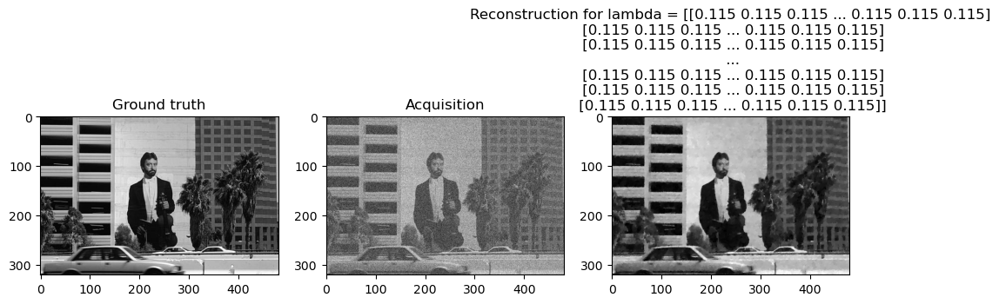

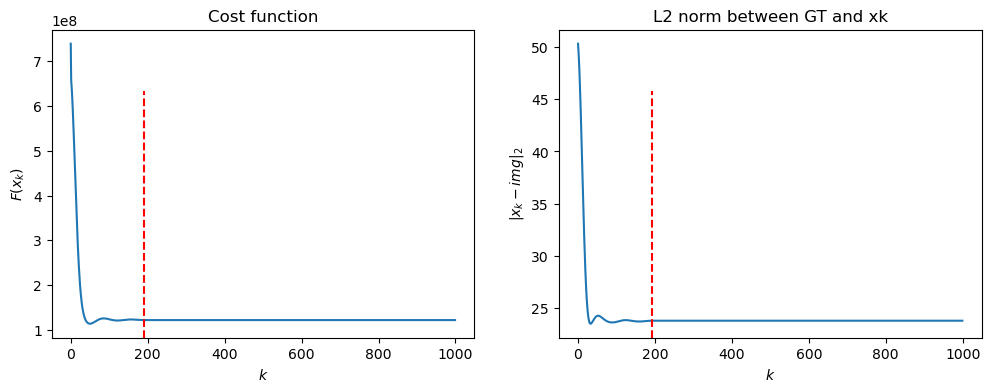

To converge the algorithm AGD required 10.563576221466064 s
I got stopped at iteration 742 because of Cost function because of last value 9.933617252492021e-06
The error is 23.74936137752354


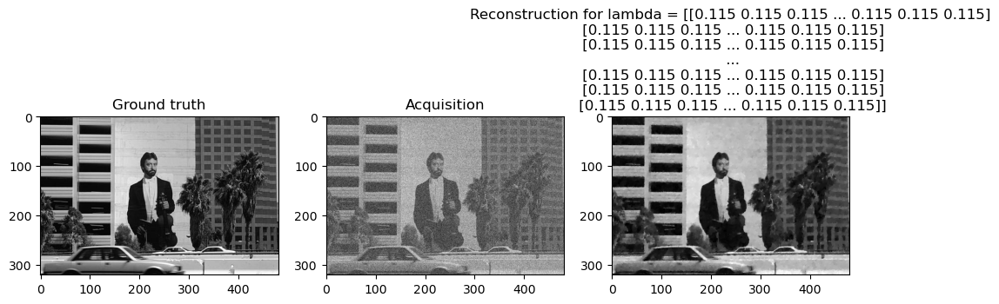

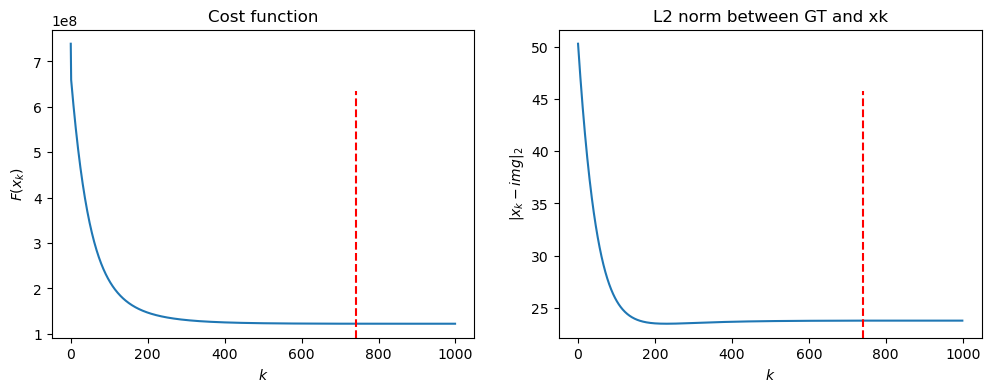

To converge the algorithm GD required 35.94102334976196 s
La metrica dell' Accelereted GD è 0.7137764702536741
La metrica del GD è 0.7144515724982047
La differenza tra le sequenze è: 0.22149087616785476


In [109]:
j = 0
filename = "ImagesOriginales/%s.jpg" %j
img = np.array(plt.imread(filename)/255, dtype="float64")
y = generateNoise(img,'gaussian',seed = 43, var = 0.02)
(m,n) = np.shape(img)
temp = np.full(shape = (m,n), fill_value = 0.115)


start = time.time()
xk = runScript(img=img,y=y,lmbda = [temp],early_stopping=True, maxiter=1000)
metricsAGD = skimage.metrics.structural_similarity(xk,img, data_range = 1)
end = time.time()
print(f"To converge the algorithm AGD required {end - start} s")

start = time.time()
xkGD = runScriptGD(img=img,y=y,lmbda = [temp],early_stopping=True, maxiter=1000)
metricsGD = skimage.metrics.structural_similarity(xkGD,img, data_range = 1)
end = time.time()
print(f"To converge the algorithm GD required {end - start} s")

print(f"La metrica dell' Accelereted GD è {metricsAGD}")
print(f"La metrica del GD è {metricsGD}")

print(f"La differenza tra le sequenze è: {np.linalg.norm(xk - xkGD)}")


# ANOTHER LINE OF TESTING
-------------

In [110]:
def runGoldenSection(img,y,lmbdaCentroid, early_stopping, alpha, maxiter = 400, mode = 'gaussian'):
  lmbda = lmbdaCentroid # just for a matter of better variables name
  s = {}
  start = time.time()
  for i in range(0,len(alpha)):
    print("--------")
    print(f"range examined: {np.arange(start = lmbda - 2 * alpha[i], stop = lmbda + 2 * alpha[i] + 10e-5, step = alpha[i])}")
    for lmbdak in np.arange(start = lmbda - 2 * alpha[i], stop = lmbda + 2 * alpha[i] + 10e-5, step = alpha[i]):
      lmbdak = round(lmbdak,3) # overcoming weird numerical cancellation
      xk = y
      xk, lmbda, cost, err, xkSeq, iter = FISTA(x0 = xk, lmbda = lmbdak, maxiter = maxiter, y = y, img = img, early_stopping=early_stopping, stopping_threshold = 10e-6)
      s[lmbdak] = skimage.metrics.structural_similarity(xk,img, data_range = 1)
    lmbda = max(s.items(), key=operator.itemgetter(1))[0]
    print(s)
  end = time.time()
  print(f"computational time required {end - start} s and the optima lambda is {lmbda}")
  s = {key: s[key] for key in sorted(s)}
  keys = list(s.keys())
  values = list(s.values())
  
  plt.scatter(keys,values)
  plt.xlabel("Lambda values")
  plt.ylabel("SSIM between xk and GT")
  plt.show()
  return lmbda

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function because of last value -1.0
The error is 51.44625562414296
I got stopped at iteration 479 because of Cost function because of last value 9.916836860213858e-05
The error is 22.219965564538047
{-0.1: 0.3306866446874853, 0.1: 0.6587415423569255, 0.3: 0.585467205305179, 0.5: 0.5495024403702667, 0.7: 0.5324309527474456}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function because of last value -1.0
The error is 51.44625562414296


C:\Users\Claudio\AppData\Local\Temp\ipykernel_5892\2551751713.py:43: RuntimeWarning: invalid value encountered in scalar divide
  if np.abs(cost[k] - cost[k-1]) / cost[k] < 10 * stopping_threshold:


I got stopped at iteration 2 because of Cost function because of last value 0.0
The error is 51.98139325369589
I got stopped at iteration 479 because of Cost function because of last value 9.916836860213858e-05
The error is 22.219965564538047
{-0.1: 0.3306866446874853, 0.1: 0.6587415423569255, 0.3: 0.585467205305179, 0.5: 0.5495024403702667, 0.7: 0.5324309527474456, 0.0: 0.327635572071125, 0.2: 0.6246598297320987}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 2 because of Cost function because of last value 0.0
The error is 51.98139325369589
I got stopped at iteration 262 because of Cost function because of last value 9.940576226914146e-05
The error is 29.552552120666768
I got stopped at iteration 479 because of Cost function because of last value 9.916836860213858e-05
The error is 22.219965564538047
{-0.1: 0.3306866446874853, 0.1: 0.6587415423569255, 0.3: 0.585467205305179, 0.5: 0.5495024403702667, 0.7: 0.5324309527474456, 0.0: 0.327635572071125, 0.2: 

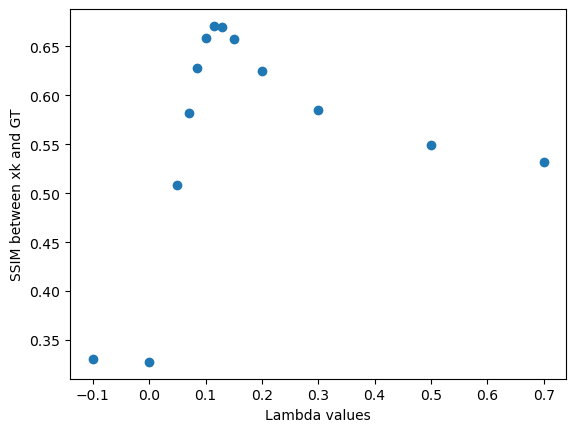

In [108]:
j = 3
alpha = [0.2,0.1,0.05,0.015]
filename = "ImagesOriginales/%s.jpg" %j
img = np.array(plt.imread(filename)/255, dtype="float64")
y = generateNoise(img,'gaussian',seed = 43, var = 0.02)
optLambda = runGoldenSection(img,y,lmbdaCentroid=0.3,early_stopping=True,alpha = alpha, maxiter=500, mode = 'gaussian')

# LINE OF TESTING
--------------

In [25]:
j = 3
filename = "ImagesOriginales/%s.jpg" %j
img = np.array(plt.imread(filename)/255, dtype="float64")
(m,n) = np.shape(img)
n_patches_horizontal = 3
n_patches_vertical = 4
maxHorizontal = round(m / n_patches_horizontal)
maxVertical = round(n / n_patches_vertical)
print(m,n)
print(maxHorizontal,maxVertical)
print(maxHorizontal * n_patches_horizontal)
print(maxVertical * n_patches_vertical)


321 481
107 120
321
480


In [ ]:
alpha = [0.2,0.1,0.05,0.015]
(m,n) = np.shape(img)
lambdaMap = np.full(shape = (m,n), fill_value = 0.135)
# da controllare se con fill_value uguale a 0, sia peggiore o no 


for i in range(n_patches_horizontal):
    for j in range(n_patches_vertical):
        y = generateNoise(img, mode='gaussian', seed=43, var = 0.02)
        patch = img[i*maxHorizontal:(i+1)*maxHorizontal,j*maxVertical:(j+1)*maxVertical]
        yPatch = y[i*maxHorizontal:(i+1)*maxHorizontal,j*maxVertical:(j+1)*maxVertical]
        optLambda = runGoldenSection(img = patch,y = yPatch,lmbdaCentroid = 0.3, alpha = alpha, early_stopping = True)
        lambdaMap[i*maxHorizontal:(i+1)*maxHorizontal,j*maxVertical:(j+1)*maxVertical] = optLambda


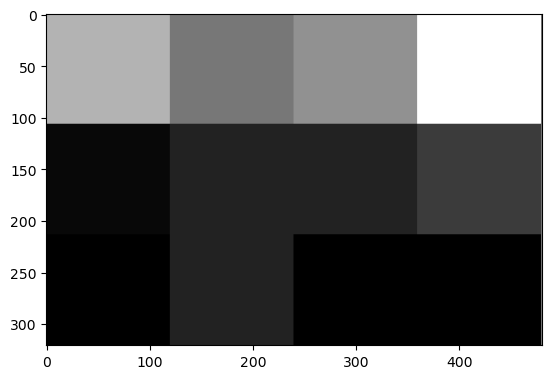

In [27]:
plt.imshow(lambdaMap, cmap = 'gray')
plt.show()

I got stopped at iteration 114 because of Cost function


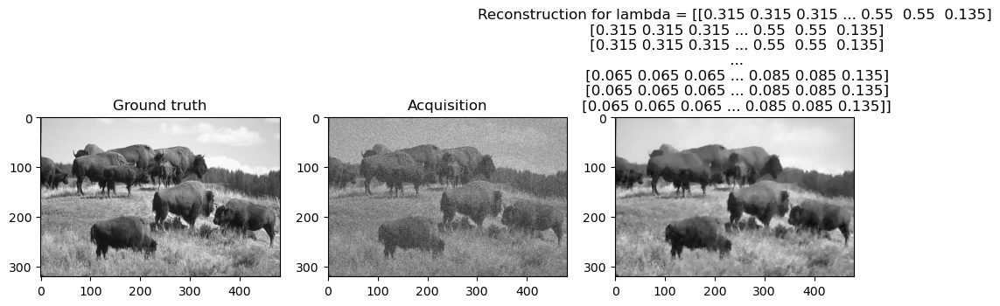

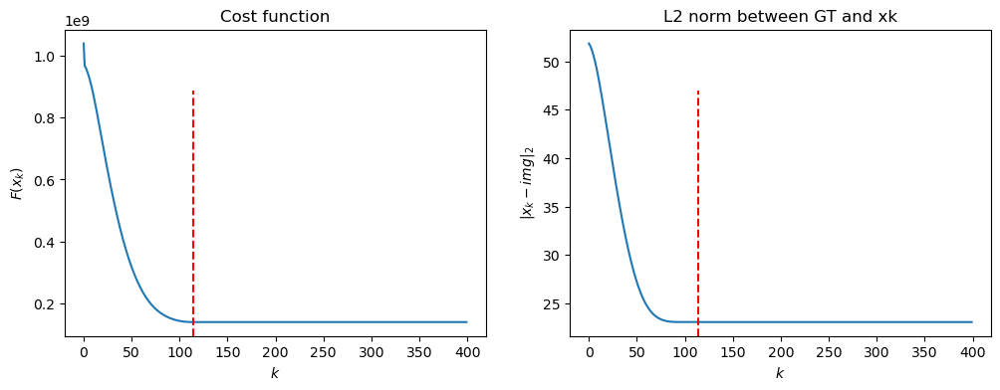

In [33]:
xk = runScript(img,y,lmbda = [lambdaMap], early_stopping=True)

In [34]:
skimage.metrics.structural_similarity(xk,img,data_range=1)

0.7042225345748799

In [ ]:
alpha = [0.2,0.1,0.05,0.015]
(m,n) = np.shape(img)
reconstructedImage = np.zeros(shape = (m,n))
lambdaMap = np.zeros(shape = (m,n))



for i in range(n_patches_horizontal):
    for j in range(n_patches_vertical):
        y = generateNoise(img, mode='gaussian', seed=43, var = 0.02)
        patch = img[i*maxHorizontal:(i+1)*maxHorizontal,j*maxVertical:(j+1)*maxVertical]
        yPatch = y[i*maxHorizontal:(i+1)*maxHorizontal,j*maxVertical:(j+1)*maxVertical]
        optLambda = runGoldenSection(img = patch,y = yPatch,lmbdaCentroid = 0.3, alpha = alpha, SSIMstop = False, early_stopping = True)
        #optLambdaPatch = np.full(shape = (maxHorizontal,maxVertical), fill_value = optLambda)
        lambdaMap[i*maxHorizontal:(i+1)*maxHorizontal,j*maxVertical:(j+1)*maxVertical] = optLambda
        denoisedImage = runScript(patch,yPatch,lmbda = [optLambda], SSIMstop = False, early_stopping = True)
        reconstructedImage[i*maxHorizontal:(i+1)*maxHorizontal,j*maxVertical:(j+1)*maxVertical] = denoisedImage
        plt.imshow(patch, cmap = 'gray')
        plt.show()
        
plt.imshow(reconstructedImage)
plt.show()


I got stopped at iteration 110 because of Cost function


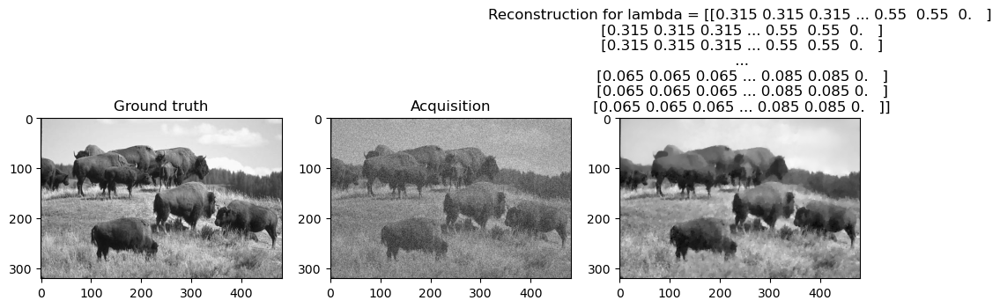

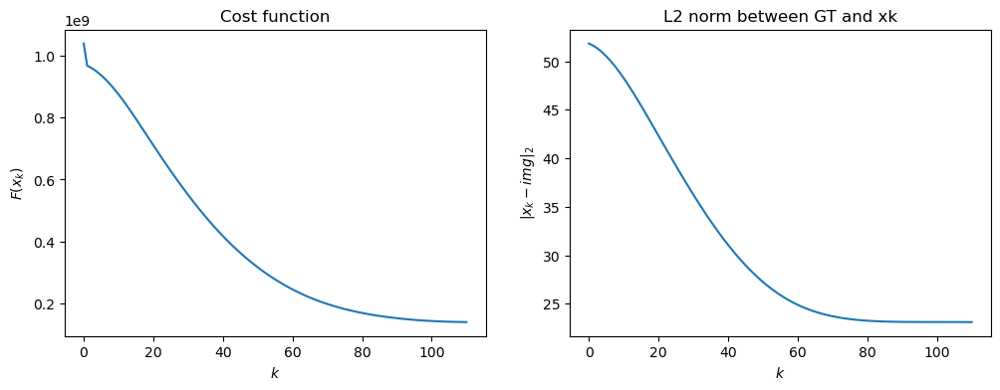

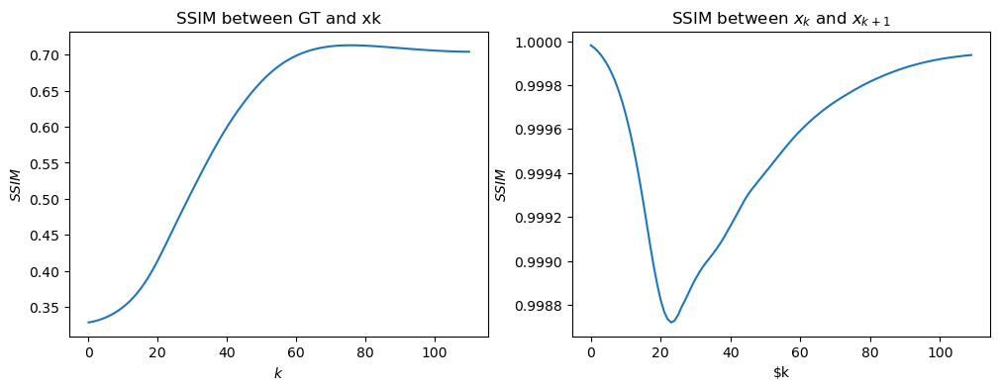

In [24]:
xk = runScript(img,y,lmbda = [lambdaMap], SSIMstop=False, early_stopping=True)

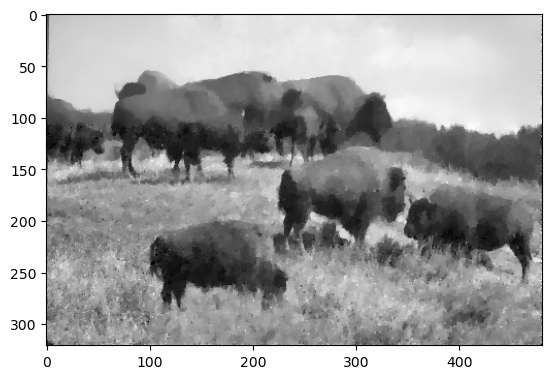

In [25]:
plt.imshow(xk, cmap = 'gray')
plt.show()

In [26]:
skimage.metrics.structural_similarity(xk,img, data_range=1)

0.7040814162988297

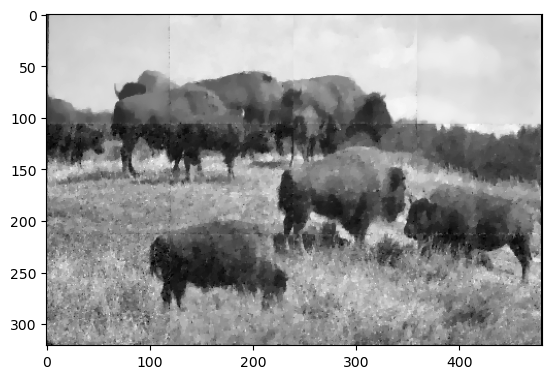

In [9]:
plt.imshow(reconstructedImage,cmap = 'gray')

I got stopped at iteration 296 because of Cost function


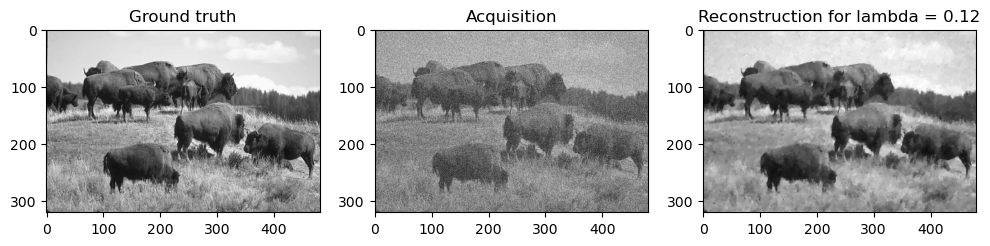

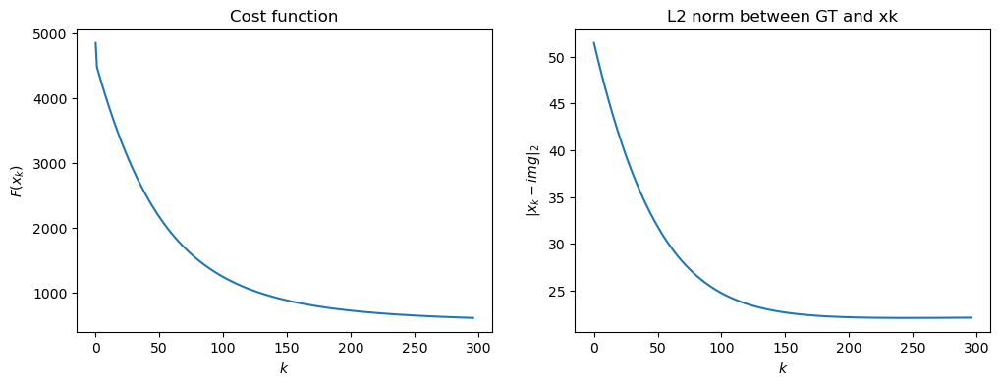

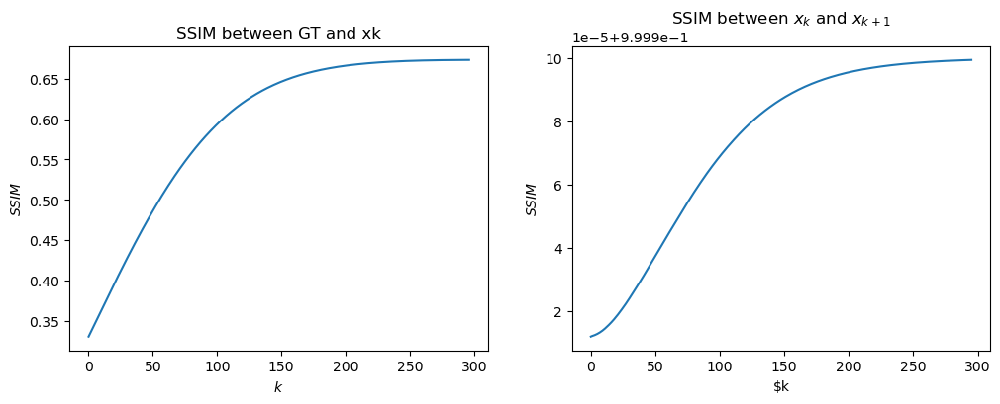

In [11]:
y = generateNoise(img,mode='gaussian',seed=43,var=0.02)
xk = runScript(img,y,lmbda = [0.135], SSIMstop = False, early_stopping = True)

In [ ]:
optLa

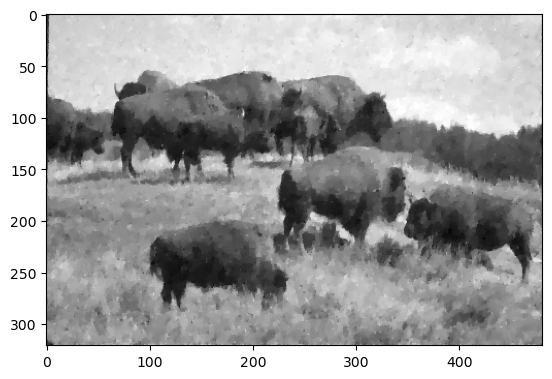

In [12]:
plt.imshow(xk, cmap = 'gray')
plt.show()

In [13]:
skimage.metrics.structural_similarity(xk,img,data_range = 1)

0.6732087986592498

Results made with different way of injecting noise, we first clip the patch and then inject noise. Then i tried to first inject noise and then clip the patches

In [93]:
skimage.metrics.structural_similarity(reconstructedImage,img,data_range = 1)

0.7112840672102332

In [14]:
skimage.metrics.structural_similarity(reconstructedImage,img,data_range = 1)

0.7103161293613293

## Other experiments

In [15]:
j = 3
filename = "ImagesOriginales/%s.jpg" %j
img = np.array(plt.imread(filename)/255, dtype="float64")
(m,n) = np.shape(img)
n_patches_horizontal = 10
n_patches_vertical = 10
maxHorizontal = round(m / n_patches_horizontal)
maxVertical = round(n / n_patches_vertical)
print(m,n)
print(maxHorizontal,maxVertical)
print(maxHorizontal * n_patches_horizontal)
print(maxVertical * n_patches_vertical)

321 481
32 48
320
480


--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 241 because of Cost function
I got stopped at iteration 211 because of Cost function
I got stopped at iteration 215 because of Cost function
I got stopped at iteration 241 because of Cost function
{-0.1: 0.11786795054307392, 0.1: 0.6884438164551289, 0.3: 0.9405849876688336, 0.5: 0.94118754451783, 0.7: 0.9403406090889236}
--------
range examined: [0.3 0.4 0.5 0.6 0.7]
I got stopped at iteration 211 because of Cost function
I got stopped at iteration 208 because of Cost function
I got stopped at iteration 215 because of Cost function
I got stopped at iteration 227 because of Cost function
I got stopped at iteration 241 because of Cost function
{-0.1: 0.11786795054307392, 0.1: 0.6884438164551289, 0.3: 0.9405849876688336, 0.5: 0.94118754451783, 0.7: 0.9403406090889236, 0.4: 0.9412064830826636, 0.6: 0.9408776060142723}
--------
range examined: [0.3  0.35 0.4  

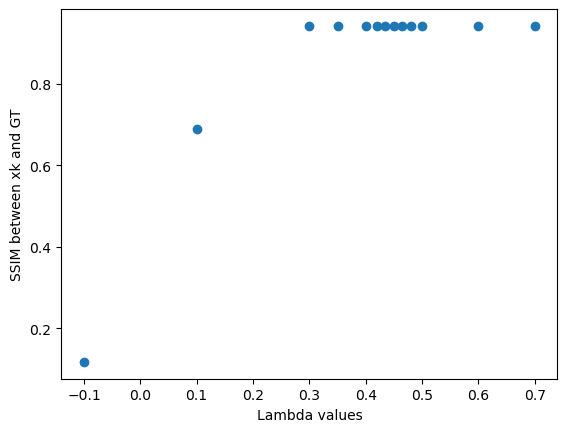

I got stopped at iteration 210 because of Cost function


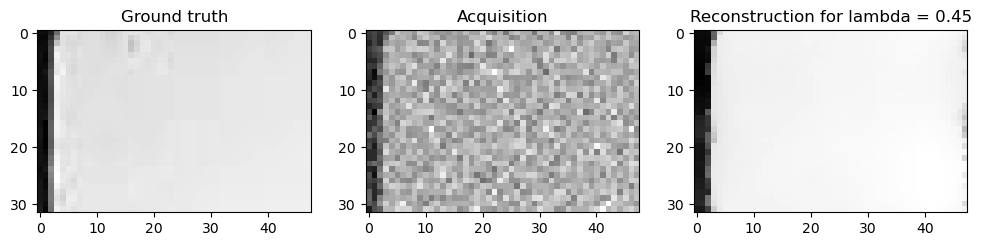

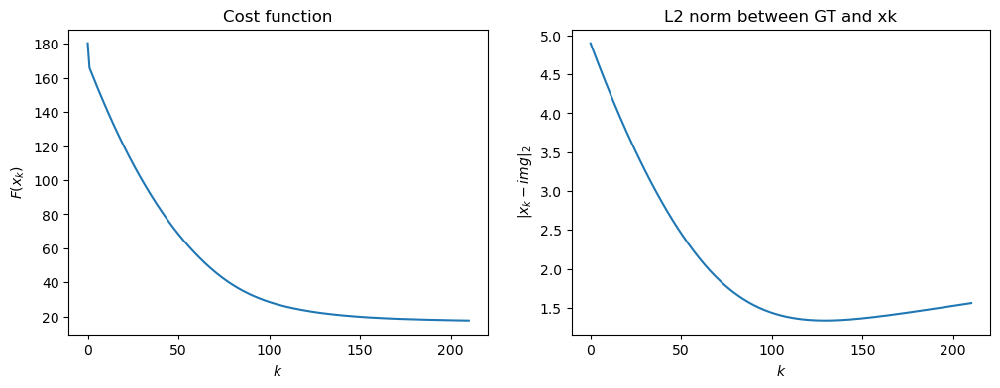

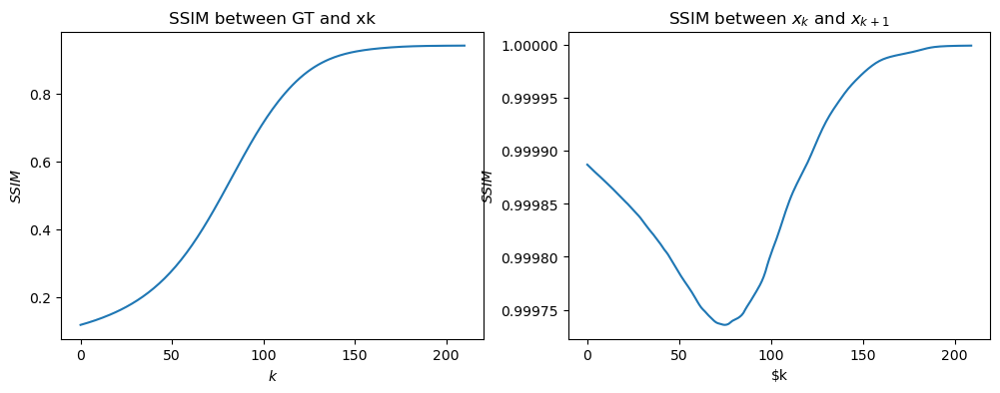

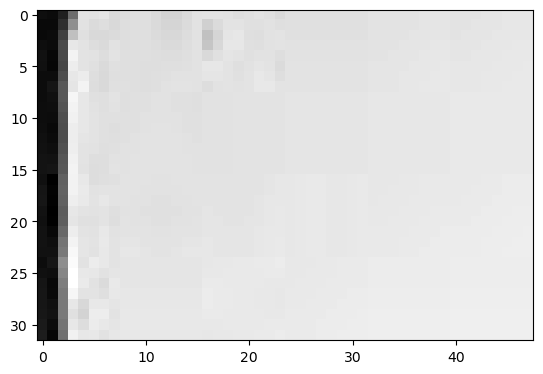

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 232 because of Sequence norm
I got stopped at iteration 218 because of Sequence norm
I got stopped at iteration 194 because of Sequence norm
I got stopped at iteration 190 because of Sequence norm
{-0.1: 0.054679134231312564, 0.1: 0.5929734581067125, 0.3: 0.9818818522040196, 0.5: 0.983968533637951, 0.7: 0.9848376477737095}
--------
range examined: [0.5 0.6 0.7 0.8 0.9]
I got stopped at iteration 194 because of Sequence norm
I got stopped at iteration 192 because of Sequence norm
I got stopped at iteration 190 because of Sequence norm
I got stopped at iteration 188 because of Sequence norm
I got stopped at iteration 187 because of Sequence norm
{-0.1: 0.054679134231312564, 0.1: 0.5929734581067125, 0.3: 0.9818818522040196, 0.5: 0.983968533637951, 0.7: 0.9848376477737095, 0.6: 0.984557411856759, 0.8: 0.9849676477153702, 0.9: 0.9851019567060019}
--------
rang

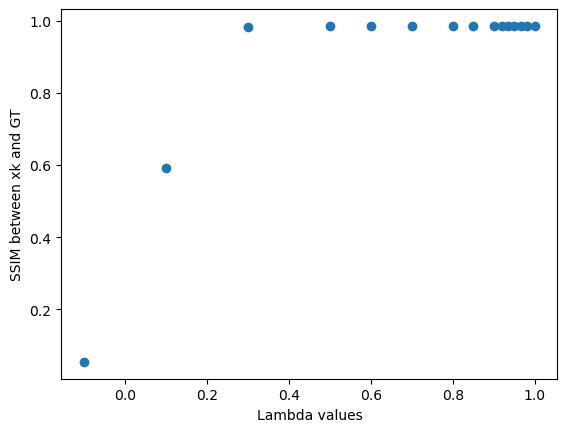

I got stopped at iteration 187 because of Sequence norm


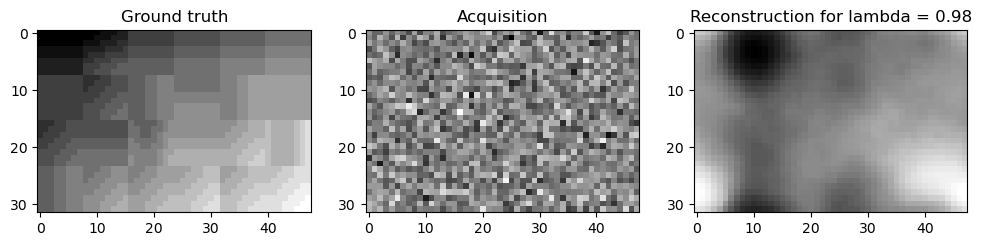

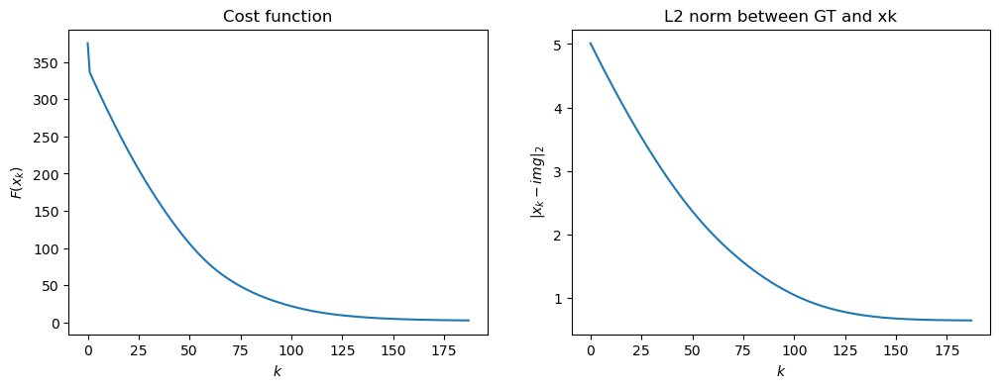

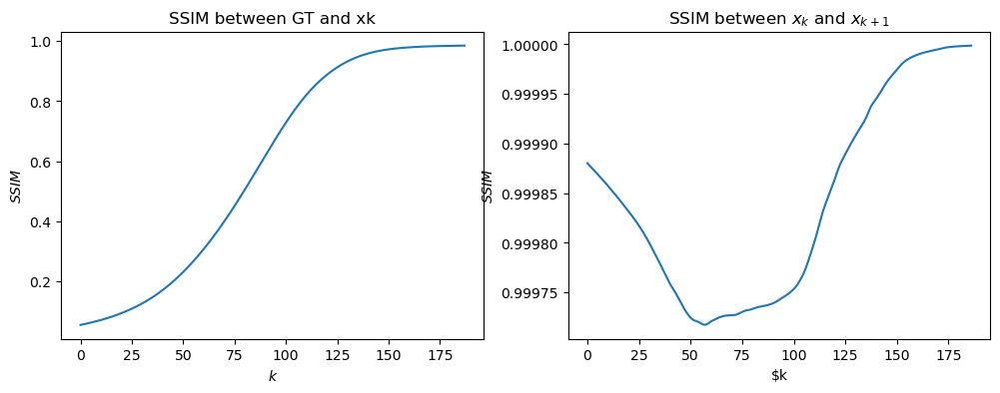

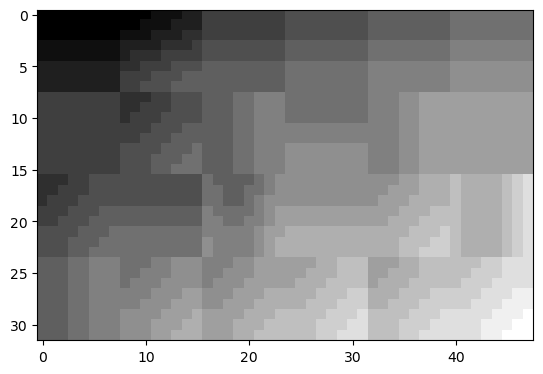

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 229 because of Sequence norm
I got stopped at iteration 201 because of Sequence norm
I got stopped at iteration 191 because of Sequence norm
I got stopped at iteration 191 because of Sequence norm
{-0.1: 0.07024304508804986, 0.1: 0.6394173892343192, 0.3: 0.955734350393685, 0.5: 0.9580347971726715, 0.7: 0.957573469634684}
--------
range examined: [0.3 0.4 0.5 0.6 0.7]
I got stopped at iteration 201 because of Sequence norm
I got stopped at iteration 193 because of Sequence norm
I got stopped at iteration 191 because of Sequence norm
I got stopped at iteration 191 because of Sequence norm
I got stopped at iteration 191 because of Sequence norm
{-0.1: 0.07024304508804986, 0.1: 0.6394173892343192, 0.3: 0.955734350393685, 0.5: 0.9580347971726715, 0.7: 0.957573469634684, 0.4: 0.957680322064263, 0.6: 0.9578623900554505}
--------
range examined: [0.4  0.45 0.5  0

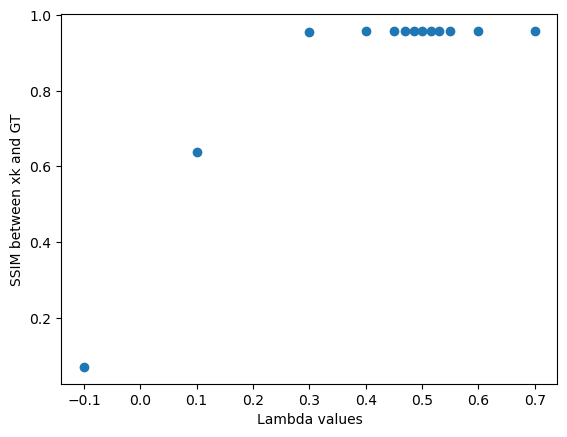

I got stopped at iteration 191 because of Sequence norm


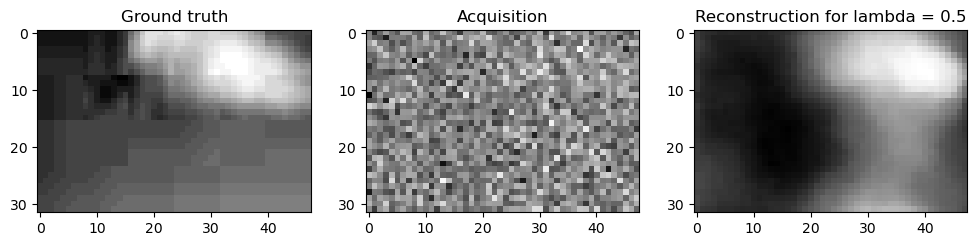

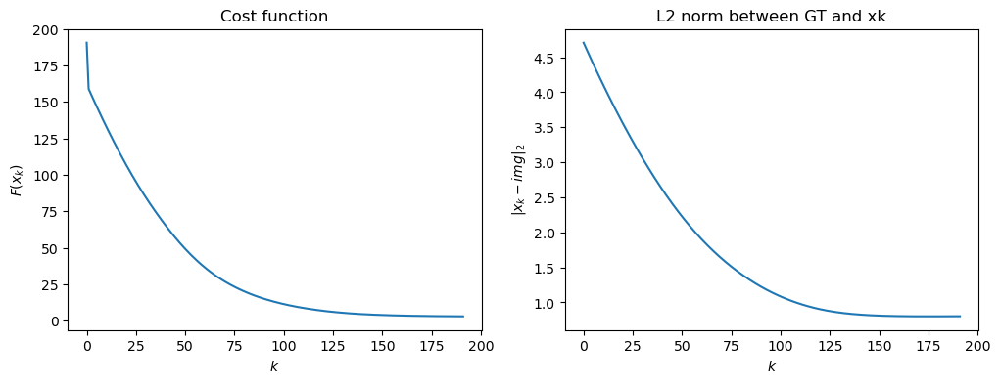

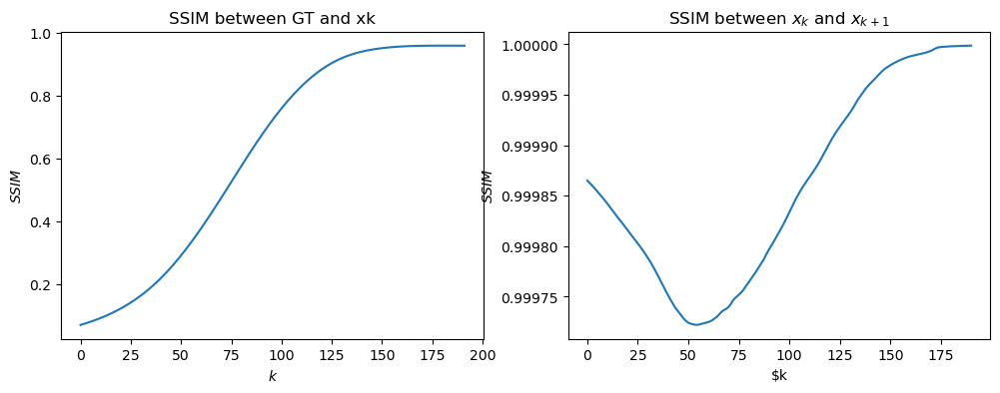

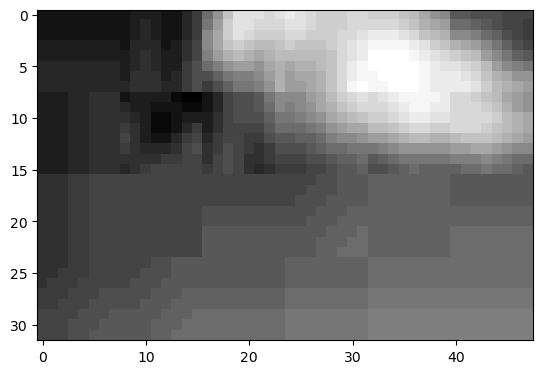

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 212 because of Sequence norm
I got stopped at iteration 262 because of Sequence norm
I got stopped at iteration 258 because of Sequence norm
I got stopped at iteration 251 because of Sequence norm
{-0.1: 0.06738618303776252, 0.1: 0.5769364932605706, 0.3: 0.9690260596322707, 0.5: 0.9736980418518985, 0.7: 0.9739400057250734}
--------
range examined: [0.5 0.6 0.7 0.8 0.9]
I got stopped at iteration 258 because of Sequence norm
I got stopped at iteration 254 because of Sequence norm
I got stopped at iteration 251 because of Sequence norm
I got stopped at iteration 248 because of Sequence norm
I got stopped at iteration 246 because of Sequence norm
{-0.1: 0.06738618303776252, 0.1: 0.5769364932605706, 0.3: 0.9690260596322707, 0.5: 0.9736980418518985, 0.7: 0.9739400057250734, 0.6: 0.9739157475053333, 0.8: 0.9739039689109835, 0.9: 0.9738440694318271}
--------
ran

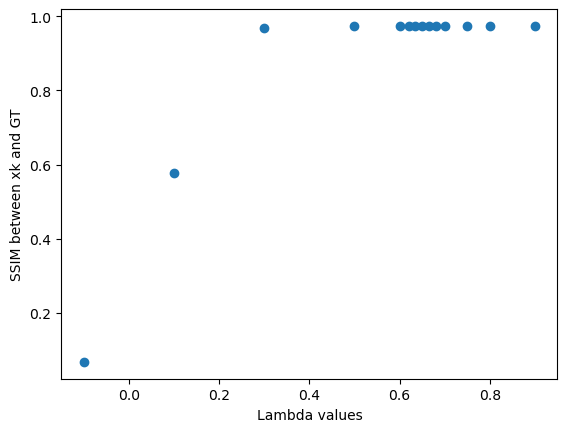

I got stopped at iteration 252 because of Sequence norm


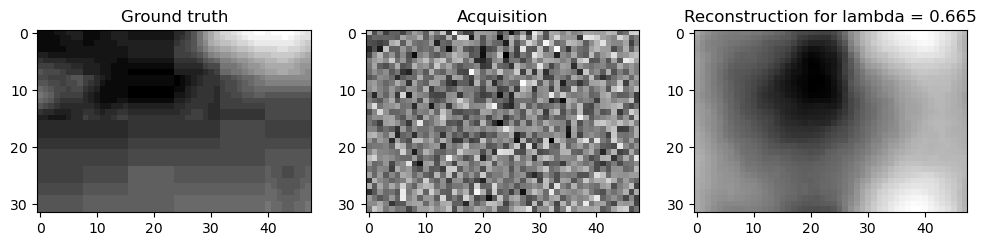

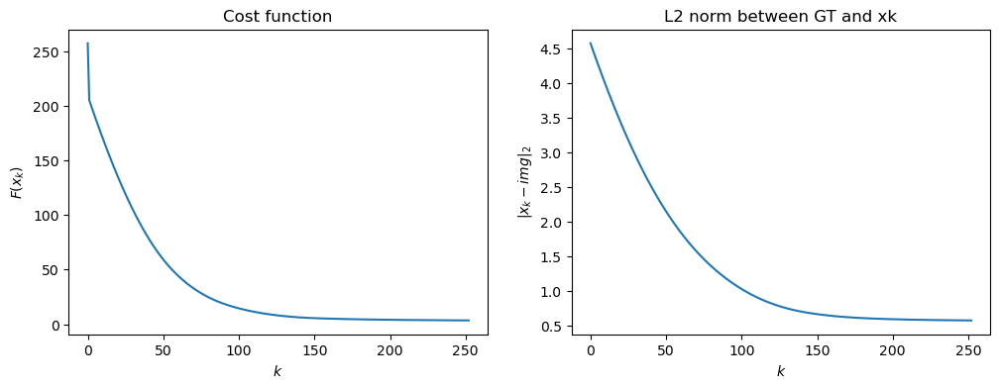

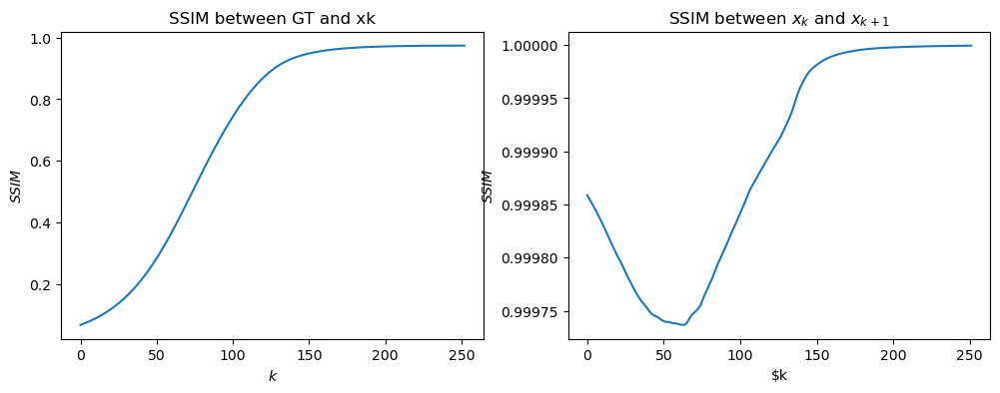

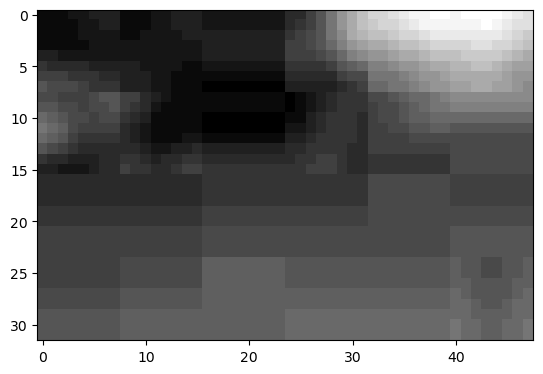

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 209 because of Sequence norm
I got stopped at iteration 201 because of Sequence norm
I got stopped at iteration 182 because of Sequence norm
I got stopped at iteration 181 because of Sequence norm
{-0.1: 0.06963366684499445, 0.1: 0.636120846337785, 0.3: 0.9663563880333315, 0.5: 0.9699098527771023, 0.7: 0.9714507986251255}
--------
range examined: [0.5 0.6 0.7 0.8 0.9]
I got stopped at iteration 182 because of Sequence norm
I got stopped at iteration 181 because of Sequence norm
I got stopped at iteration 181 because of Sequence norm
I got stopped at iteration 181 because of Sequence norm
I got stopped at iteration 181 because of Sequence norm
{-0.1: 0.06963366684499445, 0.1: 0.636120846337785, 0.3: 0.9663563880333315, 0.5: 0.9699098527771023, 0.7: 0.9714507986251255, 0.6: 0.9708335141465633, 0.8: 0.9718451957665523, 0.9: 0.97211542500214}
--------
range e

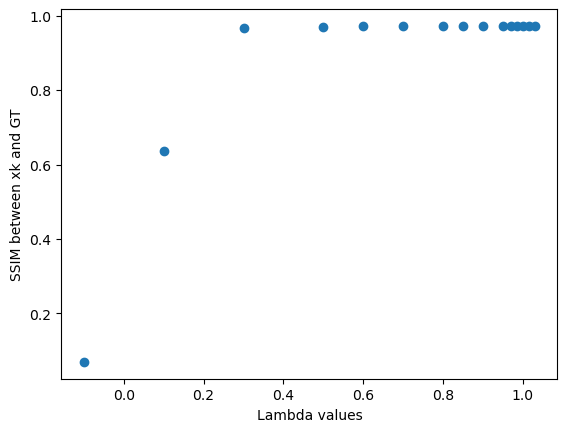

I got stopped at iteration 181 because of Sequence norm


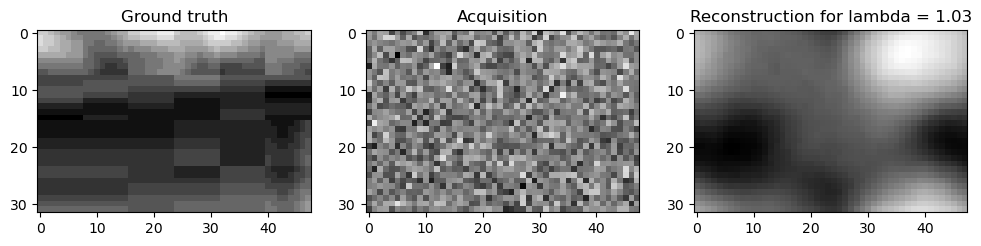

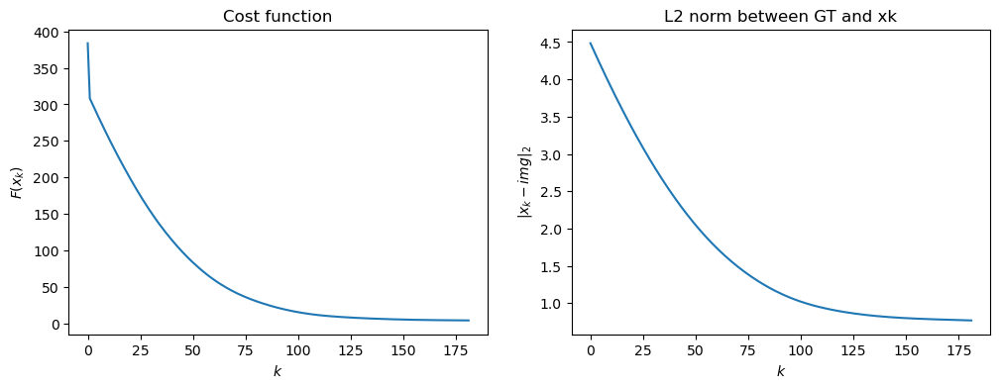

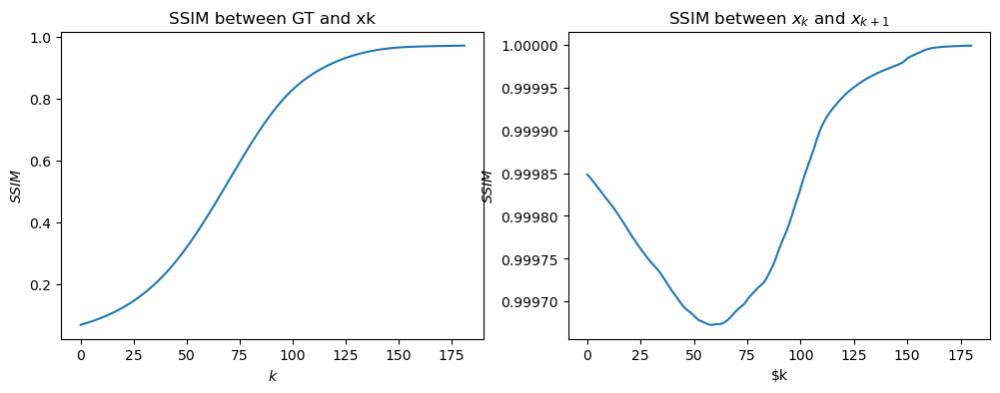

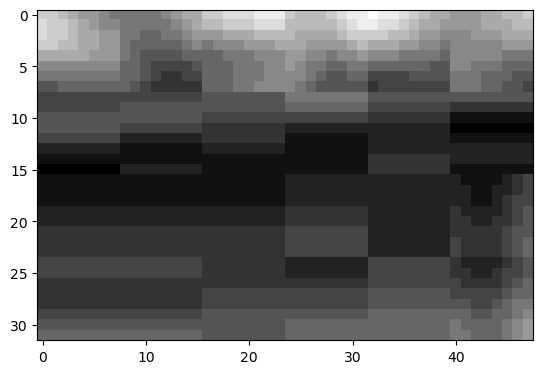

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 205 because of Sequence norm
I got stopped at iteration 221 because of Sequence norm
I got stopped at iteration 223 because of Sequence norm
I got stopped at iteration 230 because of Sequence norm
{-0.1: 0.09859290824070233, 0.1: 0.671306219080491, 0.3: 0.9283079300359186, 0.5: 0.9162509178156468, 0.7: 0.9063748606787374}
--------
range examined: [0.1 0.2 0.3 0.4 0.5]
I got stopped at iteration 205 because of Sequence norm
I got stopped at iteration 230 because of Sequence norm
I got stopped at iteration 221 because of Sequence norm
I got stopped at iteration 221 because of Sequence norm
I got stopped at iteration 223 because of Sequence norm
{-0.1: 0.09859290824070233, 0.1: 0.671306219080491, 0.3: 0.9283079300359186, 0.5: 0.9162509178156468, 0.7: 0.9063748606787374, 0.2: 0.9261047250860989, 0.4: 0.922170839108472}
--------
range examined: [0.2  0.25 0.3 

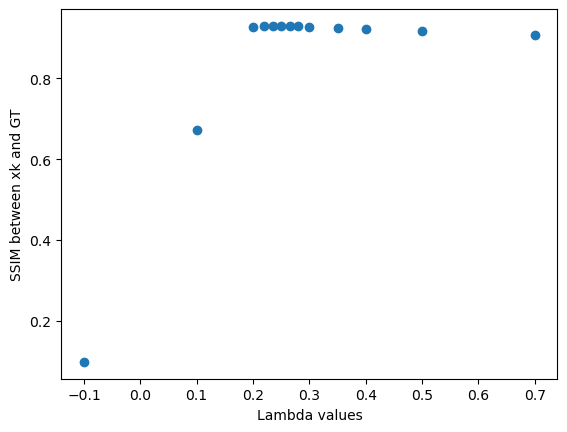

I got stopped at iteration 224 because of Sequence norm


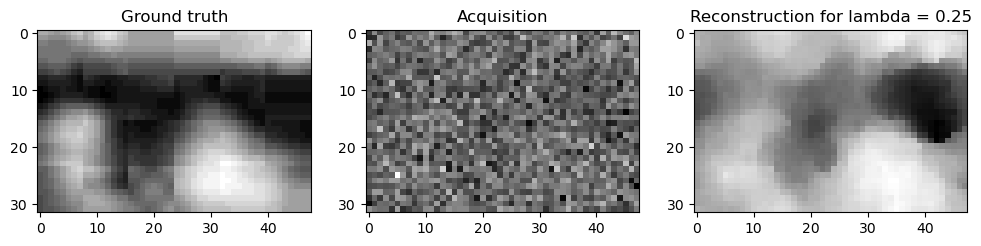

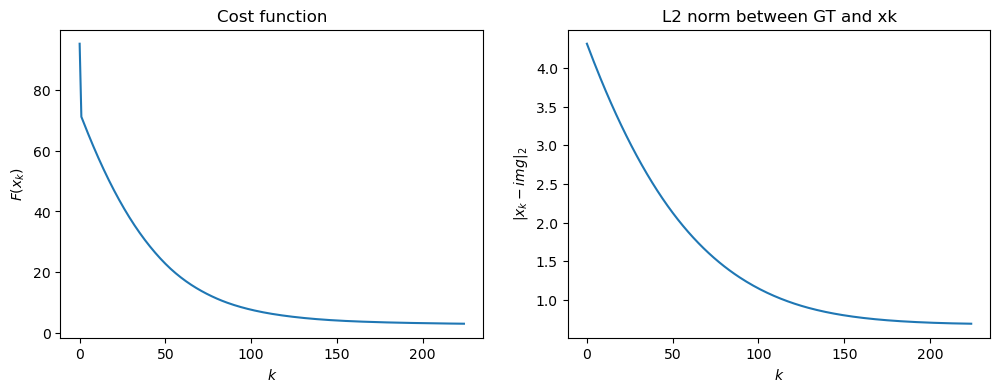

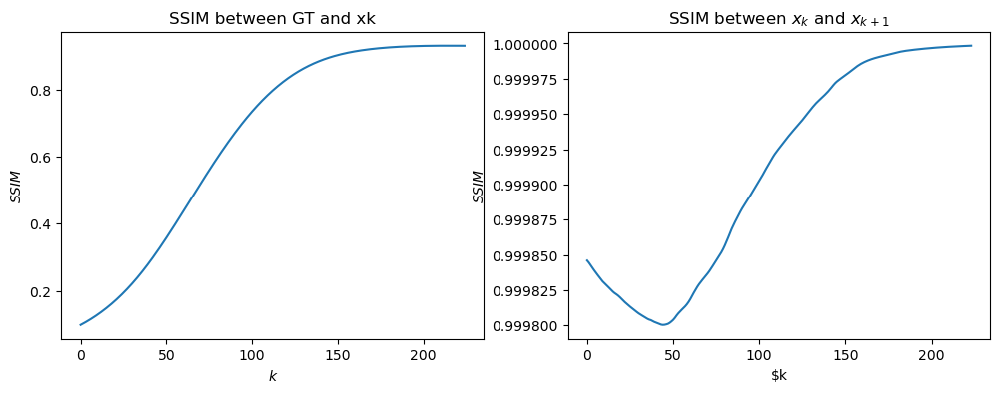

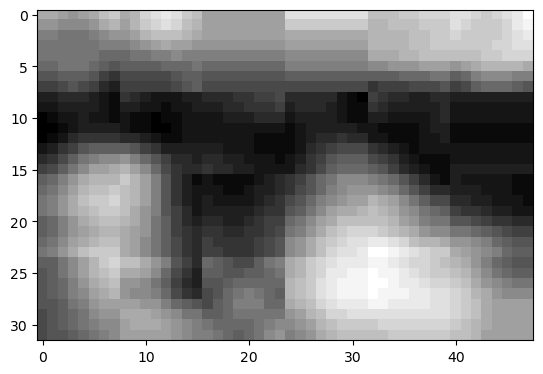

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 213 because of Sequence norm
I got stopped at iteration 223 because of Sequence norm
I got stopped at iteration 235 because of Sequence norm
I got stopped at iteration 235 because of Sequence norm
{-0.1: 0.08056997679016409, 0.1: 0.5949213222642608, 0.3: 0.9296593295562869, 0.5: 0.9290821997224802, 0.7: 0.9251603410063926}
--------
range examined: [0.1 0.2 0.3 0.4 0.5]
I got stopped at iteration 213 because of Sequence norm
I got stopped at iteration 253 because of Sequence norm
I got stopped at iteration 223 because of Sequence norm
I got stopped at iteration 231 because of Sequence norm
I got stopped at iteration 235 because of Sequence norm
{-0.1: 0.08056997679016409, 0.1: 0.5949213222642608, 0.3: 0.9296593295562869, 0.5: 0.9290821997224802, 0.7: 0.9251603410063926, 0.2: 0.9157346870931574, 0.4: 0.9314965996345901}
--------
range examined: [0.3  0.35 0

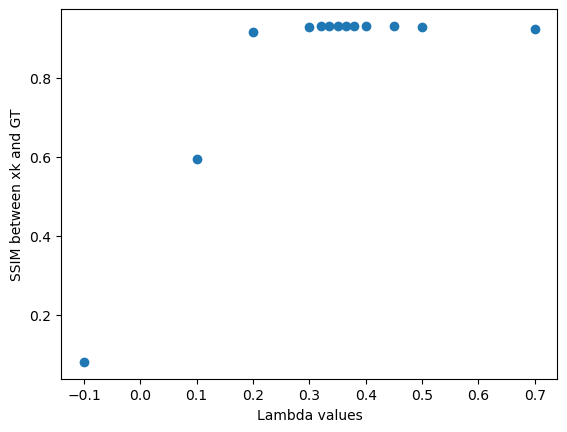

I got stopped at iteration 228 because of Sequence norm


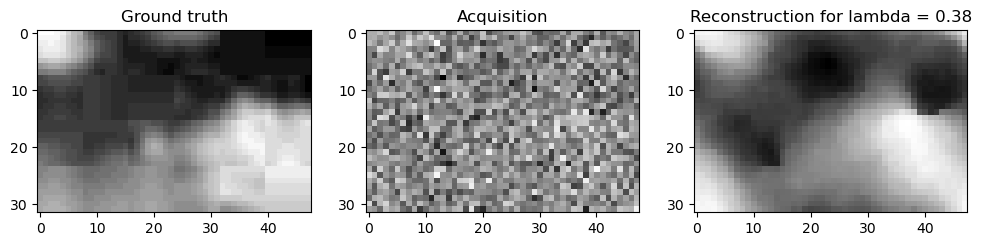

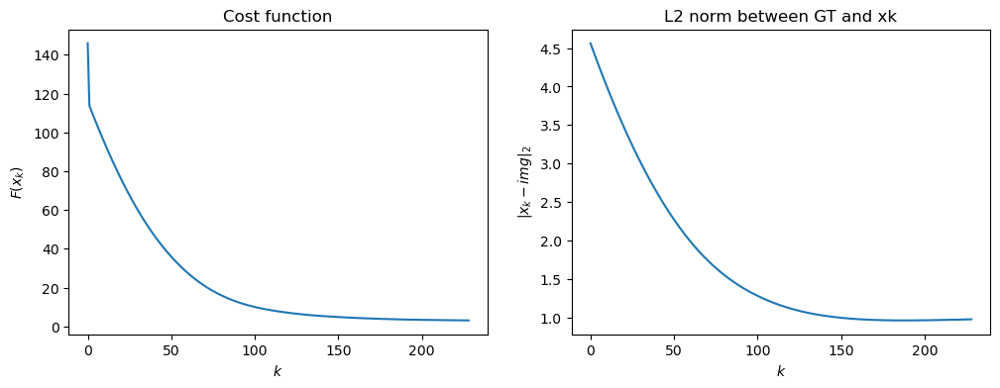

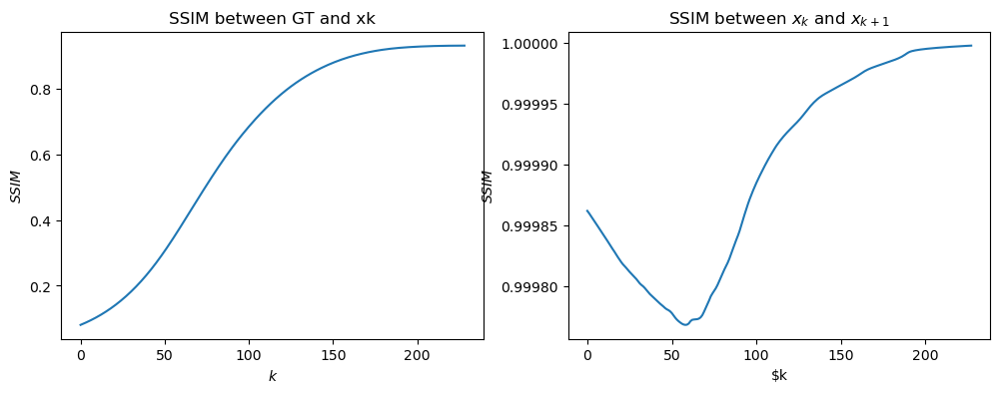

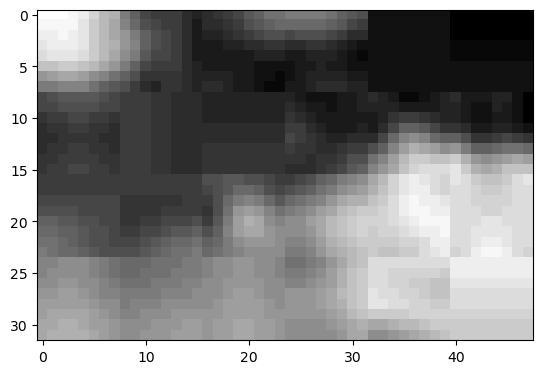

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 241 because of Sequence norm
I got stopped at iteration 248 because of Sequence norm
I got stopped at iteration 258 because of Sequence norm
I got stopped at iteration 270 because of Sequence norm
{-0.1: 0.07280730963413574, 0.1: 0.6324340024599814, 0.3: 0.9138162441536886, 0.5: 0.9119132775350932, 0.7: 0.9096501864197911}
--------
range examined: [0.1 0.2 0.3 0.4 0.5]
I got stopped at iteration 241 because of Sequence norm
I got stopped at iteration 251 because of Sequence norm
I got stopped at iteration 248 because of Sequence norm
I got stopped at iteration 252 because of Sequence norm
I got stopped at iteration 258 because of Sequence norm
{-0.1: 0.07280730963413574, 0.1: 0.6324340024599814, 0.3: 0.9138162441536886, 0.5: 0.9119132775350932, 0.7: 0.9096501864197911, 0.2: 0.9023599402627595, 0.4: 0.9132884670361792}
--------
range examined: [0.2  0.25 0

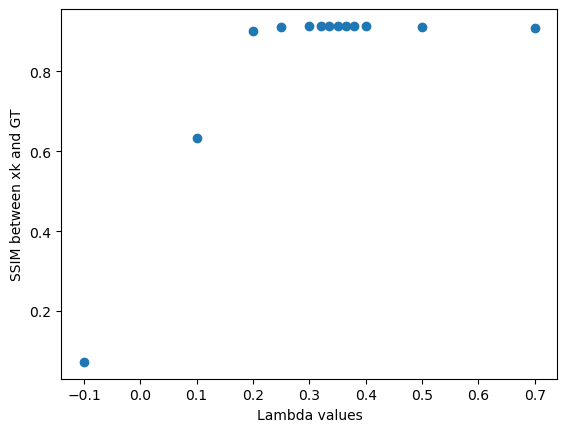

I got stopped at iteration 248 because of Sequence norm


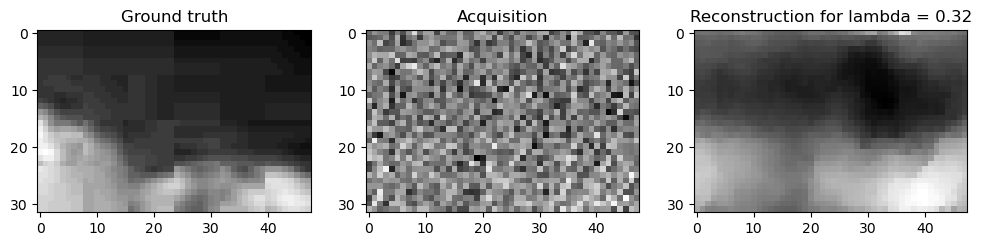

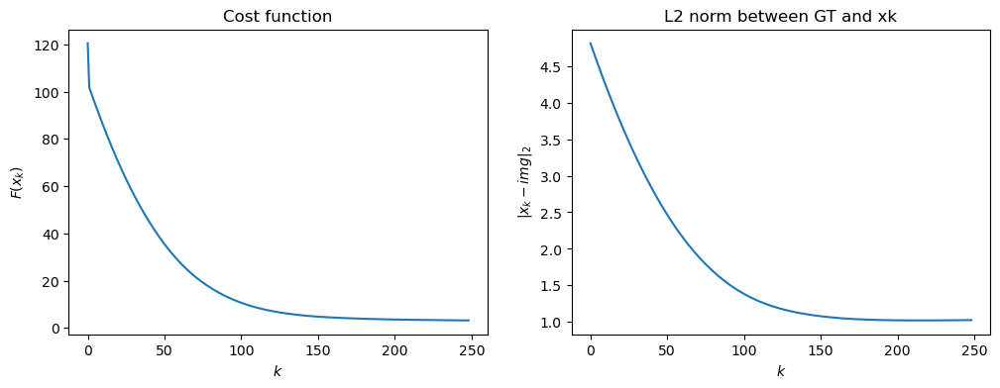

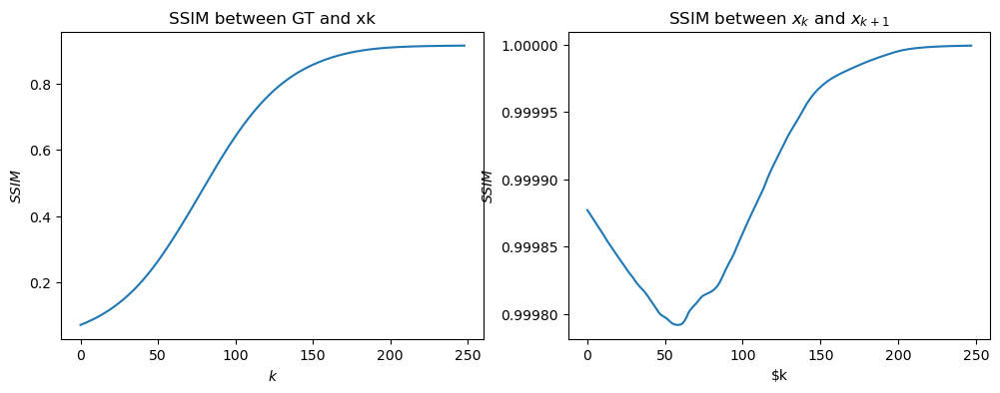

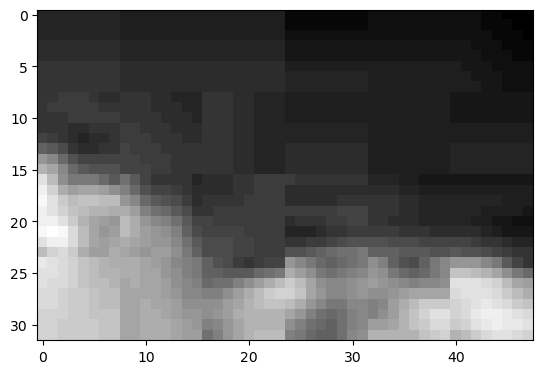

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 229 because of Sequence norm
I got stopped at iteration 224 because of Sequence norm
I got stopped at iteration 291 because of Sequence norm
I got stopped at iteration 337 because of Sequence norm
{-0.1: 0.08450407546273957, 0.1: 0.6223866092755123, 0.3: 0.9225343652902834, 0.5: 0.9176121779063757, 0.7: 0.907536494529466}
--------
range examined: [0.1 0.2 0.3 0.4 0.5]
I got stopped at iteration 229 because of Sequence norm
I got stopped at iteration 228 because of Sequence norm
I got stopped at iteration 224 because of Sequence norm
I got stopped at iteration 259 because of Sequence norm
I got stopped at iteration 291 because of Sequence norm
{-0.1: 0.08450407546273957, 0.1: 0.6223866092755123, 0.3: 0.9225343652902834, 0.5: 0.9176121779063757, 0.7: 0.907536494529466, 0.2: 0.9123833685819873, 0.4: 0.921896173200589}
--------
range examined: [0.2  0.25 0.3 

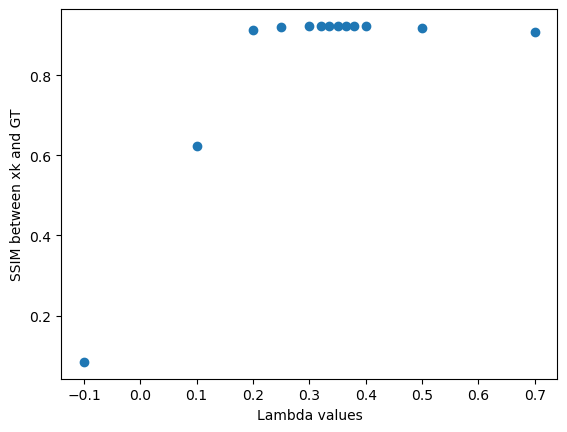

I got stopped at iteration 233 because of Sequence norm


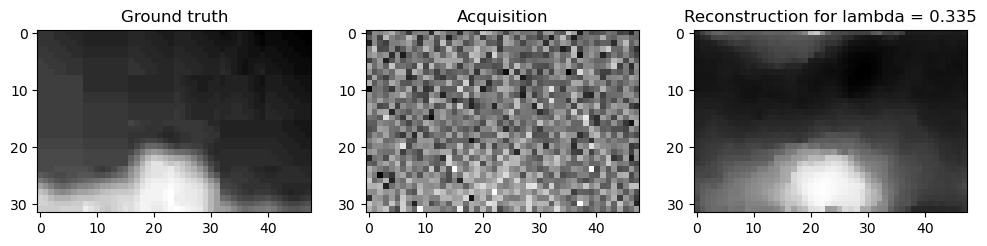

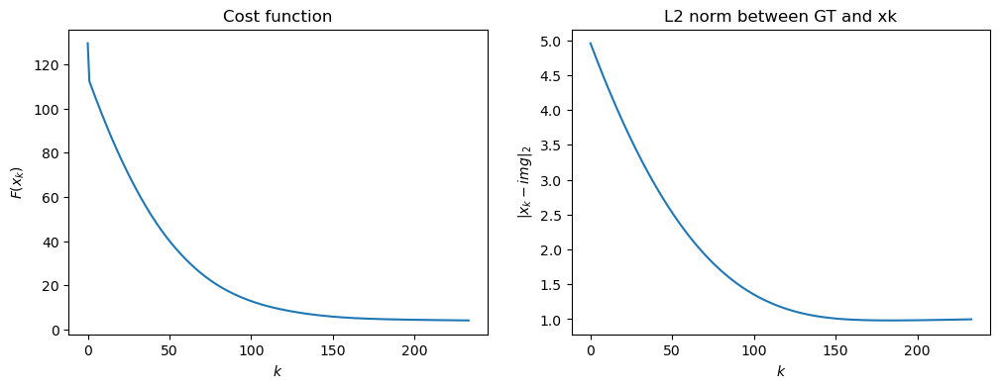

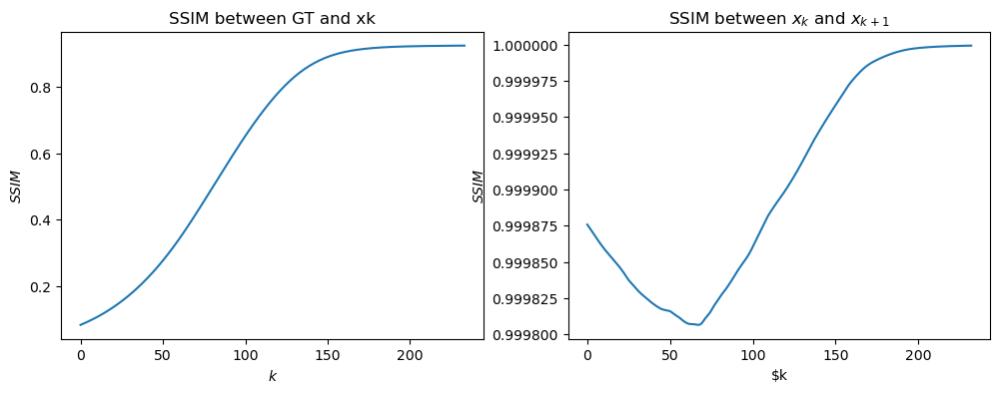

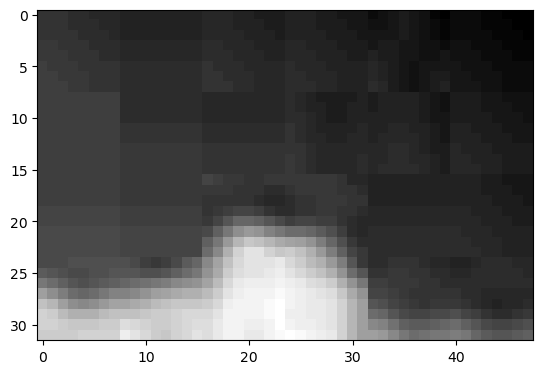

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 226 because of Sequence norm
I got stopped at iteration 253 because of Sequence norm
I got stopped at iteration 241 because of Sequence norm
I got stopped at iteration 241 because of Sequence norm
{-0.1: 0.06212570185315904, 0.1: 0.5925277867000444, 0.3: 0.9256133849889033, 0.5: 0.9263458335844674, 0.7: 0.924902052772798}
--------
range examined: [0.3 0.4 0.5 0.6 0.7]
I got stopped at iteration 253 because of Sequence norm
I got stopped at iteration 244 because of Sequence norm
I got stopped at iteration 241 because of Sequence norm
I got stopped at iteration 240 because of Sequence norm
I got stopped at iteration 241 because of Sequence norm
{-0.1: 0.06212570185315904, 0.1: 0.5925277867000444, 0.3: 0.9256133849889033, 0.5: 0.9263458335844674, 0.7: 0.924902052772798, 0.4: 0.9267614752399451, 0.6: 0.9256761902777322}
--------
range examined: [0.3  0.35 0.4

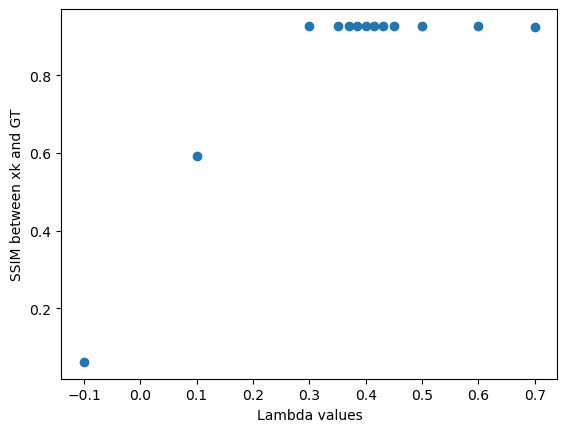

I got stopped at iteration 244 because of Sequence norm


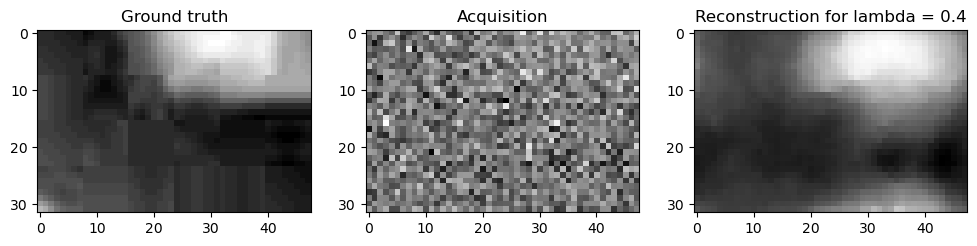

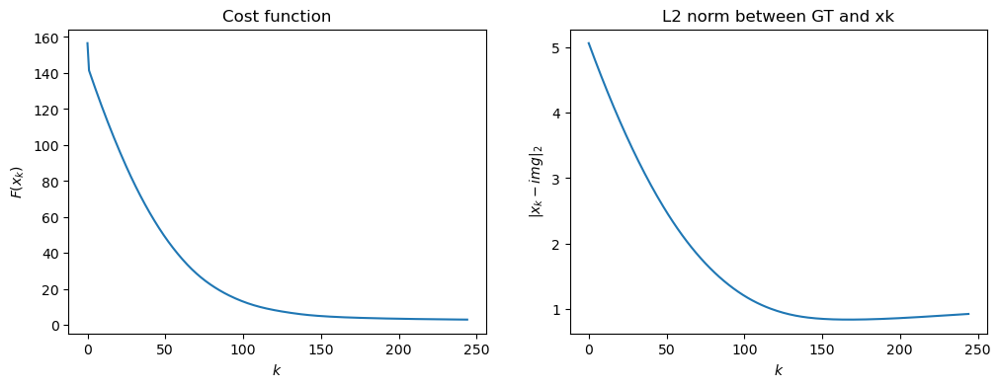

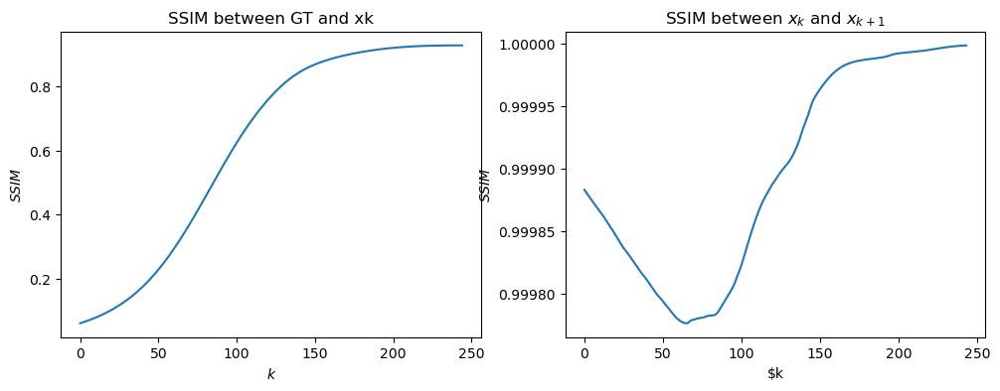

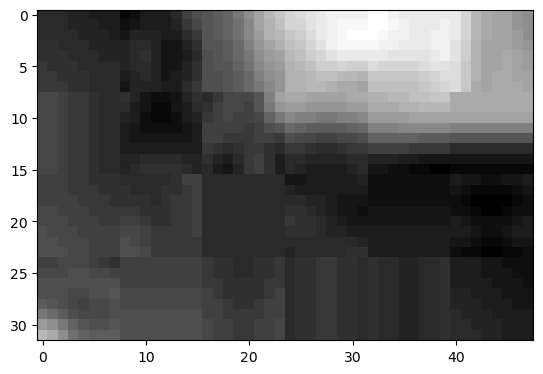

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 247 because of Cost function
I got stopped at iteration 213 because of Cost function
I got stopped at iteration 244 because of Cost function
I got stopped at iteration 307 because of Cost function
{-0.1: 0.10003314639041881, 0.1: 0.6620374355113378, 0.3: 0.944869224958243, 0.5: 0.9515585814854277, 0.7: 0.9506833363131215}
--------
range examined: [0.3 0.4 0.5 0.6 0.7]
I got stopped at iteration 213 because of Cost function
I got stopped at iteration 225 because of Cost function
I got stopped at iteration 244 because of Cost function
I got stopped at iteration 271 because of Cost function
I got stopped at iteration 307 because of Cost function
{-0.1: 0.10003314639041881, 0.1: 0.6620374355113378, 0.3: 0.944869224958243, 0.5: 0.9515585814854277, 0.7: 0.9506833363131215, 0.4: 0.9497928868162778, 0.6: 0.9518045183956607}
--------
range examined: [0.5  0.55 0.6

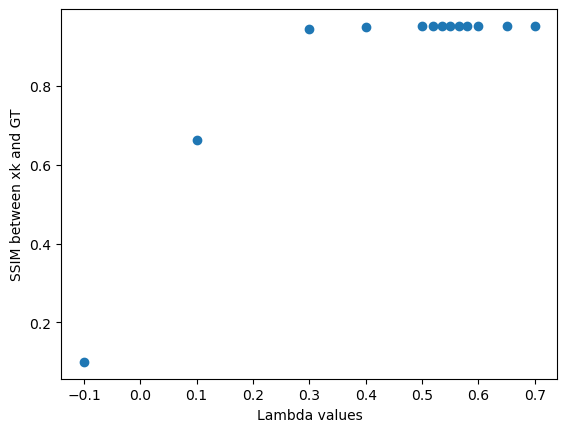

I got stopped at iteration 261 because of Cost function


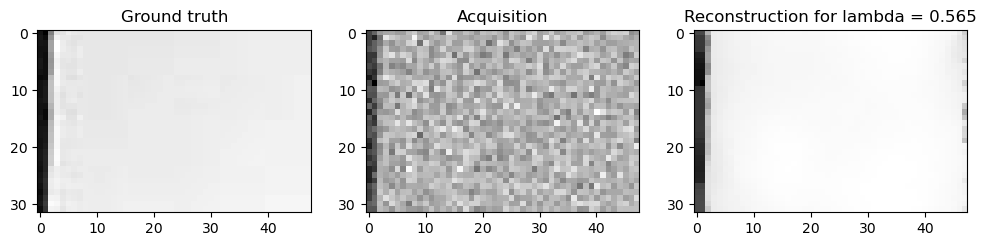

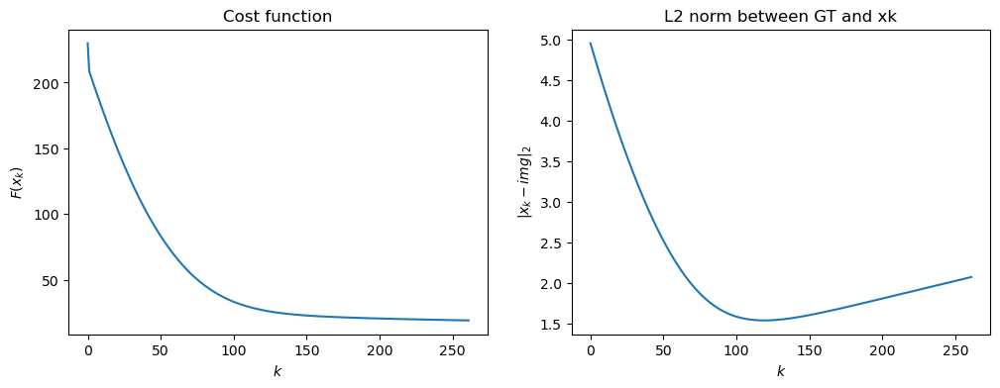

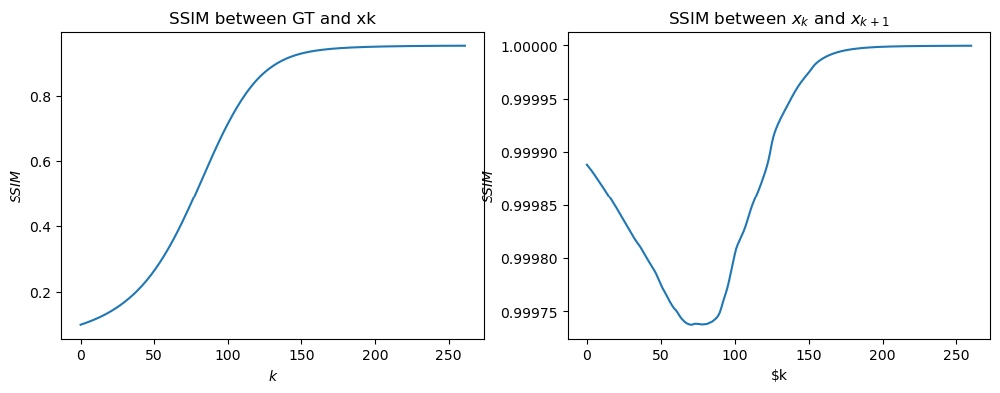

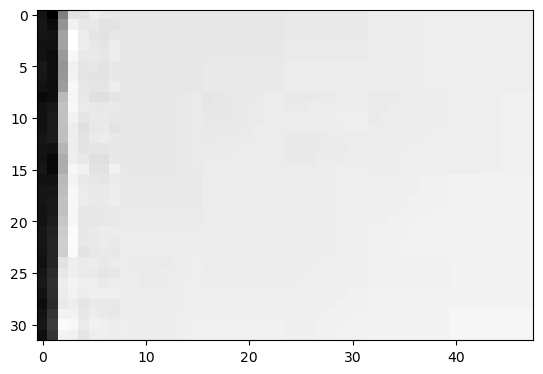

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 214 because of Sequence norm
I got stopped at iteration 274 because of Cost function
I got stopped at iteration 342 because of Cost function
{-0.1: 0.07657884281733114, 0.1: 0.5919250566922059, 0.3: 0.9698495475301987, 0.5: 0.9731995565505887, 0.7: 0.9719373393524188}
--------
range examined: [0.3 0.4 0.5 0.6 0.7]
I got stopped at iteration 274 because of Cost function
I got stopped at iteration 302 because of Cost function
I got stopped at iteration 342 because of Cost function
I got stopped at iteration 383 because of Cost function
{-0.1: 0.07657884281733114, 0.1: 0.5919250566922059, 0.3: 0.9698495475301987, 0.5: 0.9731995565505887, 0.7: 0.9719373393524188, 0.4: 0.9728042879994331, 0.6: 0.97258050461079}
--------
range examined: [0.4  0.45 0.5  0.55 0.6 ]
I got stopped at iteration 302 because of Cost function
I got stopped at iteration 321 because of C

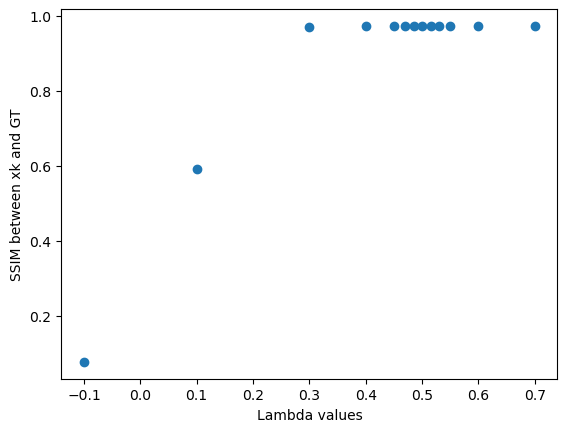

I got stopped at iteration 330 because of Cost function


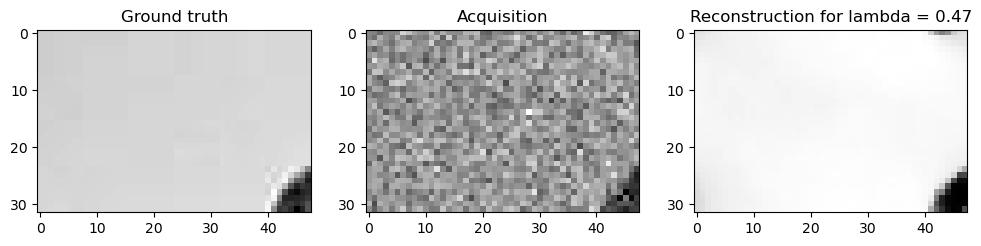

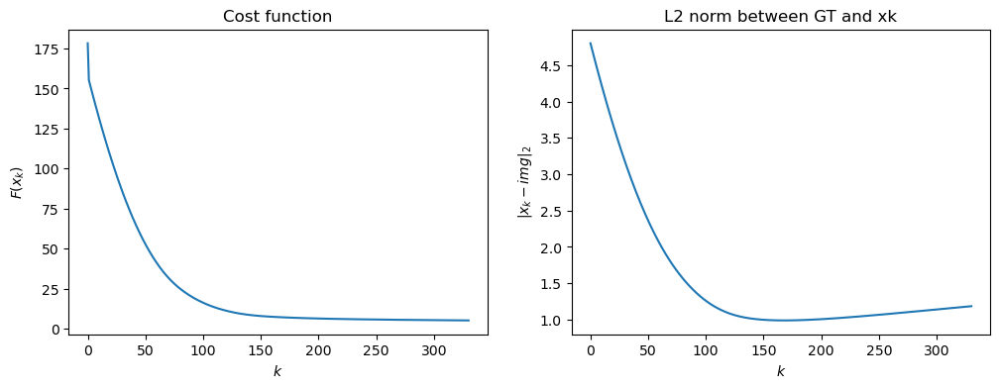

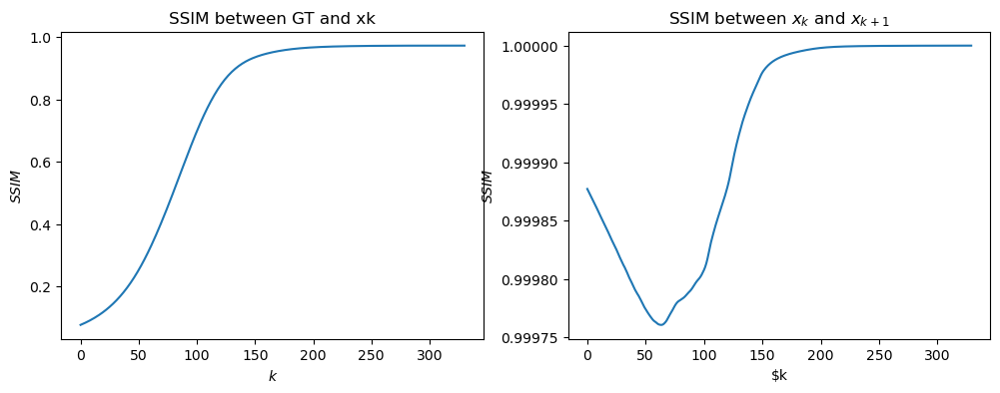

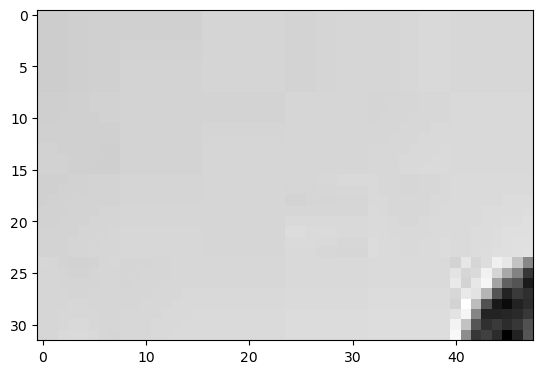

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 209 because of Sequence norm
I got stopped at iteration 245 because of Cost function
I got stopped at iteration 274 because of Cost function
I got stopped at iteration 279 because of Cost function
{-0.1: 0.12783937437789977, 0.1: 0.6020692868208771, 0.3: 0.9442389276040826, 0.5: 0.9446230886518641, 0.7: 0.9423038817418278}
--------
range examined: [0.3 0.4 0.5 0.6 0.7]
I got stopped at iteration 245 because of Cost function
I got stopped at iteration 259 because of Cost function
I got stopped at iteration 274 because of Cost function
I got stopped at iteration 275 because of Cost function
I got stopped at iteration 279 because of Cost function
{-0.1: 0.12783937437789977, 0.1: 0.6020692868208771, 0.3: 0.9442389276040826, 0.5: 0.9446230886518641, 0.7: 0.9423038817418278, 0.4: 0.9455651825349077, 0.6: 0.9434853041897892}
--------
range examined: [0.3  0.35 0

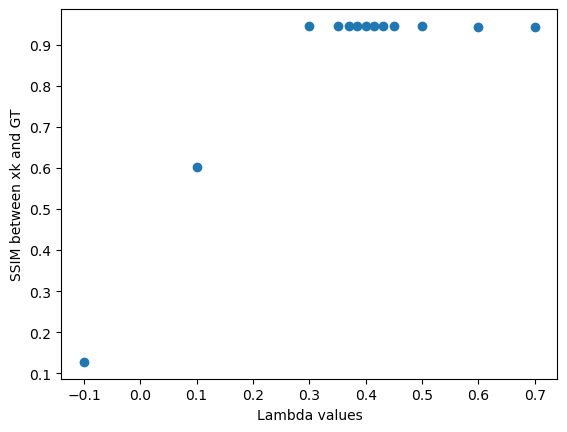

I got stopped at iteration 256 because of Cost function


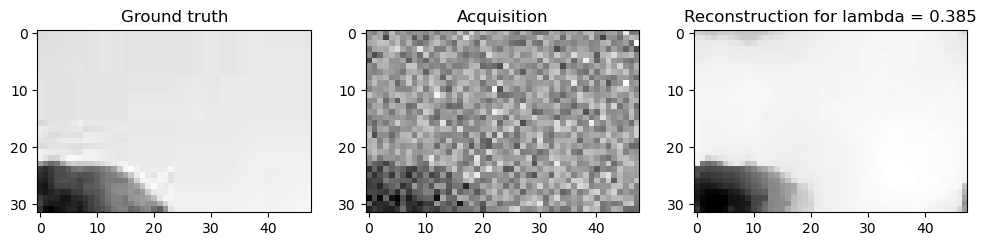

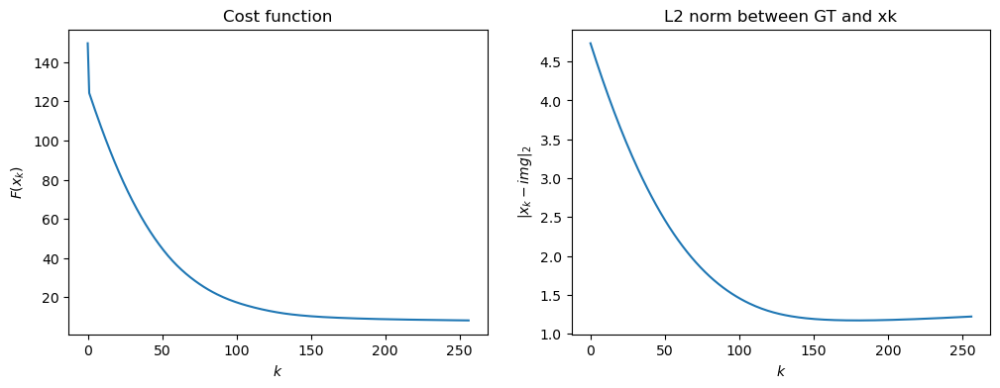

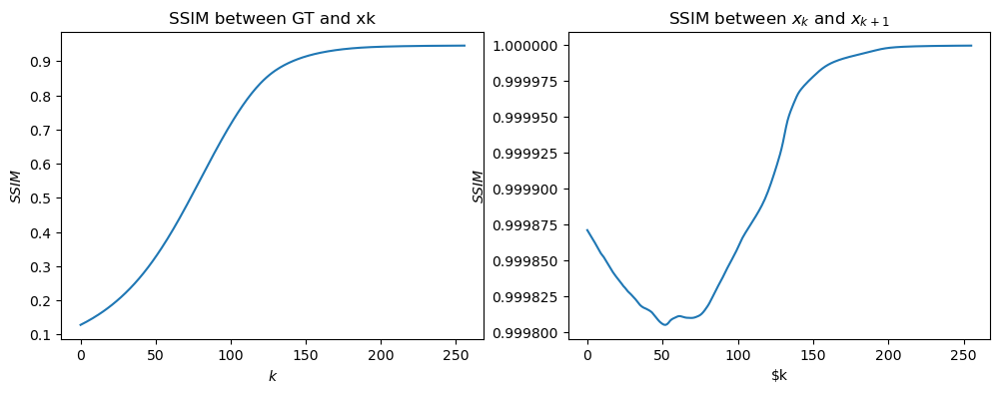

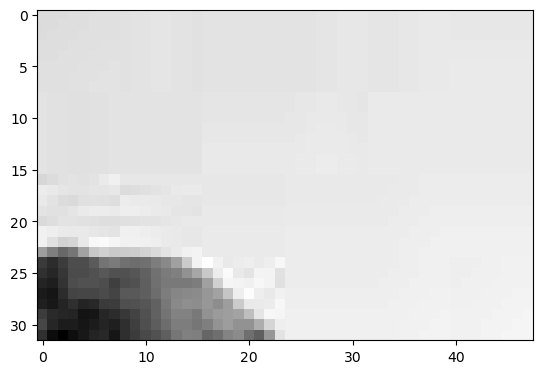

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 224 because of Sequence norm
I got stopped at iteration 228 because of Cost function
I got stopped at iteration 258 because of Cost function
I got stopped at iteration 287 because of Cost function
{-0.1: 0.14473669286000693, 0.1: 0.6355895075735355, 0.3: 0.9340514429943952, 0.5: 0.9380215728846062, 0.7: 0.9379429365255865}
--------
range examined: [0.3 0.4 0.5 0.6 0.7]
I got stopped at iteration 228 because of Cost function
I got stopped at iteration 242 because of Cost function
I got stopped at iteration 258 because of Cost function
I got stopped at iteration 274 because of Cost function
I got stopped at iteration 287 because of Cost function
{-0.1: 0.14473669286000693, 0.1: 0.6355895075735355, 0.3: 0.9340514429943952, 0.5: 0.9380215728846062, 0.7: 0.9379429365255865, 0.4: 0.9371077394341459, 0.6: 0.9381637840771182}
--------
range examined: [0.5  0.55 0

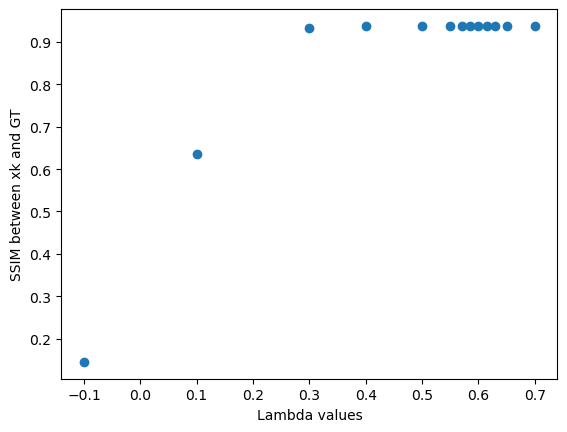

I got stopped at iteration 270 because of Cost function


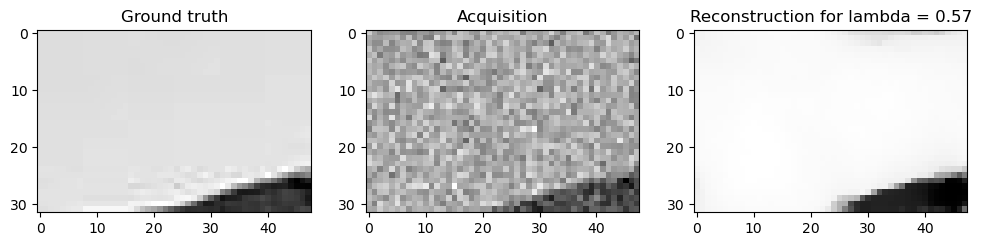

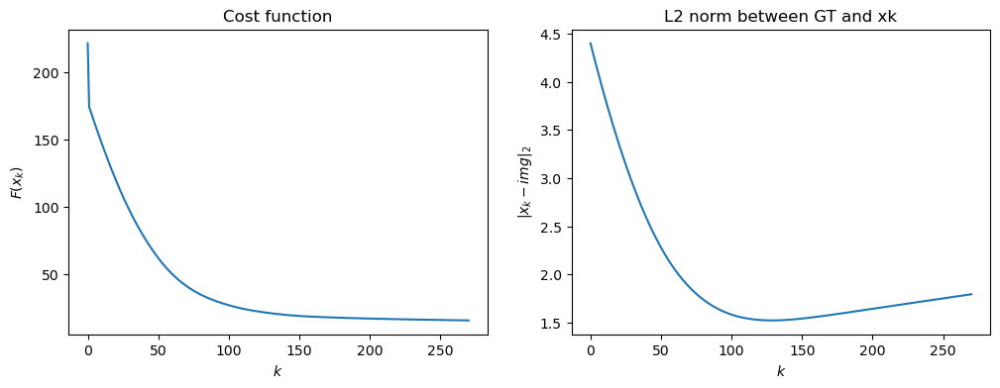

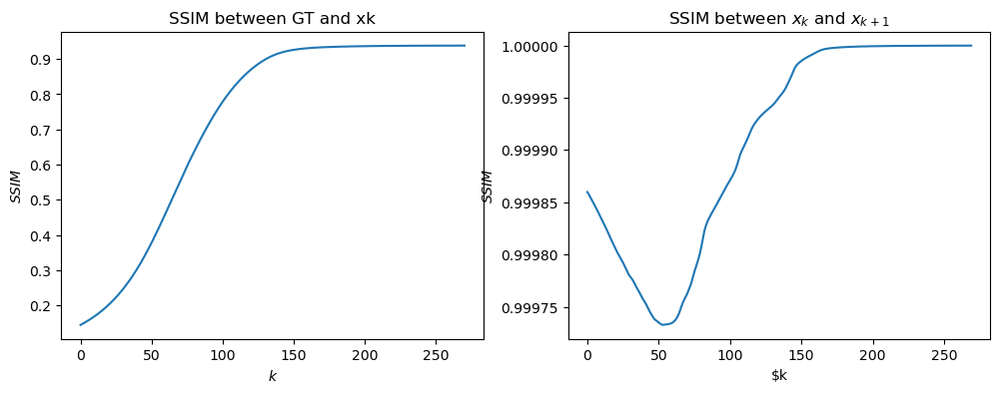

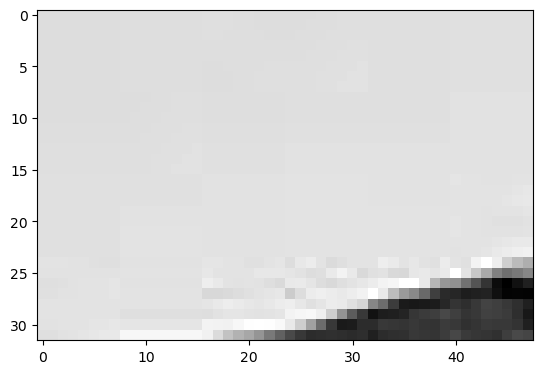

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 203 because of Sequence norm
I got stopped at iteration 217 because of Cost function
I got stopped at iteration 222 because of Cost function
I got stopped at iteration 239 because of Cost function
{-0.1: 0.1906056976802656, 0.1: 0.6160735289067076, 0.3: 0.927072532811708, 0.5: 0.9314116046788989, 0.7: 0.930781738882388}
--------
range examined: [0.3 0.4 0.5 0.6 0.7]
I got stopped at iteration 217 because of Cost function
I got stopped at iteration 217 because of Cost function
I got stopped at iteration 222 because of Cost function
I got stopped at iteration 230 because of Cost function
I got stopped at iteration 239 because of Cost function
{-0.1: 0.1906056976802656, 0.1: 0.6160735289067076, 0.3: 0.927072532811708, 0.5: 0.9314116046788989, 0.7: 0.930781738882388, 0.4: 0.9305286395259058, 0.6: 0.9313227959189998}
--------
range examined: [0.4  0.45 0.5  0.

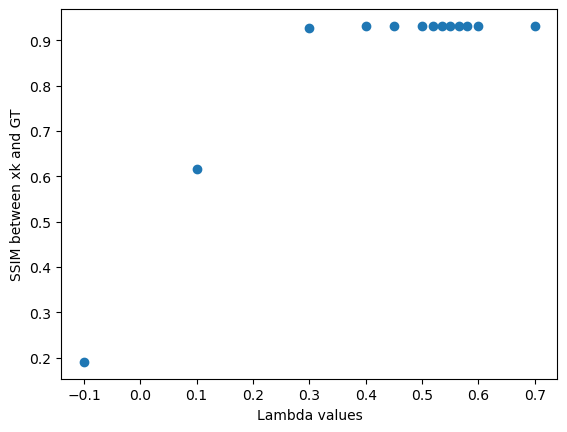

I got stopped at iteration 225 because of Cost function


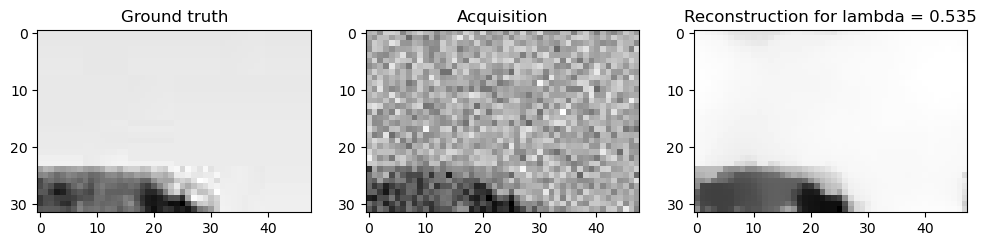

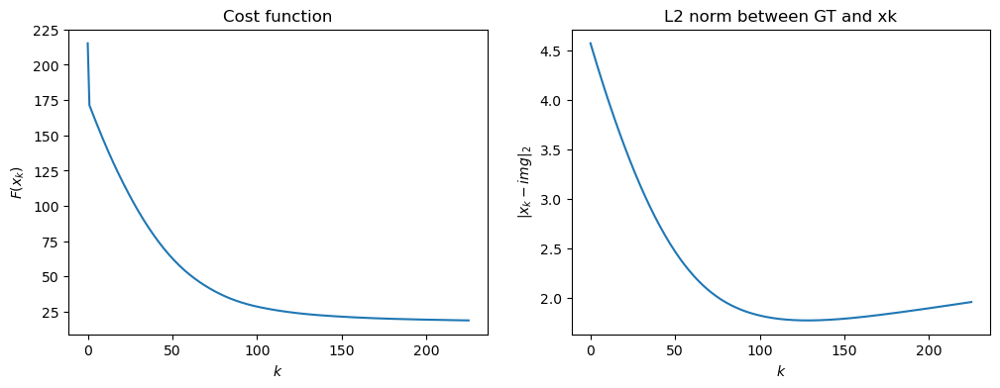

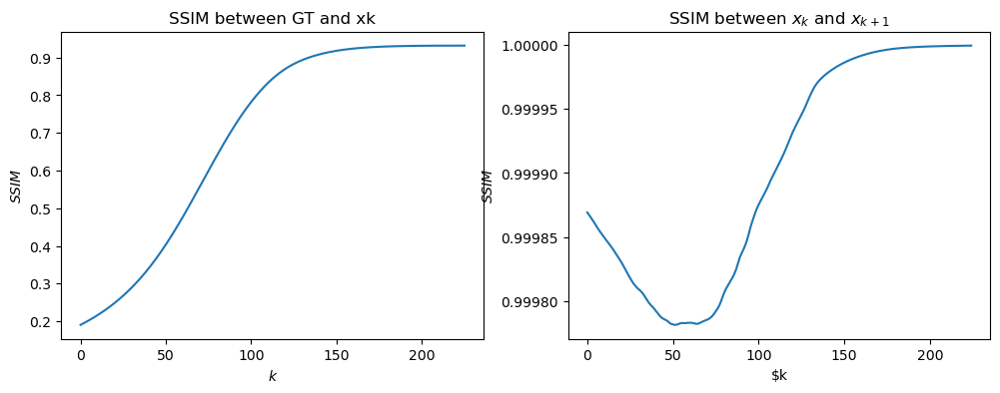

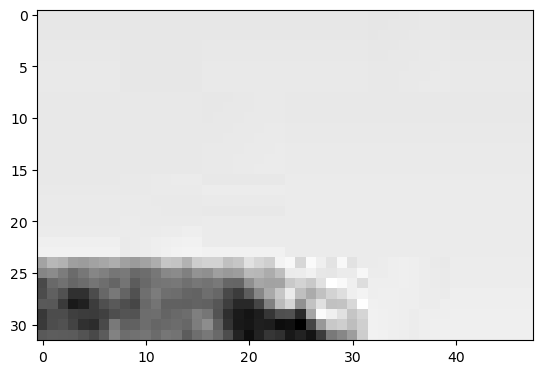

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 219 because of Sequence norm
I got stopped at iteration 245 because of Sequence norm
I got stopped at iteration 239 because of Sequence norm
I got stopped at iteration 239 because of Sequence norm
{-0.1: 0.13010844665491952, 0.1: 0.6254849732707656, 0.3: 0.9272644531718557, 0.5: 0.9248194422289938, 0.7: 0.9224537584745925}
--------
range examined: [0.1 0.2 0.3 0.4 0.5]
I got stopped at iteration 219 because of Sequence norm
I got stopped at iteration 221 because of Sequence norm
I got stopped at iteration 245 because of Sequence norm
I got stopped at iteration 241 because of Sequence norm
I got stopped at iteration 239 because of Sequence norm
{-0.1: 0.13010844665491952, 0.1: 0.6254849732707656, 0.3: 0.9272644531718557, 0.5: 0.9248194422289938, 0.7: 0.9224537584745925, 0.2: 0.9176958089534953, 0.4: 0.9261620660398844}
--------
range examined: [0.2  0.25 0

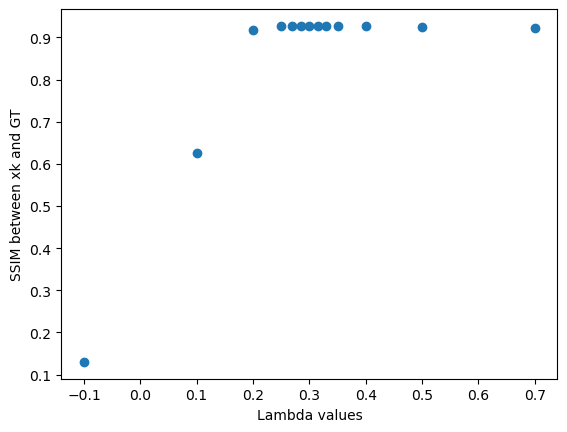

I got stopped at iteration 246 because of Sequence norm


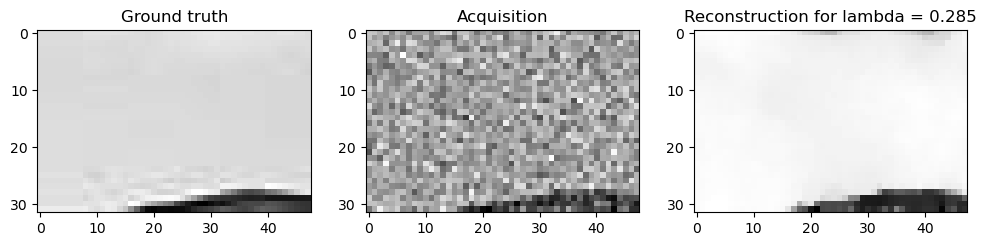

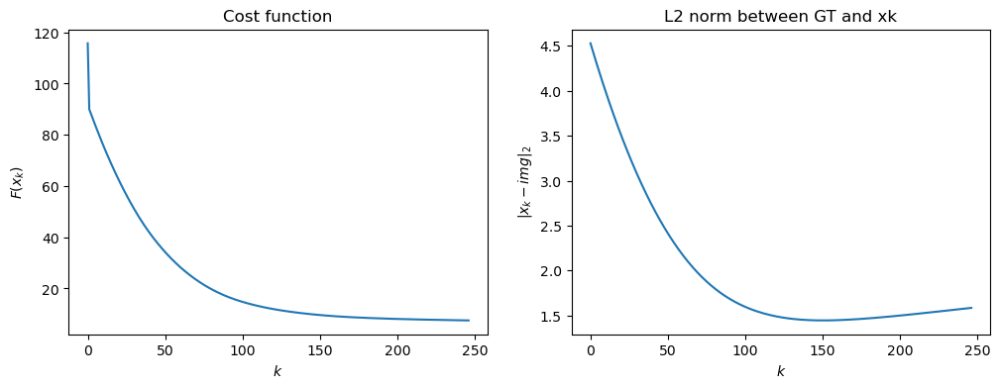

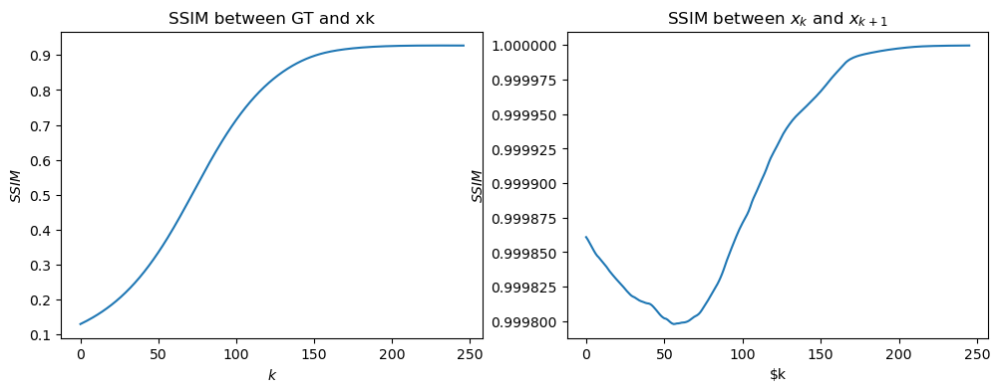

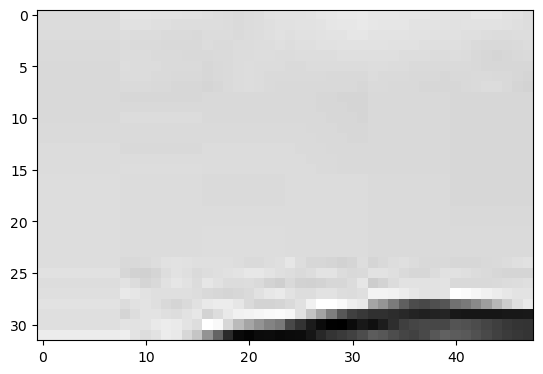

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 197 because of Sequence norm
I got stopped at iteration 260 because of Sequence norm
I got stopped at iteration 302 because of Sequence norm
I got stopped at iteration 323 because of Sequence norm
{-0.1: 0.10106690885768617, 0.1: 0.6399133163173696, 0.3: 0.9345575805659805, 0.5: 0.9218312312962798, 0.7: 0.913710313049829}
--------
range examined: [0.1 0.2 0.3 0.4 0.5]
I got stopped at iteration 197 because of Sequence norm
I got stopped at iteration 246 because of Sequence norm
I got stopped at iteration 260 because of Sequence norm
I got stopped at iteration 283 because of Sequence norm
I got stopped at iteration 302 because of Sequence norm
{-0.1: 0.10106690885768617, 0.1: 0.6399133163173696, 0.3: 0.9345575805659805, 0.5: 0.9218312312962798, 0.7: 0.913710313049829, 0.2: 0.9281461574143681, 0.4: 0.9284157989034545}
--------
range examined: [0.2  0.25 0.3

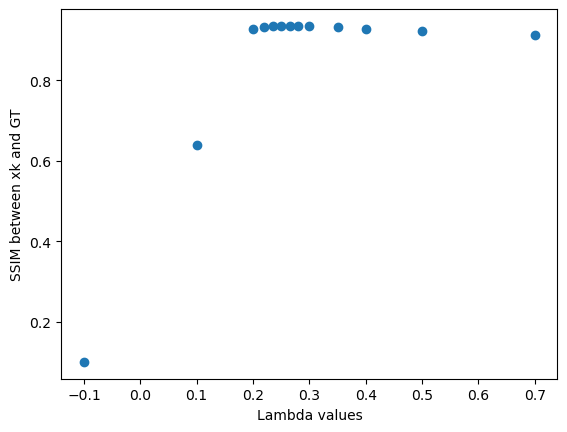

I got stopped at iteration 254 because of Sequence norm


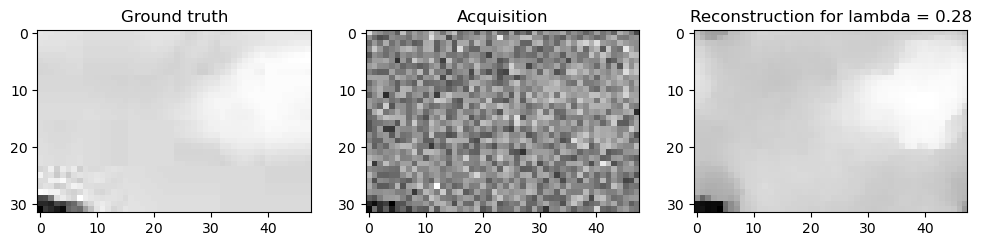

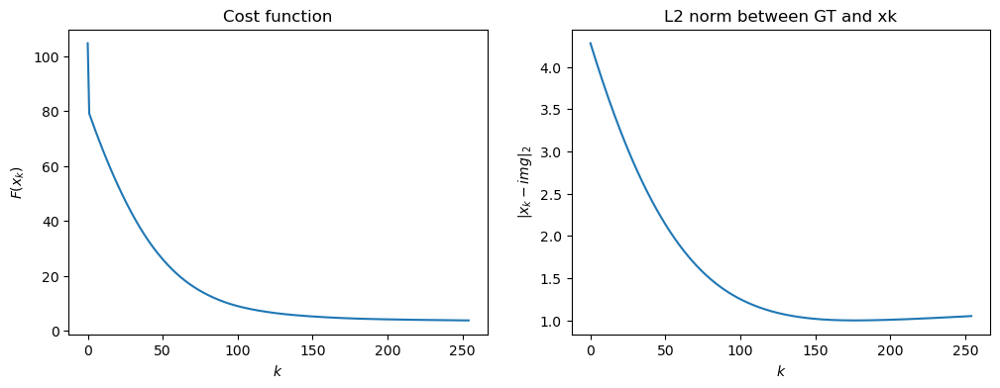

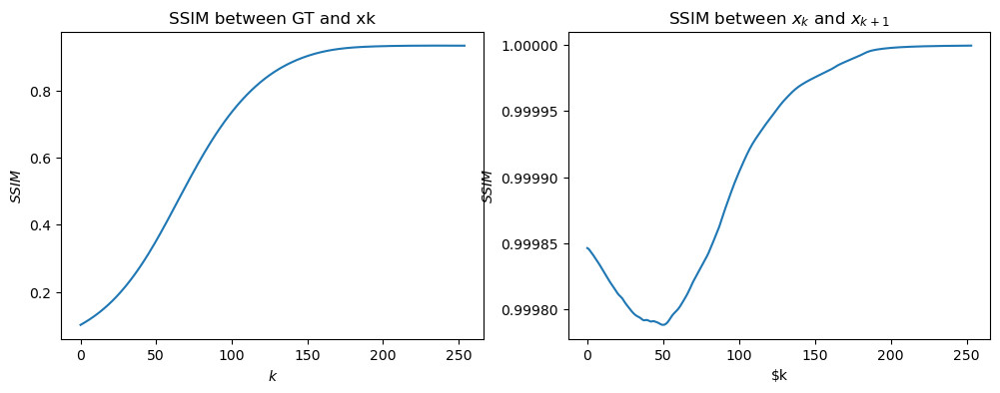

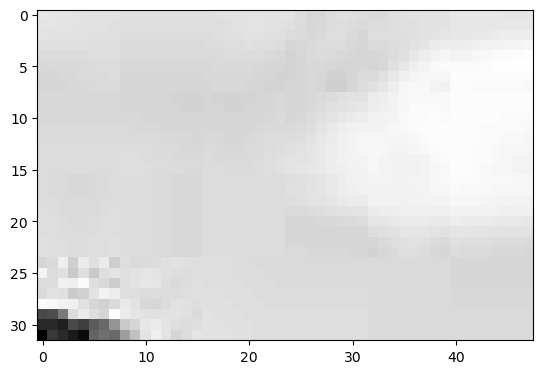

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 190 because of Sequence norm
I got stopped at iteration 244 because of Sequence norm
I got stopped at iteration 221 because of Sequence norm
I got stopped at iteration 212 because of Sequence norm
{-0.1: 0.10215271957724227, 0.1: 0.6581377848520154, 0.3: 0.9417916649338229, 0.5: 0.9365835489784953, 0.7: 0.9333496305209138}
--------
range examined: [0.1 0.2 0.3 0.4 0.5]
I got stopped at iteration 190 because of Sequence norm
I got stopped at iteration 244 because of Sequence norm
I got stopped at iteration 244 because of Sequence norm
I got stopped at iteration 229 because of Sequence norm
I got stopped at iteration 221 because of Sequence norm
{-0.1: 0.10215271957724227, 0.1: 0.6581377848520154, 0.3: 0.9417916649338229, 0.5: 0.9365835489784953, 0.7: 0.9333496305209138, 0.2: 0.9340639754334654, 0.4: 0.939106316421543}
--------
range examined: [0.2  0.25 0.

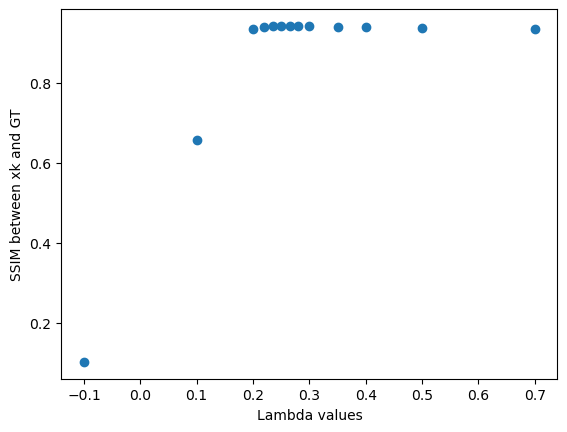

I got stopped at iteration 249 because of Sequence norm


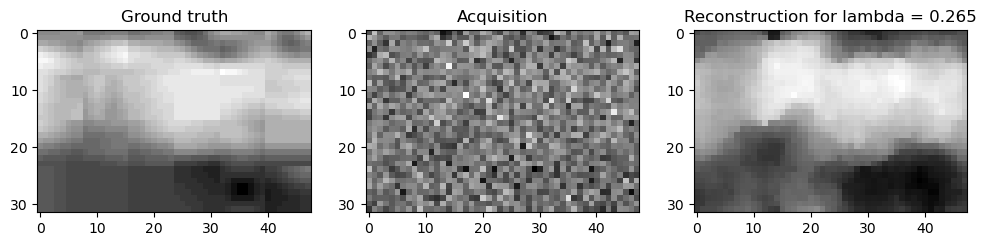

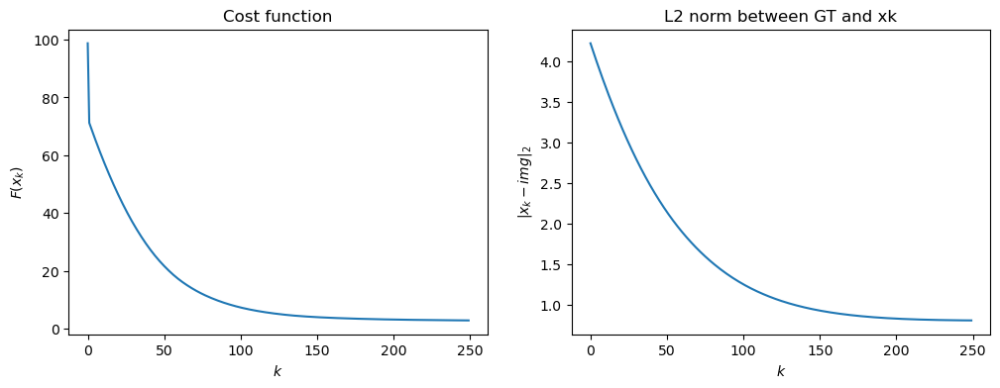

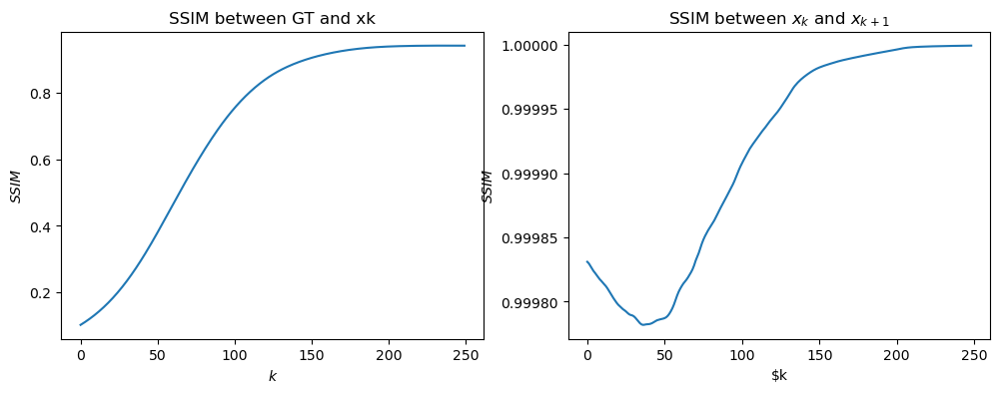

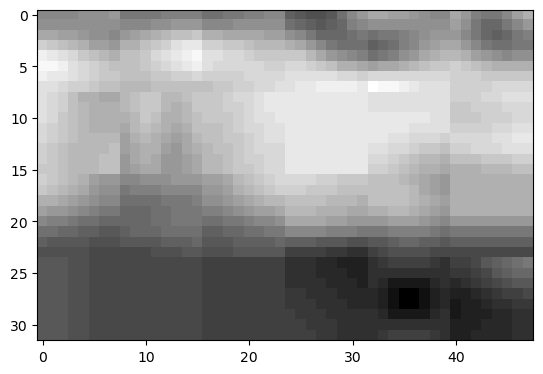

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 199 because of Sequence norm
I got stopped at iteration 241 because of Sequence norm
I got stopped at iteration 236 because of Sequence norm
I got stopped at iteration 230 because of Sequence norm
{-0.1: 0.0932631925319505, 0.1: 0.6647379184938423, 0.3: 0.9044422301945464, 0.5: 0.9045543313585854, 0.7: 0.9039252549298961}
--------
range examined: [0.3 0.4 0.5 0.6 0.7]
I got stopped at iteration 241 because of Sequence norm
I got stopped at iteration 239 because of Sequence norm
I got stopped at iteration 236 because of Sequence norm
I got stopped at iteration 233 because of Sequence norm
I got stopped at iteration 230 because of Sequence norm
{-0.1: 0.0932631925319505, 0.1: 0.6647379184938423, 0.3: 0.9044422301945464, 0.5: 0.9045543313585854, 0.7: 0.9039252549298961, 0.4: 0.9048562103835643, 0.6: 0.9042139671762797}
--------
range examined: [0.3  0.35 0.4

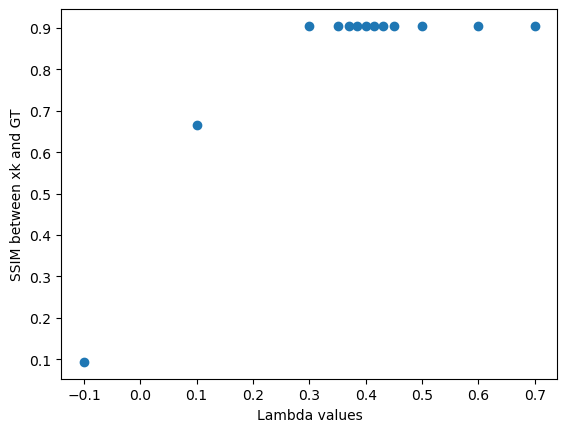

I got stopped at iteration 240 because of Sequence norm


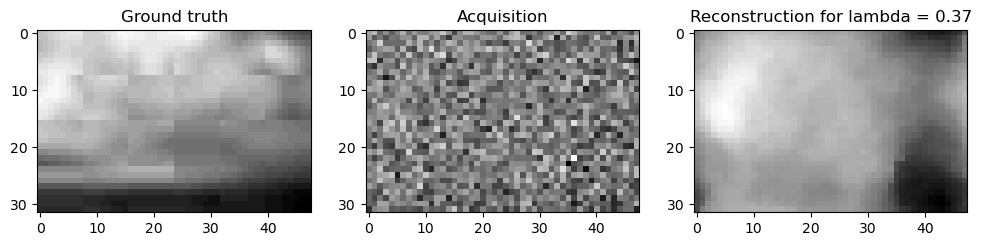

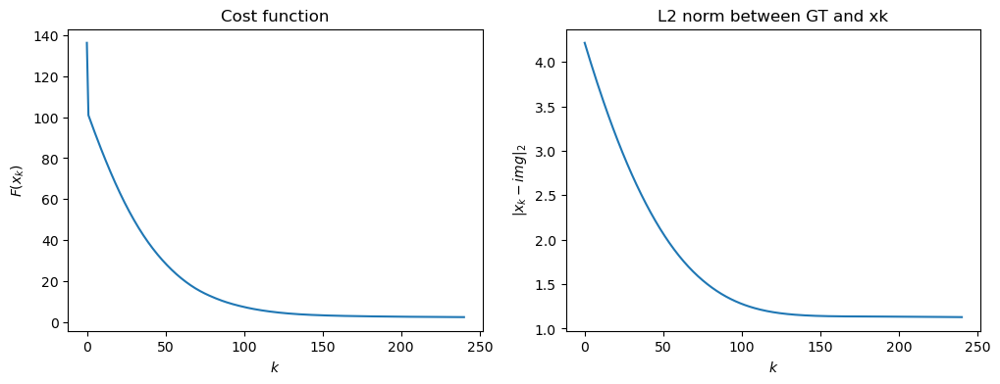

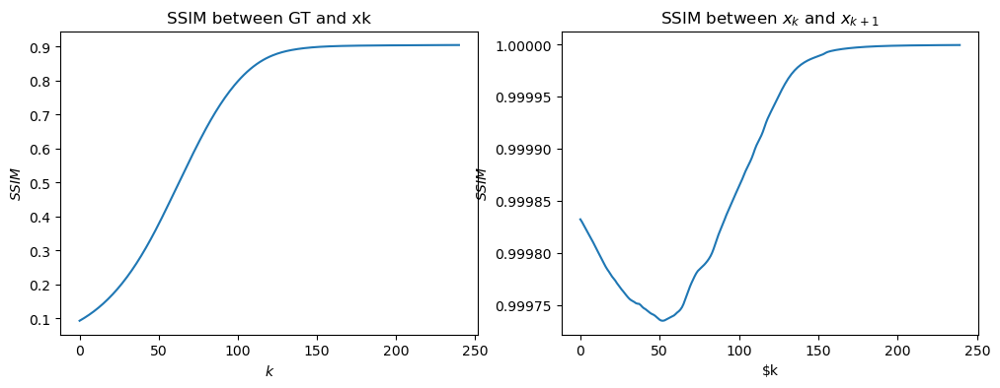

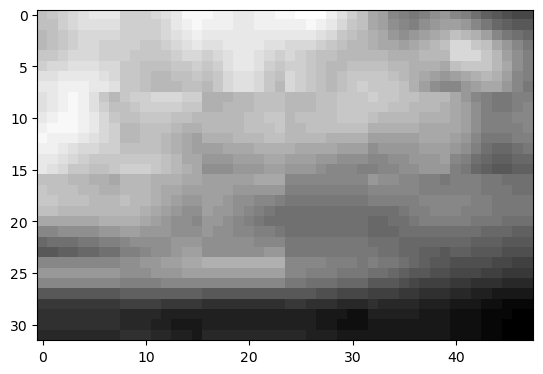

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 211 because of Sequence norm
I got stopped at iteration 239 because of Sequence norm
I got stopped at iteration 251 because of Sequence norm
I got stopped at iteration 257 because of Sequence norm
{-0.1: 0.07249003713325812, 0.1: 0.6411468350876752, 0.3: 0.9474987001852451, 0.5: 0.9451540279029275, 0.7: 0.9414717915290973}
--------
range examined: [0.1 0.2 0.3 0.4 0.5]
I got stopped at iteration 211 because of Sequence norm
I got stopped at iteration 244 because of Sequence norm
I got stopped at iteration 239 because of Sequence norm
I got stopped at iteration 246 because of Sequence norm
I got stopped at iteration 251 because of Sequence norm
{-0.1: 0.07249003713325812, 0.1: 0.6411468350876752, 0.3: 0.9474987001852451, 0.5: 0.9451540279029275, 0.7: 0.9414717915290973, 0.2: 0.9275721999246057, 0.4: 0.9473935537862588}
--------
range examined: [0.2  0.25 0

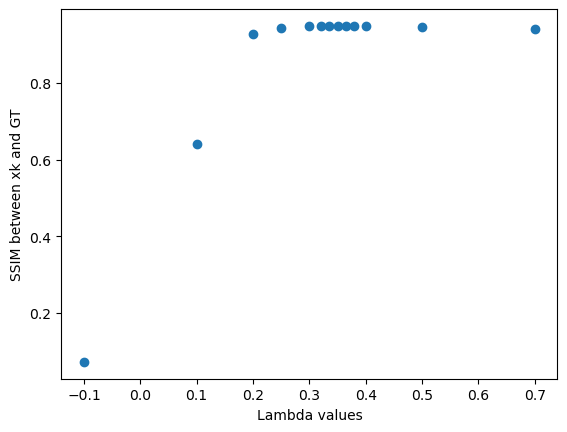

I got stopped at iteration 242 because of Sequence norm


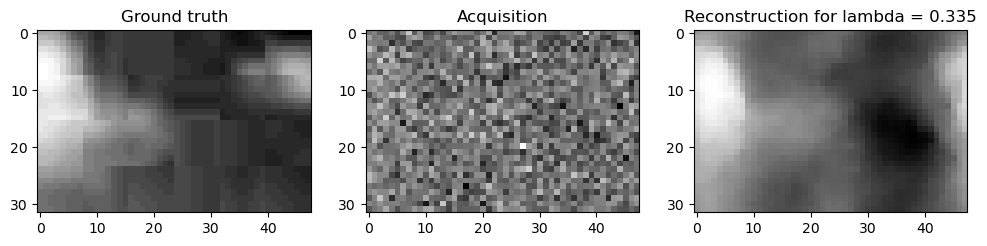

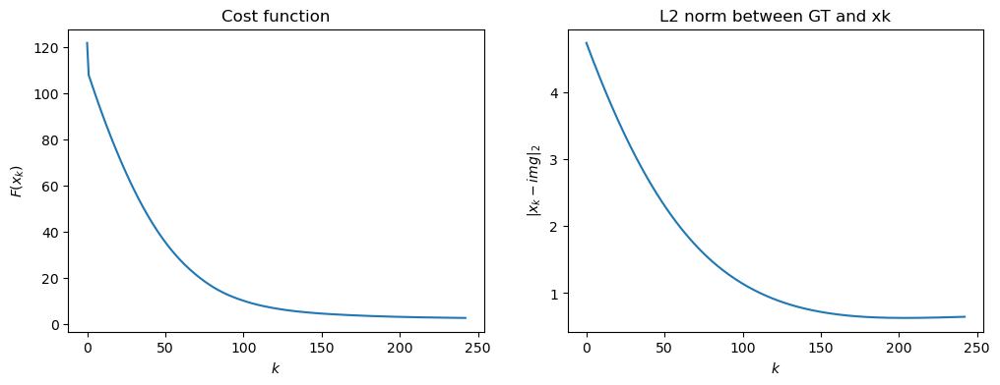

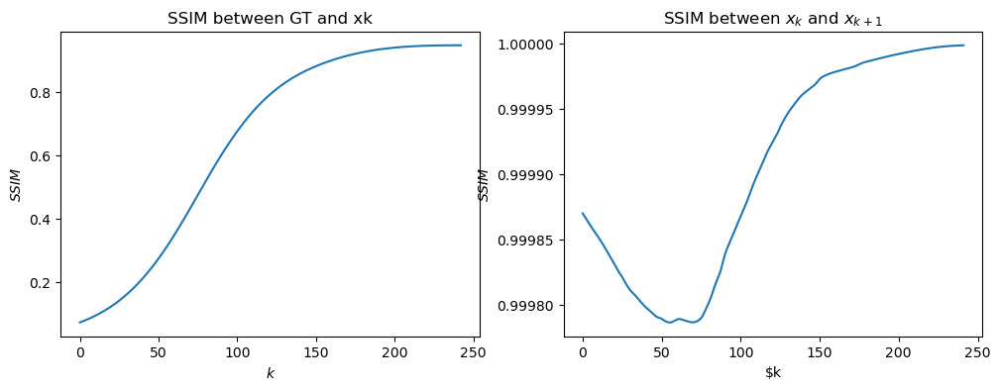

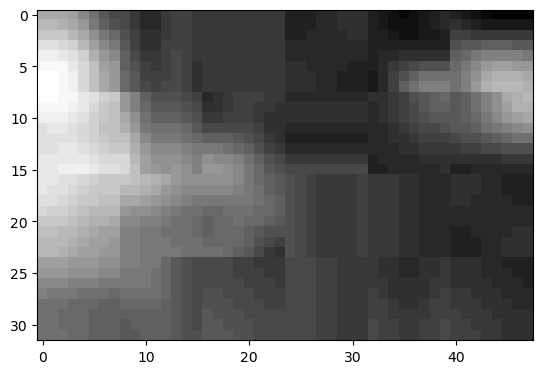

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 219 because of Cost function
I got stopped at iteration 218 because of Cost function
I got stopped at iteration 262 because of Cost function
I got stopped at iteration 326 because of Cost function
{-0.1: 0.23531190392000553, 0.1: 0.656826439674947, 0.3: 0.8502281561096005, 0.5: 0.8459475639550617, 0.7: 0.8347293882505856}
--------
range examined: [0.1 0.2 0.3 0.4 0.5]
I got stopped at iteration 219 because of Cost function
I got stopped at iteration 221 because of Cost function
I got stopped at iteration 218 because of Cost function
I got stopped at iteration 236 because of Cost function
I got stopped at iteration 262 because of Cost function
{-0.1: 0.23531190392000553, 0.1: 0.656826439674947, 0.3: 0.8502281561096005, 0.5: 0.8459475639550617, 0.7: 0.8347293882505856, 0.2: 0.8411639057457537, 0.4: 0.8496089850878735}
--------
range examined: [0.2  0.25 0.3

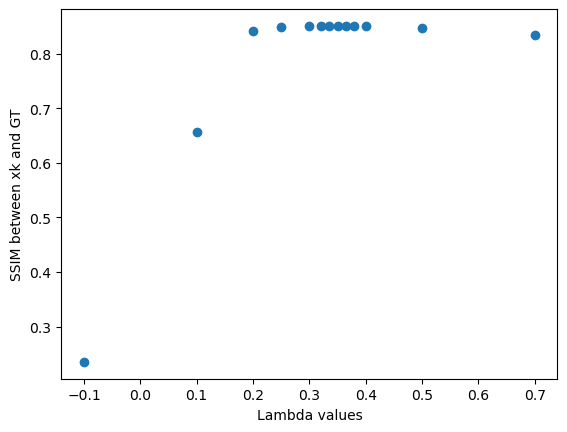

I got stopped at iteration 222 because of Cost function


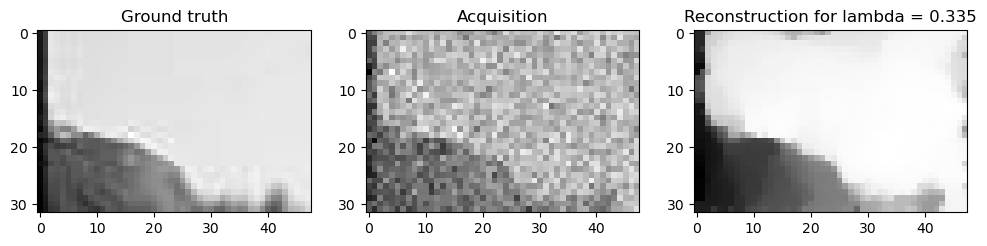

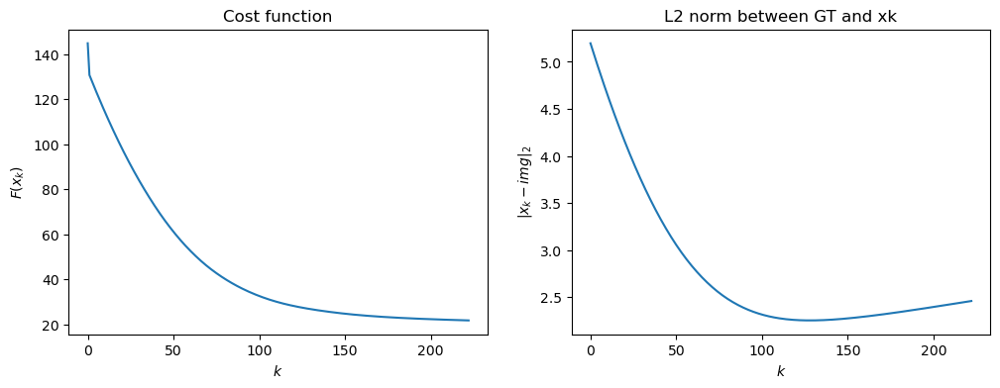

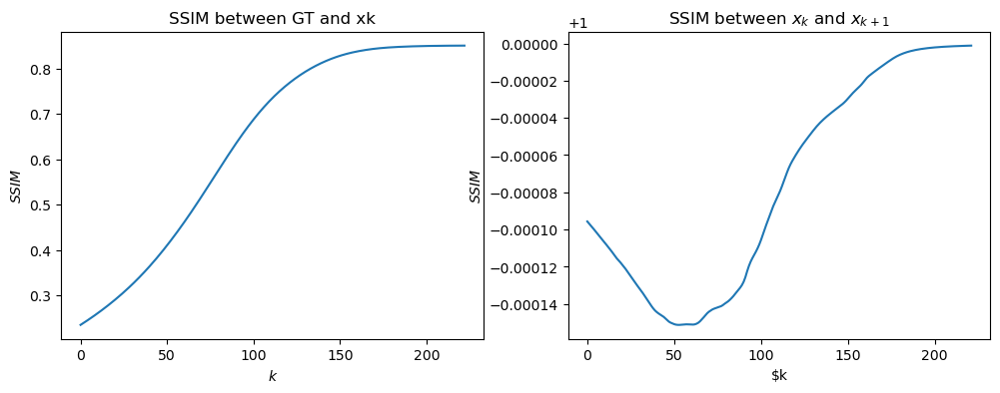

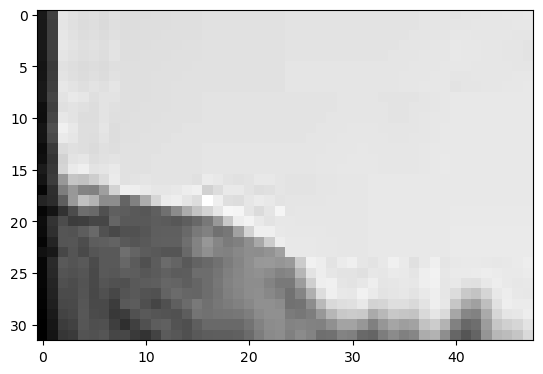

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 208 because of Cost function
I got stopped at iteration 230 because of Cost function
I got stopped at iteration 253 because of Cost function
I got stopped at iteration 281 because of Cost function
{-0.1: 0.44221627334282737, 0.1: 0.7052061559438078, 0.3: 0.7650214195546194, 0.5: 0.7380739136370403, 0.7: 0.7115139074438024}
--------
range examined: [0.1 0.2 0.3 0.4 0.5]
I got stopped at iteration 208 because of Cost function
I got stopped at iteration 225 because of Cost function
I got stopped at iteration 230 because of Cost function
I got stopped at iteration 242 because of Cost function
I got stopped at iteration 253 because of Cost function
{-0.1: 0.44221627334282737, 0.1: 0.7052061559438078, 0.3: 0.7650214195546194, 0.5: 0.7380739136370403, 0.7: 0.7115139074438024, 0.2: 0.7741104144170486, 0.4: 0.7509434603115058}
--------
range examined: [0.1  0.15 0

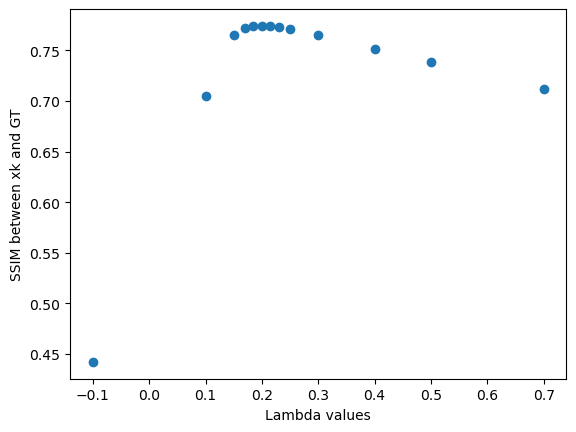

I got stopped at iteration 225 because of Cost function


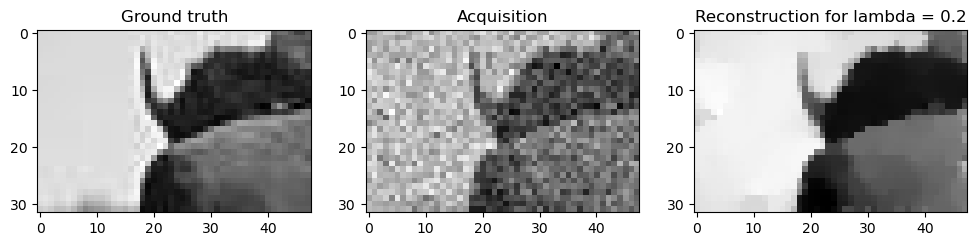

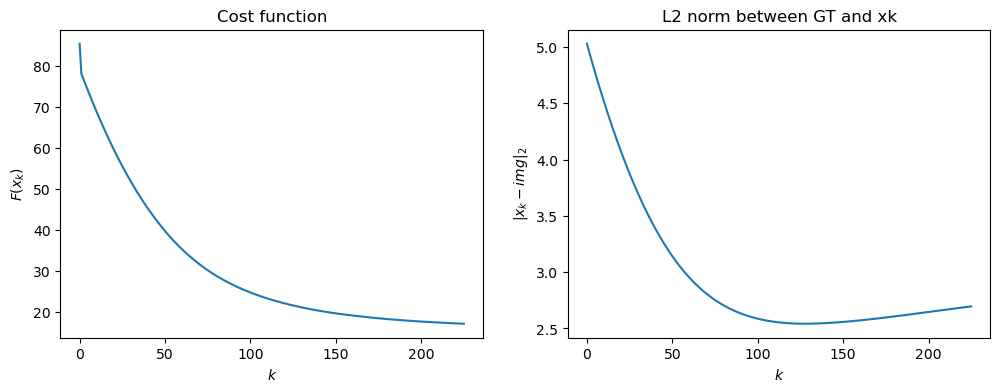

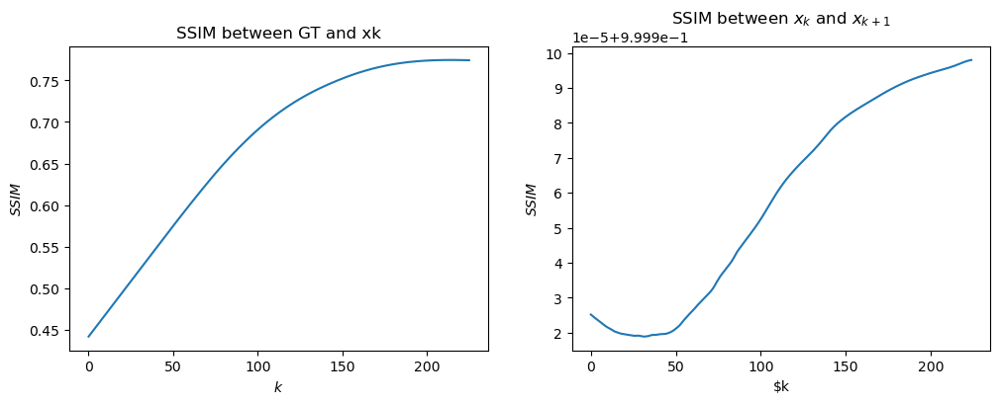

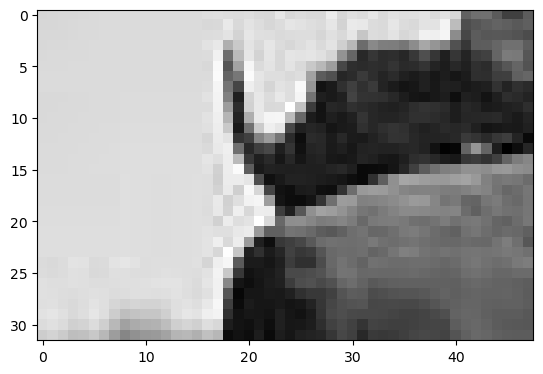

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 250 because of Cost function
I got stopped at iteration 304 because of Cost function
I got stopped at iteration 361 because of Cost function
{-0.1: 0.29367690885329567, 0.1: 0.6657735379385692, 0.3: 0.5707977522433295, 0.5: 0.5139053382302972, 0.7: 0.4768062318145186}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm


C:\Users\Claudio\AppData\Local\Temp\ipykernel_17196\3848196698.py:46: RuntimeWarning: invalid value encountered in scalar divide
  if np.abs(cost[k] - cost[k-1]) / cost[k] < 10 * stopping_threshold:


I got stopped at iteration 250 because of Cost function
I got stopped at iteration 291 because of Cost function
I got stopped at iteration 304 because of Cost function
{-0.1: 0.29367690885329567, 0.1: 0.6657735379385692, 0.3: 0.5707977522433295, 0.5: 0.5139053382302972, 0.7: 0.4768062318145186, 0.0: 0.2901266876742382, 0.2: 0.6104020898866949}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 143 because of Cost function
I got stopped at iteration 250 because of Cost function
I got stopped at iteration 280 because of Cost function
I got stopped at iteration 291 because of Cost function
{-0.1: 0.29367690885329567, 0.1: 0.6657735379385692, 0.3: 0.5707977522433295, 0.5: 0.5139053382302972, 0.7: 0.4768062318145186, 0.0: 0.2901266876742382, 0.2: 0.6104020898866949, 0.05: 0.5145787590259281, 0.15: 0.6441897390180775}
--------
range examined: [0.07  0.085 0.1   0.115 0.13 ]
I got stopped at iteration 197 becaus

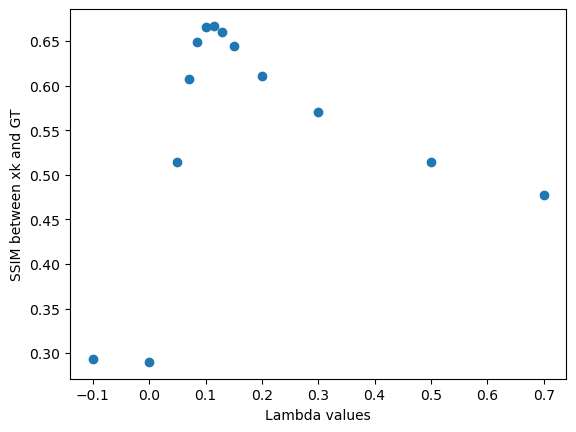

I got stopped at iteration 261 because of Cost function


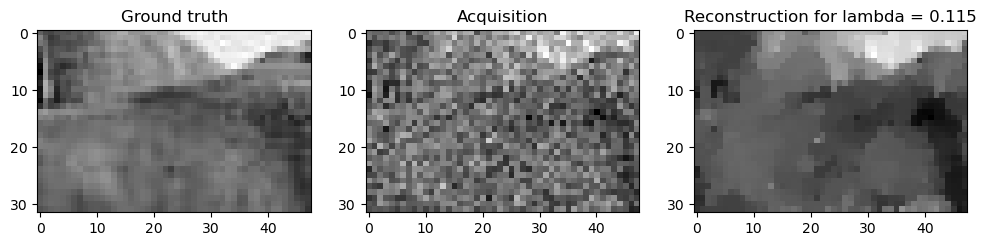

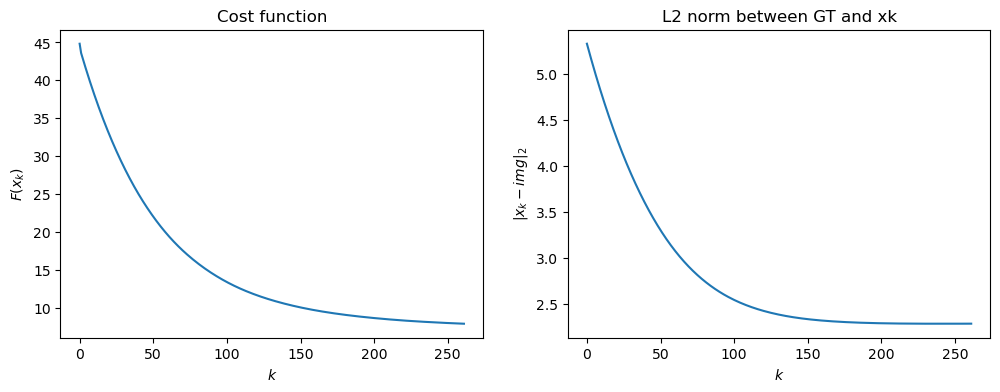

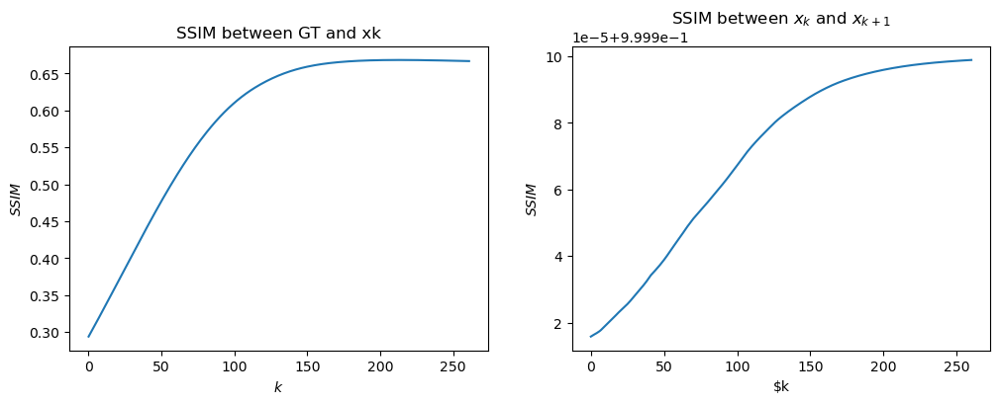

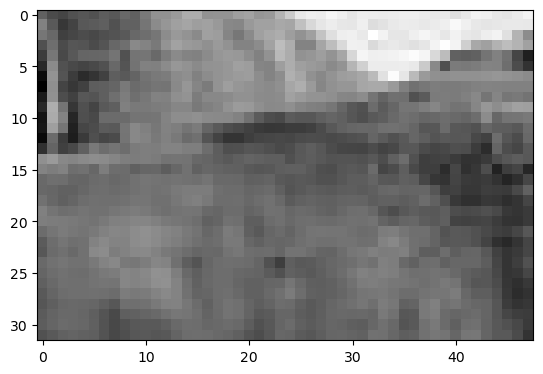

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 254 because of Cost function
{-0.1: 0.367823612779078, 0.1: 0.6621673615903082, 0.3: 0.43885856241010424, 0.5: 0.36946982664321504, 0.7: 0.3399082789214022}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 254 because of Cost function
I got stopped at iteration 380 because of Cost function
{-0.1: 0.367823612779078, 0.1: 0.6621673615903082, 0.3: 0.43885856241010424, 0.5: 0.36946982664321504, 0.7: 0.3399082789214022, 0.0: 0.364356261115536, 0.2: 0.5329316532260115}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 140 because of Cost function
I got stopped at iteration 254 because of Cost function
I got stopped at iteration 324 because of C

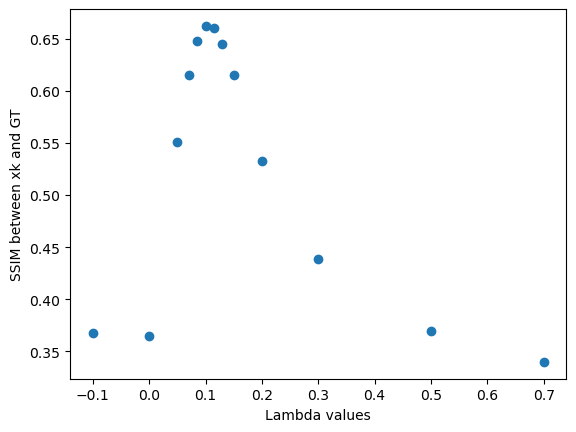

I got stopped at iteration 254 because of Cost function


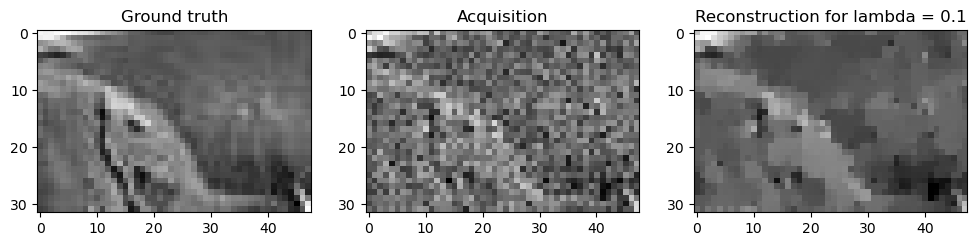

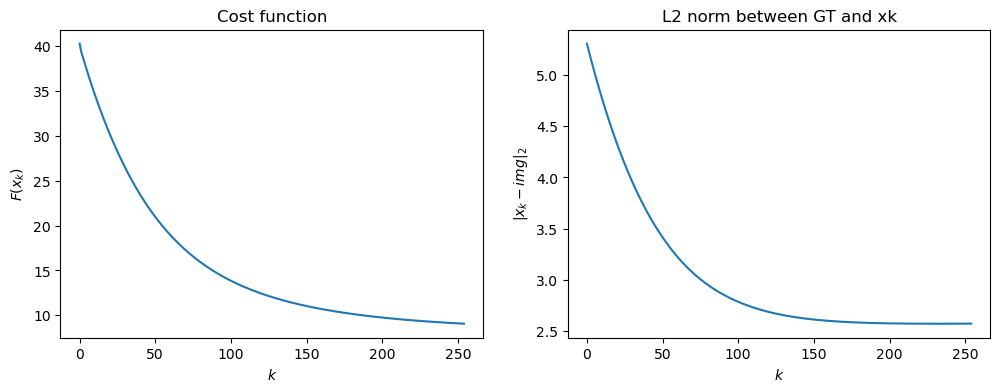

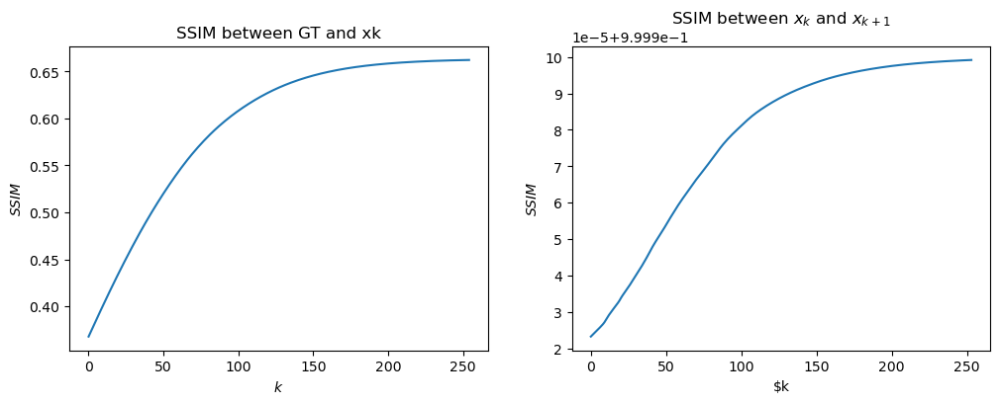

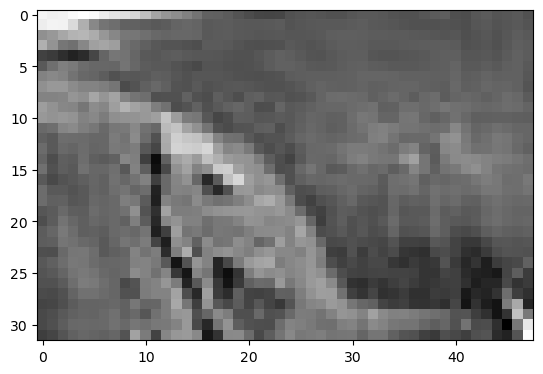

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 230 because of Cost function
I got stopped at iteration 302 because of Cost function
I got stopped at iteration 348 because of Cost function
{-0.1: 0.37149990461041094, 0.1: 0.7125377250407678, 0.3: 0.5862390233403293, 0.5: 0.5201207607405848, 0.7: 0.4761690930002181}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 230 because of Cost function
I got stopped at iteration 278 because of Cost function
I got stopped at iteration 302 because of Cost function
{-0.1: 0.37149990461041094, 0.1: 0.7125377250407678, 0.3: 0.5862390233403293, 0.5: 0.5201207607405848, 0.7: 0.4761690930002181, 0.0: 0.3670098192604264, 0.2: 0.6422297343219197}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of 

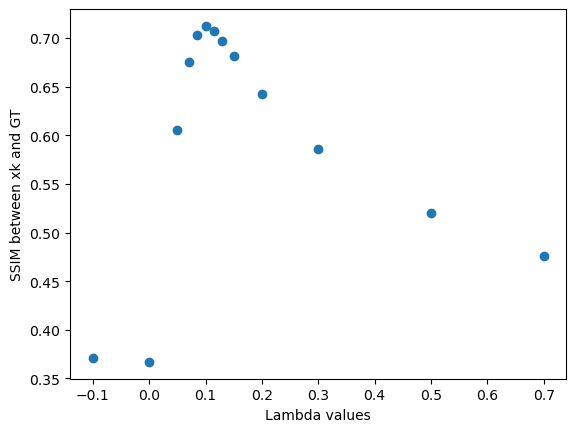

I got stopped at iteration 230 because of Cost function


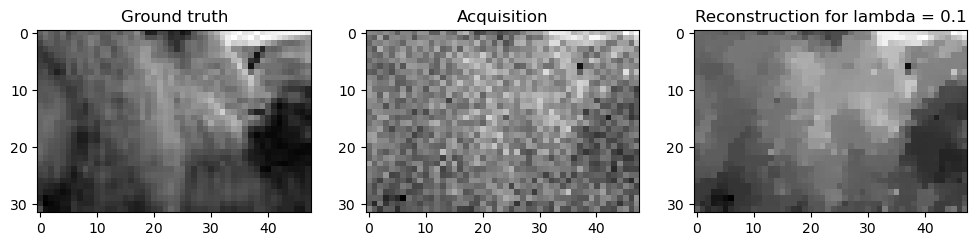

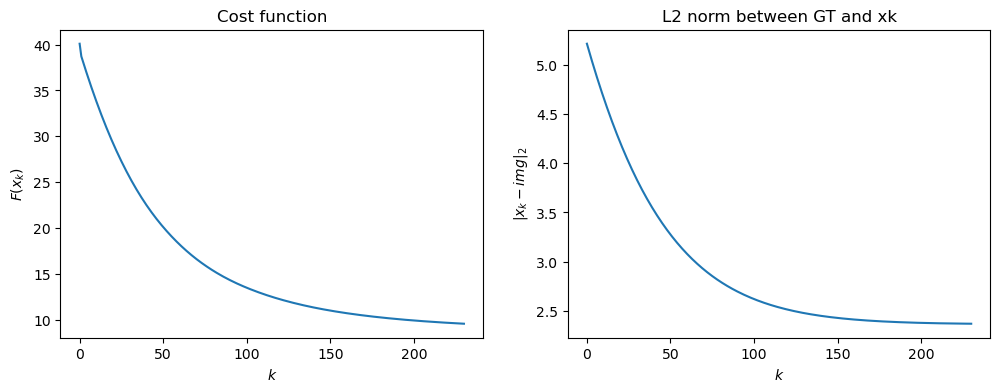

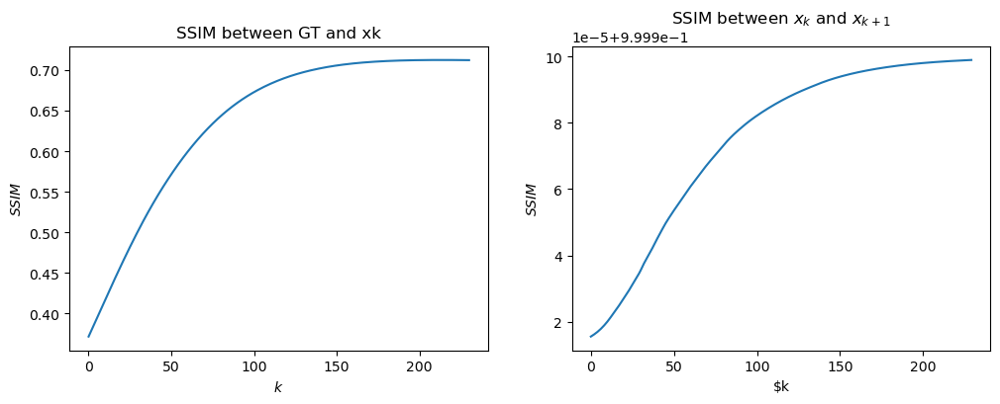

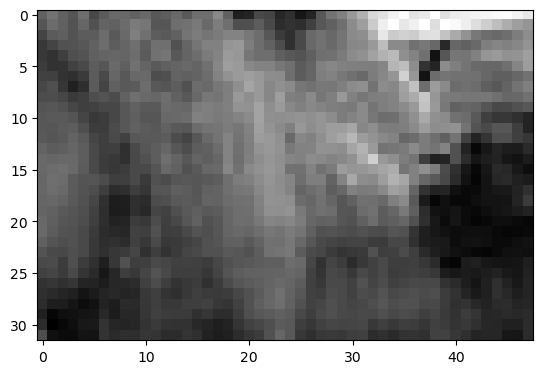

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 252 because of Cost function
I got stopped at iteration 358 because of Cost function
{-0.1: 0.36057306195029626, 0.1: 0.6728291157820397, 0.3: 0.5491839896279067, 0.5: 0.47754380582097883, 0.7: 0.4484643567455269}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 252 because of Cost function
I got stopped at iteration 321 because of Cost function
I got stopped at iteration 358 because of Cost function
{-0.1: 0.36057306195029626, 0.1: 0.6728291157820397, 0.3: 0.5491839896279067, 0.5: 0.47754380582097883, 0.7: 0.4484643567455269, 0.0: 0.35705590639661466, 0.2: 0.6137375140107301}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 138 because 

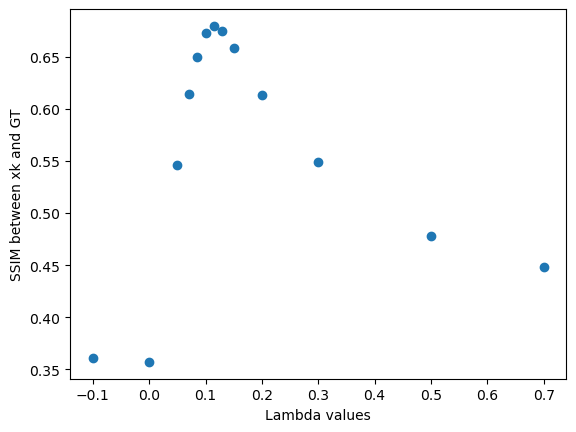

I got stopped at iteration 275 because of Cost function


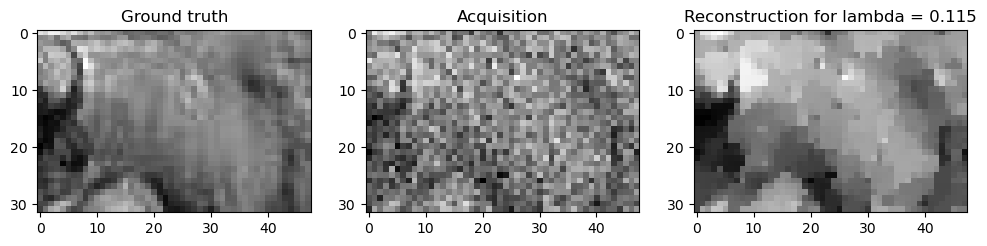

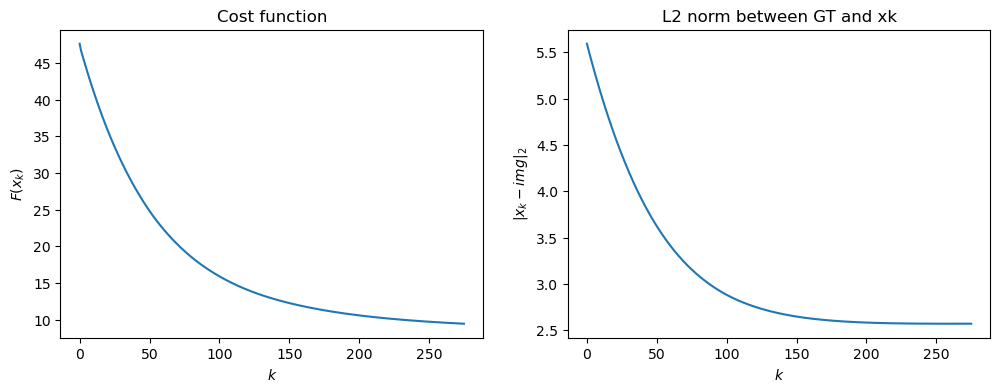

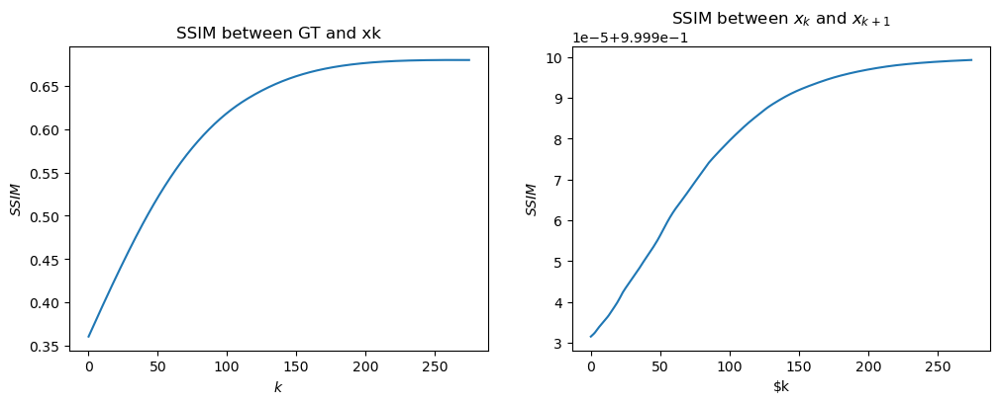

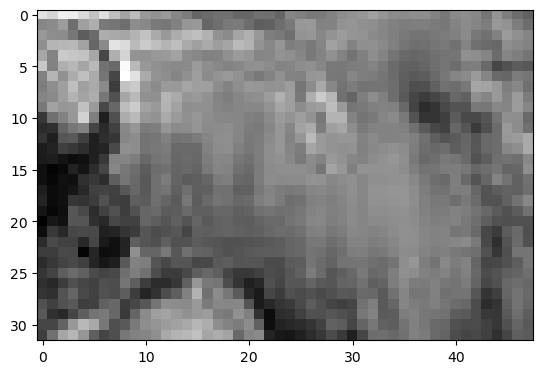

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 201 because of Cost function
I got stopped at iteration 236 because of Cost function
I got stopped at iteration 247 because of Cost function
I got stopped at iteration 249 because of Cost function
{-0.1: 0.4880284074804223, 0.1: 0.7214958213108664, 0.3: 0.6608790044083145, 0.5: 0.6312915569807854, 0.7: 0.6186969357353584}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 201 because of Cost function
I got stopped at iteration 224 because of Cost function
I got stopped at iteration 236 because of Cost function
{-0.1: 0.4880284074804223, 0.1: 0.7214958213108664, 0.3: 0.6608790044083145, 0.5: 0.6312915569807854, 0.7: 0.6186969357353584, 0.0: 0.48464050528541336, 0.2: 0.6920546002009756}
--------
range examined: [0.   0.05 0

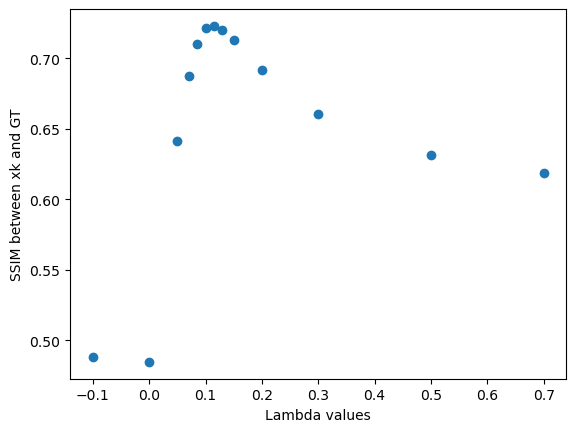

I got stopped at iteration 210 because of Cost function


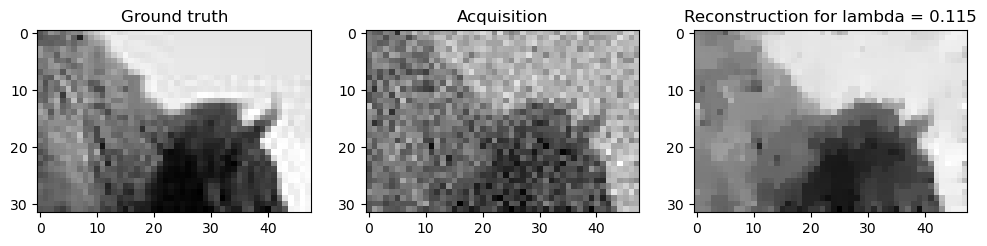

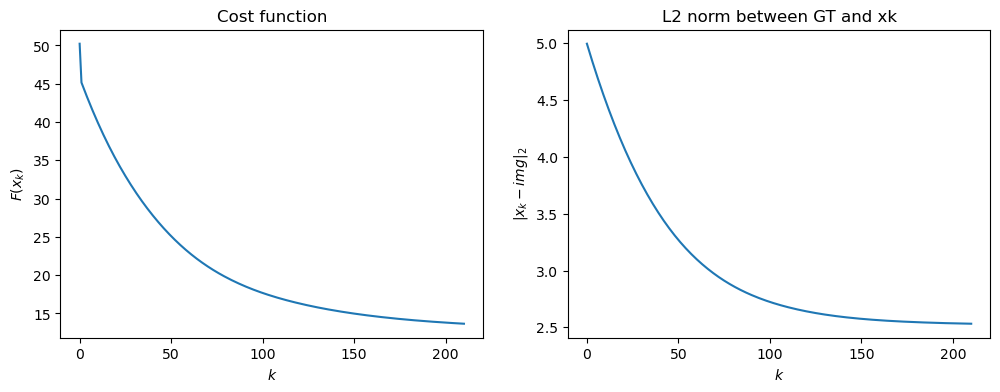

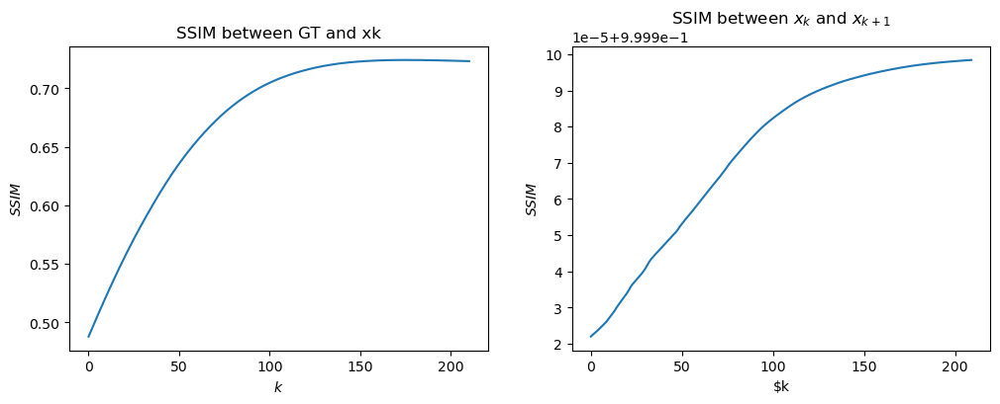

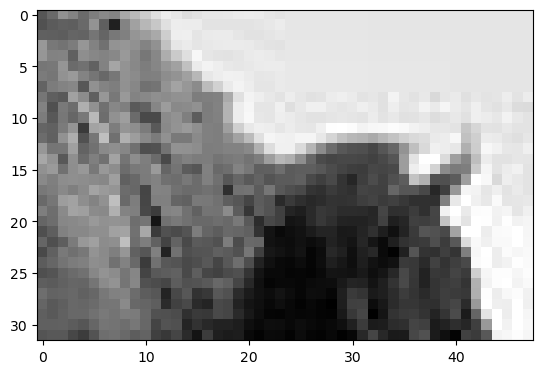

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 200 because of Sequence norm
I got stopped at iteration 233 because of Sequence norm
I got stopped at iteration 232 because of Sequence norm
I got stopped at iteration 235 because of Sequence norm
{-0.1: 0.10975049547018856, 0.1: 0.6529425735032259, 0.3: 0.9275315260093661, 0.5: 0.9241525537884034, 0.7: 0.9199790404405813}
--------
range examined: [0.1 0.2 0.3 0.4 0.5]
I got stopped at iteration 200 because of Sequence norm
I got stopped at iteration 230 because of Sequence norm
I got stopped at iteration 233 because of Sequence norm
I got stopped at iteration 230 because of Sequence norm
I got stopped at iteration 232 because of Sequence norm
{-0.1: 0.10975049547018856, 0.1: 0.6529425735032259, 0.3: 0.9275315260093661, 0.5: 0.9241525537884034, 0.7: 0.9199790404405813, 0.2: 0.9113244835464916, 0.4: 0.9265616914397253}
--------
range examined: [0.2  0.25 0

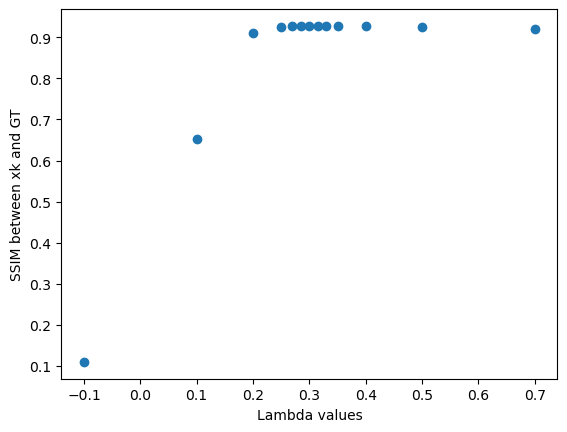

I got stopped at iteration 232 because of Sequence norm


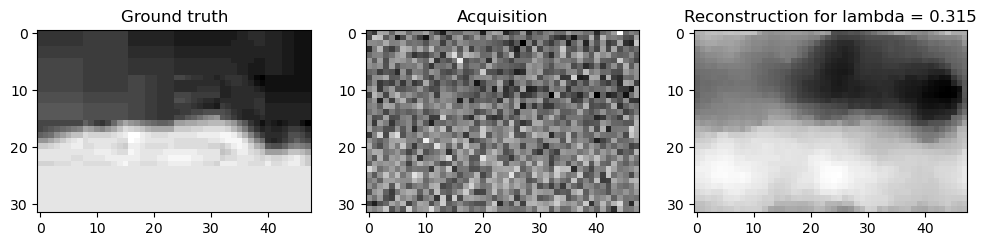

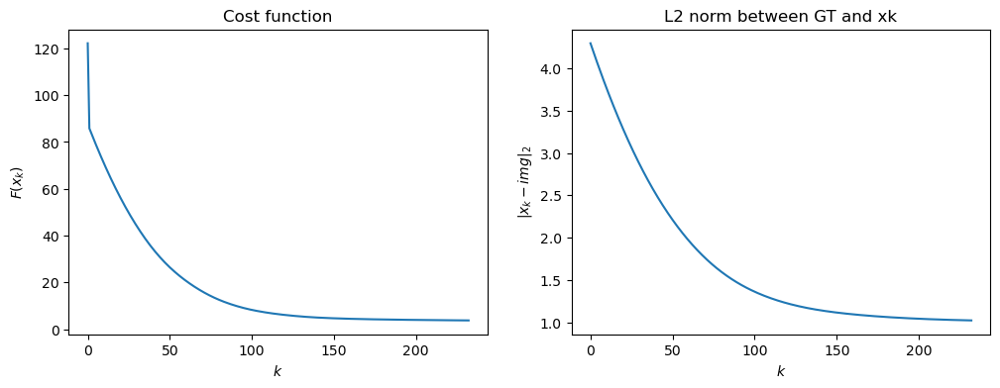

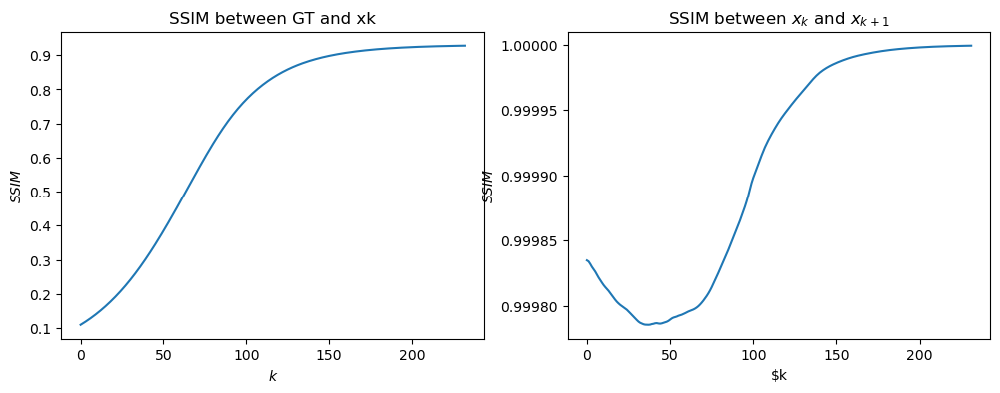

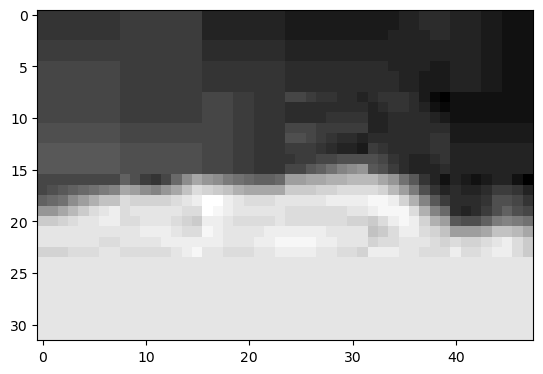

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 204 because of Sequence norm
I got stopped at iteration 200 because of Sequence norm
I got stopped at iteration 191 because of Sequence norm
I got stopped at iteration 192 because of Sequence norm
{-0.1: 0.0818132531232478, 0.1: 0.694672390568286, 0.3: 0.9441439676482442, 0.5: 0.9437652382459923, 0.7: 0.9426200725018552}
--------
range examined: [0.1 0.2 0.3 0.4 0.5]
I got stopped at iteration 204 because of Sequence norm
I got stopped at iteration 210 because of Sequence norm
I got stopped at iteration 200 because of Sequence norm
I got stopped at iteration 193 because of Sequence norm
I got stopped at iteration 191 because of Sequence norm
{-0.1: 0.0818132531232478, 0.1: 0.694672390568286, 0.3: 0.9441439676482442, 0.5: 0.9437652382459923, 0.7: 0.9426200725018552, 0.2: 0.9330621398846533, 0.4: 0.9443475268922226}
--------
range examined: [0.3  0.35 0.4  

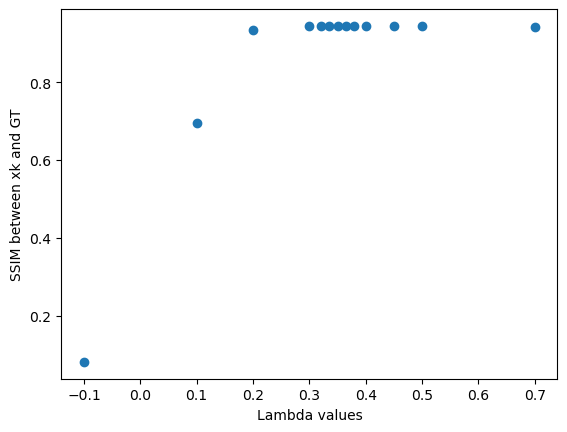

I got stopped at iteration 197 because of Sequence norm


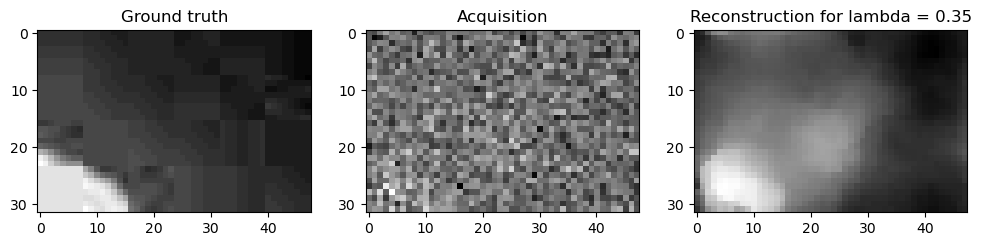

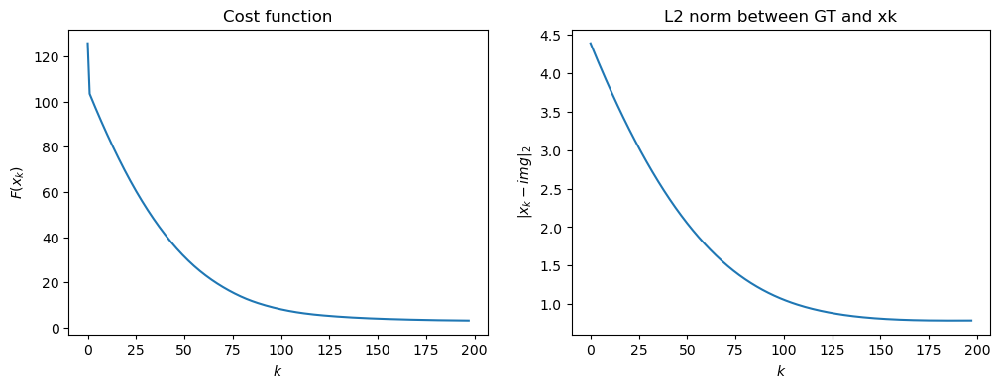

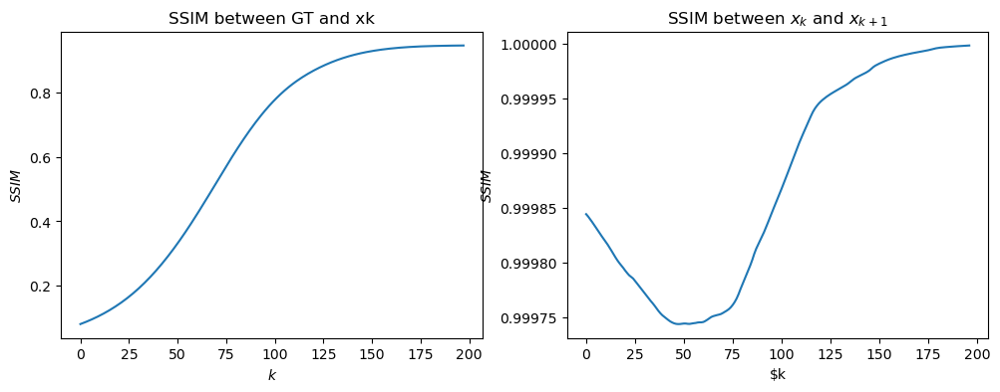

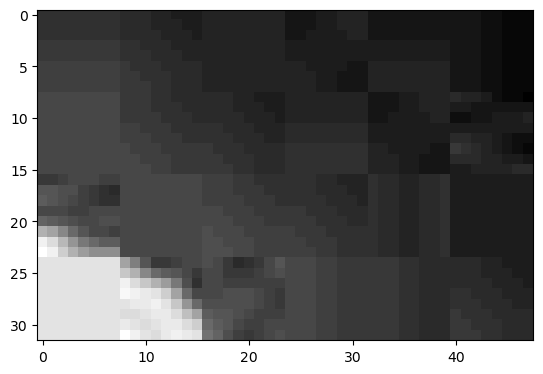

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 223 because of Sequence norm
I got stopped at iteration 204 because of Sequence norm
I got stopped at iteration 191 because of Sequence norm
I got stopped at iteration 185 because of Sequence norm
{-0.1: 0.06200661750653338, 0.1: 0.6740848569612775, 0.3: 0.9729289244142938, 0.5: 0.9781034774955915, 0.7: 0.9792419136867471}
--------
range examined: [0.5 0.6 0.7 0.8 0.9]
I got stopped at iteration 191 because of Sequence norm
I got stopped at iteration 188 because of Sequence norm
I got stopped at iteration 185 because of Sequence norm
I got stopped at iteration 184 because of Sequence norm
I got stopped at iteration 182 because of Sequence norm
{-0.1: 0.06200661750653338, 0.1: 0.6740848569612775, 0.3: 0.9729289244142938, 0.5: 0.9781034774955915, 0.7: 0.9792419136867471, 0.6: 0.9789139997081047, 0.8: 0.979664165412519, 0.9: 0.9797536158290399}
--------
rang

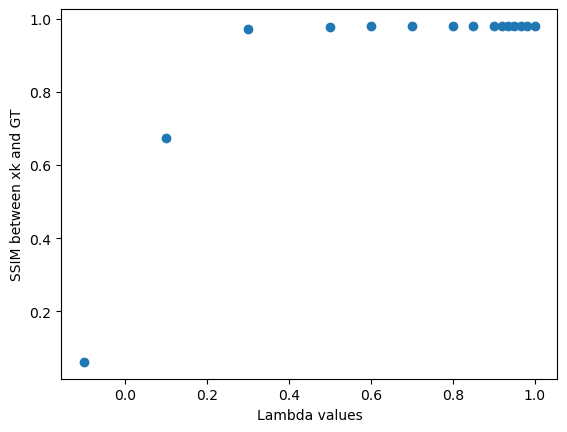

I got stopped at iteration 182 because of Sequence norm


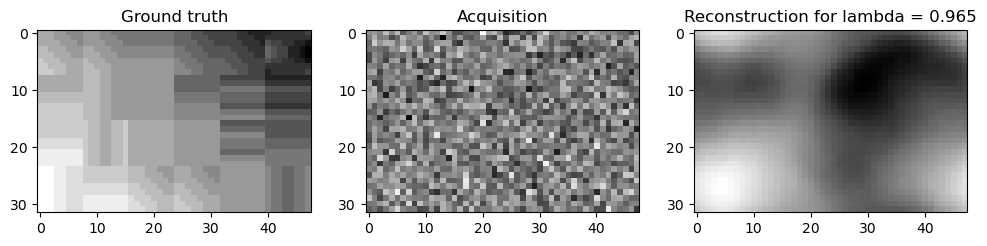

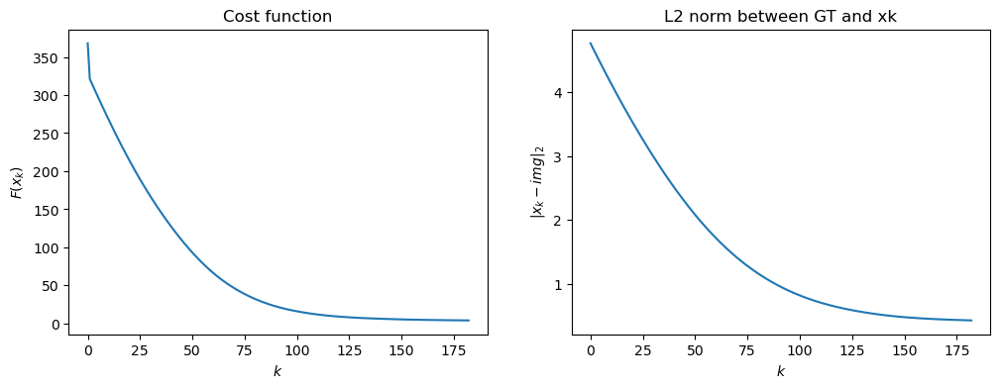

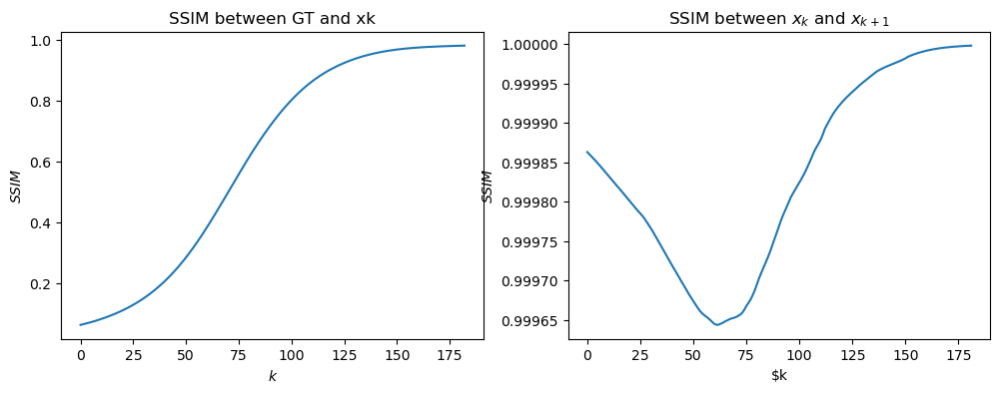

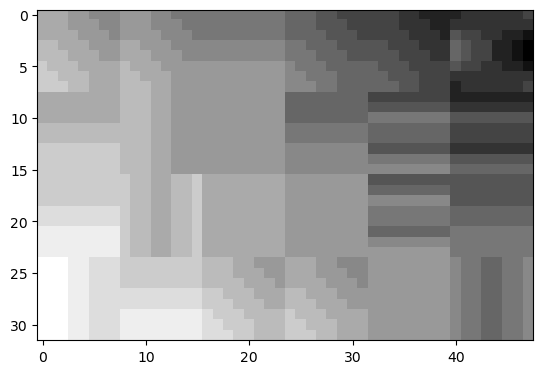

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 237 because of Cost function
I got stopped at iteration 316 because of Cost function
I got stopped at iteration 370 because of Cost function
{-0.1: 0.281675347936951, 0.1: 0.6768351483437269, 0.3: 0.5245524518118264, 0.5: 0.44458352859975186, 0.7: 0.40623348251826824}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 237 because of Cost function
I got stopped at iteration 293 because of Cost function
I got stopped at iteration 316 because of Cost function
{-0.1: 0.281675347936951, 0.1: 0.6768351483437269, 0.3: 0.5245524518118264, 0.5: 0.44458352859975186, 0.7: 0.40623348251826824, 0.0: 0.27772085173650757, 0.2: 0.5969262156479562}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of

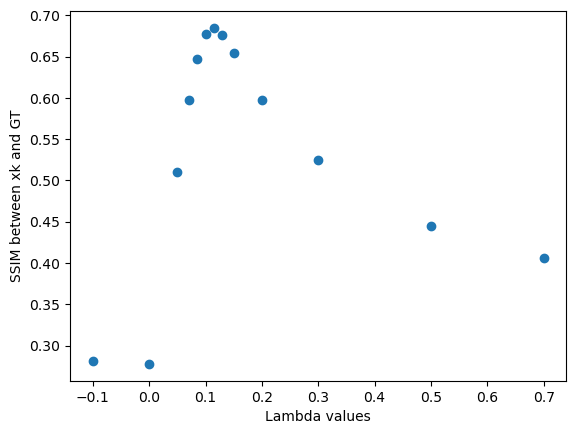

I got stopped at iteration 253 because of Cost function


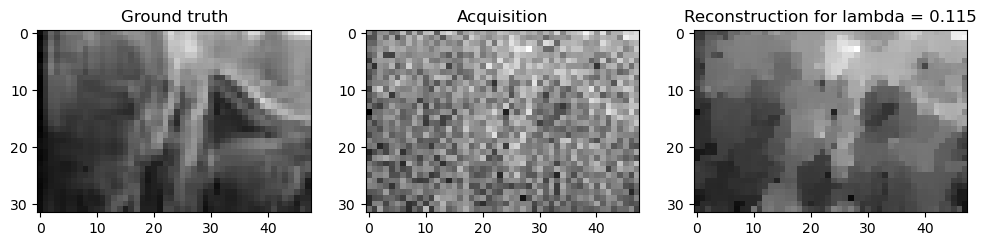

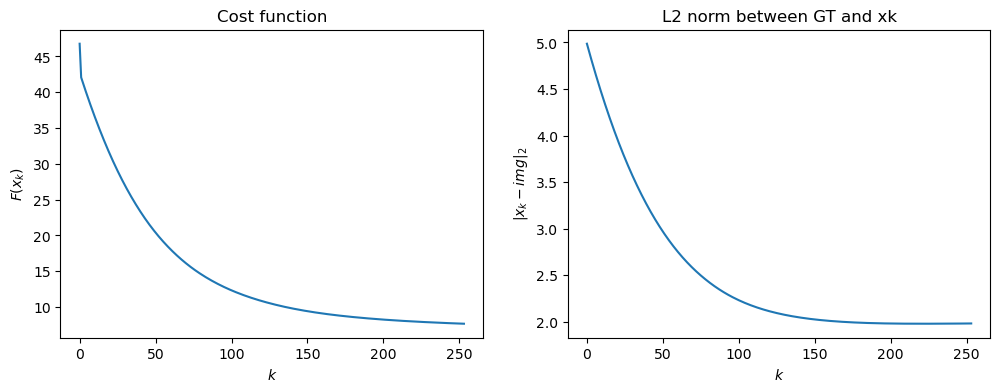

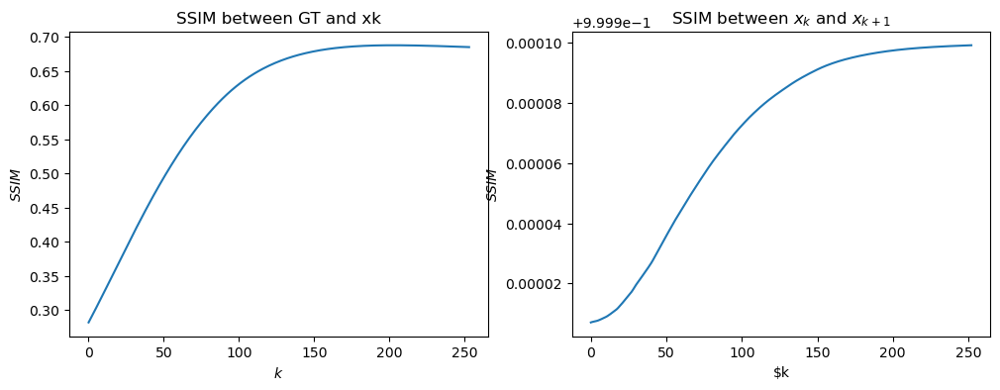

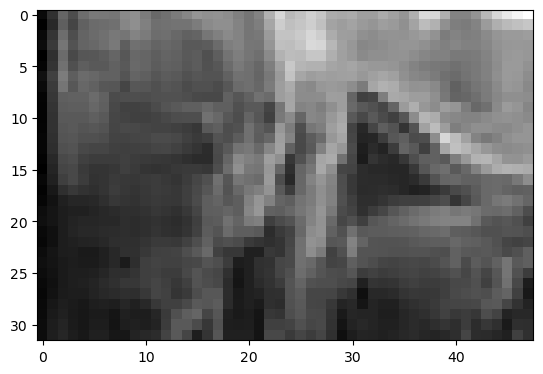

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 229 because of Cost function
I got stopped at iteration 274 because of Cost function
I got stopped at iteration 353 because of Cost function
{-0.1: 0.3293565432695569, 0.1: 0.717182968624525, 0.3: 0.6887034534785502, 0.5: 0.6342141816433414, 0.7: 0.5980046419418387}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 229 because of Cost function
I got stopped at iteration 251 because of Cost function
I got stopped at iteration 274 because of Cost function
{-0.1: 0.3293565432695569, 0.1: 0.717182968624525, 0.3: 0.6887034534785502, 0.5: 0.6342141816433414, 0.7: 0.5980046419418387, 0.0: 0.325889374196569, 0.2: 0.7184580111090796}
--------
range examined: [0.1  0.15 0.2  0.25 0.3 ]
I got stopped at iteration 229 because of Cos

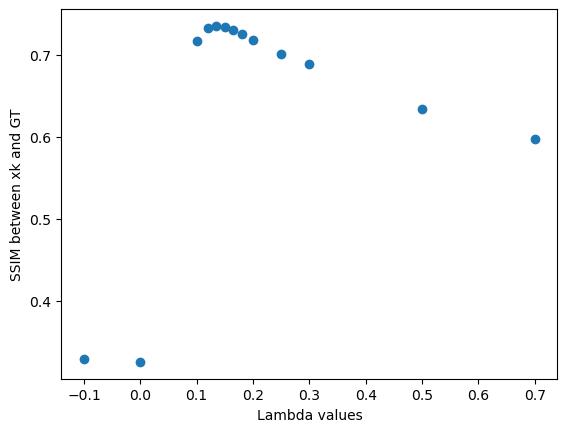

I got stopped at iteration 240 because of Cost function


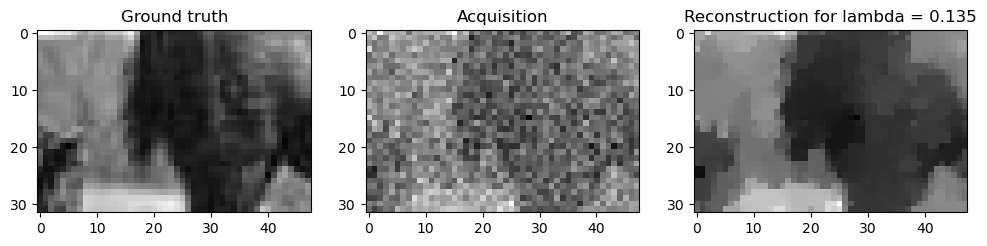

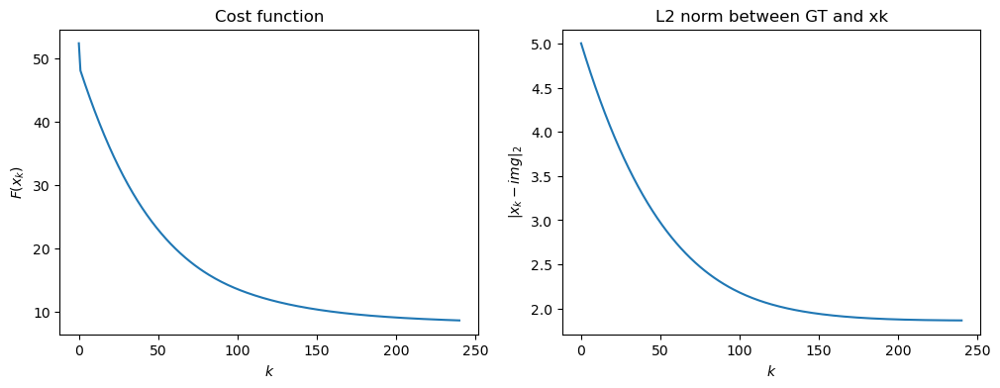

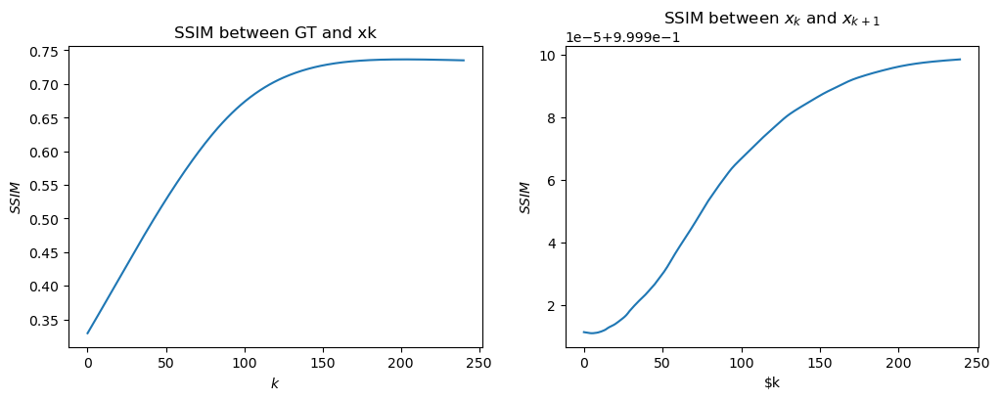

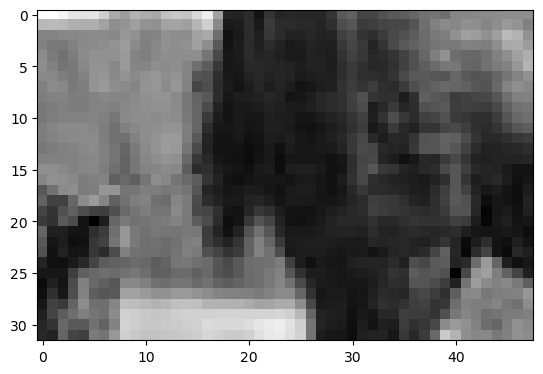

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 240 because of Cost function
I got stopped at iteration 251 because of Cost function
I got stopped at iteration 296 because of Cost function
I got stopped at iteration 348 because of Cost function
{-0.1: 0.21275800843615236, 0.1: 0.6582046297776898, 0.3: 0.7362051843684807, 0.5: 0.7062852563414143, 0.7: 0.6820008079175588}
--------
range examined: [0.1 0.2 0.3 0.4 0.5]
I got stopped at iteration 240 because of Cost function
I got stopped at iteration 249 because of Cost function
I got stopped at iteration 251 because of Cost function
I got stopped at iteration 275 because of Cost function
I got stopped at iteration 296 because of Cost function
{-0.1: 0.21275800843615236, 0.1: 0.6582046297776898, 0.3: 0.7362051843684807, 0.5: 0.7062852563414143, 0.7: 0.6820008079175588, 0.2: 0.7489336602127195, 0.4: 0.7197672675935288}
--------
range examined: [0.1  0.15 0

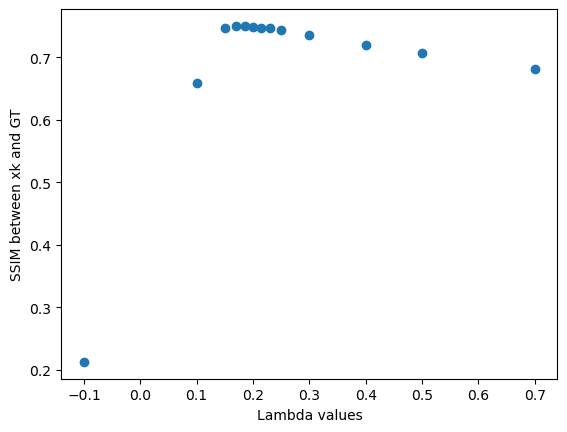

I got stopped at iteration 252 because of Cost function


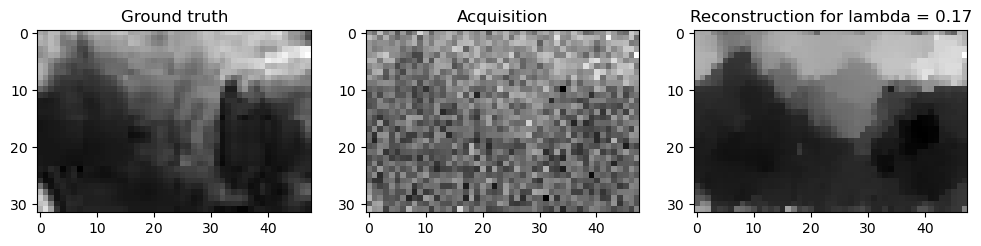

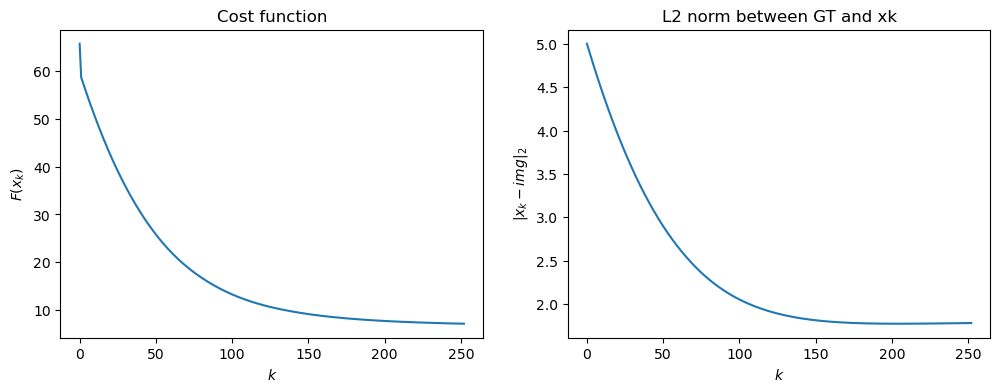

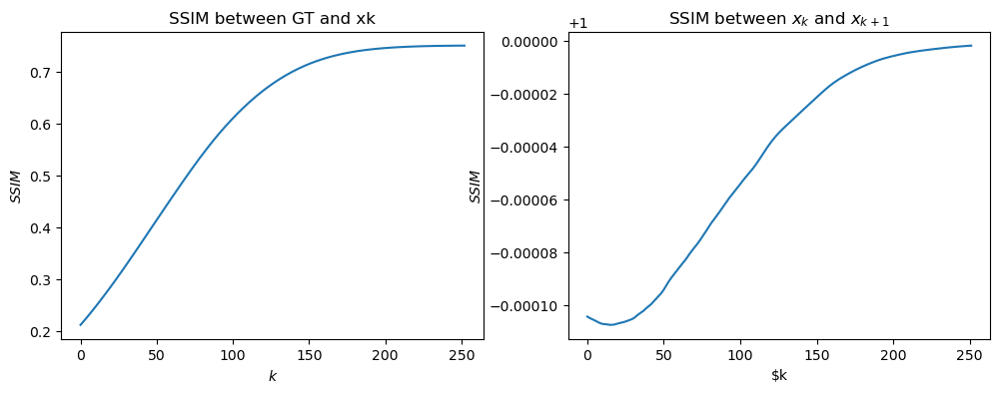

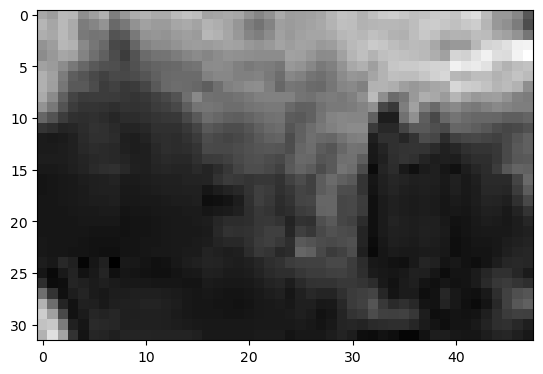

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 236 because of Cost function
I got stopped at iteration 295 because of Cost function
I got stopped at iteration 390 because of Cost function
{-0.1: 0.29545923506376326, 0.1: 0.6316406717039208, 0.3: 0.5564564546250276, 0.5: 0.48468392017185274, 0.7: 0.4590648917023165}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 236 because of Cost function
I got stopped at iteration 263 because of Cost function
I got stopped at iteration 295 because of Cost function
{-0.1: 0.29545923506376326, 0.1: 0.6316406717039208, 0.3: 0.5564564546250276, 0.5: 0.48468392017185274, 0.7: 0.4590648917023165, 0.0: 0.29186895337018576, 0.2: 0.6019124364577313}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because 

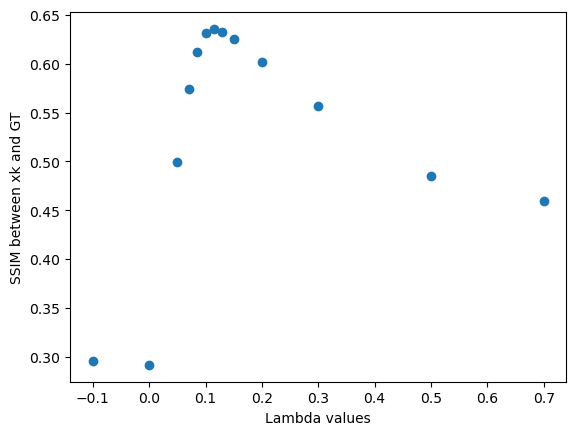

I got stopped at iteration 247 because of Cost function


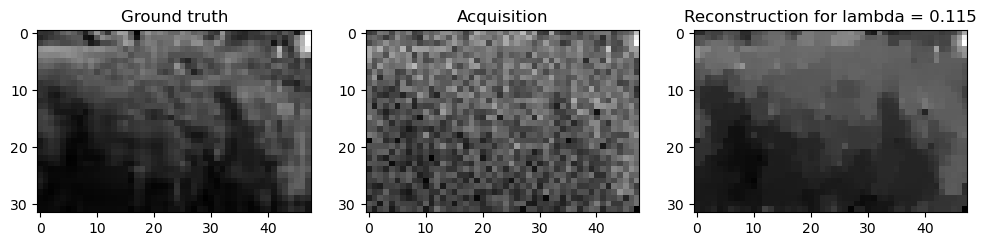

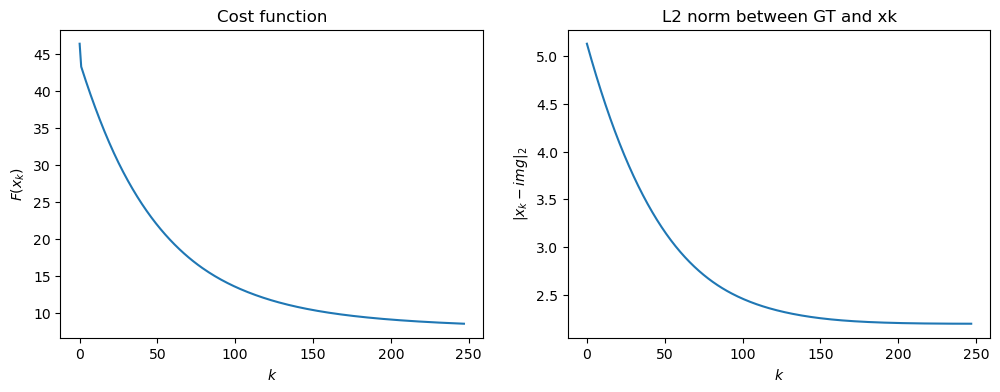

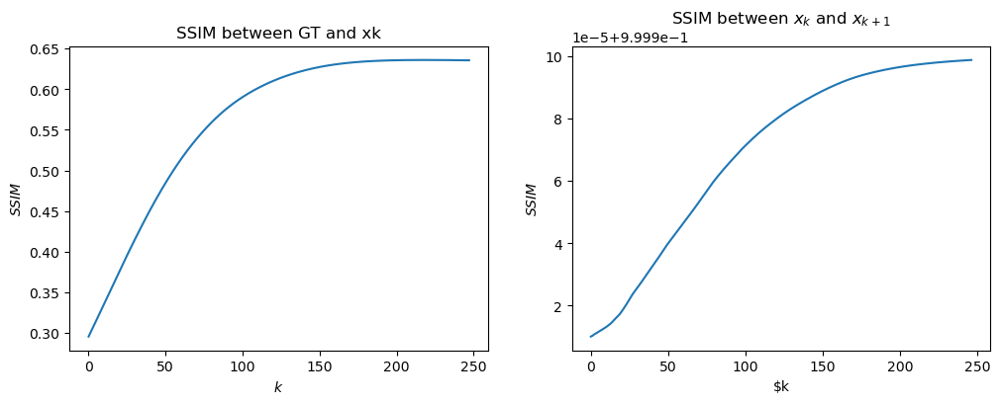

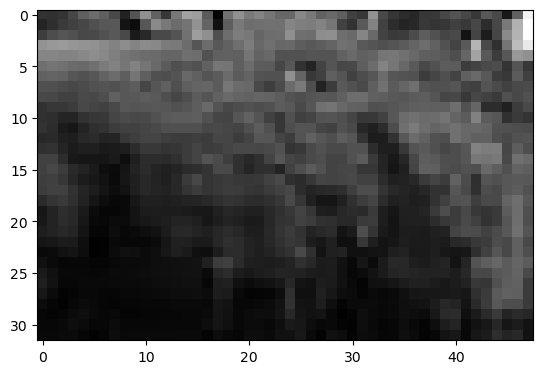

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 244 because of Cost function
I got stopped at iteration 385 because of Cost function
{-0.1: 0.35569011505732584, 0.1: 0.6614722112477757, 0.3: 0.4997036477376862, 0.5: 0.423214869080948, 0.7: 0.39029650231784324}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 244 because of Cost function
I got stopped at iteration 325 because of Cost function
I got stopped at iteration 385 because of Cost function
{-0.1: 0.35569011505732584, 0.1: 0.6614722112477757, 0.3: 0.4997036477376862, 0.5: 0.423214869080948, 0.7: 0.39029650231784324, 0.0: 0.3521755377227289, 0.2: 0.5889810548639346}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 138 because of 

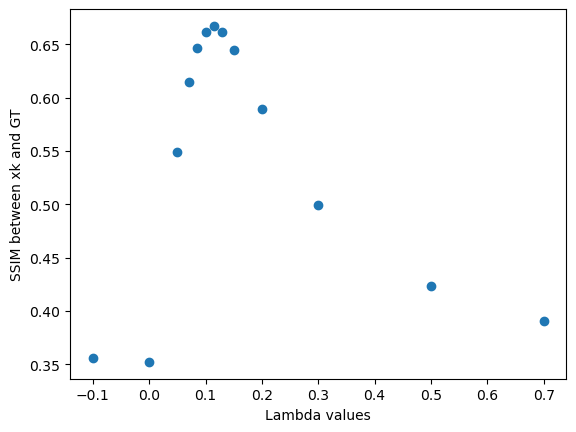

I got stopped at iteration 263 because of Cost function


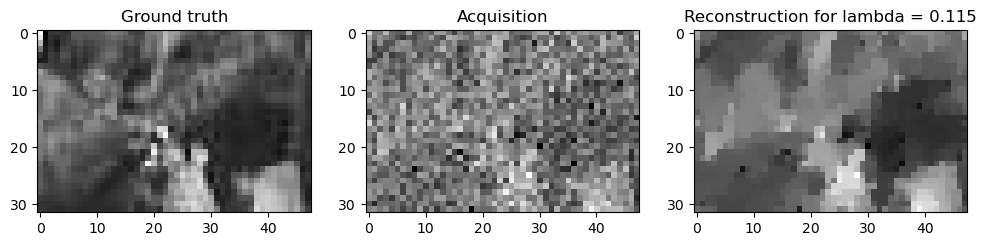

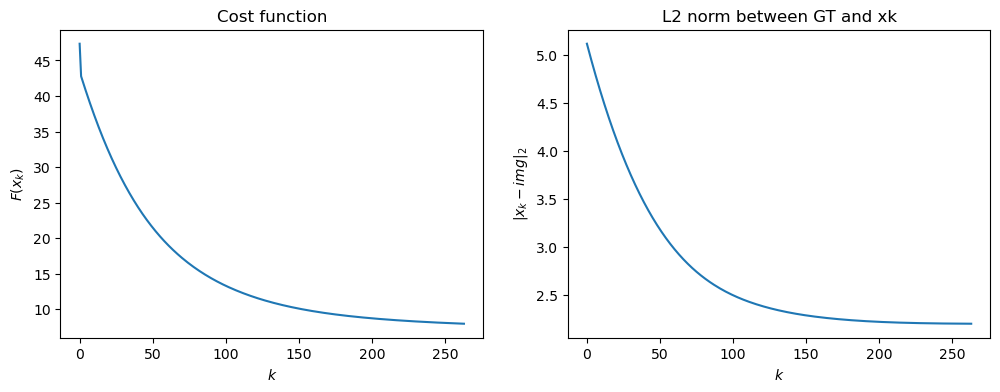

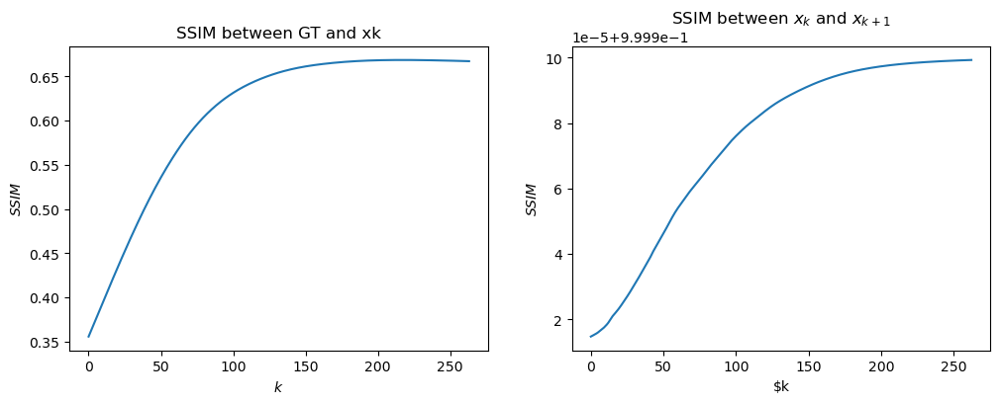

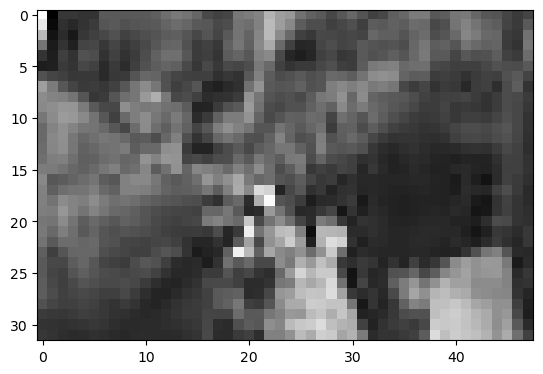

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 227 because of Cost function
I got stopped at iteration 387 because of Cost function
{-0.1: 0.4970610857317551, 0.1: 0.7337648827124976, 0.3: 0.4583809880512393, 0.5: 0.3766530178473427, 0.7: 0.34313818080095787}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 227 because of Cost function
I got stopped at iteration 334 because of Cost function
I got stopped at iteration 387 because of Cost function
{-0.1: 0.4970610857317551, 0.1: 0.7337648827124976, 0.3: 0.4583809880512393, 0.5: 0.3766530178473427, 0.7: 0.34313818080095787, 0.0: 0.4928362267888306, 0.2: 0.5746473584649332}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 131 because of 

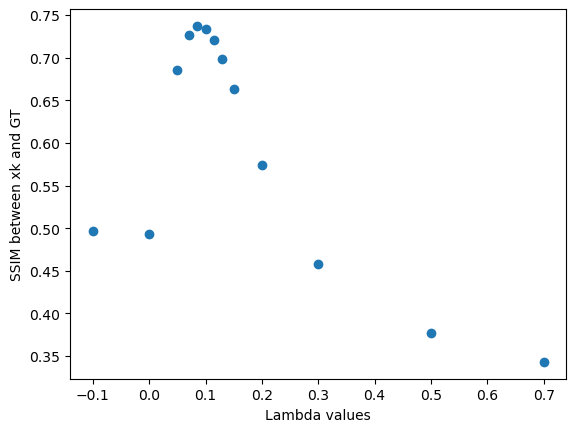

I got stopped at iteration 202 because of Cost function


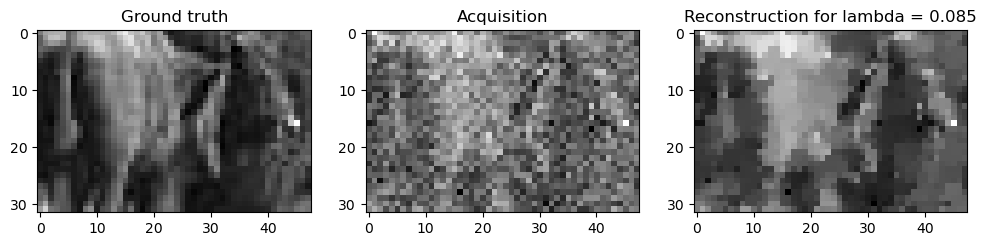

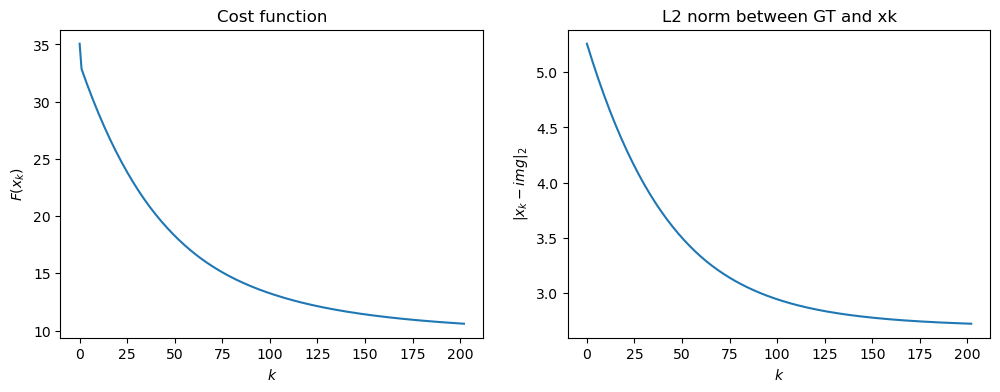

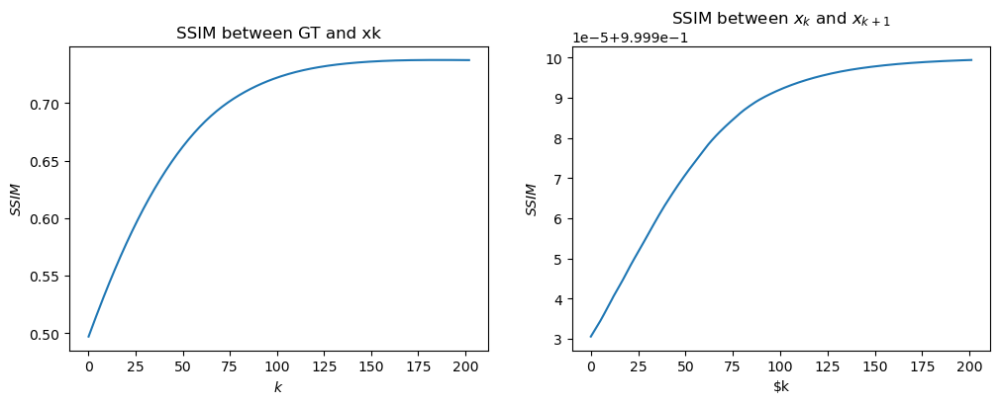

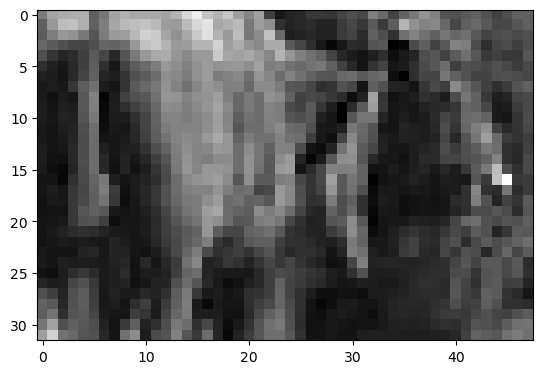

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 250 because of Cost function
I got stopped at iteration 280 because of Cost function
{-0.1: 0.27329363038195276, 0.1: 0.6135960469696323, 0.3: 0.5510505219429578, 0.5: 0.4728436406943304, 0.7: 0.44707453594645535}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 250 because of Cost function
I got stopped at iteration 251 because of Cost function
I got stopped at iteration 280 because of Cost function
{-0.1: 0.27329363038195276, 0.1: 0.6135960469696323, 0.3: 0.5510505219429578, 0.5: 0.4728436406943304, 0.7: 0.44707453594645535, 0.0: 0.2696217862189929, 0.2: 0.5937762081080373}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 144 because o

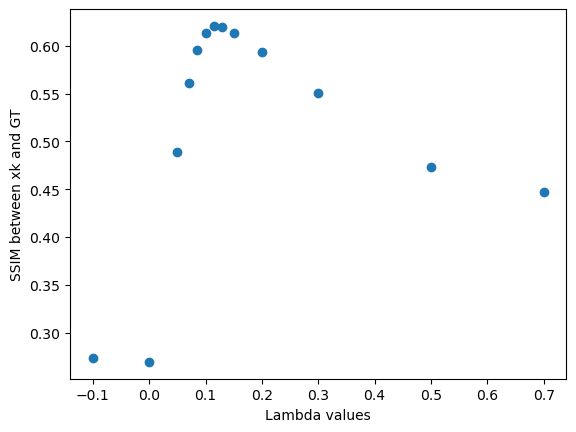

I got stopped at iteration 263 because of Cost function


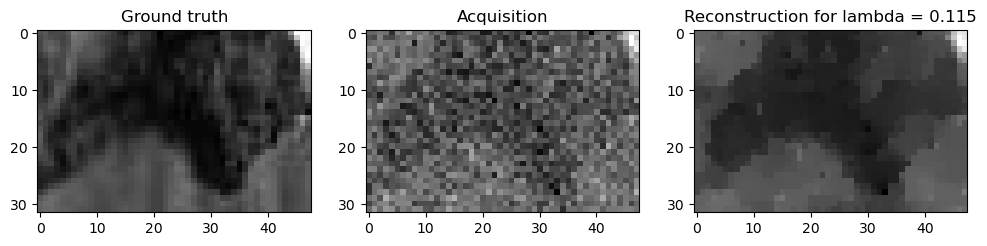

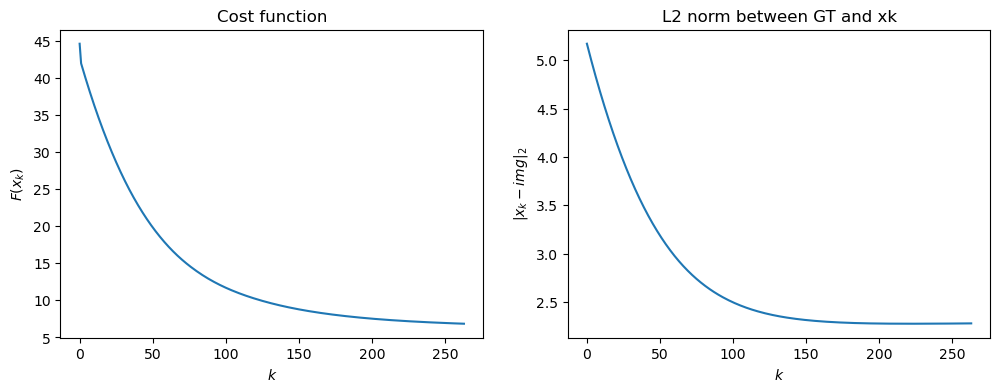

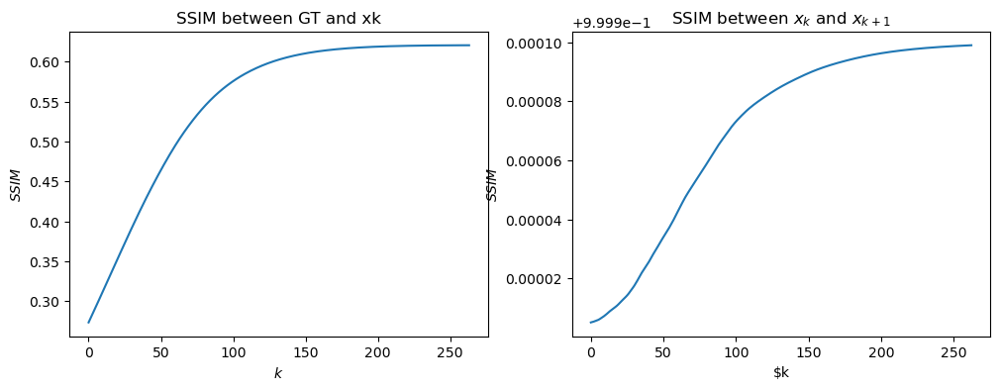

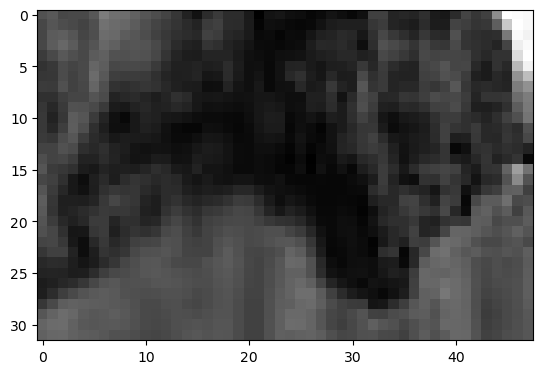

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 199 because of Cost function
I got stopped at iteration 208 because of Cost function
I got stopped at iteration 208 because of Cost function
I got stopped at iteration 210 because of Cost function
{-0.1: 0.31817283087952664, 0.1: 0.6884221675373556, 0.3: 0.7270659671786368, 0.5: 0.7161781708777922, 0.7: 0.7095910864325278}
--------
range examined: [0.1 0.2 0.3 0.4 0.5]
I got stopped at iteration 199 because of Cost function
I got stopped at iteration 212 because of Cost function
I got stopped at iteration 208 because of Cost function
I got stopped at iteration 206 because of Cost function
I got stopped at iteration 208 because of Cost function
{-0.1: 0.31817283087952664, 0.1: 0.6884221675373556, 0.3: 0.7270659671786368, 0.5: 0.7161781708777922, 0.7: 0.7095910864325278, 0.2: 0.7351425622633253, 0.4: 0.7210954509013586}
--------
range examined: [0.1  0.15 0

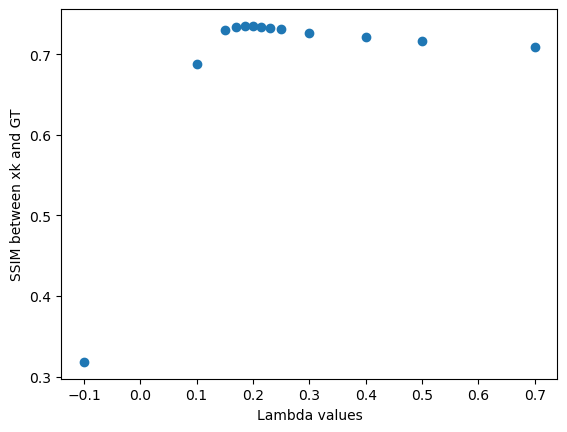

I got stopped at iteration 212 because of Cost function


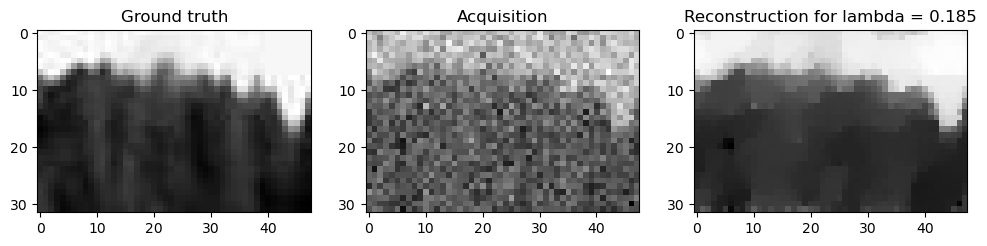

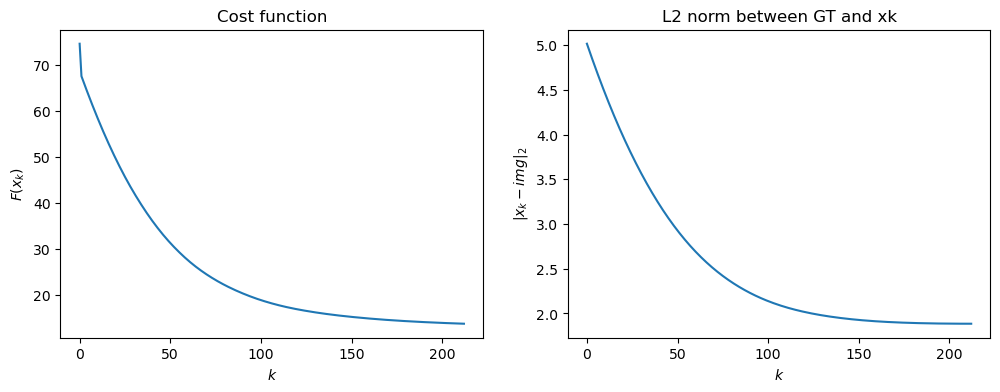

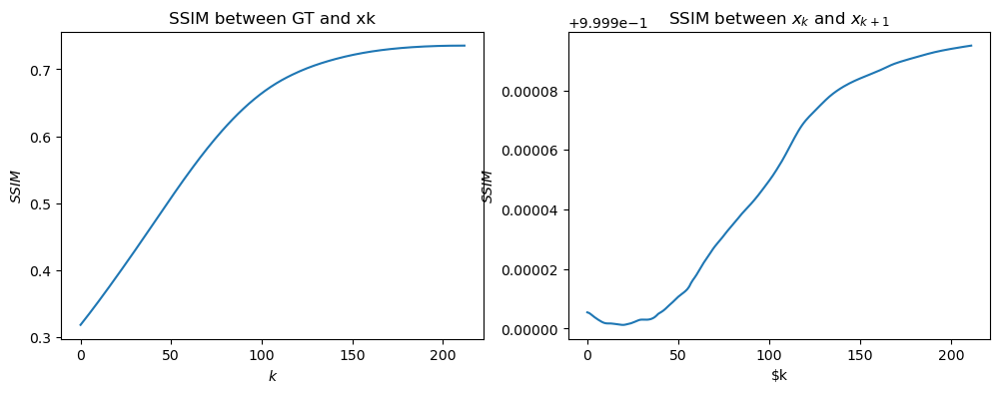

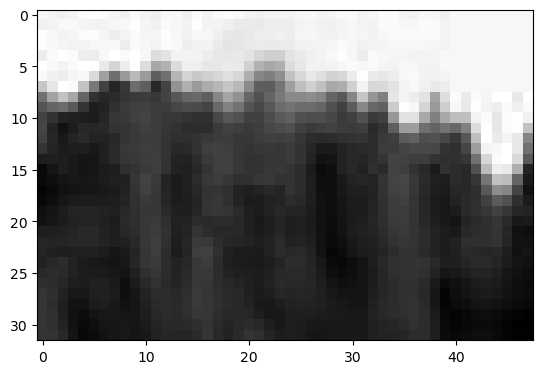

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 188 because of Cost function
I got stopped at iteration 187 because of Cost function
I got stopped at iteration 186 because of Cost function
I got stopped at iteration 193 because of Cost function
{-0.1: 0.3471223406140621, 0.1: 0.7422769766811597, 0.3: 0.8271341850285046, 0.5: 0.82221455739231, 0.7: 0.8156359817887824}
--------
range examined: [0.1 0.2 0.3 0.4 0.5]
I got stopped at iteration 188 because of Cost function
I got stopped at iteration 183 because of Cost function
I got stopped at iteration 187 because of Cost function
I got stopped at iteration 184 because of Cost function
I got stopped at iteration 186 because of Cost function
{-0.1: 0.3471223406140621, 0.1: 0.7422769766811597, 0.3: 0.8271341850285046, 0.5: 0.82221455739231, 0.7: 0.8156359817887824, 0.2: 0.8212703128444421, 0.4: 0.8254288600464387}
--------
range examined: [0.2  0.25 0.3  0.

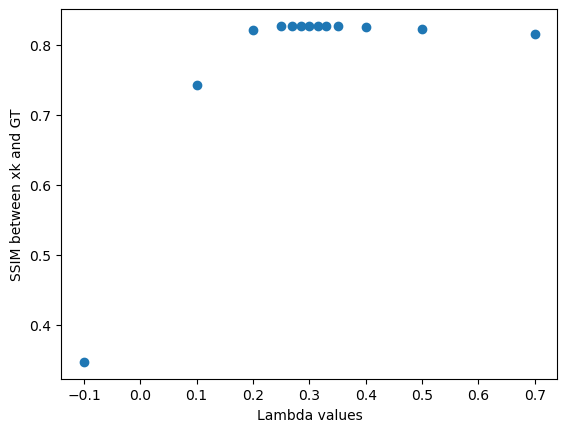

I got stopped at iteration 187 because of Cost function


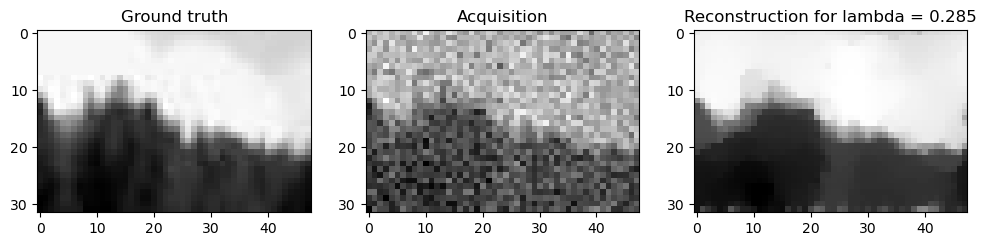

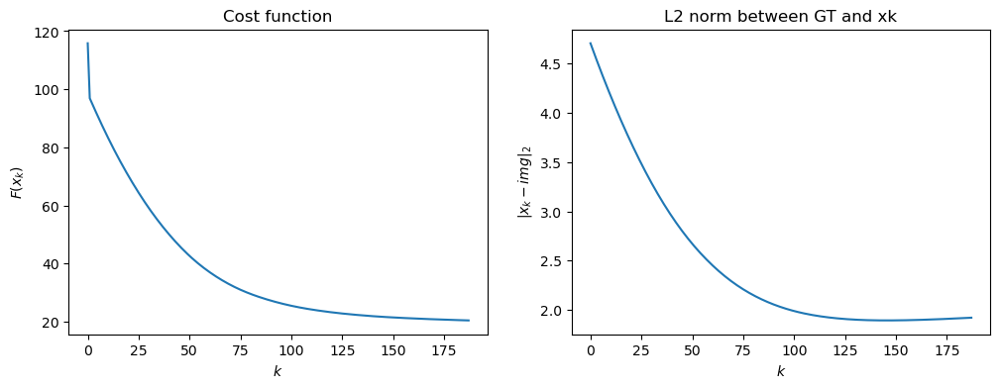

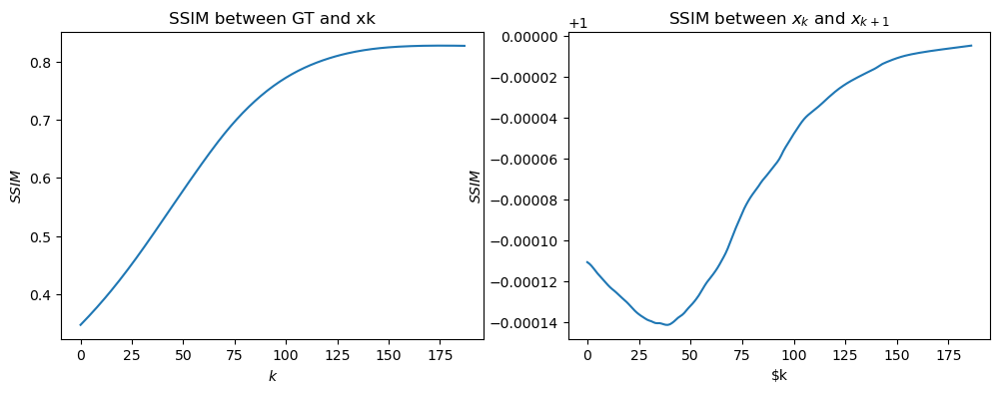

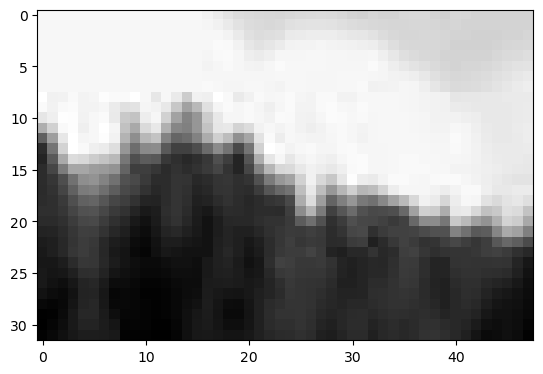

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 195 because of Cost function
I got stopped at iteration 201 because of Cost function
I got stopped at iteration 216 because of Cost function
I got stopped at iteration 224 because of Cost function
{-0.1: 0.36164010075162134, 0.1: 0.7481484291186383, 0.3: 0.8256045412803568, 0.5: 0.8175378927607029, 0.7: 0.8104921094389487}
--------
range examined: [0.1 0.2 0.3 0.4 0.5]
I got stopped at iteration 195 because of Cost function
I got stopped at iteration 194 because of Cost function
I got stopped at iteration 201 because of Cost function
I got stopped at iteration 211 because of Cost function
I got stopped at iteration 216 because of Cost function
{-0.1: 0.36164010075162134, 0.1: 0.7481484291186383, 0.3: 0.8256045412803568, 0.5: 0.8175378927607029, 0.7: 0.8104921094389487, 0.2: 0.8238501160087484, 0.4: 0.8215727702708553}
--------
range examined: [0.2  0.25 0

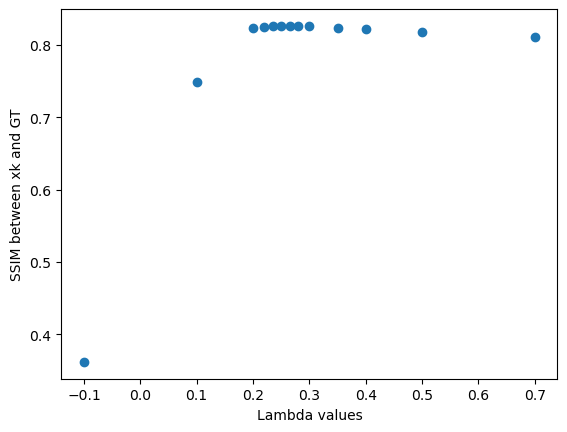

I got stopped at iteration 196 because of Cost function


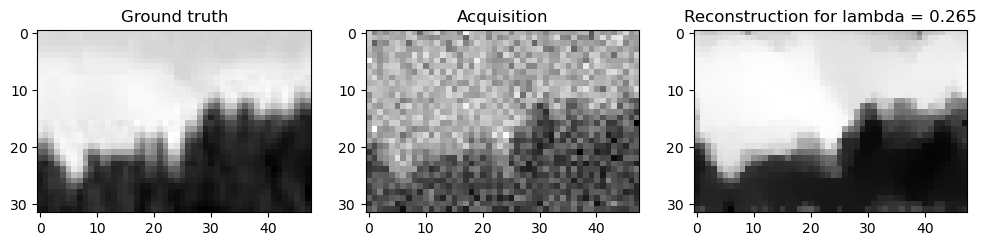

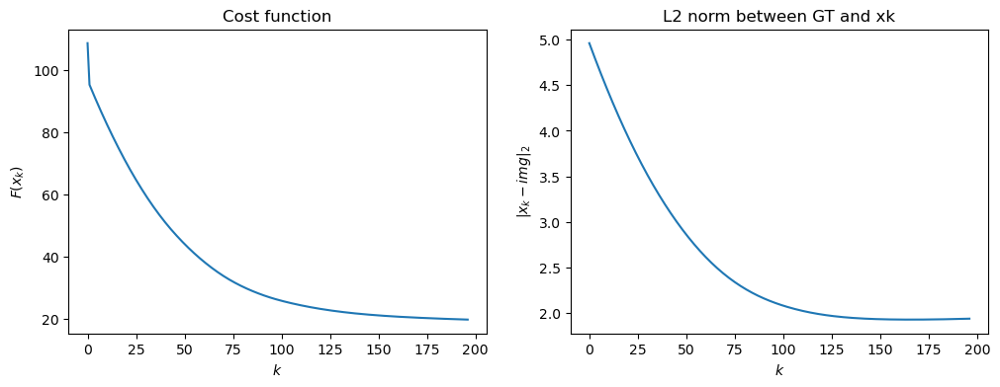

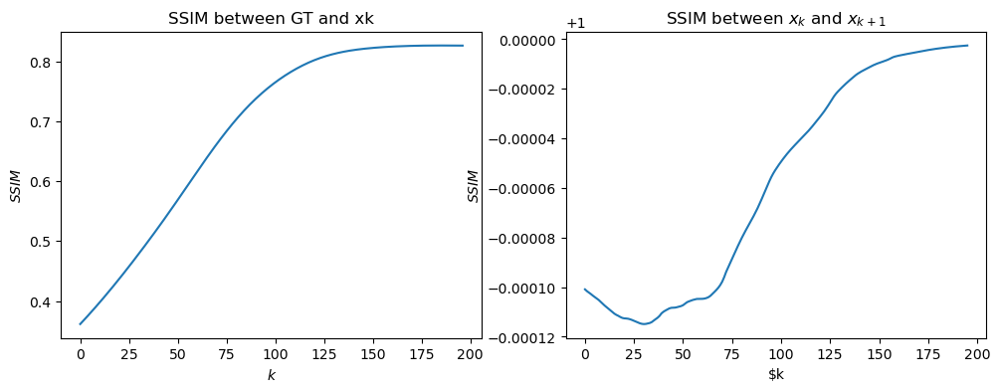

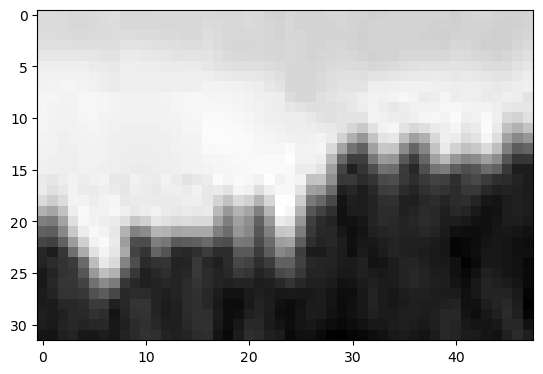

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 205 because of Cost function
I got stopped at iteration 250 because of Cost function
I got stopped at iteration 292 because of Cost function
I got stopped at iteration 328 because of Cost function
{-0.1: 0.5654389741422209, 0.1: 0.7425588699626134, 0.3: 0.6227252921265678, 0.5: 0.5548981213207216, 0.7: 0.5107586403992971}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 205 because of Cost function
I got stopped at iteration 235 because of Cost function
I got stopped at iteration 250 because of Cost function
{-0.1: 0.5654389741422209, 0.1: 0.7425588699626134, 0.3: 0.6227252921265678, 0.5: 0.5548981213207216, 0.7: 0.5107586403992971, 0.0: 0.5614848031906284, 0.2: 0.6718297275520622}
--------
range examined: [0.   0.05 0.

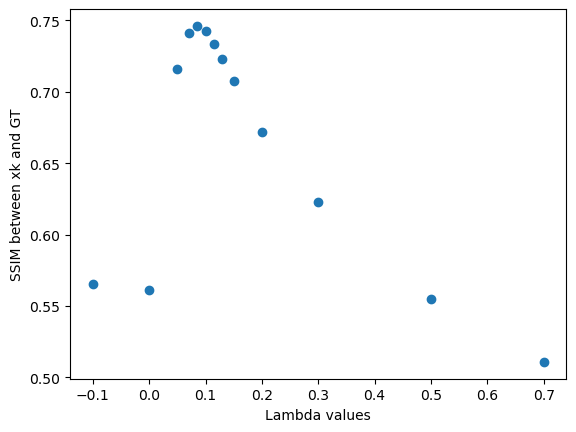

I got stopped at iteration 187 because of Cost function


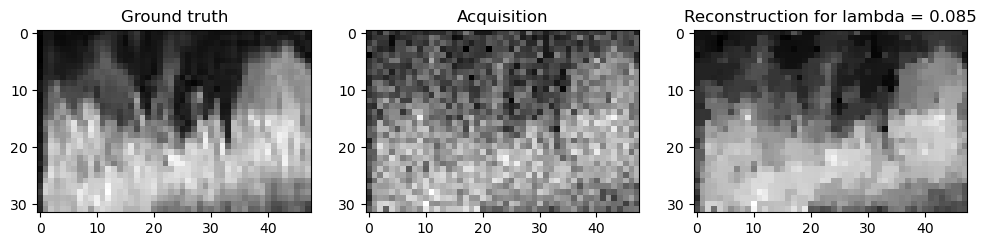

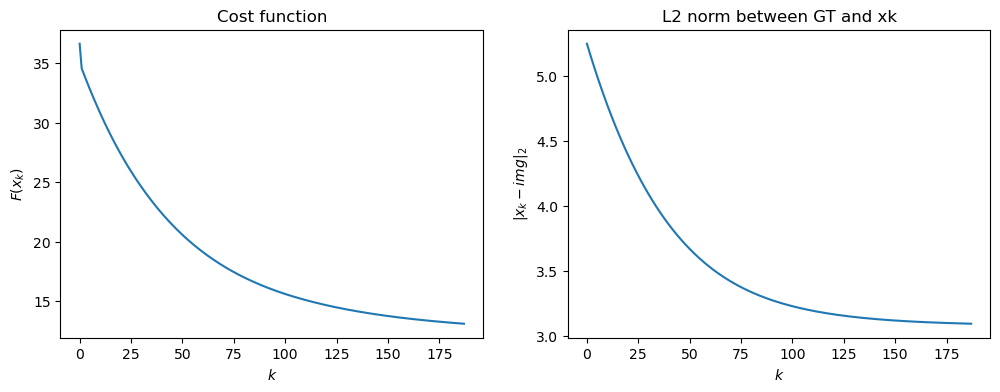

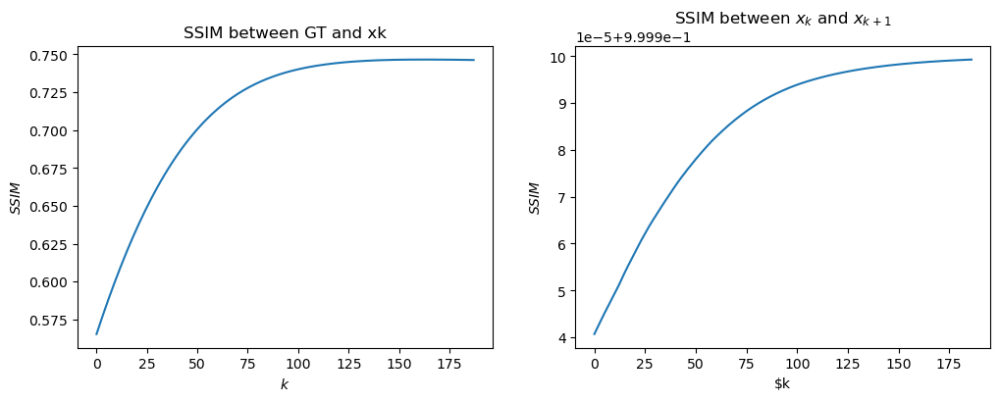

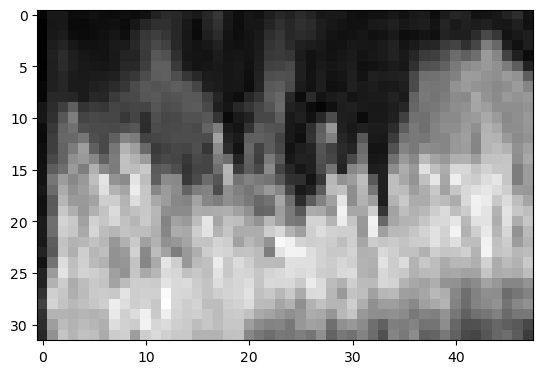

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 216 because of Cost function
I got stopped at iteration 298 because of Cost function
I got stopped at iteration 370 because of Cost function
{-0.1: 0.6113096143491057, 0.1: 0.7743023778510788, 0.3: 0.6483356712623549, 0.5: 0.5652109630710813, 0.7: 0.5220166979870903}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 216 because of Cost function
I got stopped at iteration 270 because of Cost function
I got stopped at iteration 298 because of Cost function
{-0.1: 0.6113096143491057, 0.1: 0.7743023778510788, 0.3: 0.6483356712623549, 0.5: 0.5652109630710813, 0.7: 0.5220166979870903, 0.0: 0.6075060214347415, 0.2: 0.7006966753832029}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Se

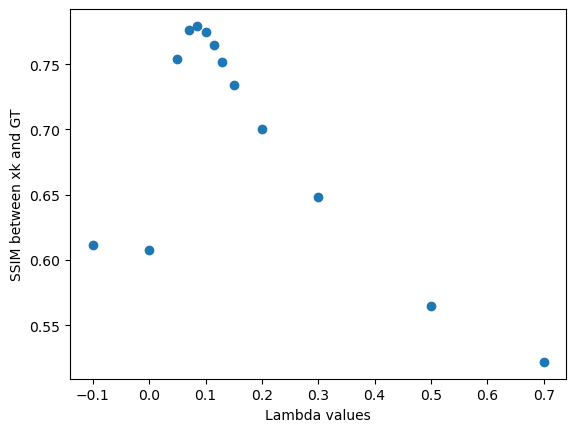

I got stopped at iteration 193 because of Cost function


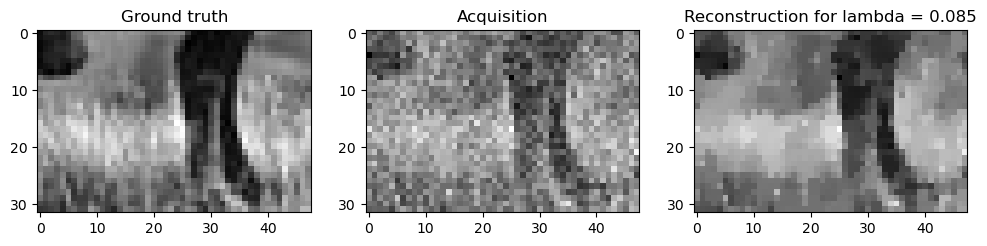

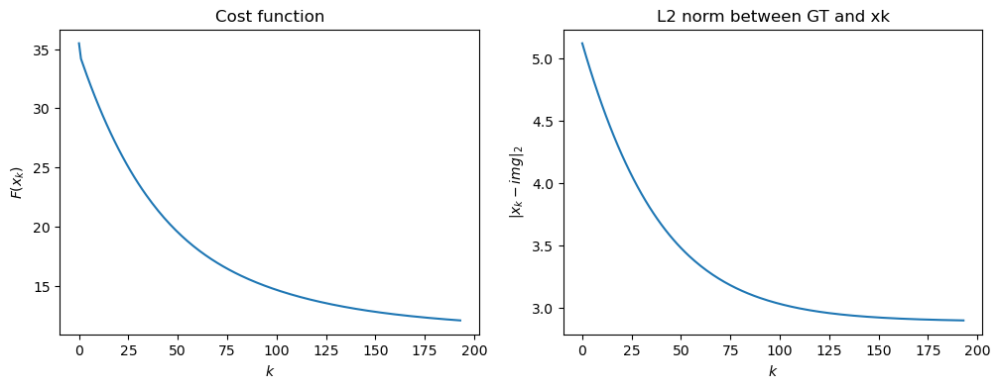

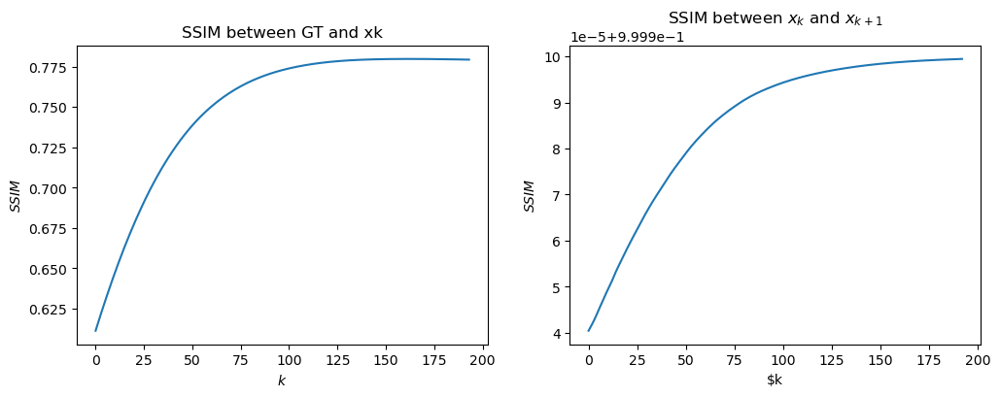

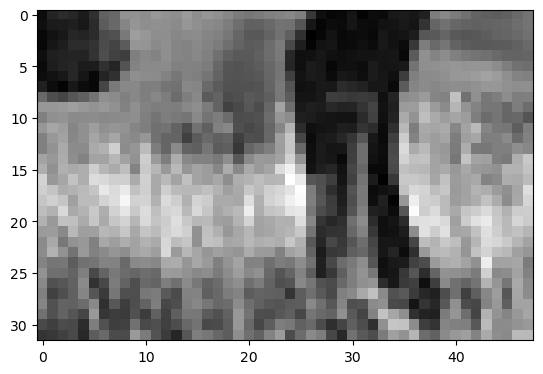

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 199 because of Cost function
I got stopped at iteration 260 because of Cost function
I got stopped at iteration 317 because of Cost function
I got stopped at iteration 345 because of Cost function
{-0.1: 0.6177948956216687, 0.1: 0.7860998234256902, 0.3: 0.7048903055483016, 0.5: 0.6326020361783843, 0.7: 0.5904071822097767}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 199 because of Cost function
I got stopped at iteration 237 because of Cost function
I got stopped at iteration 260 because of Cost function
{-0.1: 0.6177948956216687, 0.1: 0.7860998234256902, 0.3: 0.7048903055483016, 0.5: 0.6326020361783843, 0.7: 0.5904071822097767, 0.0: 0.6148412388219512, 0.2: 0.7470952953909019}
--------
range examined: [0.   0.05 0.

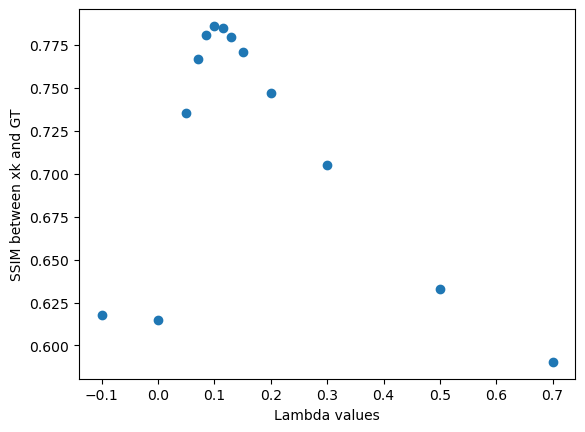

I got stopped at iteration 199 because of Cost function


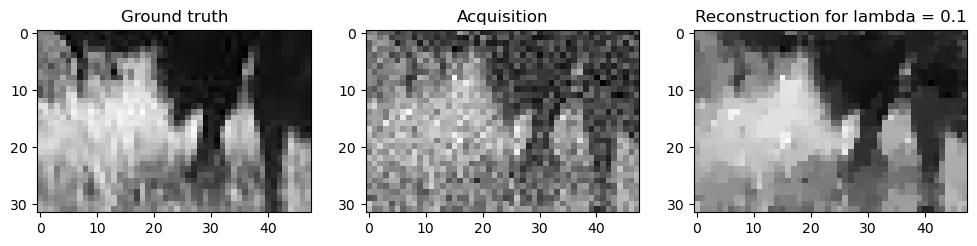

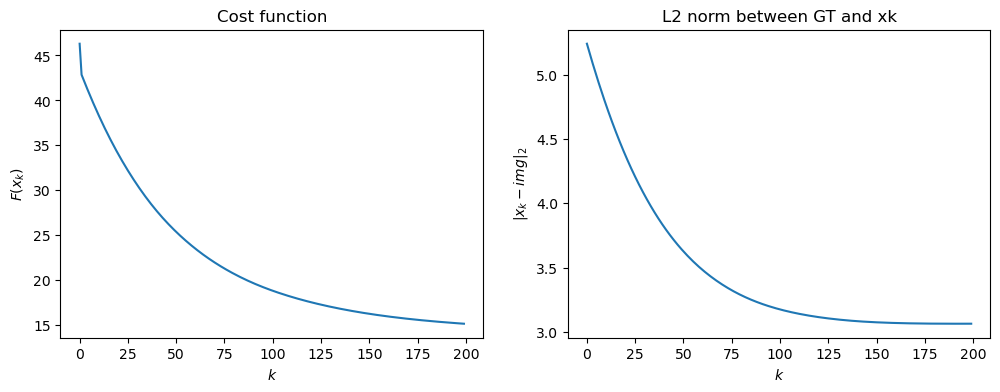

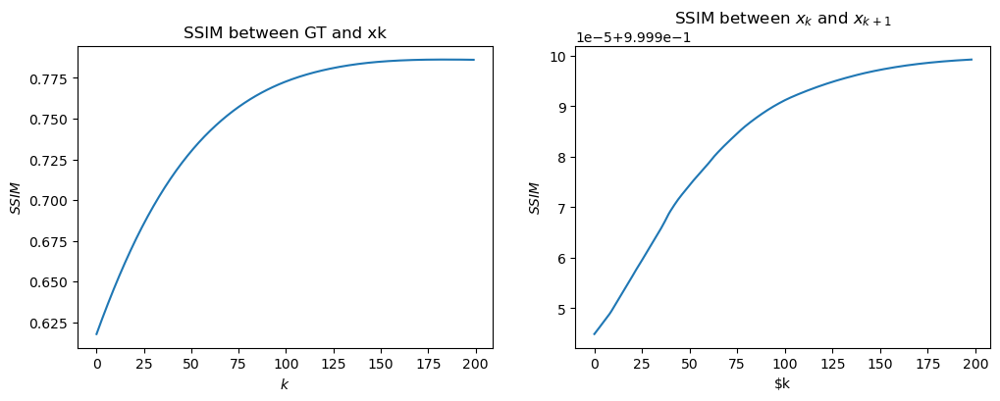

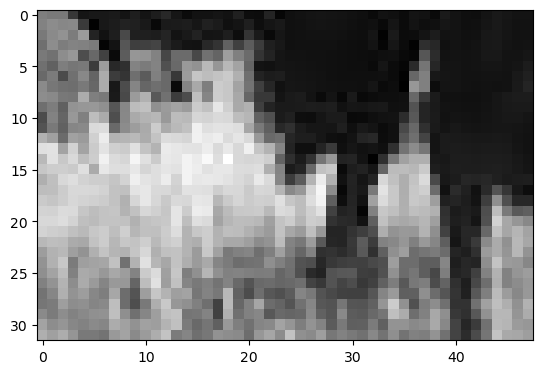

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 201 because of Cost function
I got stopped at iteration 239 because of Cost function
I got stopped at iteration 265 because of Cost function
I got stopped at iteration 295 because of Cost function
{-0.1: 0.5975057921917171, 0.1: 0.7968942723074753, 0.3: 0.7238888128278684, 0.5: 0.6873136072482591, 0.7: 0.6585681614181348}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 201 because of Cost function
I got stopped at iteration 234 because of Cost function
I got stopped at iteration 239 because of Cost function
{-0.1: 0.5975057921917171, 0.1: 0.7968942723074753, 0.3: 0.7238888128278684, 0.5: 0.6873136072482591, 0.7: 0.6585681614181348, 0.0: 0.5940866228165367, 0.2: 0.7527302637804955}
--------
range examined: [0.   0.05 0.

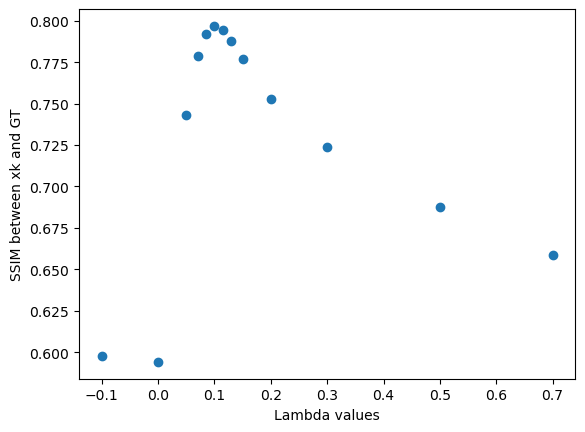

I got stopped at iteration 201 because of Cost function


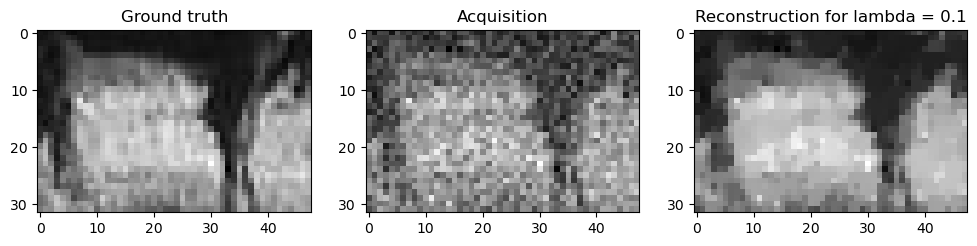

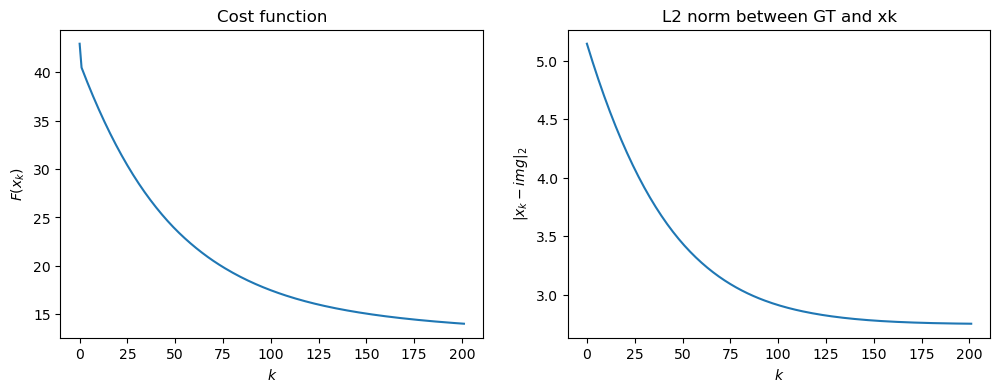

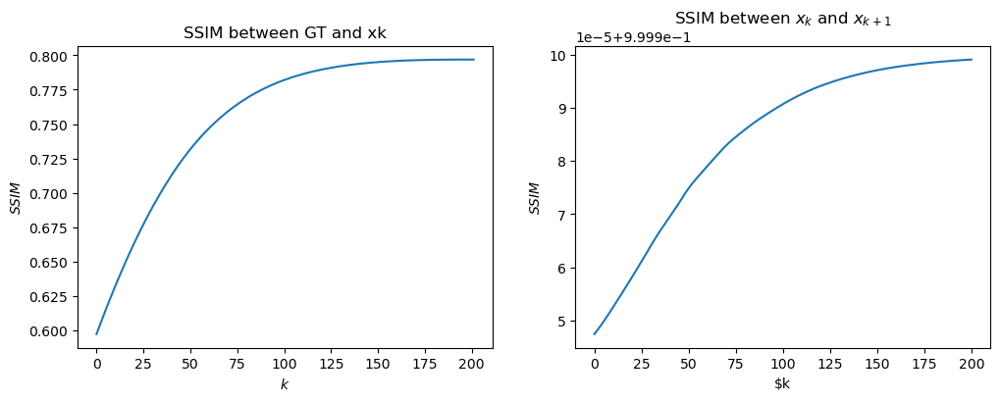

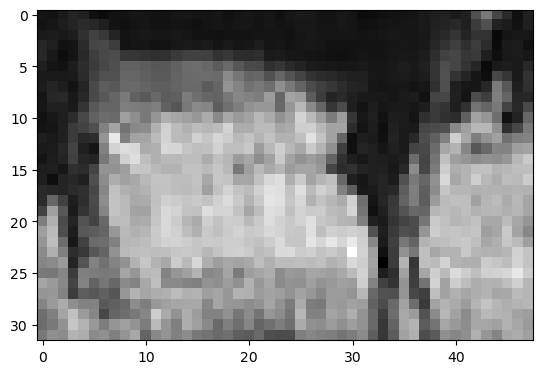

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 195 because of Cost function
I got stopped at iteration 287 because of Cost function
I got stopped at iteration 368 because of Cost function
{-0.1: 0.6528862620773176, 0.1: 0.7985359573876482, 0.3: 0.6990926891066942, 0.5: 0.6017283454827966, 0.7: 0.54688654253613}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 195 because of Cost function
I got stopped at iteration 245 because of Cost function
I got stopped at iteration 287 because of Cost function
{-0.1: 0.6528862620773176, 0.1: 0.7985359573876482, 0.3: 0.6990926891066942, 0.5: 0.6017283454827966, 0.7: 0.54688654253613, 0.0: 0.649456007657617, 0.2: 0.7506377590332722}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequenc

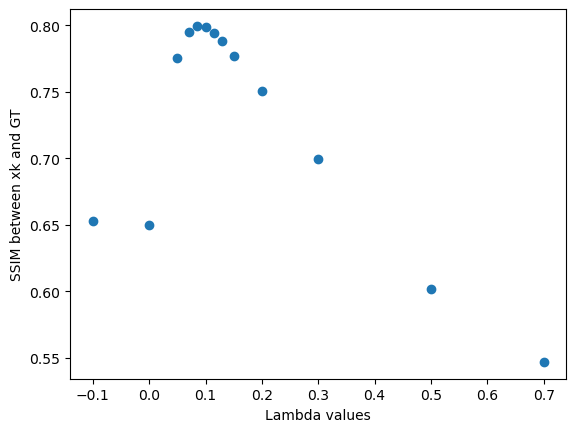

I got stopped at iteration 180 because of Cost function


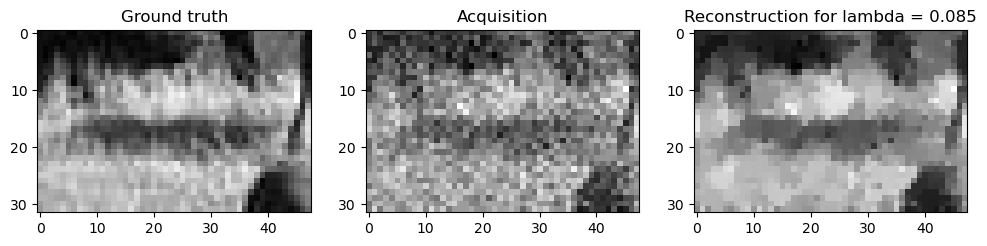

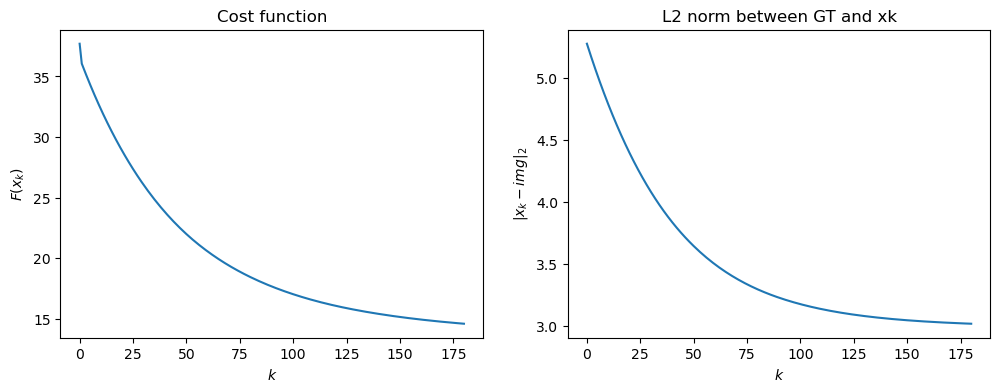

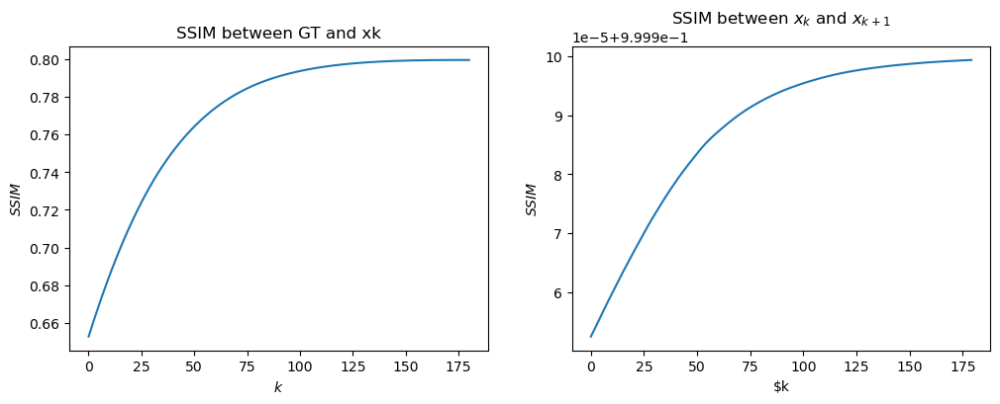

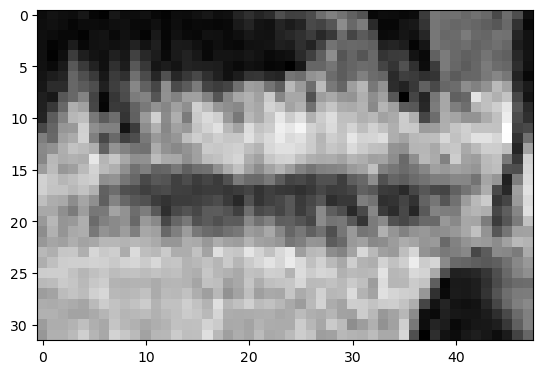

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 237 because of Cost function
I got stopped at iteration 308 because of Cost function
I got stopped at iteration 340 because of Cost function
{-0.1: 0.44094209772714976, 0.1: 0.6986751235568135, 0.3: 0.603301340647477, 0.5: 0.5463565667863615, 0.7: 0.5016620660324211}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 237 because of Cost function
I got stopped at iteration 285 because of Cost function
I got stopped at iteration 308 because of Cost function
{-0.1: 0.44094209772714976, 0.1: 0.6986751235568135, 0.3: 0.603301340647477, 0.5: 0.5463565667863615, 0.7: 0.5016620660324211, 0.0: 0.4380150602141892, 0.2: 0.6552157631415851}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Se

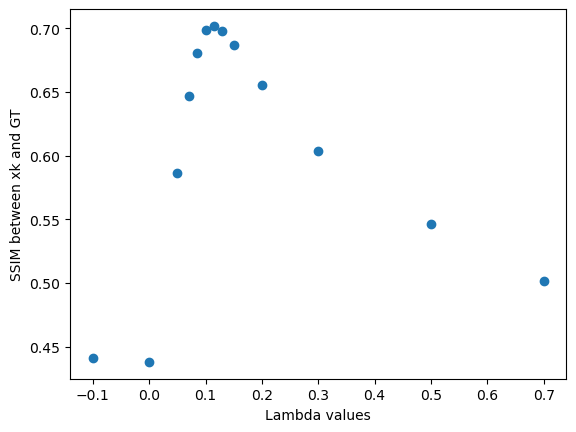

I got stopped at iteration 254 because of Cost function


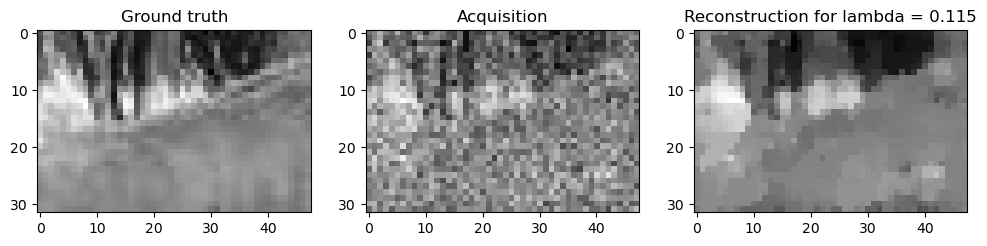

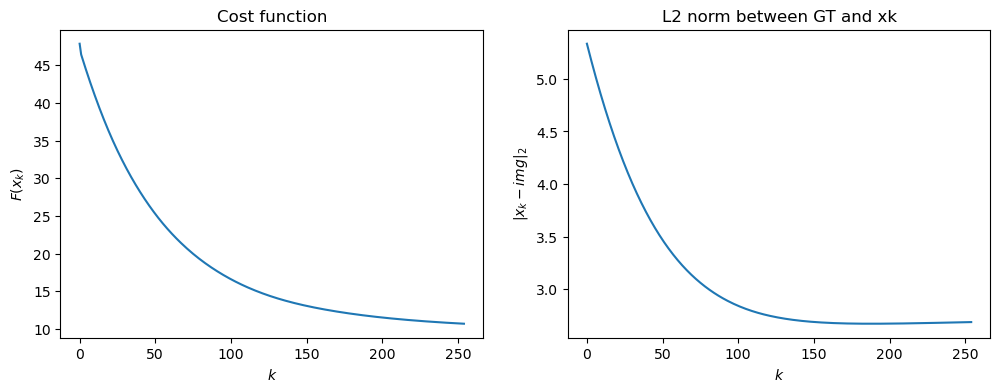

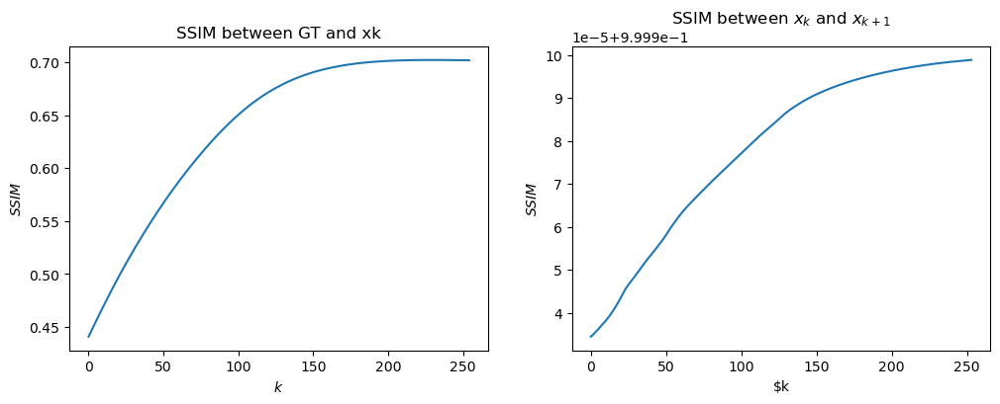

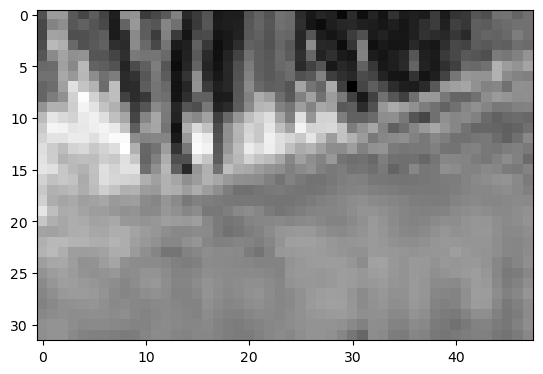

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 261 because of Cost function
I got stopped at iteration 394 because of Cost function
{-0.1: 0.334182515967835, 0.1: 0.612378438561943, 0.3: 0.43091090569870594, 0.5: 0.38132949117338455, 0.7: 0.35958402066422646}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 261 because of Cost function
I got stopped at iteration 334 because of Cost function
I got stopped at iteration 394 because of Cost function
{-0.1: 0.334182515967835, 0.1: 0.612378438561943, 0.3: 0.43091090569870594, 0.5: 0.38132949117338455, 0.7: 0.35958402066422646, 0.0: 0.33042013413800625, 0.2: 0.5024900323140807}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 144 because of

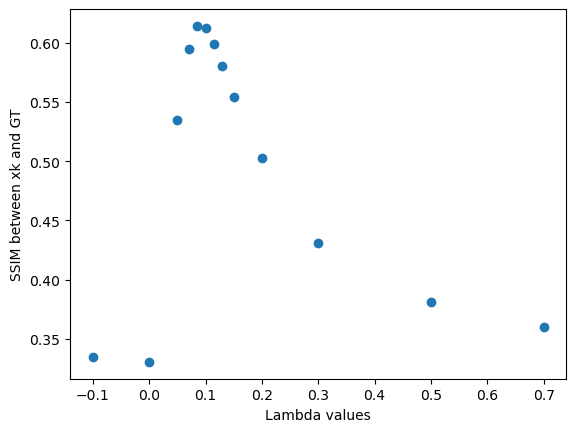

I got stopped at iteration 235 because of Cost function


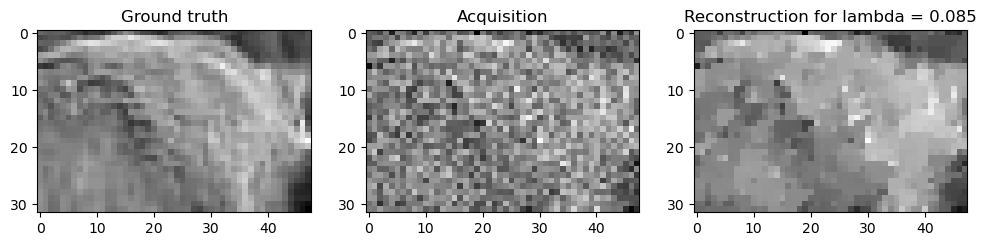

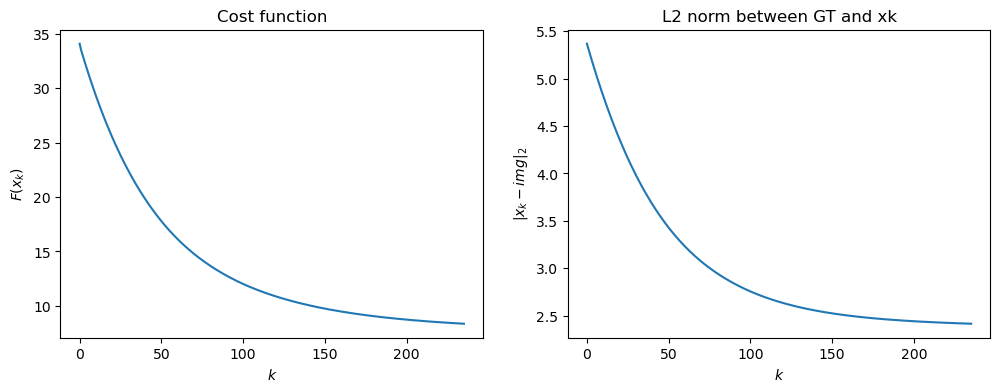

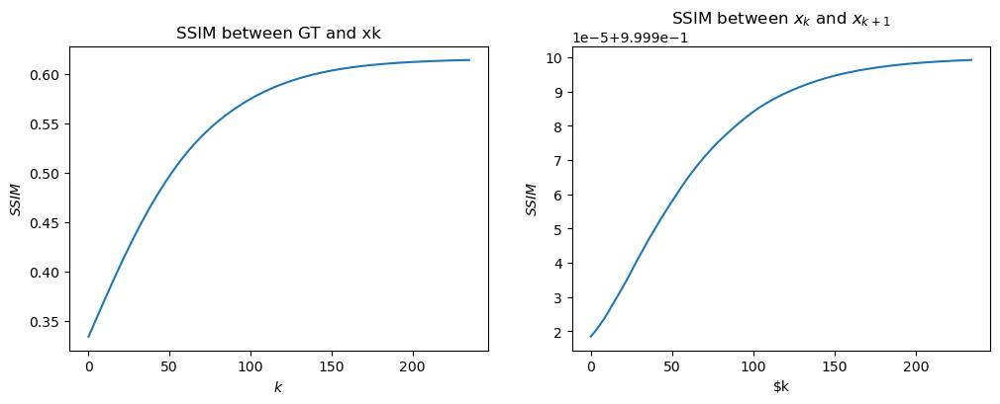

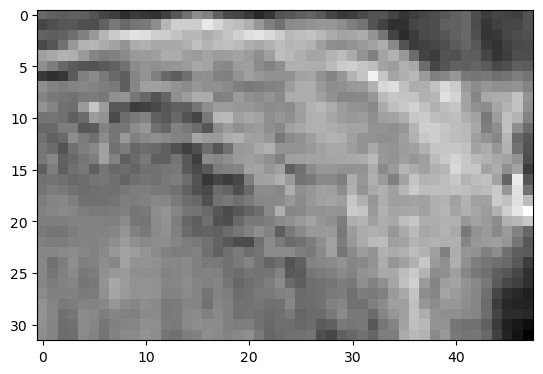

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 227 because of Cost function
I got stopped at iteration 265 because of Cost function
I got stopped at iteration 307 because of Cost function
I got stopped at iteration 346 because of Cost function
{-0.1: 0.46776008462722773, 0.1: 0.6827435361293335, 0.3: 0.5449080478542835, 0.5: 0.4897757799765519, 0.7: 0.4536699257422933}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 227 because of Cost function
I got stopped at iteration 254 because of Cost function
I got stopped at iteration 265 because of Cost function
{-0.1: 0.46776008462722773, 0.1: 0.6827435361293335, 0.3: 0.5449080478542835, 0.5: 0.4897757799765519, 0.7: 0.4536699257422933, 0.0: 0.46377576759581024, 0.2: 0.5927234919180112}
--------
range examined: [0.   0.05

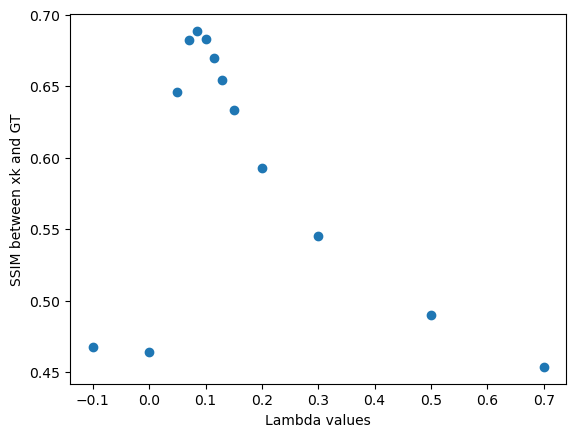

I got stopped at iteration 207 because of Cost function


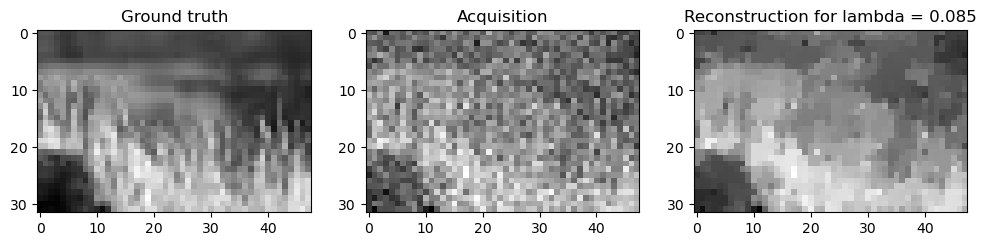

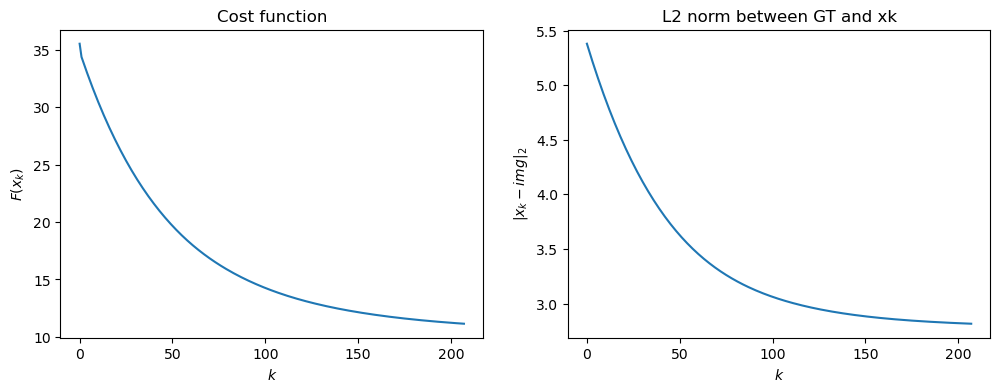

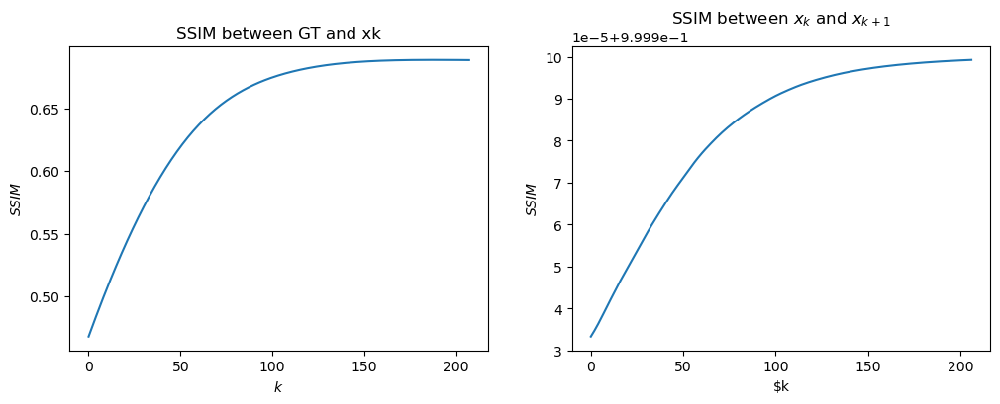

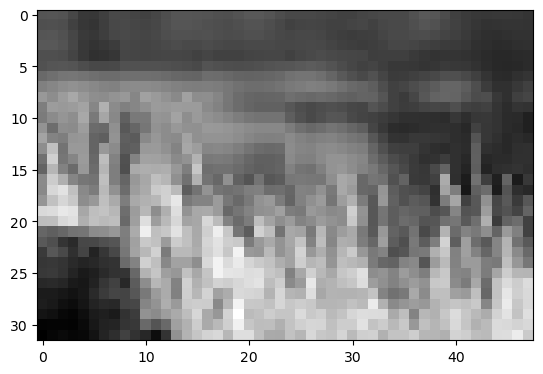

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 257 because of Cost function
I got stopped at iteration 322 because of Cost function
I got stopped at iteration 382 because of Cost function
{-0.1: 0.28302180361023016, 0.1: 0.6845408509475109, 0.3: 0.6195635457960604, 0.5: 0.5722337827241408, 0.7: 0.5519922040431076}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 257 because of Cost function
I got stopped at iteration 298 because of Cost function
I got stopped at iteration 322 because of Cost function
{-0.1: 0.28302180361023016, 0.1: 0.6845408509475109, 0.3: 0.6195635457960604, 0.5: 0.5722337827241408, 0.7: 0.5519922040431076, 0.0: 0.2803945184177401, 0.2: 0.6649318943817326}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of 

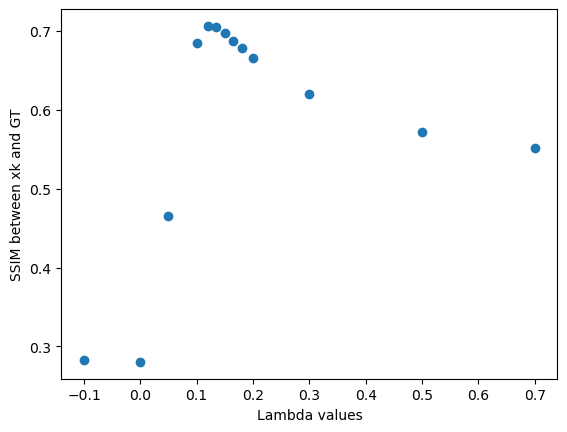

I got stopped at iteration 275 because of Cost function


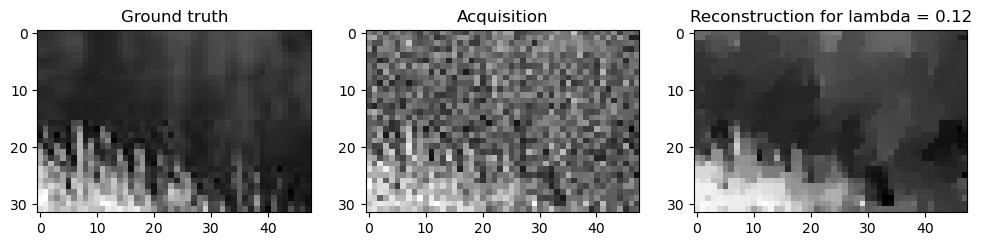

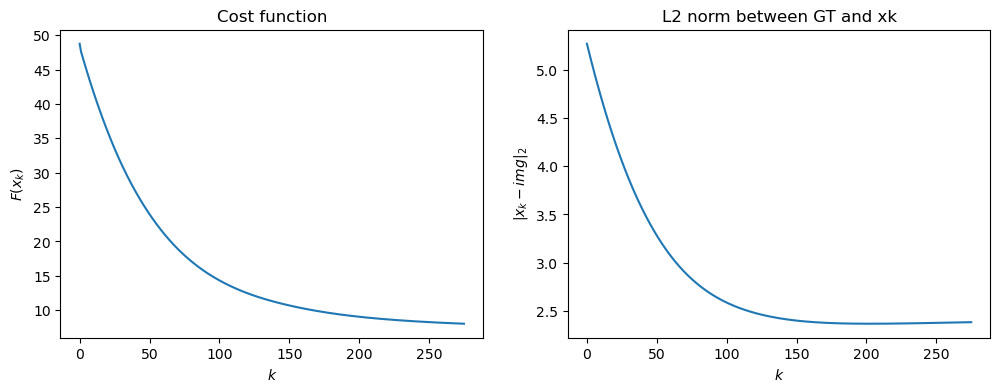

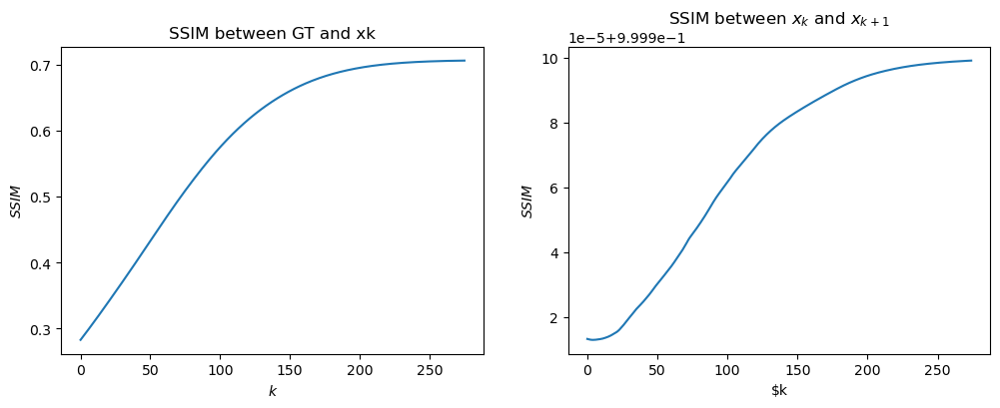

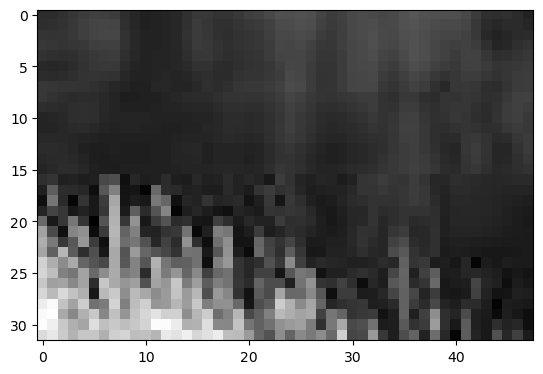

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 294 because of Cost function
I got stopped at iteration 398 because of Cost function
{-0.1: 0.11707886957083398, 0.1: 0.6062036489656348, 0.3: 0.6448632673643777, 0.5: 0.6257650200028109, 0.7: 0.6184945757248955}
--------
range examined: [0.1 0.2 0.3 0.4 0.5]
I got stopped at iteration 294 because of Cost function
I got stopped at iteration 345 because of Cost function
I got stopped at iteration 398 because of Cost function
{-0.1: 0.11707886957083398, 0.1: 0.6062036489656348, 0.3: 0.6448632673643777, 0.5: 0.6257650200028109, 0.7: 0.6184945757248955, 0.2: 0.6702874075399797, 0.4: 0.6325058744339204}
--------
range examined: [0.1  0.15 0.2  0.25 0.3 ]
I got stopped at iteration 294 because of Cost function
I got stopped at iteration 333 because of Cost function
I got stopped at iteration 345 because of Cost function
I got stopped at iteration 369 because of

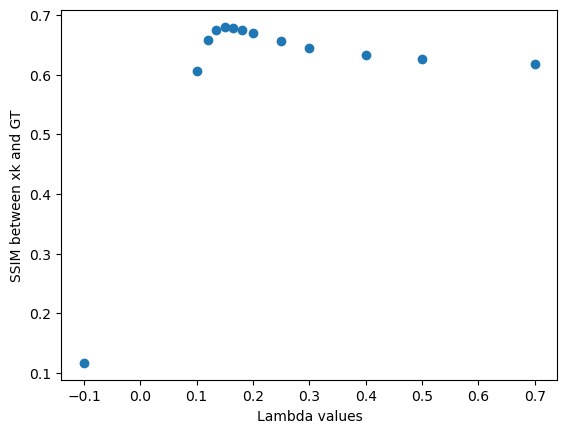

I got stopped at iteration 333 because of Cost function


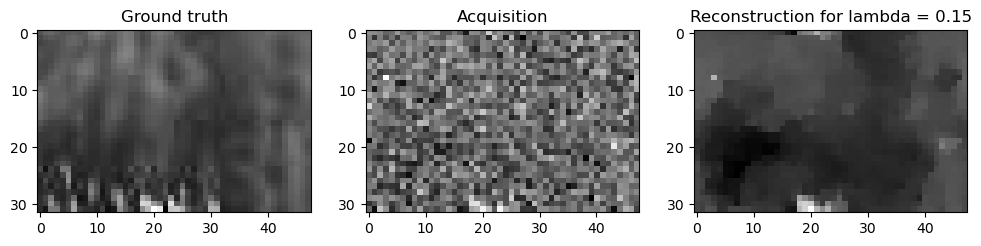

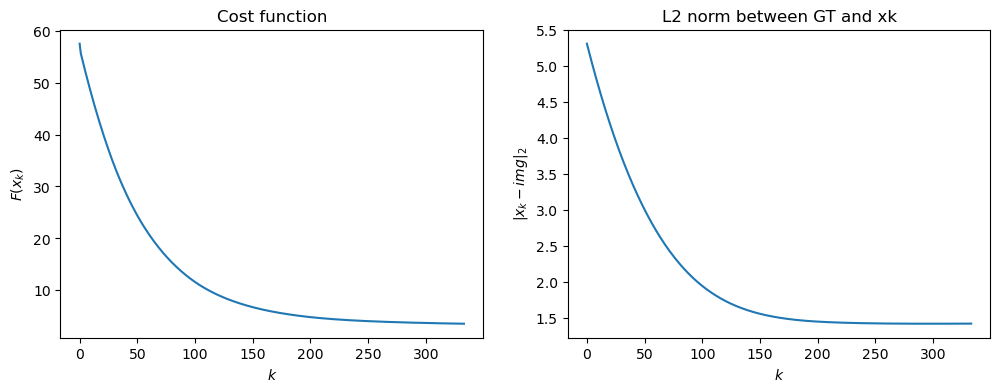

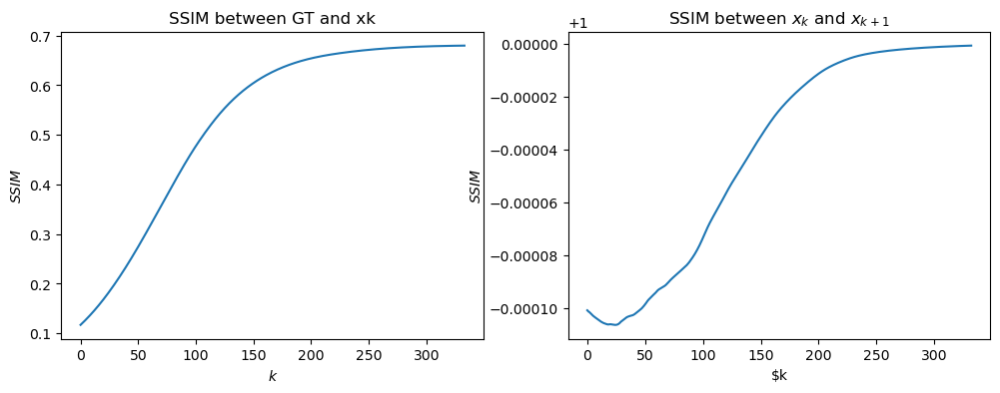

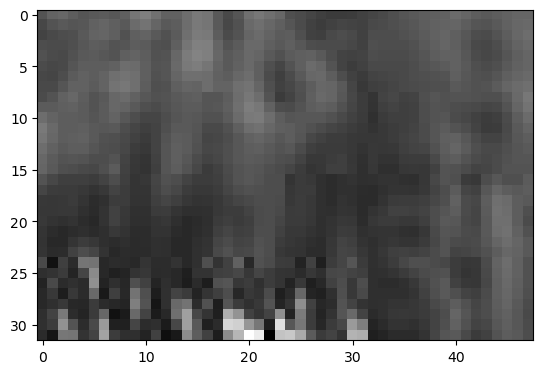

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 268 because of Cost function
I got stopped at iteration 364 because of Cost function
{-0.1: 0.37538263844752073, 0.1: 0.5705868695917925, 0.3: 0.3564558794616247, 0.5: 0.30757405853201025, 0.7: 0.28846073836412456}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 268 because of Cost function
I got stopped at iteration 329 because of Cost function
I got stopped at iteration 364 because of Cost function
{-0.1: 0.37538263844752073, 0.1: 0.5705868695917925, 0.3: 0.3564558794616247, 0.5: 0.30757405853201025, 0.7: 0.28846073836412456, 0.0: 0.3718823008711705, 0.2: 0.41463386995367263}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 140 becaus

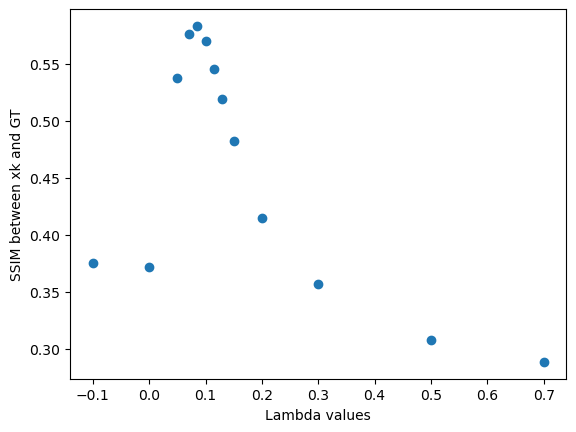

I got stopped at iteration 233 because of Cost function


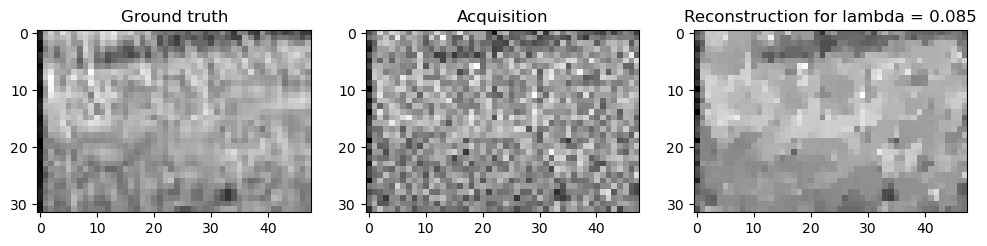

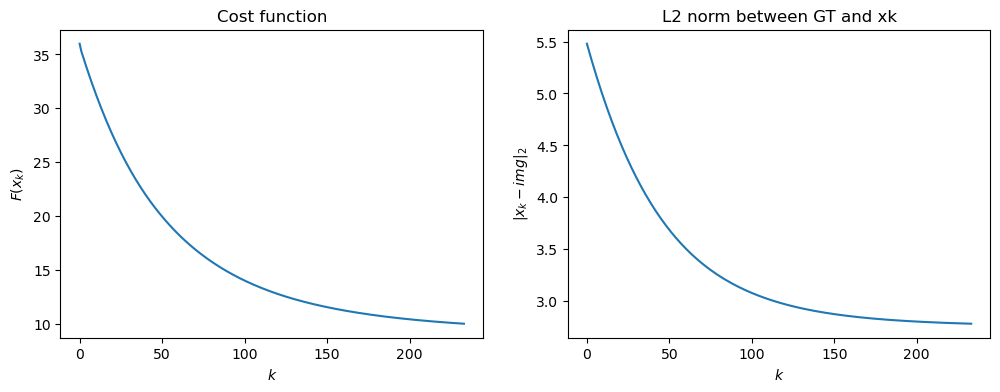

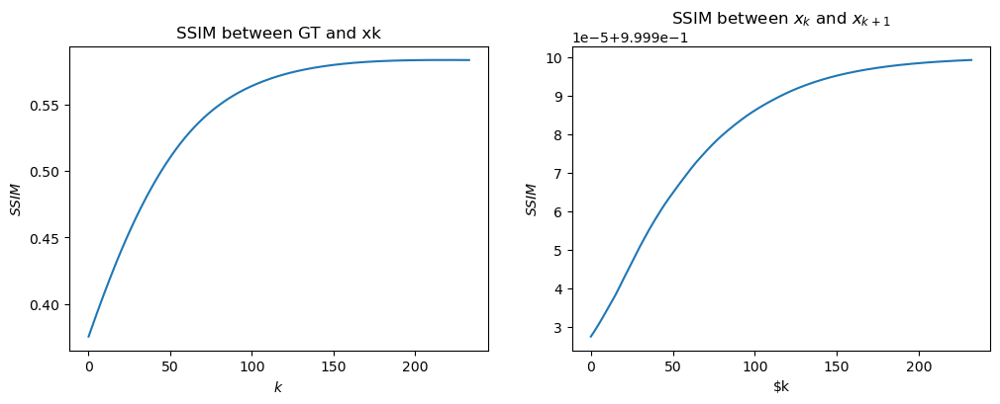

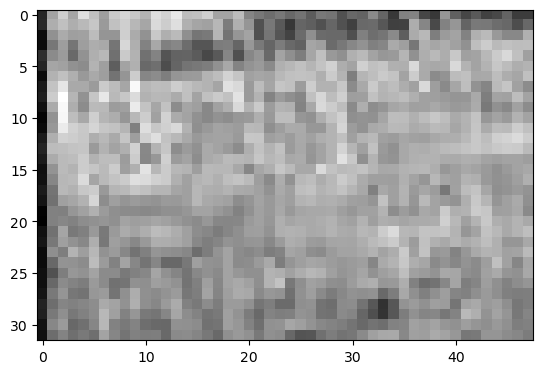

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 277 because of Sequence norm
I got stopped at iteration 385 because of Sequence norm
{-0.1: 0.3289273806628, 0.1: 0.505508842886772, 0.3: 0.2535981036128353, 0.5: 0.22564505121865183, 0.7: 0.2169271117528414}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 277 because of Sequence norm
I got stopped at iteration 323 because of Sequence norm
I got stopped at iteration 385 because of Sequence norm
{-0.1: 0.3289273806628, 0.1: 0.505508842886772, 0.3: 0.2535981036128353, 0.5: 0.22564505121865183, 0.7: 0.2169271117528414, 0.0: 0.3255832959459063, 0.2: 0.31579859968721247}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 150 because of Cost fu

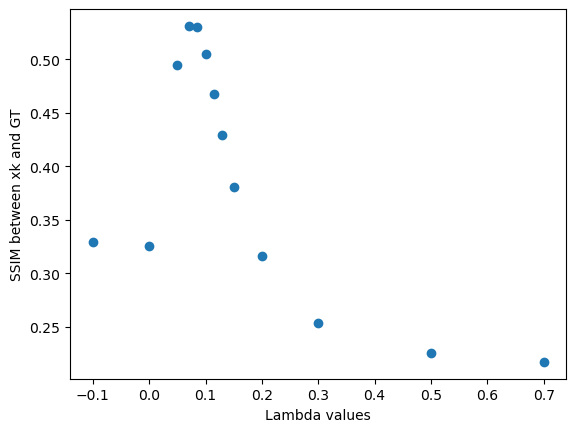

I got stopped at iteration 212 because of Cost function


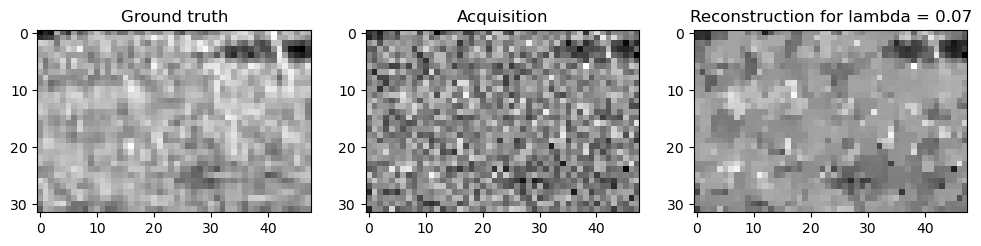

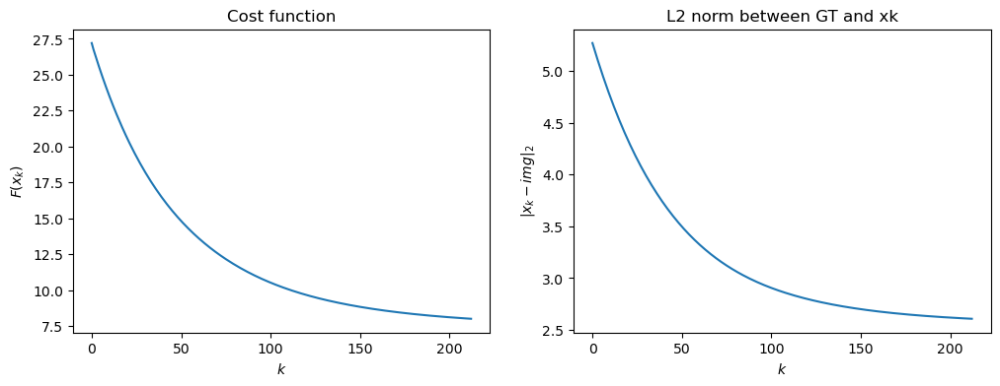

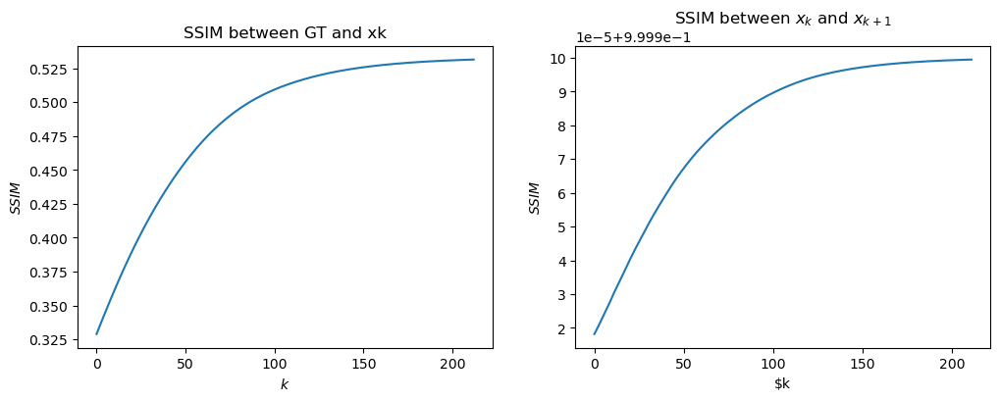

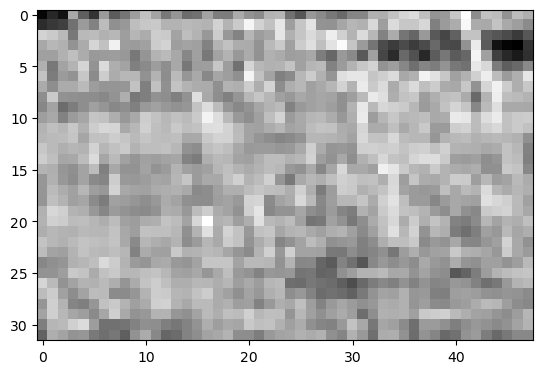

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 259 because of Cost function
I got stopped at iteration 336 because of Cost function
{-0.1: 0.38141113180157266, 0.1: 0.6069383427004945, 0.3: 0.3988388883664499, 0.5: 0.34178285598904745, 0.7: 0.32157658972777625}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 259 because of Cost function
I got stopped at iteration 336 because of Cost function
I got stopped at iteration 336 because of Cost function
{-0.1: 0.38141113180157266, 0.1: 0.6069383427004945, 0.3: 0.3988388883664499, 0.5: 0.34178285598904745, 0.7: 0.32157658972777625, 0.0: 0.377776885865505, 0.2: 0.454075817604724}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 144 because o

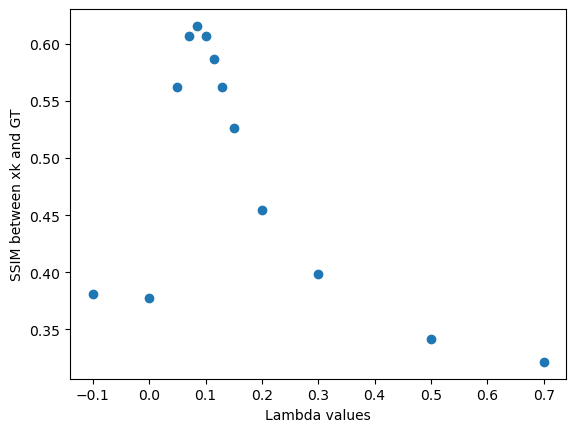

I got stopped at iteration 231 because of Cost function


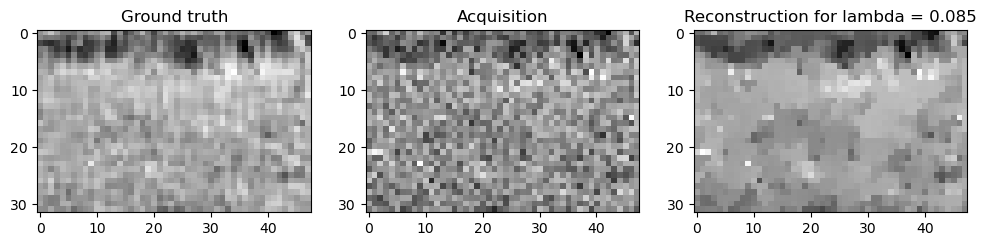

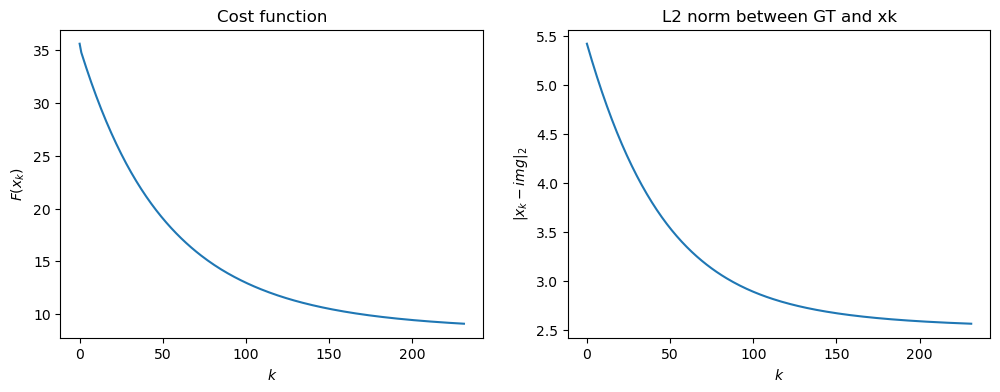

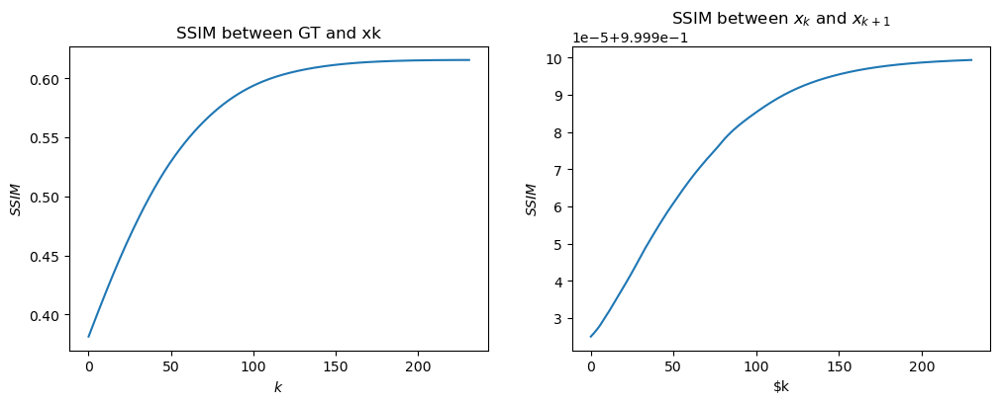

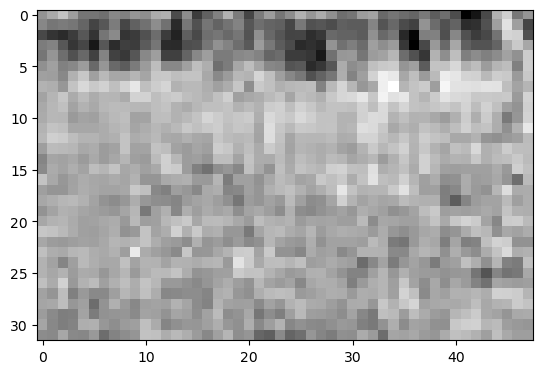

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 257 because of Sequence norm
I got stopped at iteration 339 because of Cost function
{-0.1: 0.3973359068010094, 0.1: 0.5768033579244164, 0.3: 0.3500793058963335, 0.5: 0.2907205879998484, 0.7: 0.27121174051572594}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 257 because of Sequence norm
I got stopped at iteration 307 because of Cost function
I got stopped at iteration 339 because of Cost function
{-0.1: 0.3973359068010094, 0.1: 0.5768033579244164, 0.3: 0.3500793058963335, 0.5: 0.2907205879998484, 0.7: 0.27121174051572594, 0.0: 0.3934404955368381, 0.2: 0.4112008852448447}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 143 because of 

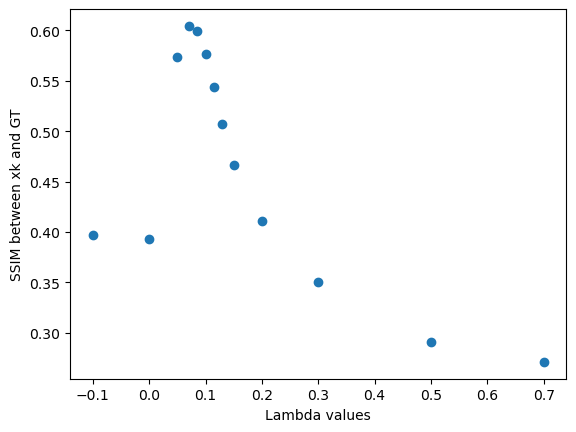

I got stopped at iteration 198 because of Cost function


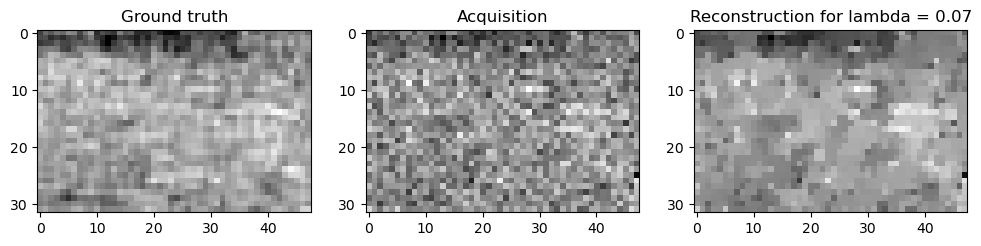

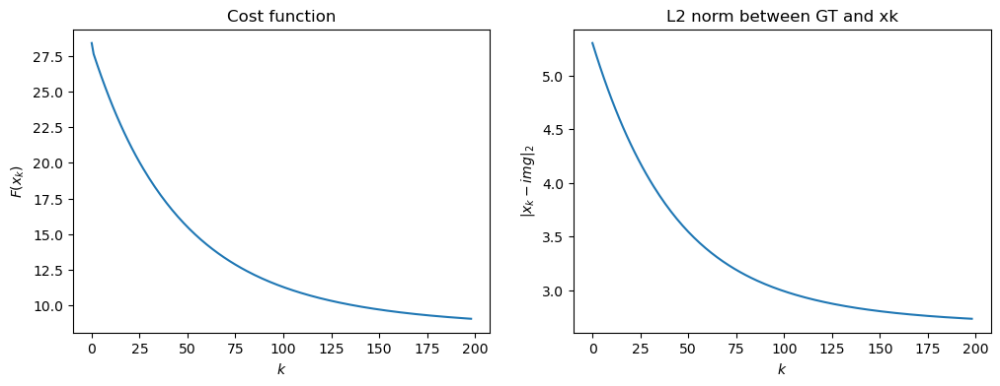

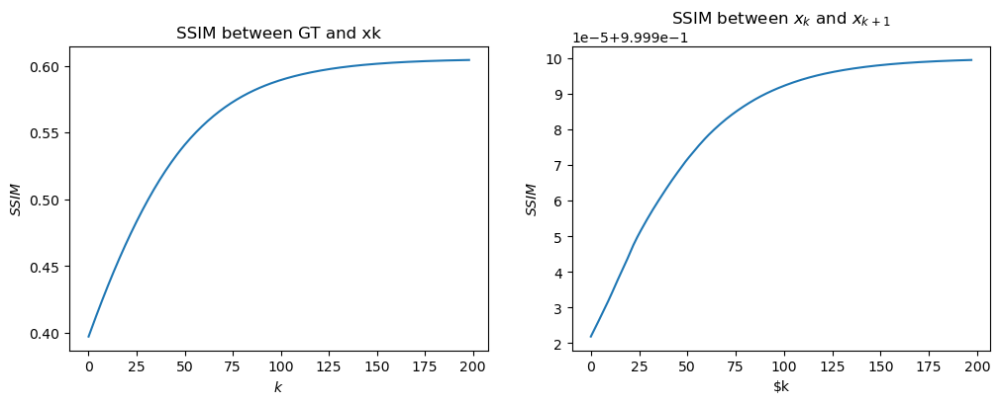

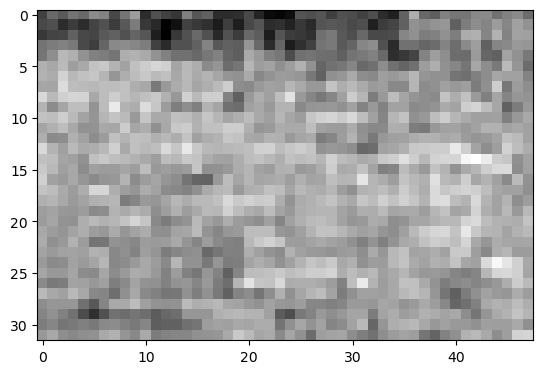

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 241 because of Cost function
I got stopped at iteration 247 because of Cost function
I got stopped at iteration 253 because of Cost function
I got stopped at iteration 262 because of Cost function
{-0.1: 0.4105345954003061, 0.1: 0.6096313627784189, 0.3: 0.5012955624194593, 0.5: 0.47022692403051214, 0.7: 0.45417762096424047}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 241 because of Cost function
I got stopped at iteration 257 because of Cost function
I got stopped at iteration 247 because of Cost function
{-0.1: 0.4105345954003061, 0.1: 0.6096313627784189, 0.3: 0.5012955624194593, 0.5: 0.47022692403051214, 0.7: 0.45417762096424047, 0.0: 0.40745645501287076, 0.2: 0.5356894592317858}
--------
range examined: [0.   0.

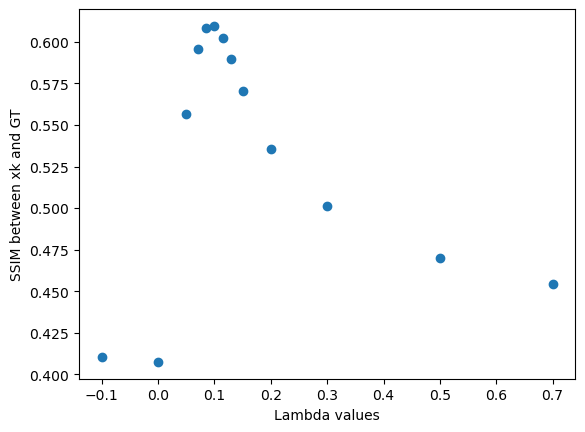

I got stopped at iteration 241 because of Cost function


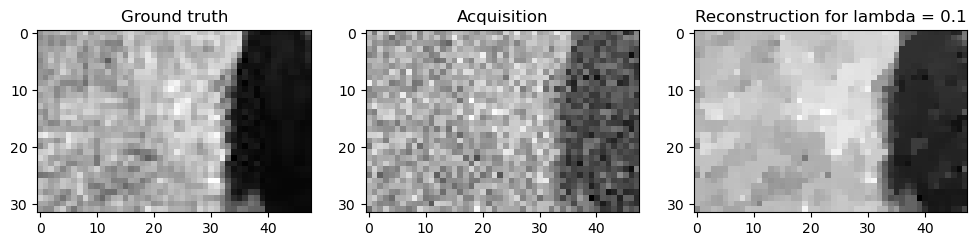

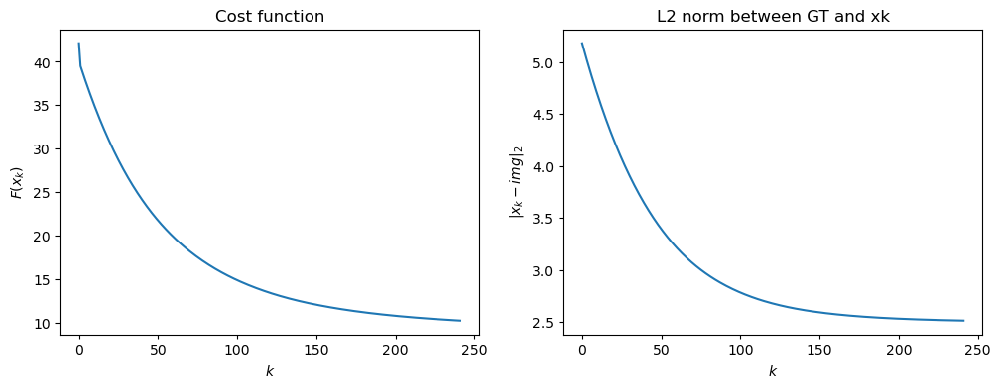

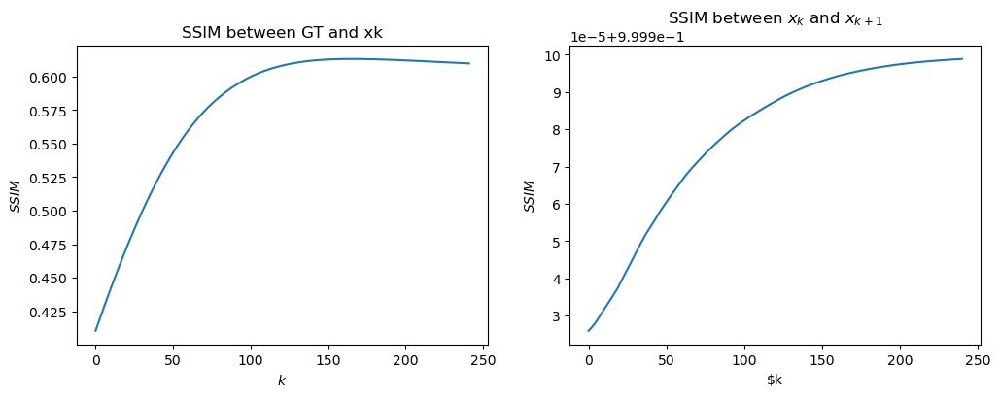

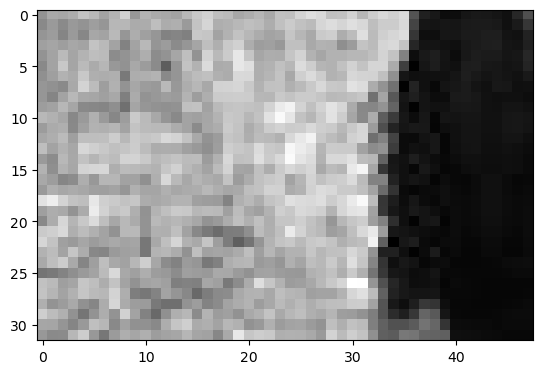

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 234 because of Cost function
I got stopped at iteration 296 because of Cost function
I got stopped at iteration 325 because of Cost function
I got stopped at iteration 366 because of Cost function
{-0.1: 0.26287684073024853, 0.1: 0.6806989296069633, 0.3: 0.652639096583895, 0.5: 0.603919360462189, 0.7: 0.5698514136933827}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 234 because of Cost function
I got stopped at iteration 281 because of Cost function
I got stopped at iteration 296 because of Cost function
{-0.1: 0.26287684073024853, 0.1: 0.6806989296069633, 0.3: 0.652639096583895, 0.5: 0.603919360462189, 0.7: 0.5698514136933827, 0.0: 0.2591657354304775, 0.2: 0.6931324173311217}
--------
range examined: [0.1  0.15 0.2 

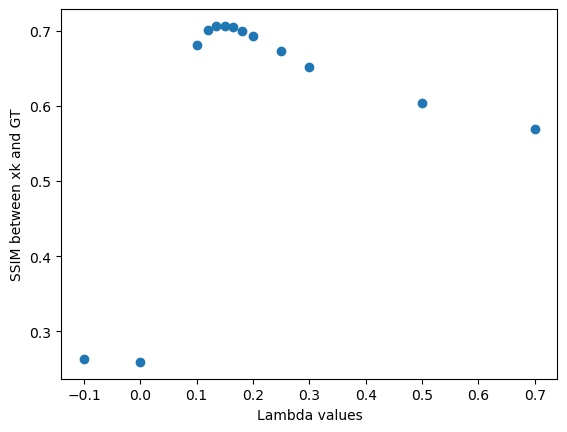

I got stopped at iteration 261 because of Cost function


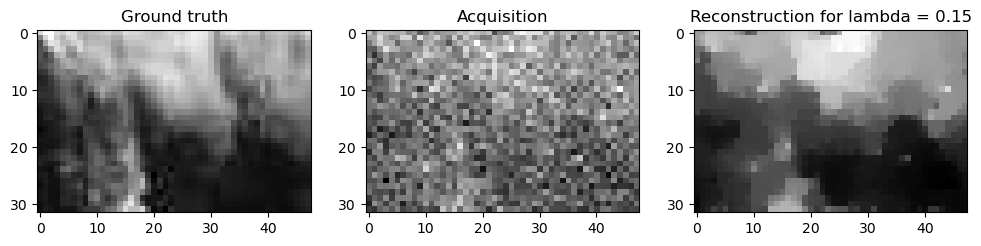

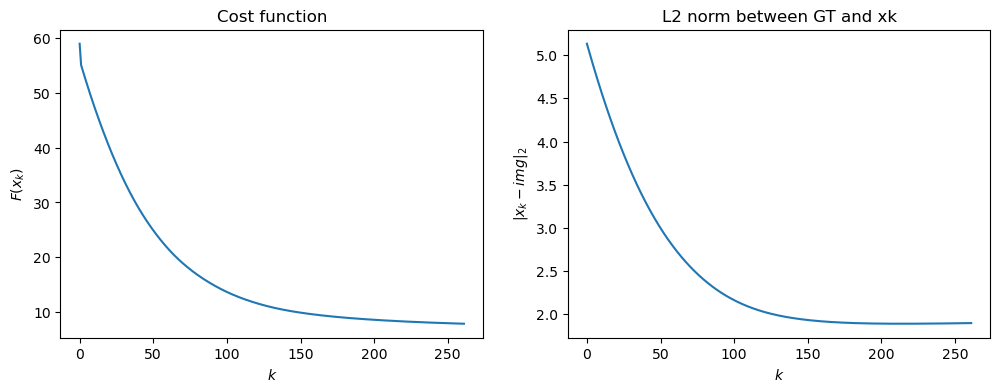

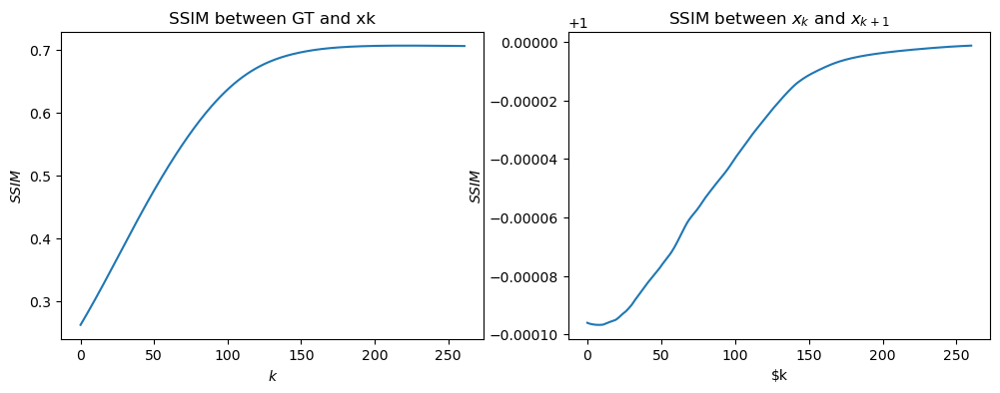

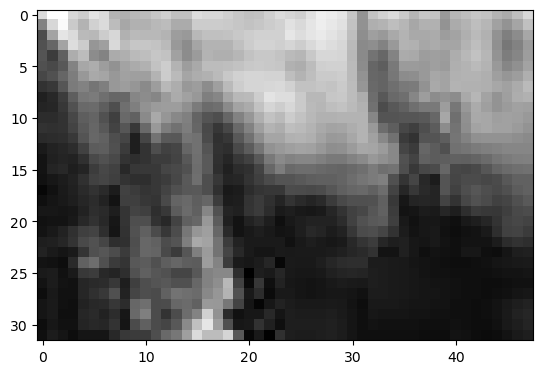

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 246 because of Cost function
I got stopped at iteration 328 because of Cost function
{-0.1: 0.2805154552031158, 0.1: 0.6262618429273288, 0.3: 0.550800336245376, 0.5: 0.47810062495486844, 0.7: 0.4509537329313349}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 246 because of Cost function
I got stopped at iteration 288 because of Cost function
I got stopped at iteration 328 because of Cost function
{-0.1: 0.2805154552031158, 0.1: 0.6262618429273288, 0.3: 0.550800336245376, 0.5: 0.47810062495486844, 0.7: 0.4509537329313349, 0.0: 0.2768107126968735, 0.2: 0.598369795702878}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 142 because of Cos

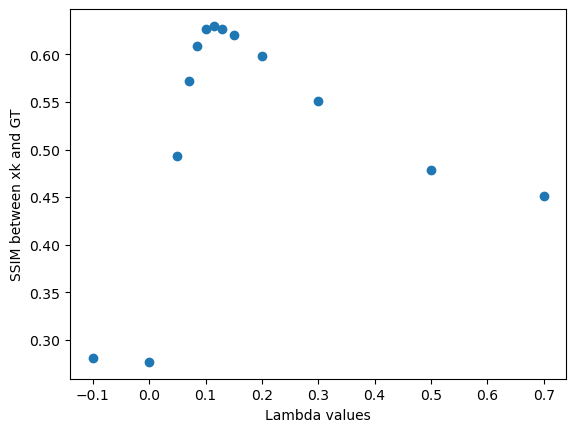

I got stopped at iteration 263 because of Cost function


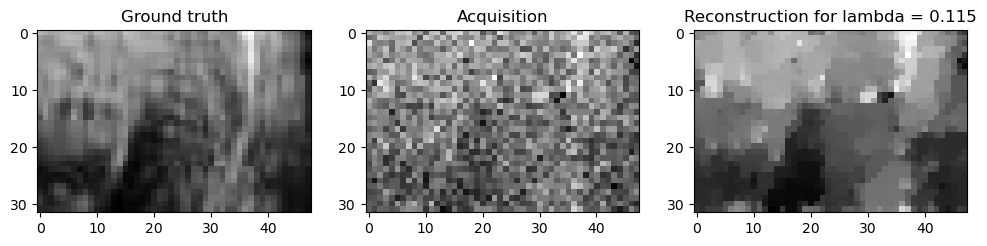

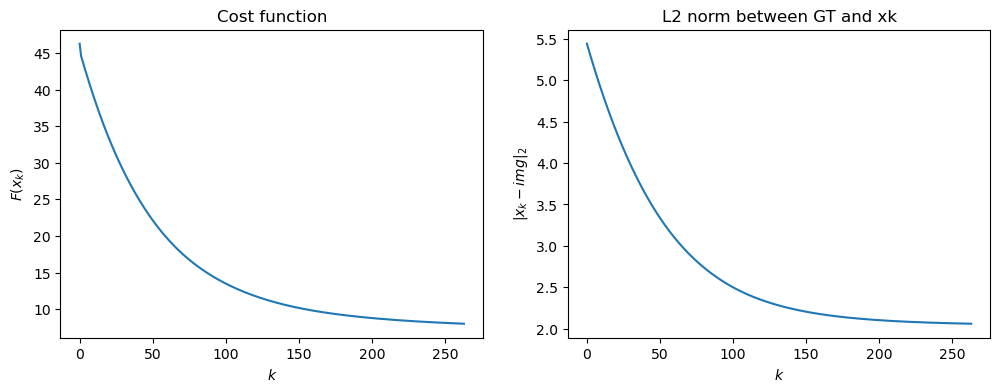

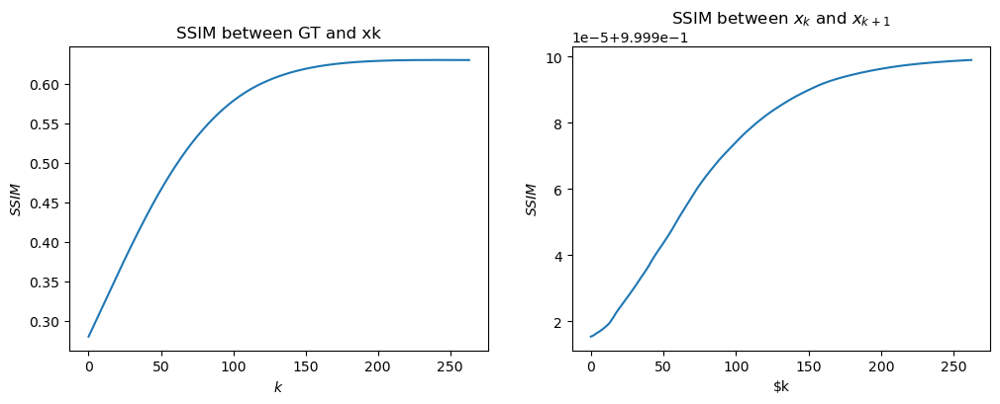

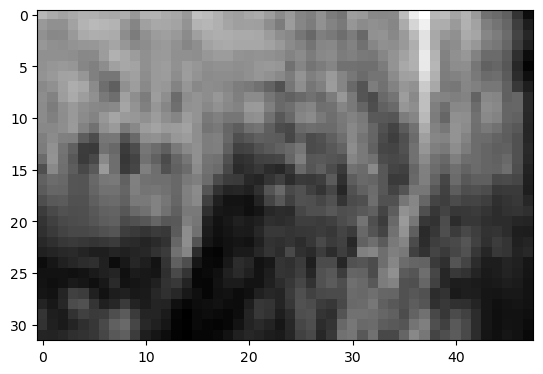

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 213 because of Cost function
I got stopped at iteration 283 because of Cost function
I got stopped at iteration 319 because of Cost function
I got stopped at iteration 343 because of Cost function
{-0.1: 0.5752497556849957, 0.1: 0.7347267611995948, 0.3: 0.5734191962924966, 0.5: 0.5009331368622337, 0.7: 0.46496965283171676}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 213 because of Cost function
I got stopped at iteration 262 because of Cost function
I got stopped at iteration 283 because of Cost function
{-0.1: 0.5752497556849957, 0.1: 0.7347267611995948, 0.3: 0.5734191962924966, 0.5: 0.5009331368622337, 0.7: 0.46496965283171676, 0.0: 0.5717277147761376, 0.2: 0.6341561273779239}
--------
range examined: [0.   0.05 

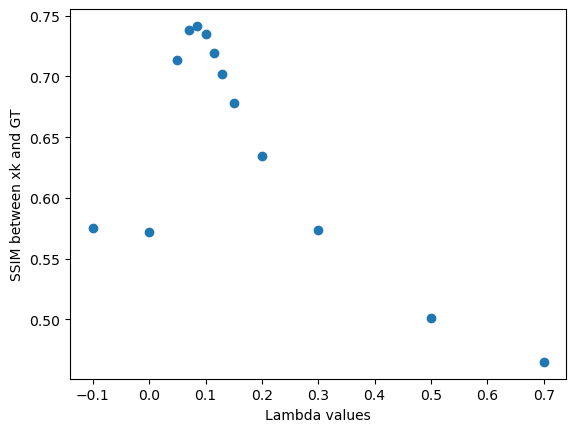

I got stopped at iteration 192 because of Cost function


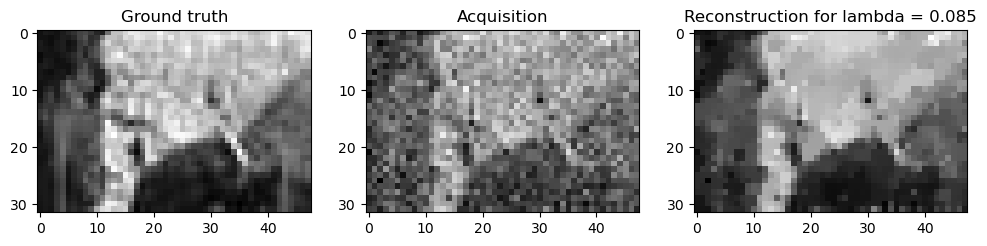

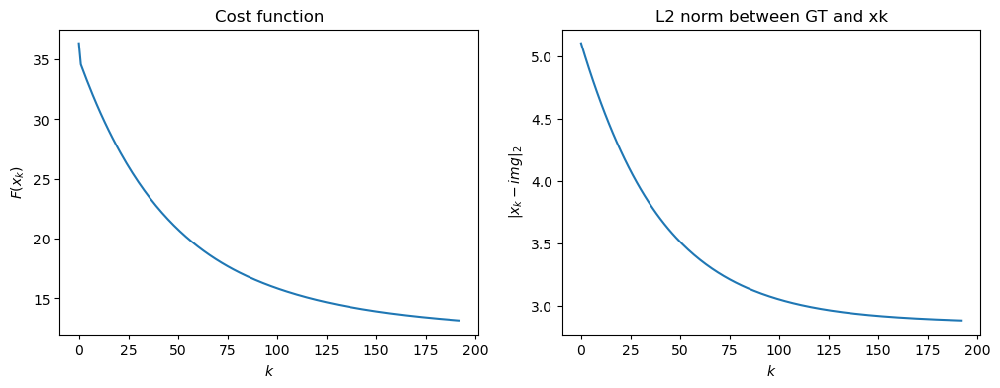

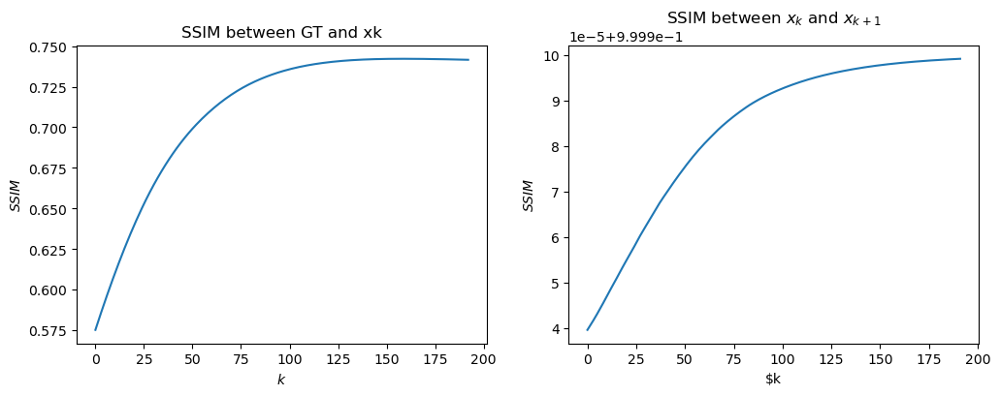

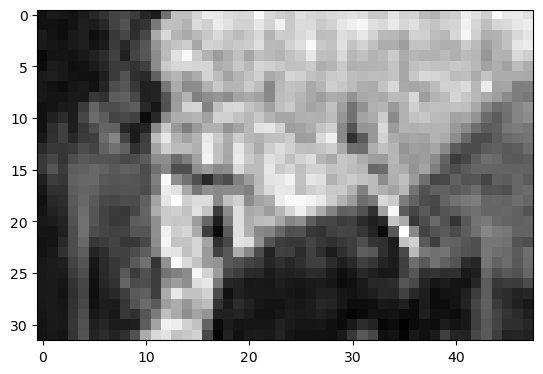

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 244 because of Cost function
I got stopped at iteration 303 because of Cost function
I got stopped at iteration 332 because of Cost function
I got stopped at iteration 362 because of Cost function
{-0.1: 0.3259938923306803, 0.1: 0.6490422196155308, 0.3: 0.5845461737123918, 0.5: 0.5323905586614673, 0.7: 0.4991158216632164}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 244 because of Cost function
I got stopped at iteration 278 because of Cost function
I got stopped at iteration 303 because of Cost function
{-0.1: 0.3259938923306803, 0.1: 0.6490422196155308, 0.3: 0.5845461737123918, 0.5: 0.5323905586614673, 0.7: 0.4991158216632164, 0.0: 0.3223860940329877, 0.2: 0.6258669347197319}
--------
range examined: [0.   0.05 0.

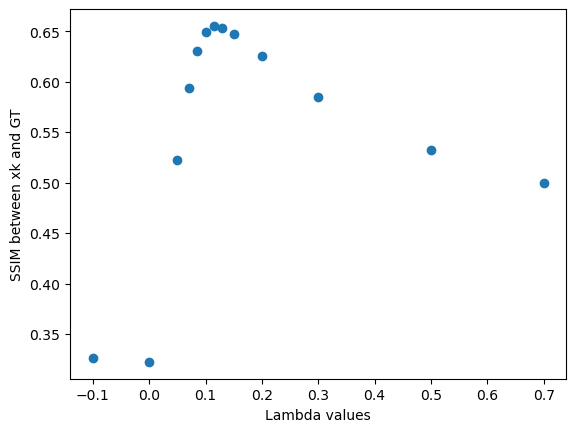

I got stopped at iteration 261 because of Cost function


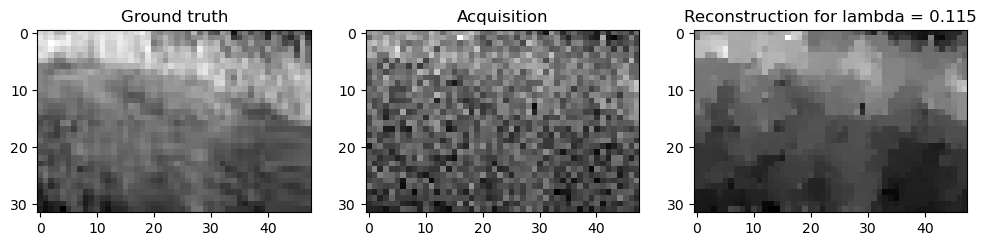

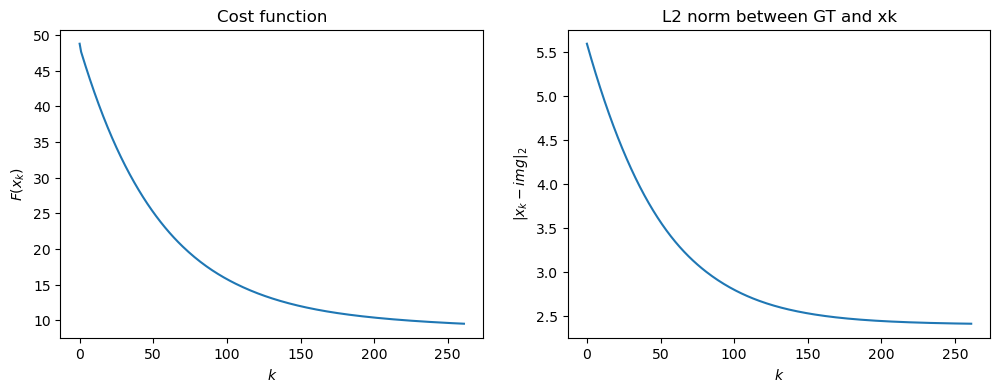

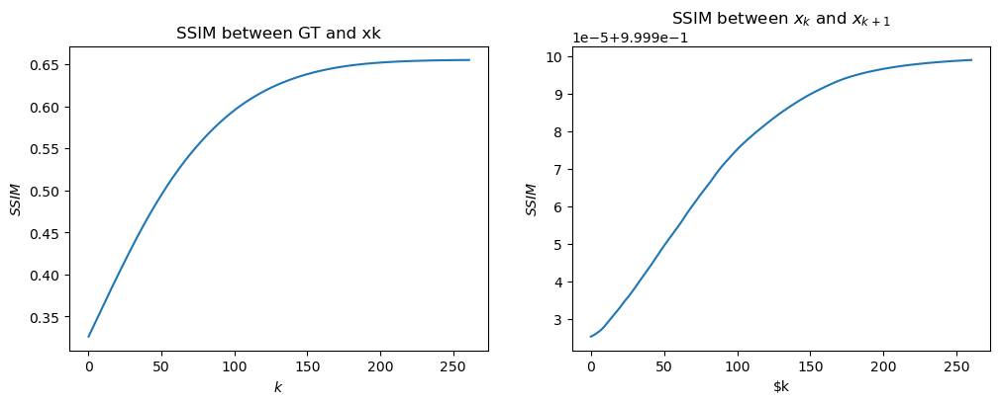

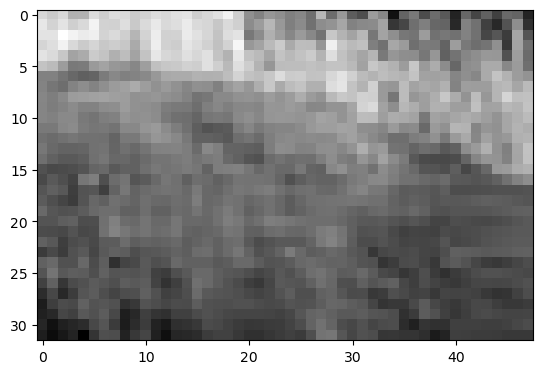

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 251 because of Cost function
I got stopped at iteration 379 because of Cost function
{-0.1: 0.4552257637176963, 0.1: 0.5782943826982825, 0.3: 0.37494026781210077, 0.5: 0.3253963428230383, 0.7: 0.3035403541619326}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 251 because of Cost function
I got stopped at iteration 346 because of Cost function
I got stopped at iteration 379 because of Cost function
{-0.1: 0.4552257637176963, 0.1: 0.5782943826982825, 0.3: 0.37494026781210077, 0.5: 0.3253963428230383, 0.7: 0.3035403541619326, 0.0: 0.4514123126525619, 0.2: 0.44018587134567333}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 140 because of

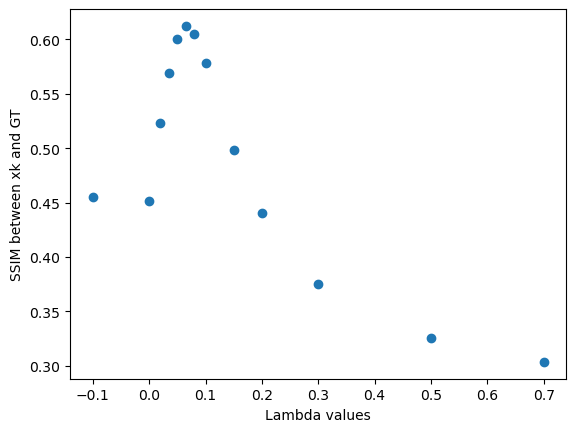

I got stopped at iteration 179 because of Cost function


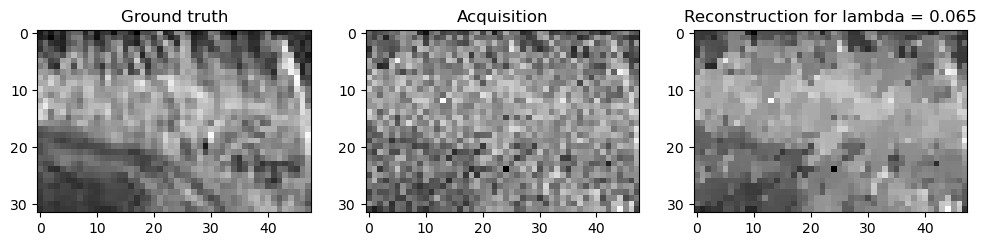

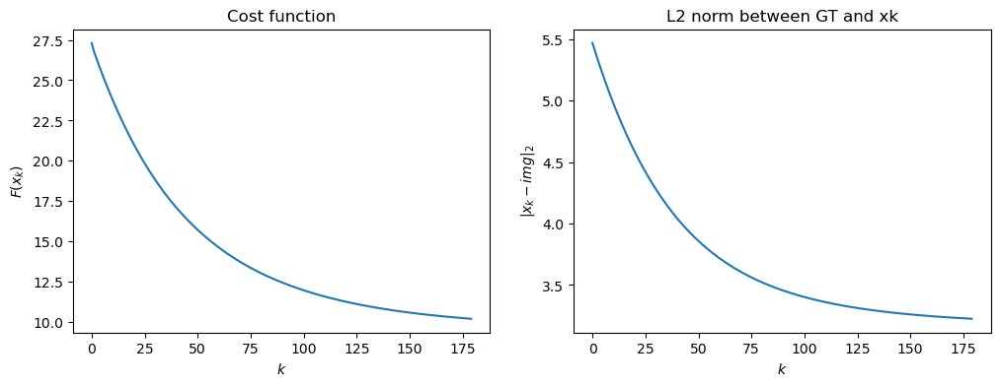

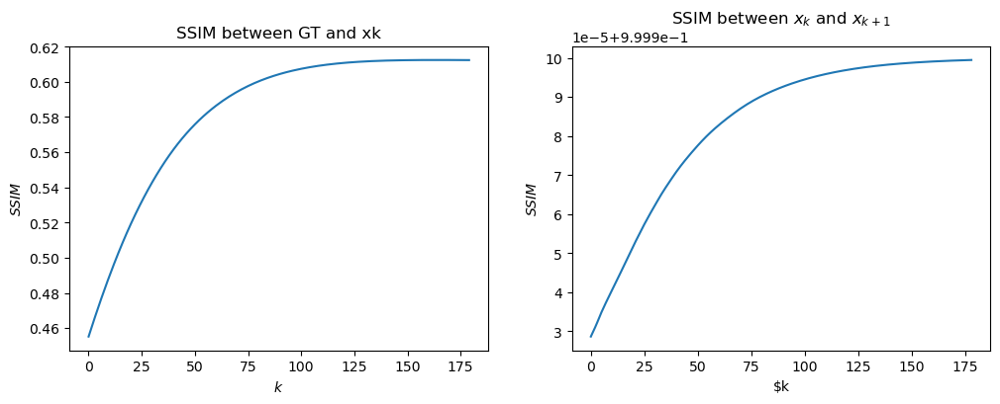

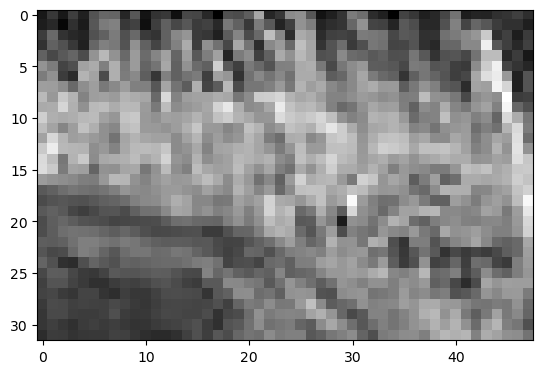

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 282 because of Cost function
{-0.1: 0.30819145334980963, 0.1: 0.5422082775365801, 0.3: 0.3098695993486864, 0.5: 0.2676216686976825, 0.7: 0.2521449372583837}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 282 because of Cost function
I got stopped at iteration 378 because of Cost function
{-0.1: 0.30819145334980963, 0.1: 0.5422082775365801, 0.3: 0.3098695993486864, 0.5: 0.2676216686976825, 0.7: 0.2521449372583837, 0.0: 0.3045981789328684, 0.2: 0.37560367703746345}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 146 because of Cost function
I got stopped at iteration 282 because of Cost function
I got stopped at iteration 350 because of

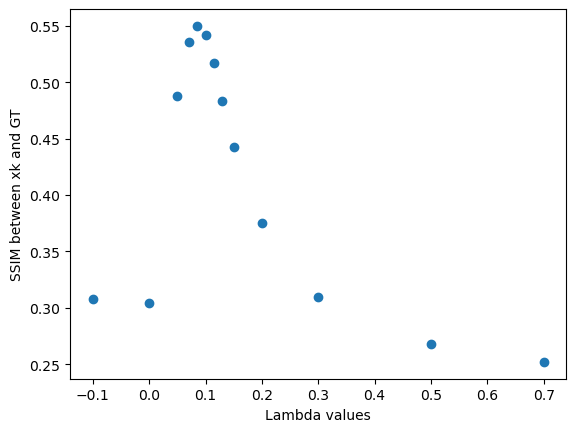

I got stopped at iteration 244 because of Cost function


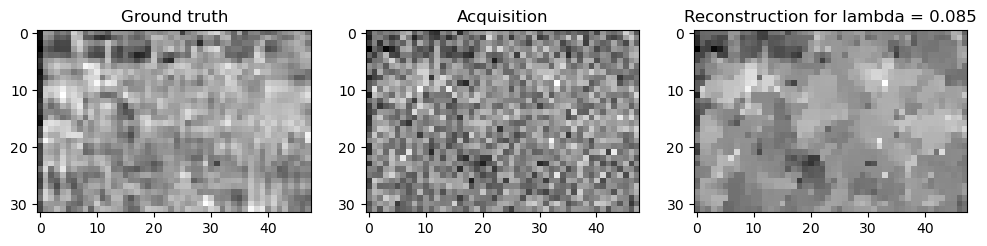

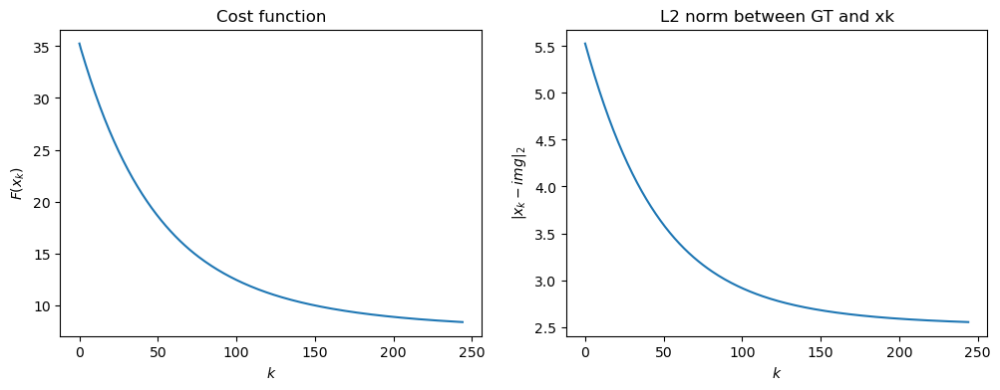

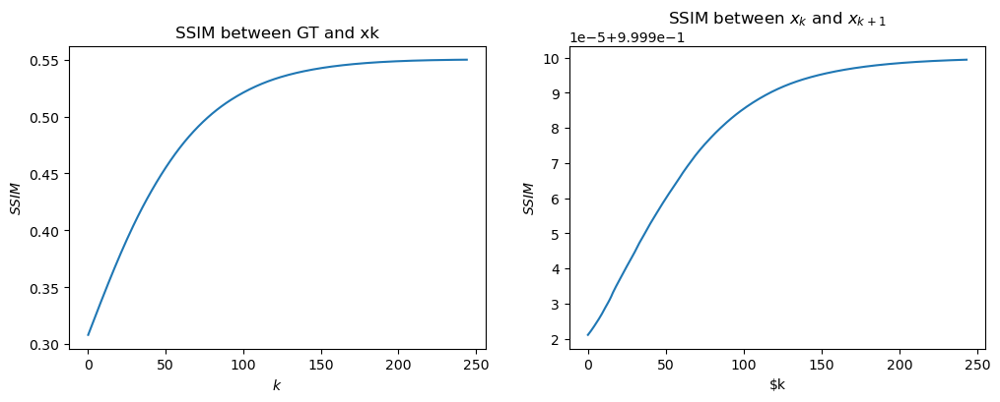

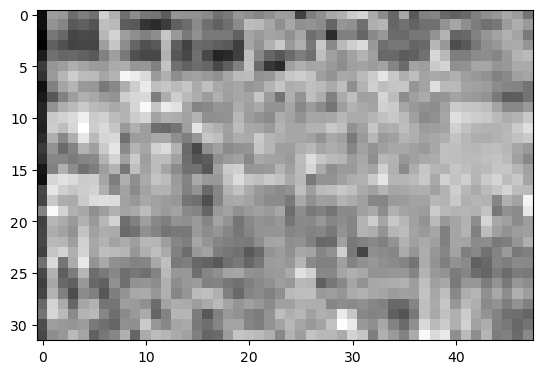

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 288 because of Sequence norm
I got stopped at iteration 377 because of Sequence norm
I got stopped at iteration 335 because of Sequence norm
I got stopped at iteration 330 because of Sequence norm
{-0.1: 0.32445342396290344, 0.1: 0.48492255358637126, 0.3: 0.22408411533864234, 0.5: 0.20401998959214016, 0.7: 0.19715216534374594}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 288 because of Sequence norm
I got stopped at iteration 360 because of Sequence norm
I got stopped at iteration 377 because of Sequence norm
{-0.1: 0.32445342396290344, 0.1: 0.48492255358637126, 0.3: 0.22408411533864234, 0.5: 0.20401998959214016, 0.7: 0.19715216534374594, 0.0: 0.32054223770045115, 0.2: 0.27606408872047394}
--------
range examined: [

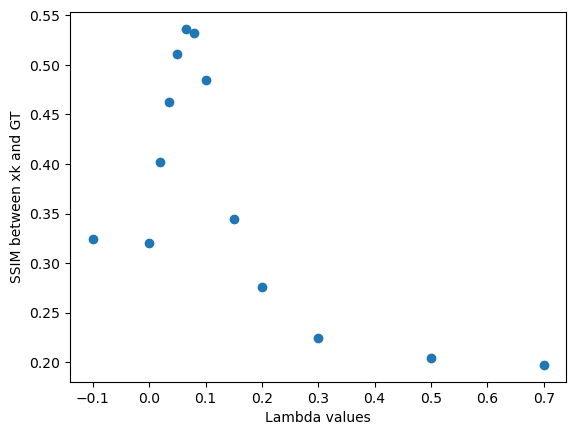

I got stopped at iteration 199 because of Cost function


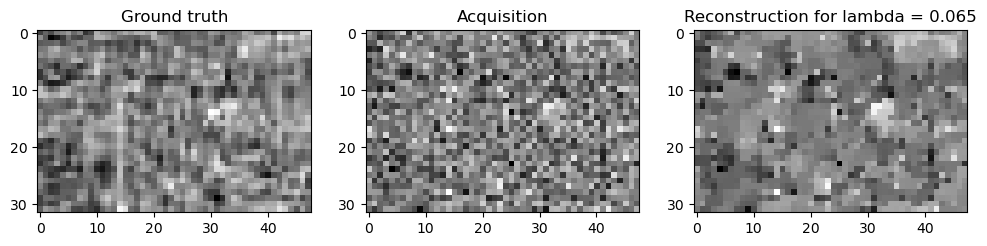

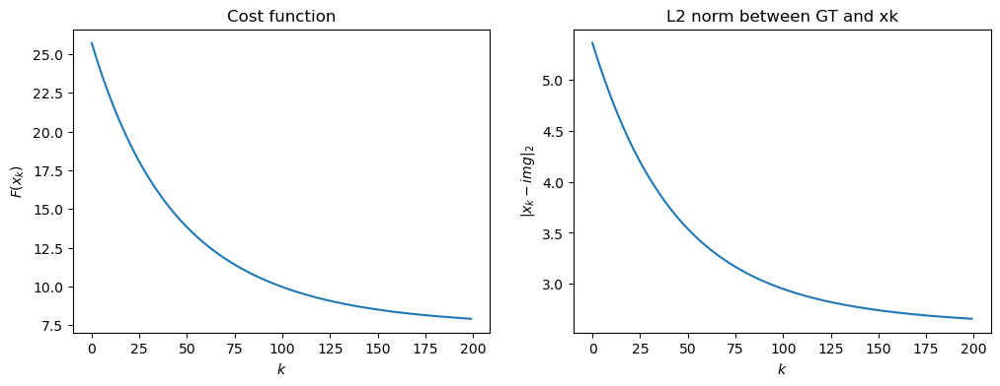

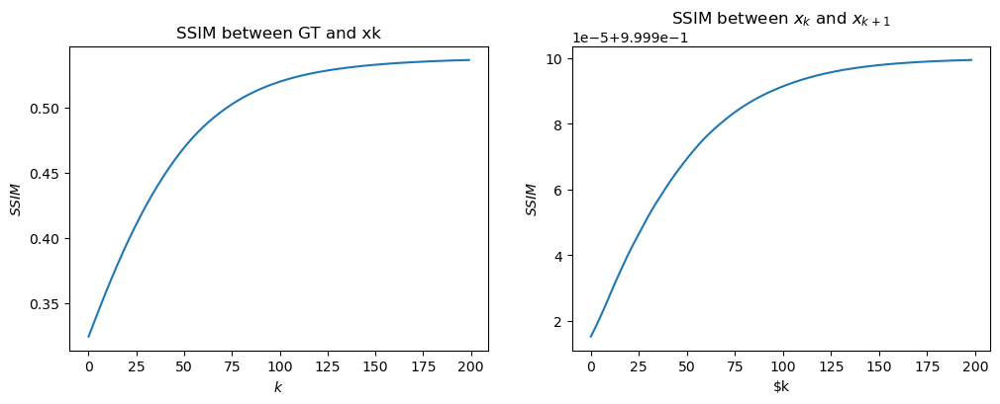

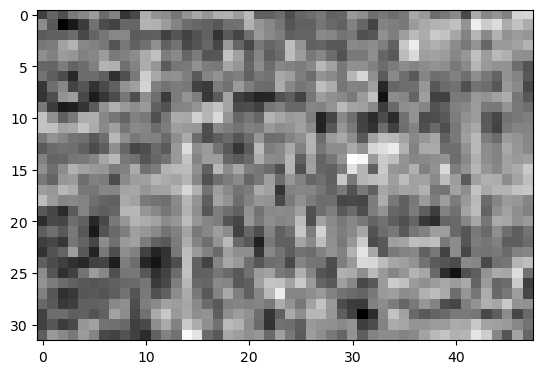

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 266 because of Cost function
I got stopped at iteration 307 because of Cost function
I got stopped at iteration 351 because of Cost function
{-0.1: 0.33668348816577215, 0.1: 0.5982554006870648, 0.3: 0.4611569826625113, 0.5: 0.4119334715200021, 0.7: 0.38412252743054115}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 266 because of Cost function
I got stopped at iteration 294 because of Cost function
I got stopped at iteration 307 because of Cost function
{-0.1: 0.33668348816577215, 0.1: 0.5982554006870648, 0.3: 0.4611569826625113, 0.5: 0.4119334715200021, 0.7: 0.38412252743054115, 0.0: 0.3329184649492999, 0.2: 0.5037841235699286}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because o

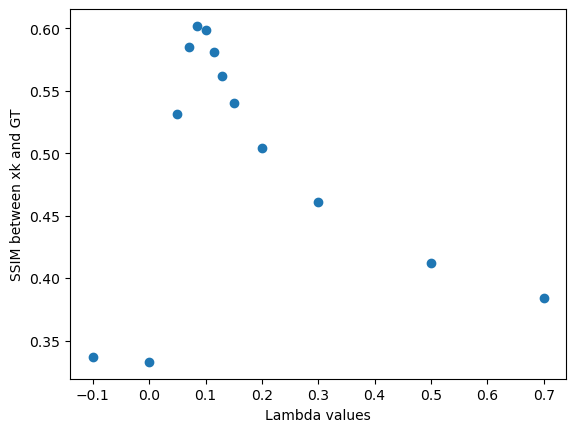

I got stopped at iteration 234 because of Cost function


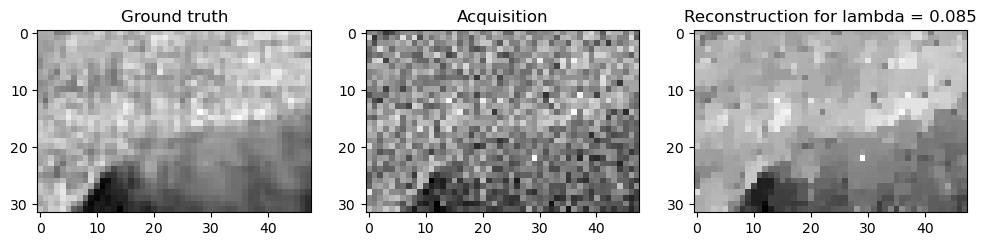

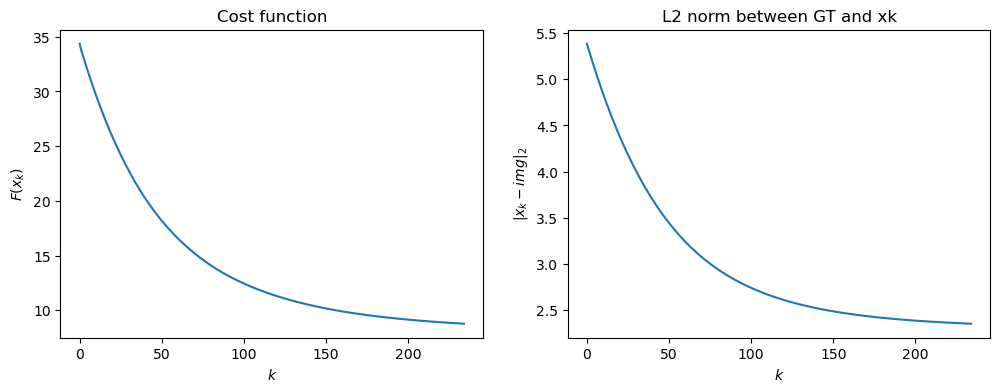

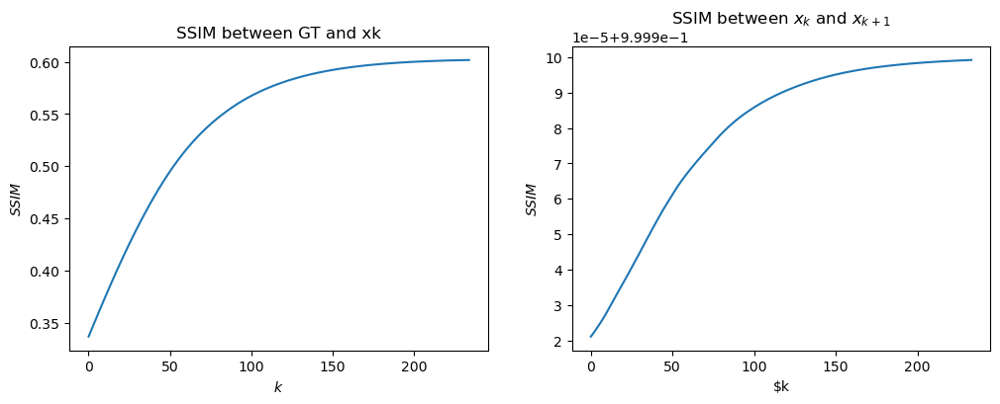

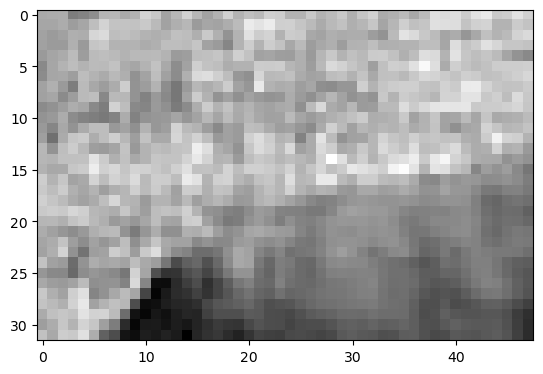

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 244 because of Cost function
I got stopped at iteration 283 because of Cost function
I got stopped at iteration 308 because of Cost function
I got stopped at iteration 335 because of Cost function
{-0.1: 0.29003437464265397, 0.1: 0.6709824385957124, 0.3: 0.6460394654046431, 0.5: 0.6085672016436007, 0.7: 0.5867969741004873}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 244 because of Cost function
I got stopped at iteration 274 because of Cost function
I got stopped at iteration 283 because of Cost function
{-0.1: 0.29003437464265397, 0.1: 0.6709824385957124, 0.3: 0.6460394654046431, 0.5: 0.6085672016436007, 0.7: 0.5867969741004873, 0.0: 0.2865721727979304, 0.2: 0.6799954367313147}
--------
range examined: [0.1  0.15 

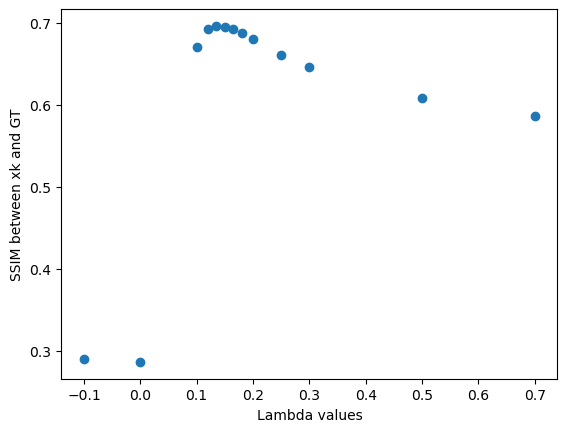

I got stopped at iteration 271 because of Cost function


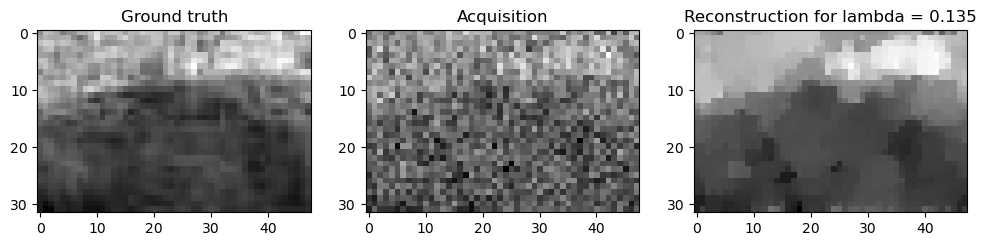

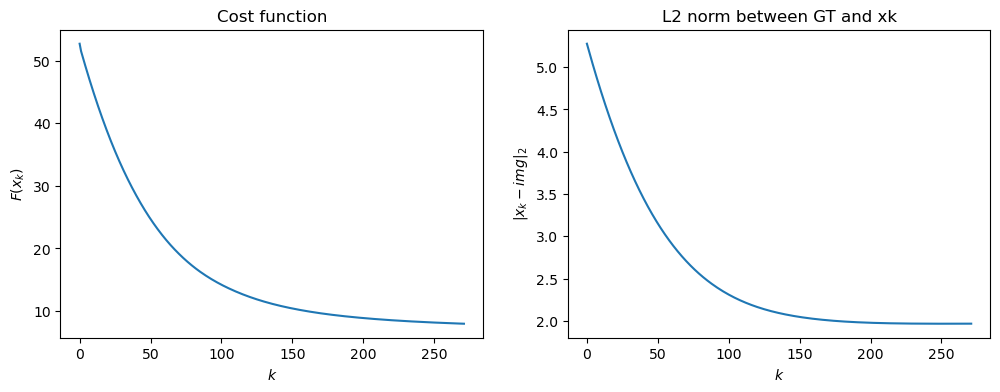

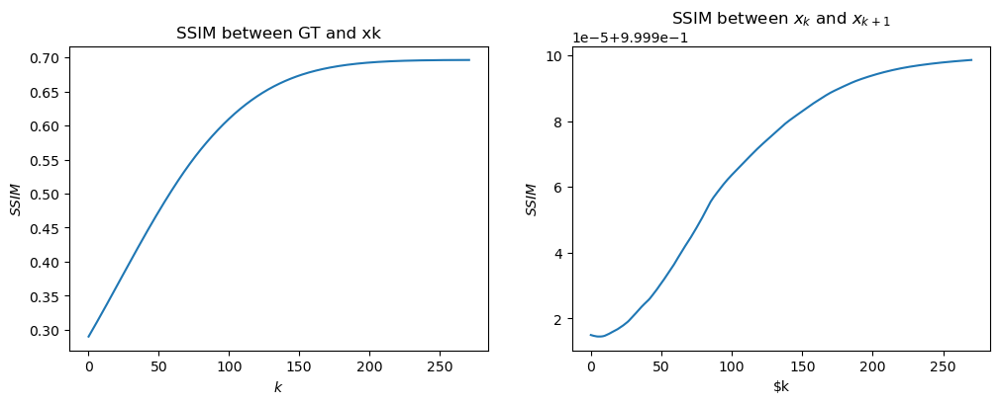

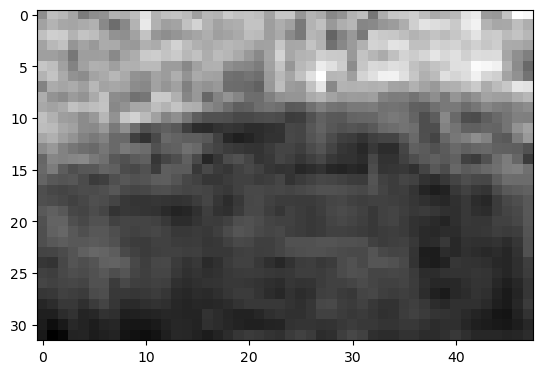

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 225 because of Cost function
I got stopped at iteration 292 because of Cost function
I got stopped at iteration 368 because of Cost function
I got stopped at iteration 396 because of Cost function
{-0.1: 0.5175467495722762, 0.1: 0.7053040249398904, 0.3: 0.5308687929009016, 0.5: 0.4479364007930127, 0.7: 0.4100023540440641}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 225 because of Cost function
I got stopped at iteration 287 because of Cost function
I got stopped at iteration 292 because of Cost function
{-0.1: 0.5175467495722762, 0.1: 0.7053040249398904, 0.3: 0.5308687929009016, 0.5: 0.4479364007930127, 0.7: 0.4100023540440641, 0.0: 0.5137218967889646, 0.2: 0.5892236832030187}
--------
range examined: [0.   0.05 0.

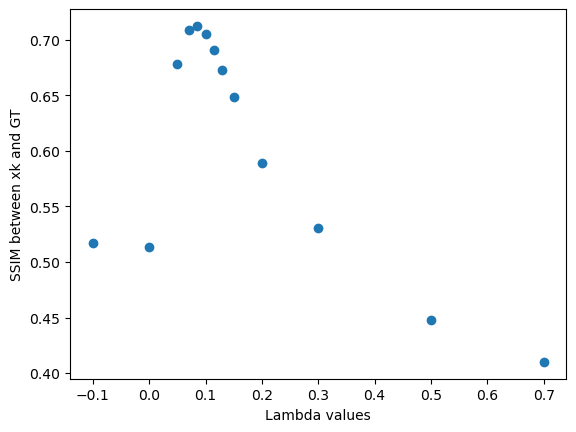

I got stopped at iteration 203 because of Cost function


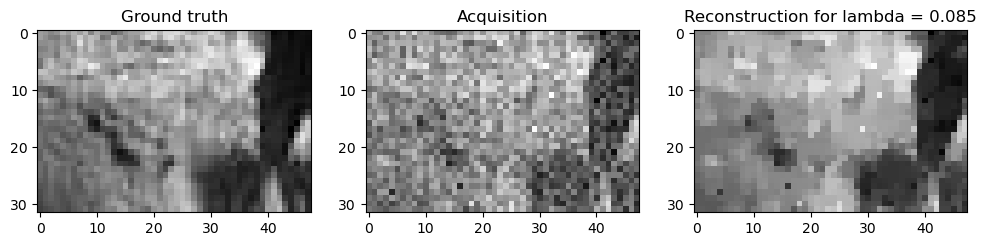

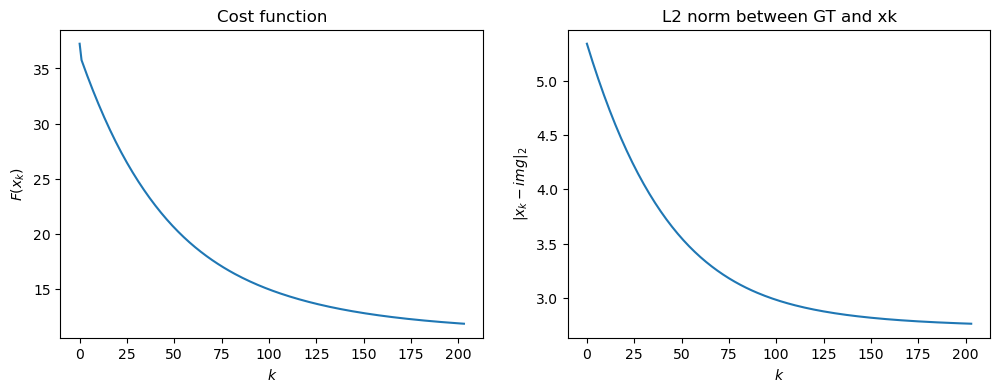

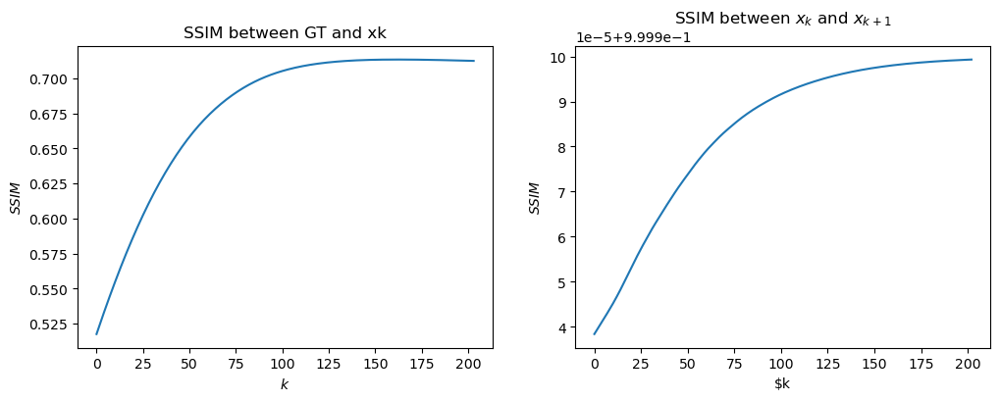

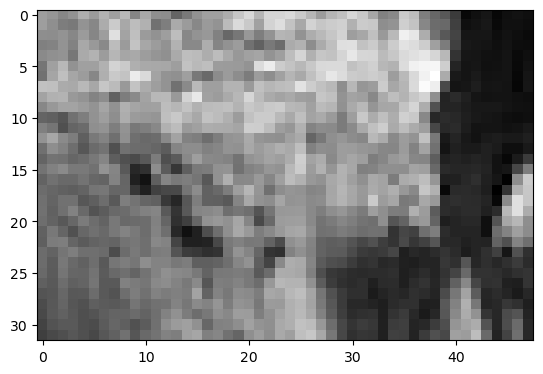

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 211 because of Cost function
I got stopped at iteration 282 because of Cost function
I got stopped at iteration 353 because of Cost function
{-0.1: 0.6433646483204827, 0.1: 0.7445190919585205, 0.3: 0.6040539833046871, 0.5: 0.5290678699952087, 0.7: 0.47931817193557497}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 211 because of Cost function
I got stopped at iteration 256 because of Cost function
I got stopped at iteration 282 because of Cost function
{-0.1: 0.6433646483204827, 0.1: 0.7445190919585205, 0.3: 0.6040539833046871, 0.5: 0.5290678699952087, 0.7: 0.47931817193557497, 0.0: 0.6403713955028808, 0.2: 0.6546656585529214}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of 

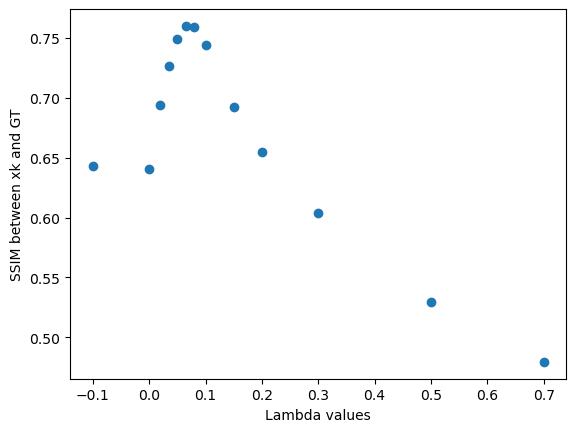

I got stopped at iteration 156 because of Cost function


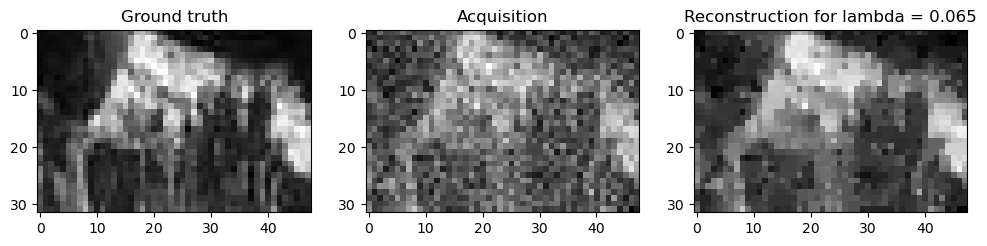

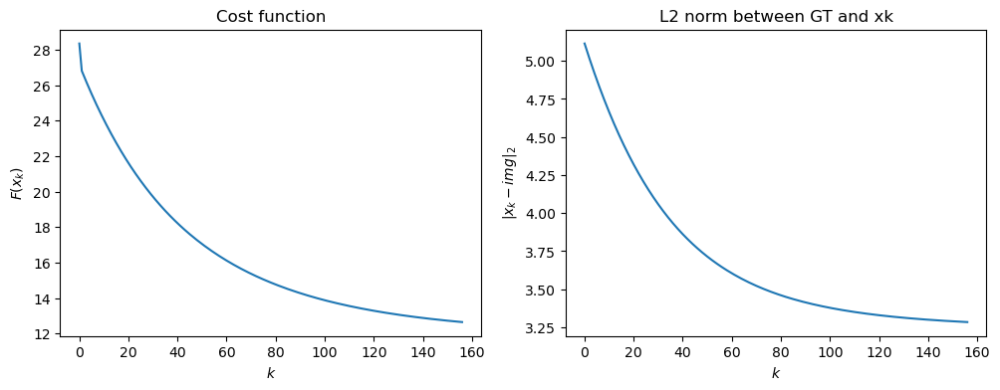

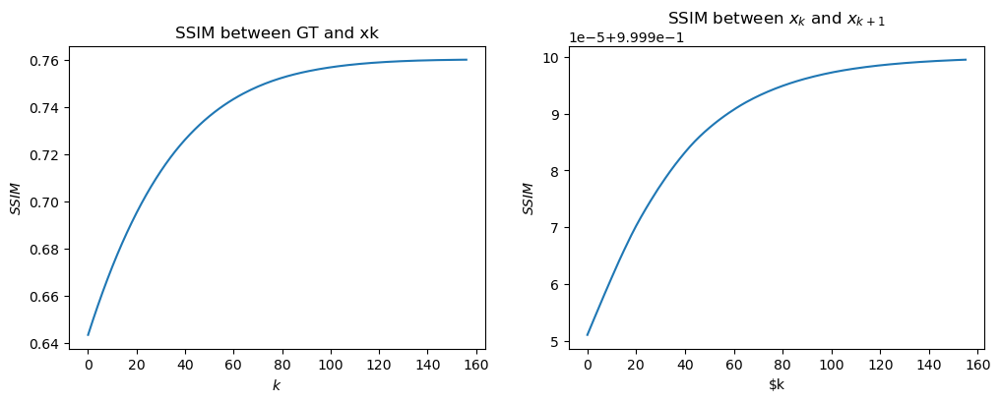

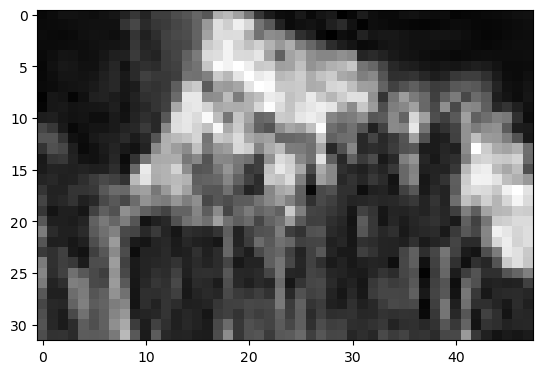

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 213 because of Cost function
I got stopped at iteration 216 because of Cost function
I got stopped at iteration 227 because of Cost function
I got stopped at iteration 242 because of Cost function
{-0.1: 0.5209310488540954, 0.1: 0.7164841471220708, 0.3: 0.6972428472447292, 0.5: 0.6759964464476224, 0.7: 0.6605549945886188}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 213 because of Cost function
I got stopped at iteration 224 because of Cost function
I got stopped at iteration 216 because of Cost function
{-0.1: 0.5209310488540954, 0.1: 0.7164841471220708, 0.3: 0.6972428472447292, 0.5: 0.6759964464476224, 0.7: 0.6605549945886188, 0.0: 0.5174534589024818, 0.2: 0.711415491494346}
--------
range examined: [0.   0.05 0.1

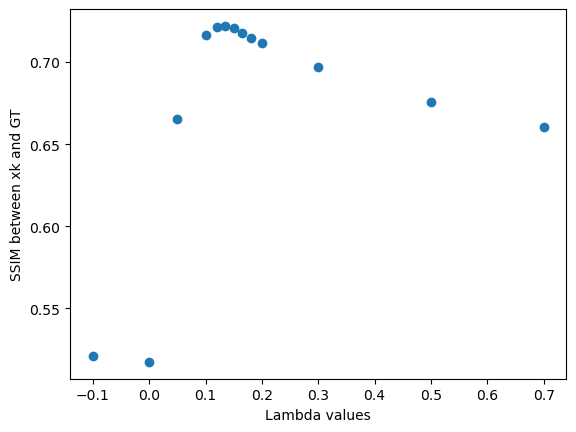

I got stopped at iteration 229 because of Cost function


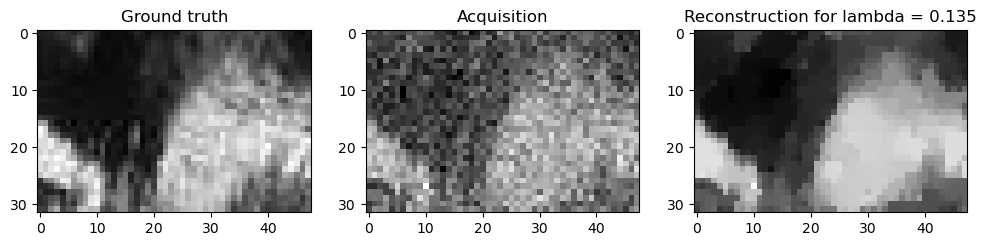

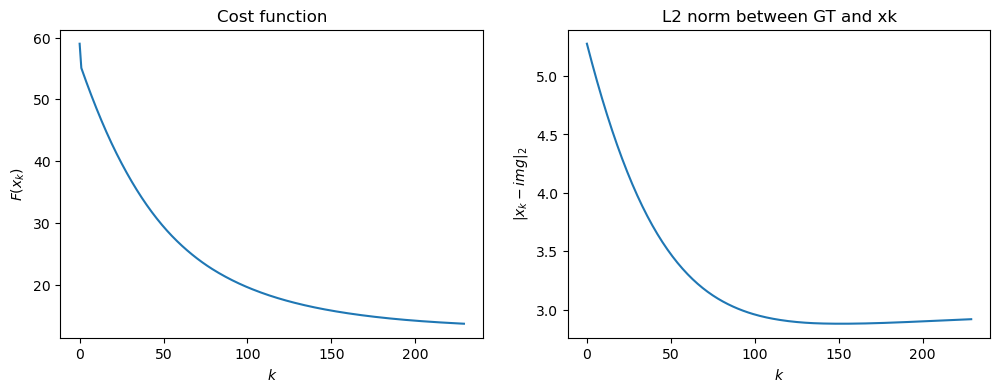

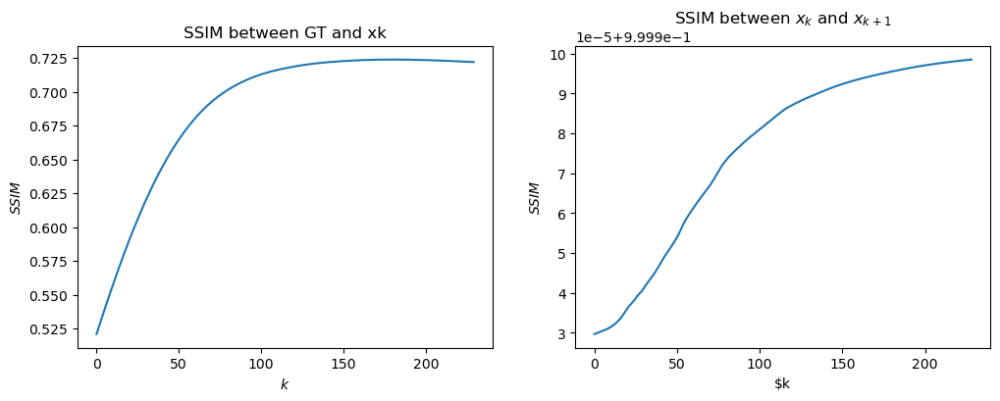

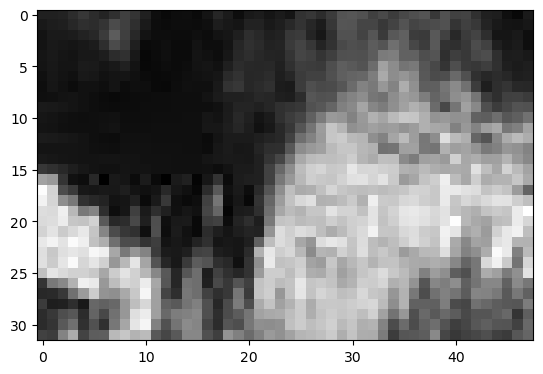

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 219 because of Cost function
I got stopped at iteration 289 because of Cost function
I got stopped at iteration 323 because of Cost function
I got stopped at iteration 344 because of Cost function
{-0.1: 0.49719036989673454, 0.1: 0.709834551522913, 0.3: 0.551063710120961, 0.5: 0.4694231783321295, 0.7: 0.4305466236825462}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 219 because of Cost function
I got stopped at iteration 267 because of Cost function
I got stopped at iteration 289 because of Cost function
{-0.1: 0.49719036989673454, 0.1: 0.709834551522913, 0.3: 0.551063710120961, 0.5: 0.4694231783321295, 0.7: 0.4305466236825462, 0.0: 0.4941458178921218, 0.2: 0.6273140308207568}
--------
range examined: [0.   0.05 0.1 

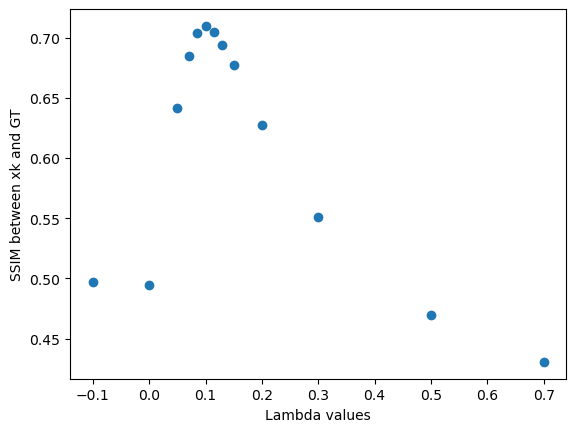

I got stopped at iteration 219 because of Cost function


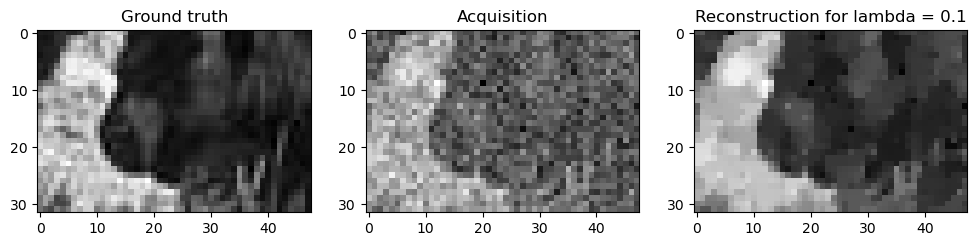

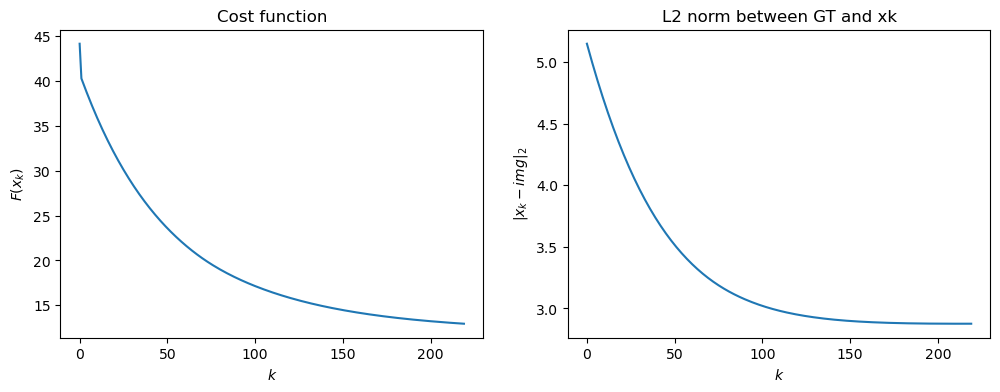

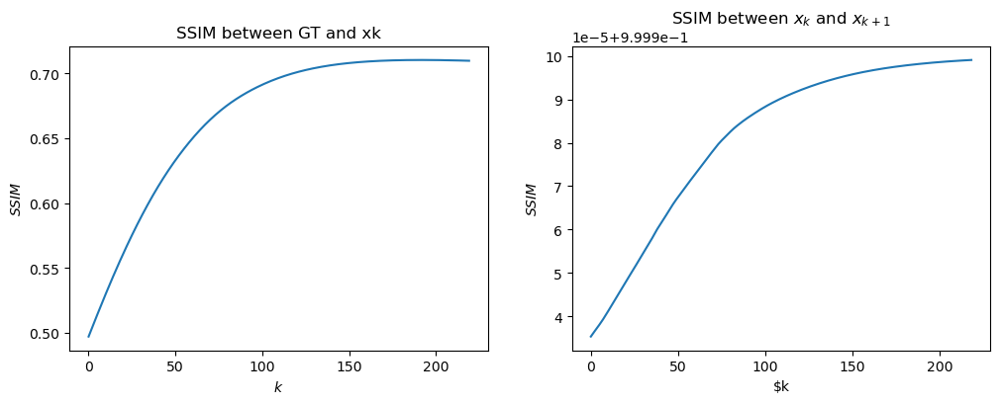

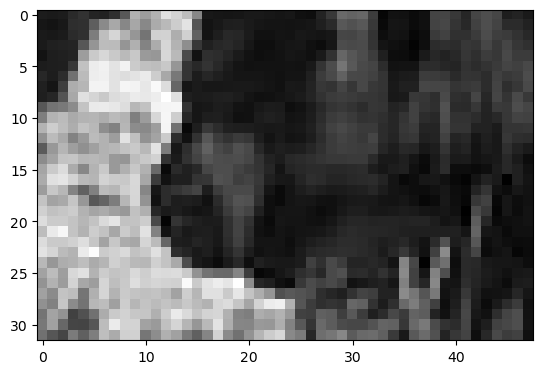

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 244 because of Cost function
I got stopped at iteration 311 because of Cost function
I got stopped at iteration 372 because of Cost function
{-0.1: 0.22761836186298823, 0.1: 0.6530910575222815, 0.3: 0.6704689463158504, 0.5: 0.6218794459915153, 0.7: 0.5925871027356863}
--------
range examined: [0.1 0.2 0.3 0.4 0.5]
I got stopped at iteration 244 because of Cost function
I got stopped at iteration 272 because of Cost function
I got stopped at iteration 311 because of Cost function
I got stopped at iteration 343 because of Cost function
I got stopped at iteration 372 because of Cost function
{-0.1: 0.22761836186298823, 0.1: 0.6530910575222815, 0.3: 0.6704689463158504, 0.5: 0.6218794459915153, 0.7: 0.5925871027356863, 0.2: 0.7014068654588534, 0.4: 0.6441965565602584}
--------
range examined: [0.1  0.15 0.2  0.25 0.3 ]
I got stopped at iteration 244 because of

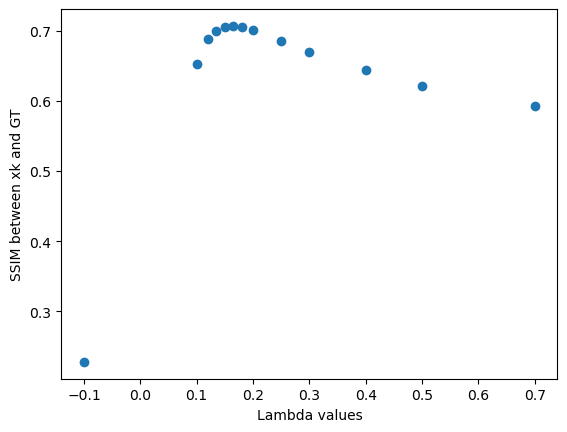

I got stopped at iteration 267 because of Cost function


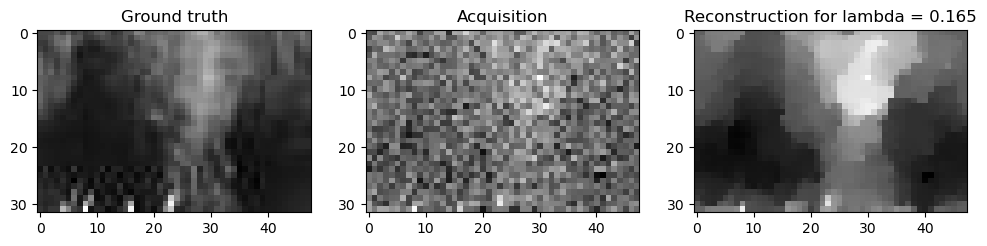

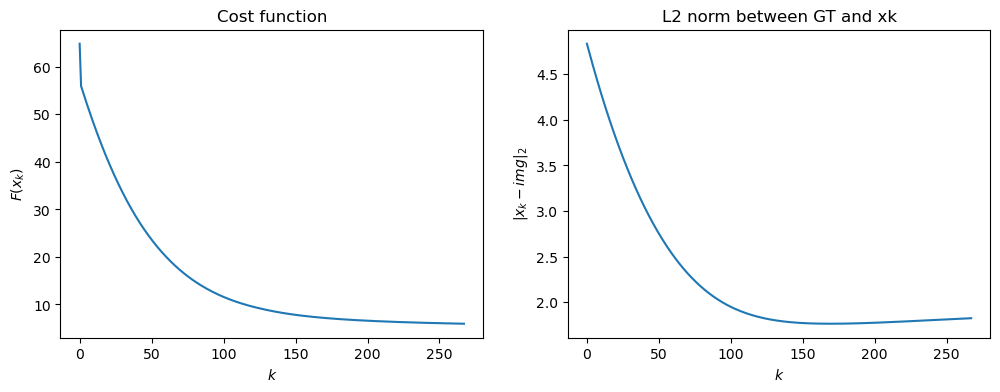

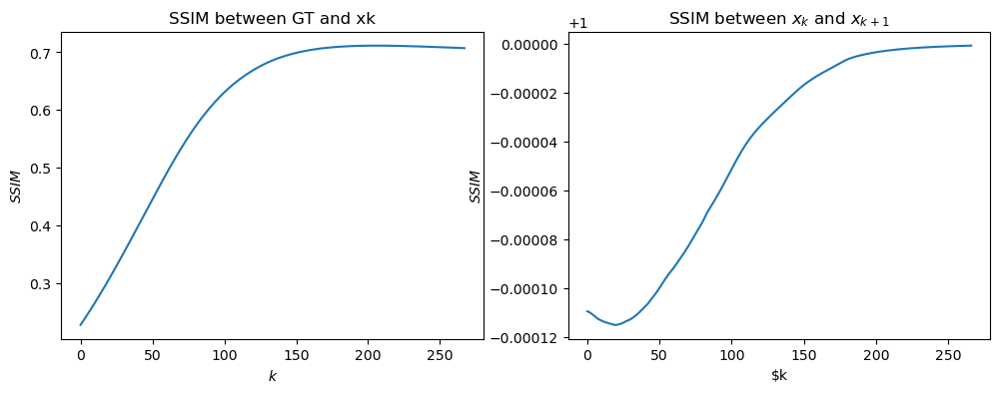

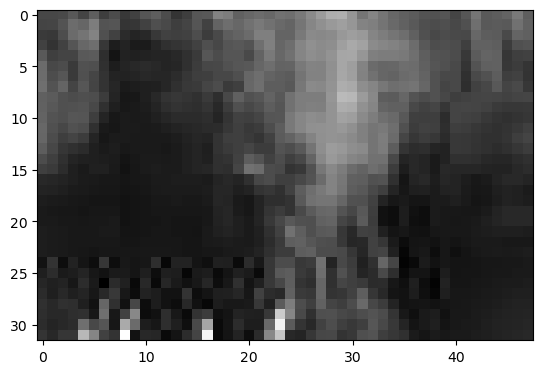

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 228 because of Cost function
I got stopped at iteration 287 because of Cost function
I got stopped at iteration 308 because of Cost function
I got stopped at iteration 326 because of Cost function
{-0.1: 0.34994197638856656, 0.1: 0.6716846703839982, 0.3: 0.5955616245517853, 0.5: 0.5455141857436252, 0.7: 0.5168276282307465}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 228 because of Cost function
I got stopped at iteration 286 because of Cost function
I got stopped at iteration 287 because of Cost function
{-0.1: 0.34994197638856656, 0.1: 0.6716846703839982, 0.3: 0.5955616245517853, 0.5: 0.5455141857436252, 0.7: 0.5168276282307465, 0.0: 0.3463578244045283, 0.2: 0.6383564152503198}
--------
range examined: [0.   0.05 

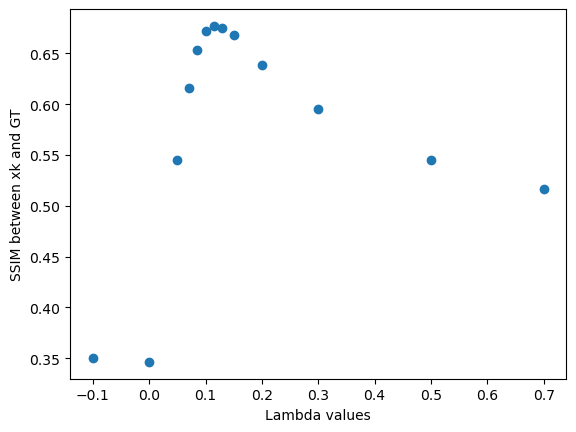

I got stopped at iteration 238 because of Cost function


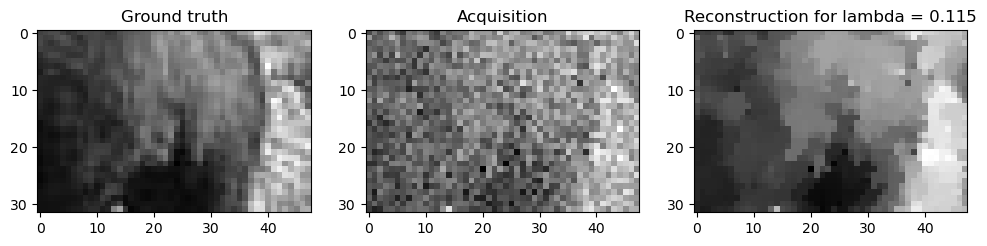

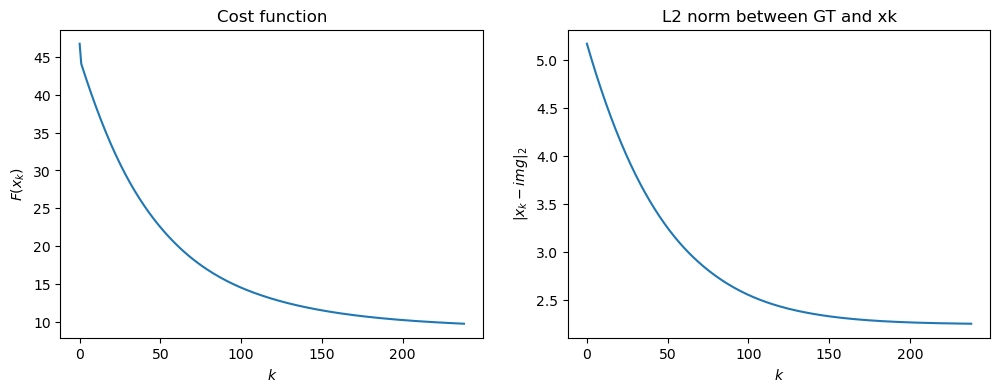

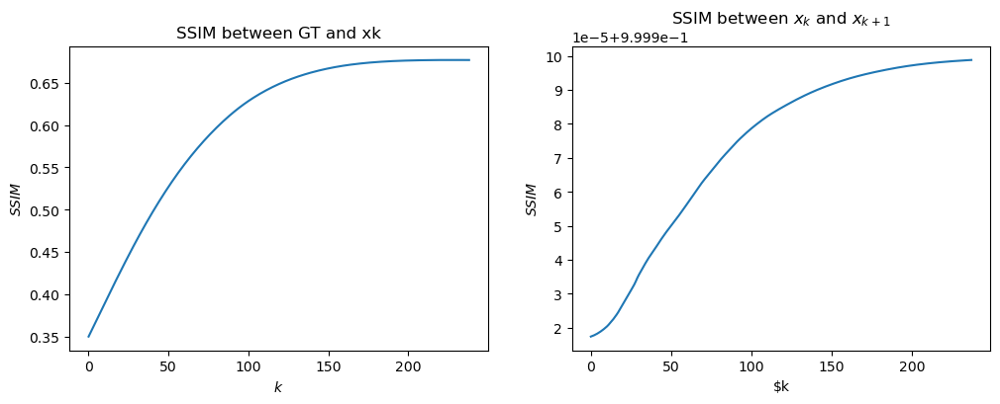

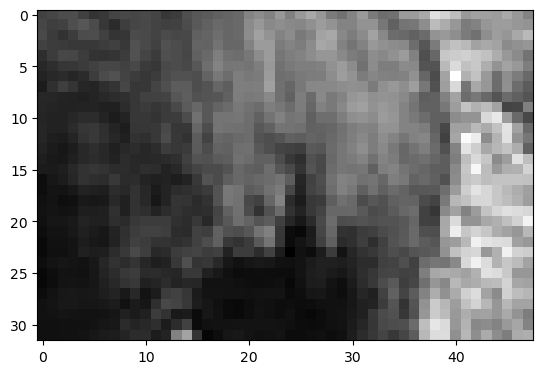

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 282 because of Cost function
I got stopped at iteration 337 because of Cost function
{-0.1: 0.38776157838659364, 0.1: 0.5042816884649004, 0.3: 0.2927628316843382, 0.5: 0.2515786866175008, 0.7: 0.23791002798358526}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 282 because of Cost function
I got stopped at iteration 332 because of Cost function
I got stopped at iteration 337 because of Cost function
{-0.1: 0.38776157838659364, 0.1: 0.5042816884649004, 0.3: 0.2927628316843382, 0.5: 0.2515786866175008, 0.7: 0.23791002798358526, 0.0: 0.38417294216489, 0.2: 0.3385144891314091}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 144 because of 

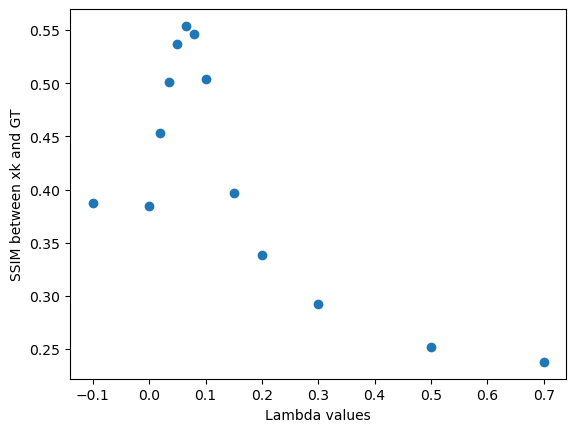

I got stopped at iteration 190 because of Cost function


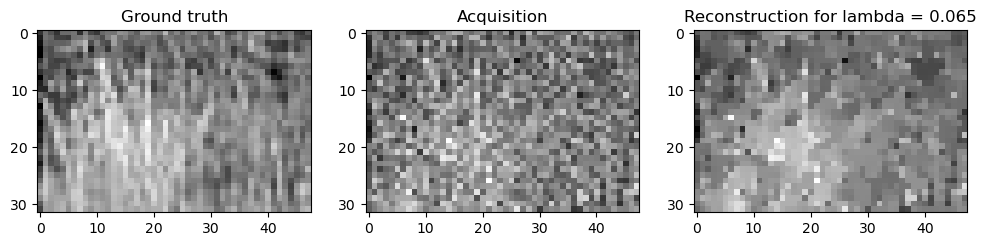

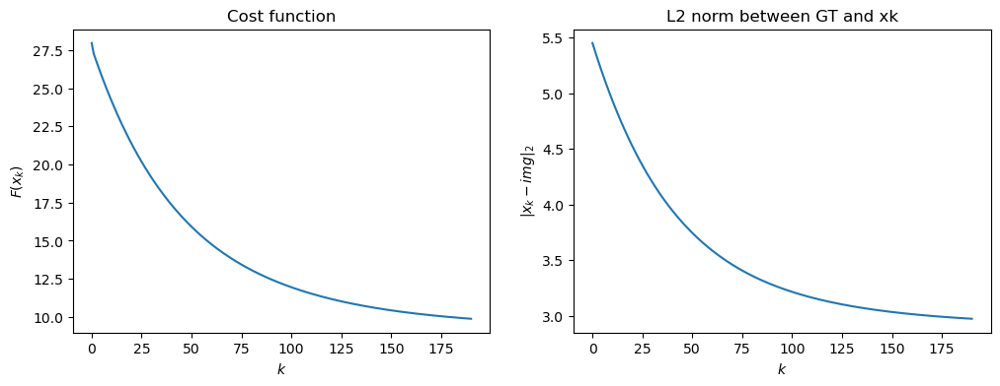

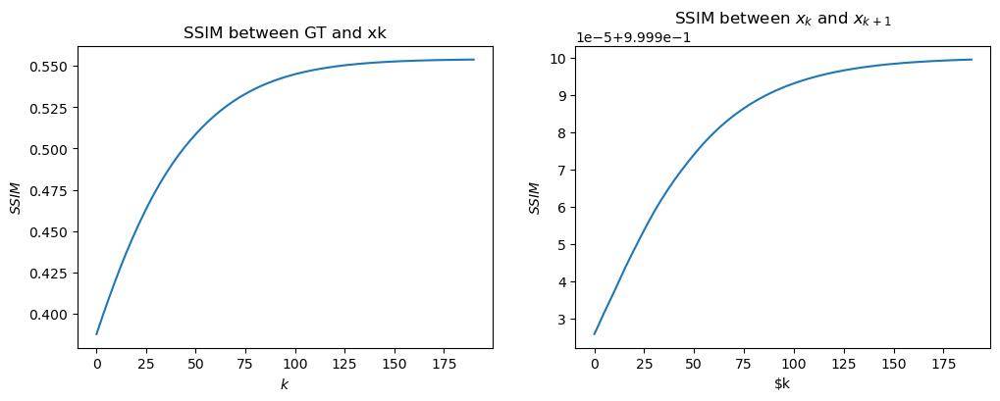

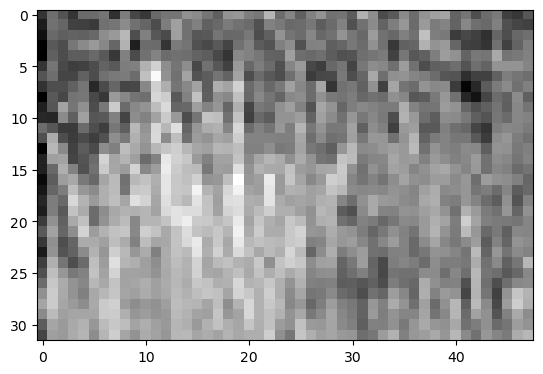

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 281 because of Sequence norm
I got stopped at iteration 391 because of Sequence norm
{-0.1: 0.39139443182032374, 0.1: 0.5255696566818817, 0.3: 0.2601863106242557, 0.5: 0.2175018091350626, 0.7: 0.20123088758440447}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 281 because of Sequence norm
I got stopped at iteration 377 because of Cost function
I got stopped at iteration 391 because of Sequence norm
{-0.1: 0.39139443182032374, 0.1: 0.5255696566818817, 0.3: 0.2601863106242557, 0.5: 0.2175018091350626, 0.7: 0.20123088758440447, 0.0: 0.3875845117246795, 0.2: 0.32549658446081925}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 145 because 

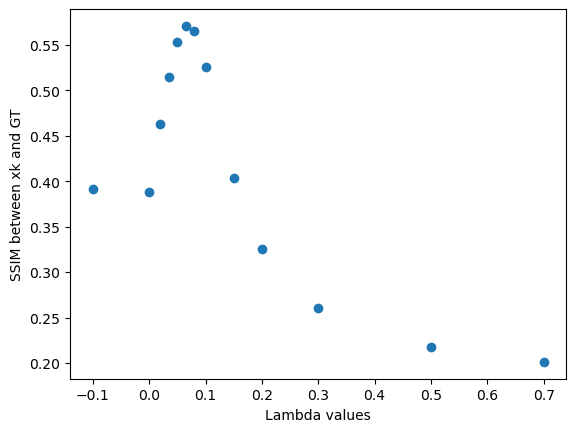

I got stopped at iteration 190 because of Cost function


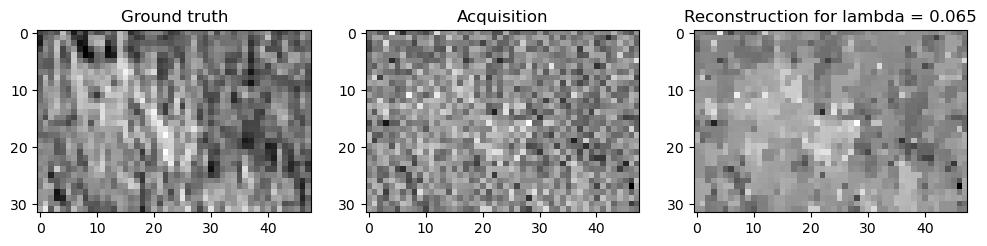

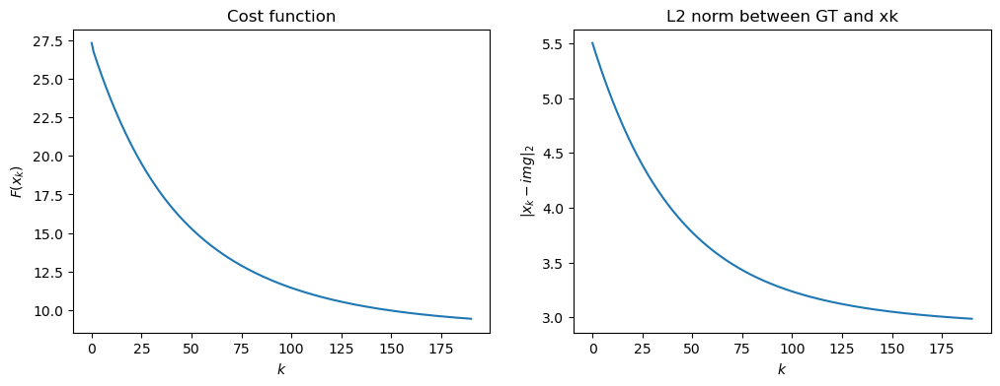

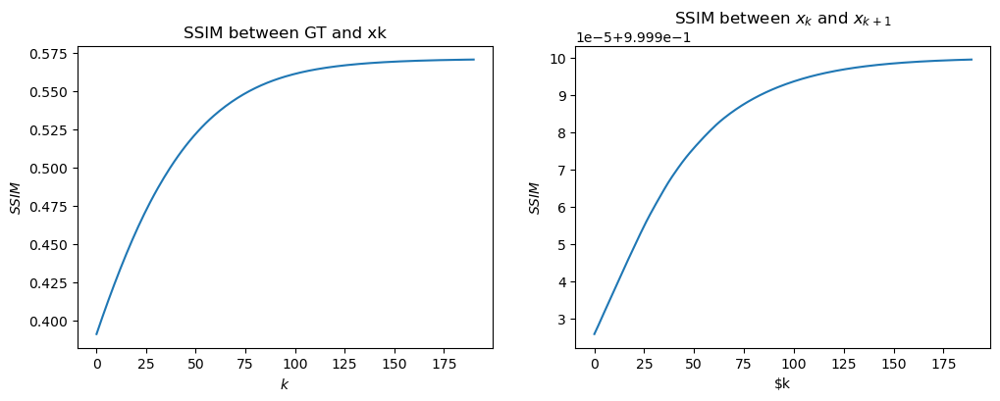

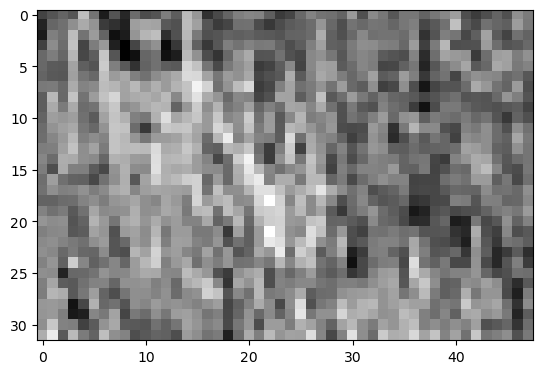

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 227 because of Cost function
I got stopped at iteration 269 because of Cost function
I got stopped at iteration 318 because of Cost function
I got stopped at iteration 369 because of Cost function
{-0.1: 0.2740290597832227, 0.1: 0.6232526108269458, 0.3: 0.710288757283286, 0.5: 0.672035441419361, 0.7: 0.6397540559011585}
--------
range examined: [0.1 0.2 0.3 0.4 0.5]
I got stopped at iteration 227 because of Cost function
I got stopped at iteration 266 because of Cost function
I got stopped at iteration 269 because of Cost function
I got stopped at iteration 296 because of Cost function
I got stopped at iteration 318 because of Cost function
{-0.1: 0.2740290597832227, 0.1: 0.6232526108269458, 0.3: 0.710288757283286, 0.5: 0.672035441419361, 0.7: 0.6397540559011585, 0.2: 0.7251270730158107, 0.4: 0.6895309429846886}
--------
range examined: [0.1  0.15 0.2  0.

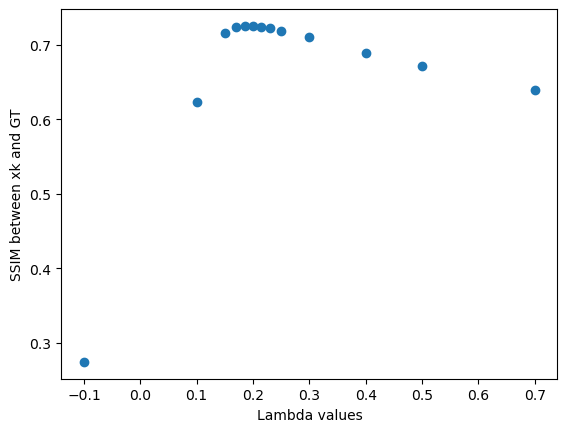

I got stopped at iteration 267 because of Cost function


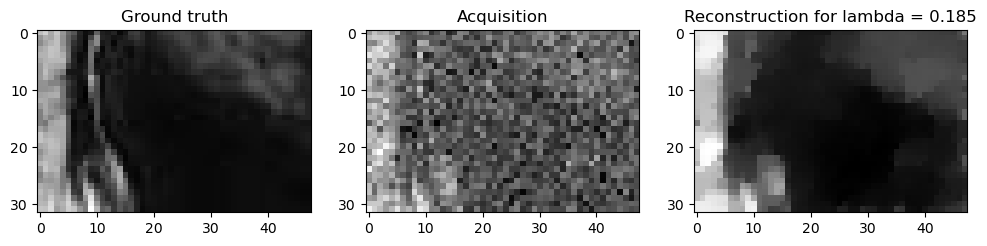

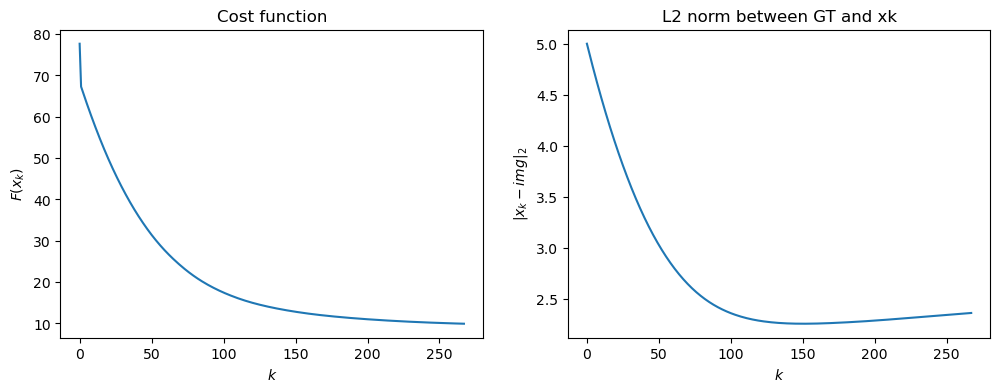

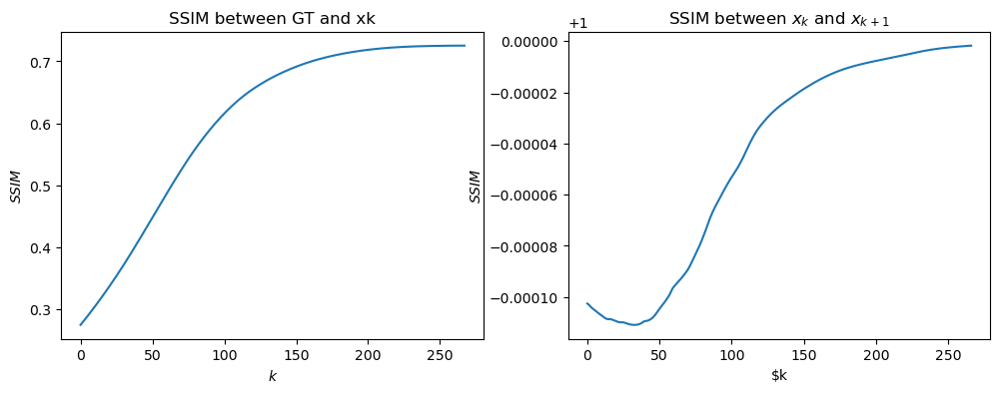

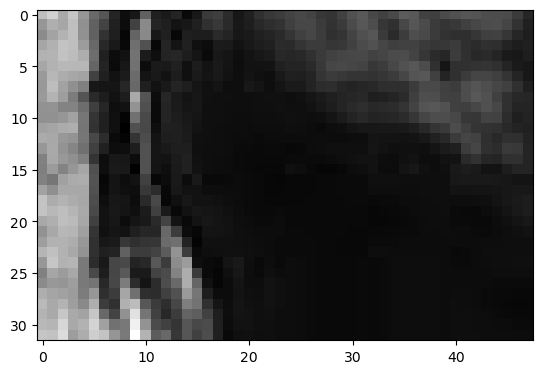

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 261 because of Cost function
I got stopped at iteration 316 because of Cost function
I got stopped at iteration 387 because of Cost function
{-0.1: 0.12680989366566414, 0.1: 0.615488821513944, 0.3: 0.6963078963578095, 0.5: 0.6661292493452606, 0.7: 0.6510002820800556}
--------
range examined: [0.1 0.2 0.3 0.4 0.5]
I got stopped at iteration 261 because of Cost function
I got stopped at iteration 298 because of Cost function
I got stopped at iteration 316 because of Cost function
I got stopped at iteration 351 because of Cost function
I got stopped at iteration 387 because of Cost function
{-0.1: 0.12680989366566414, 0.1: 0.615488821513944, 0.3: 0.6963078963578095, 0.5: 0.6661292493452606, 0.7: 0.6510002820800556, 0.2: 0.7127534740118411, 0.4: 0.6801304747503475}
--------
range examined: [0.1  0.15 0.2  0.25 0.3 ]
I got stopped at iteration 261 because of C

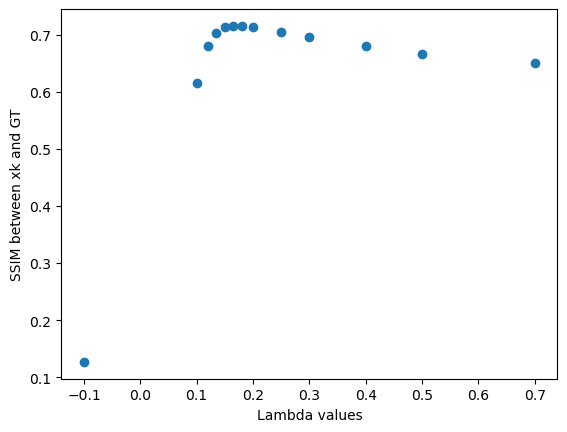

I got stopped at iteration 306 because of Cost function


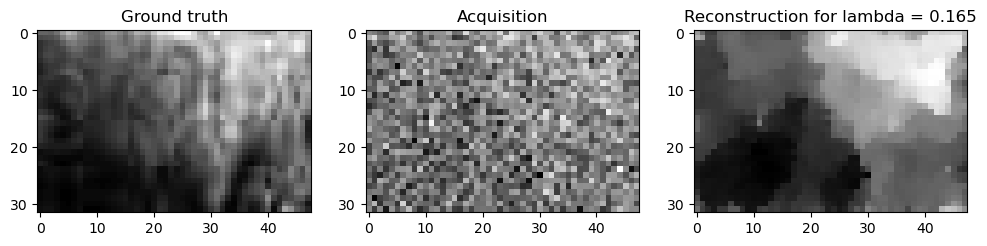

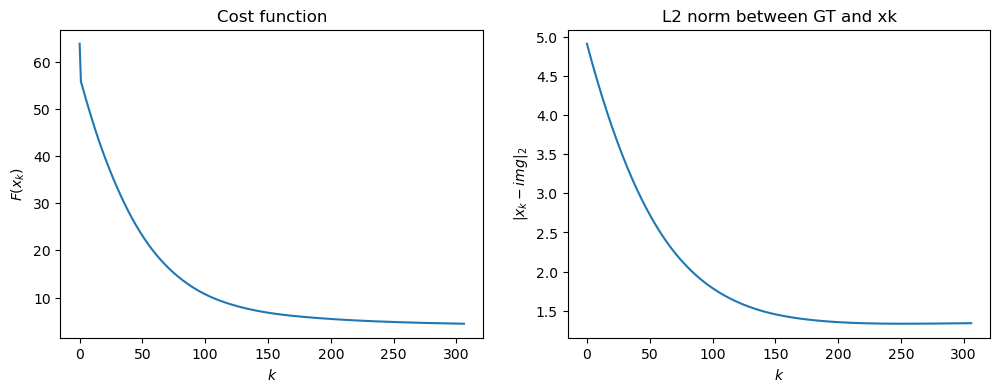

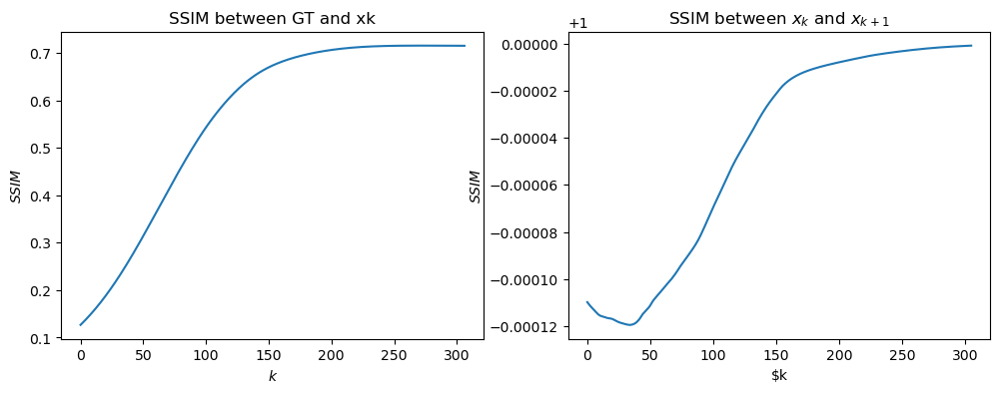

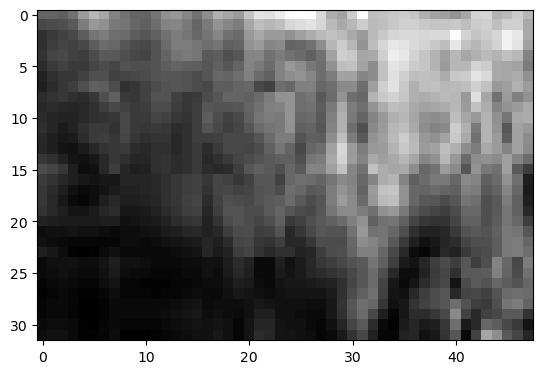

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 234 because of Cost function
I got stopped at iteration 300 because of Cost function
I got stopped at iteration 355 because of Cost function
{-0.1: 0.4261099418419196, 0.1: 0.7204803211398247, 0.3: 0.611762755135926, 0.5: 0.5347480848300972, 0.7: 0.48841760576335536}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 234 because of Cost function
I got stopped at iteration 278 because of Cost function
I got stopped at iteration 300 because of Cost function
{-0.1: 0.4261099418419196, 0.1: 0.7204803211398247, 0.3: 0.611762755135926, 0.5: 0.5347480848300972, 0.7: 0.48841760576335536, 0.0: 0.4222210045967126, 0.2: 0.6705045966277592}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Se

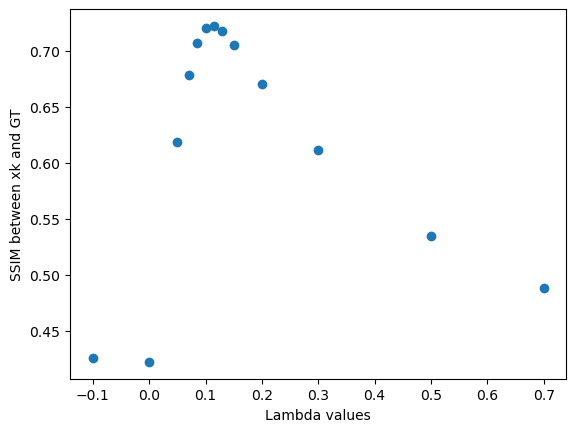

I got stopped at iteration 244 because of Cost function


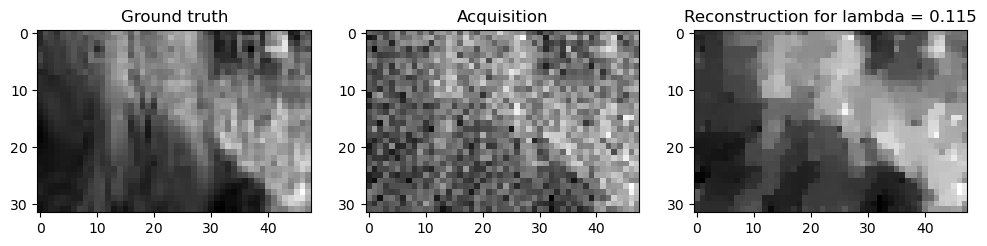

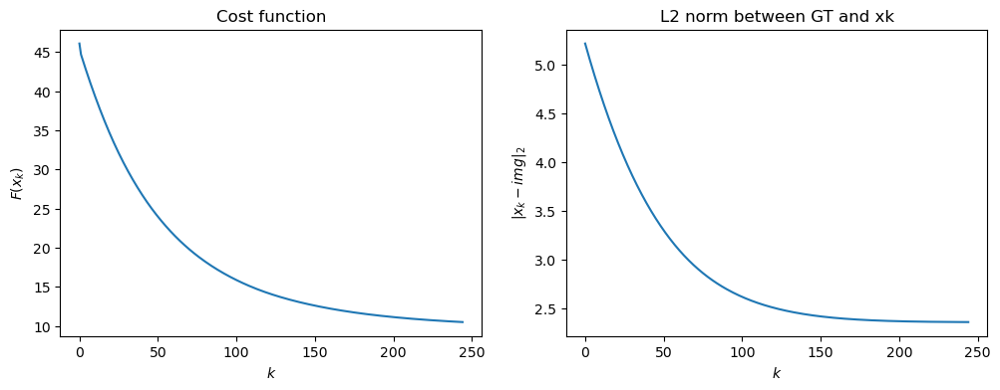

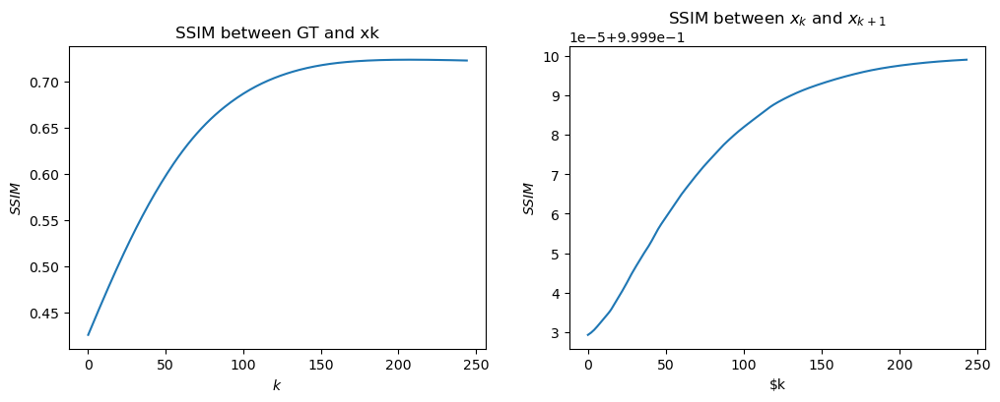

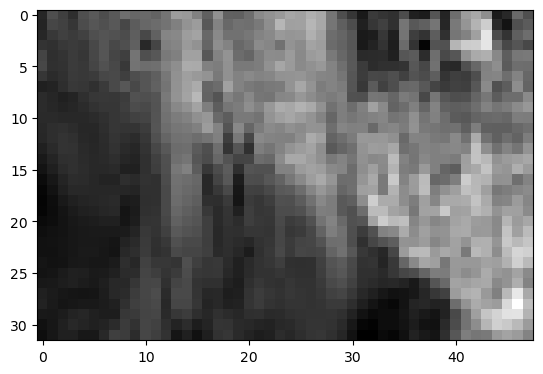

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 257 because of Cost function
I got stopped at iteration 317 because of Cost function
I got stopped at iteration 391 because of Cost function
{-0.1: 0.42441491065162834, 0.1: 0.5803730504311392, 0.3: 0.37327429789951677, 0.5: 0.2909443616565925, 0.7: 0.2630683514090612}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 257 because of Cost function
I got stopped at iteration 296 because of Cost function
I got stopped at iteration 317 because of Cost function
{-0.1: 0.42441491065162834, 0.1: 0.5803730504311392, 0.3: 0.37327429789951677, 0.5: 0.2909443616565925, 0.7: 0.2630683514090612, 0.0: 0.42067849921711514, 0.2: 0.43511095686192636}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because

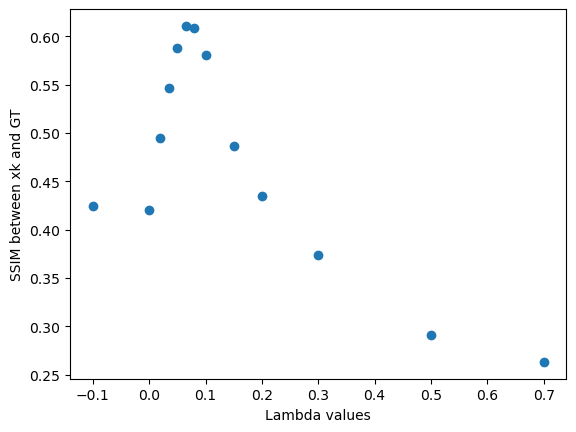

I got stopped at iteration 183 because of Cost function


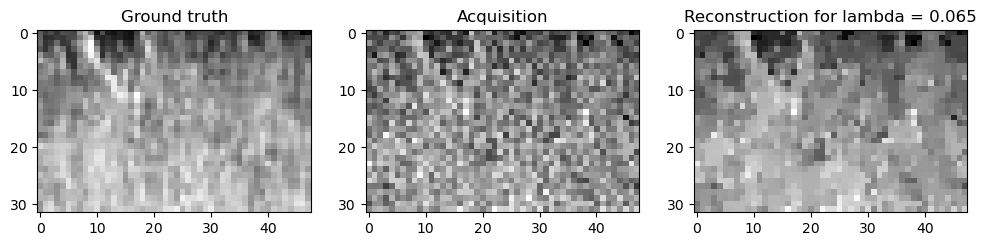

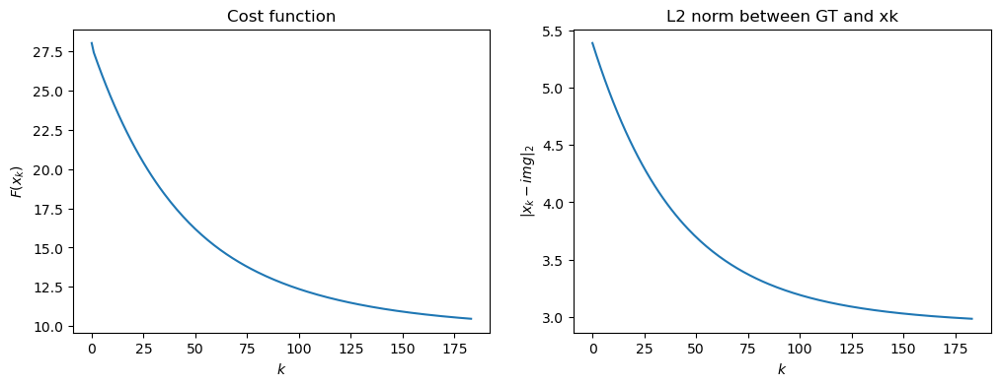

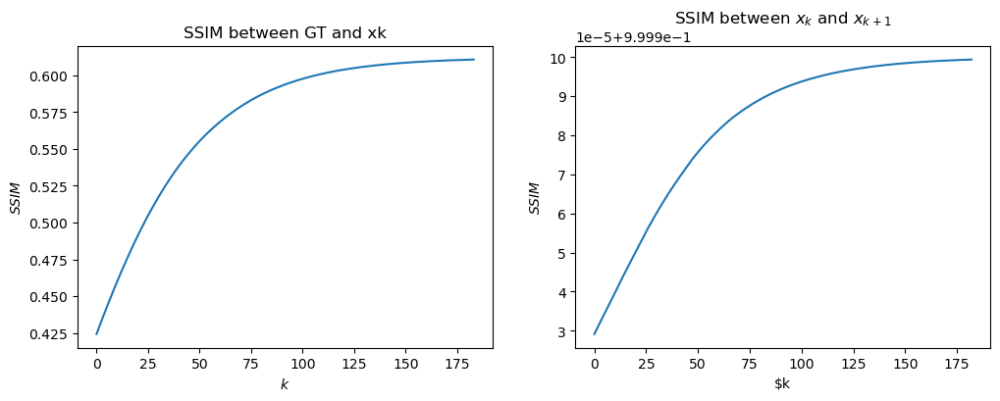

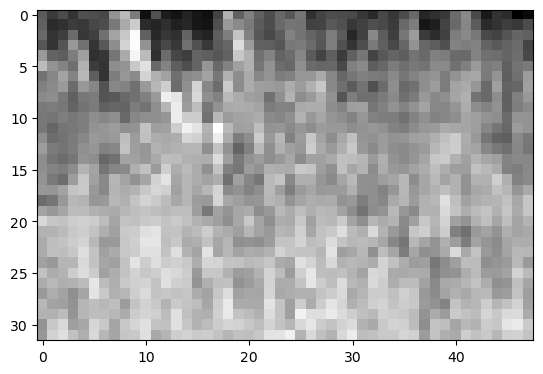

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 264 because of Cost function
I got stopped at iteration 335 because of Cost function
I got stopped at iteration 369 because of Cost function
I got stopped at iteration 382 because of Cost function
{-0.1: 0.4908292348688816, 0.1: 0.6119574859964665, 0.3: 0.3519171915183012, 0.5: 0.29702777512486983, 0.7: 0.27588223534775447}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 264 because of Cost function
I got stopped at iteration 317 because of Cost function
I got stopped at iteration 335 because of Cost function
{-0.1: 0.4908292348688816, 0.1: 0.6119574859964665, 0.3: 0.3519171915183012, 0.5: 0.29702777512486983, 0.7: 0.27588223534775447, 0.0: 0.4870256323055473, 0.2: 0.4211695677538849}
--------
range examined: [0.   0.0

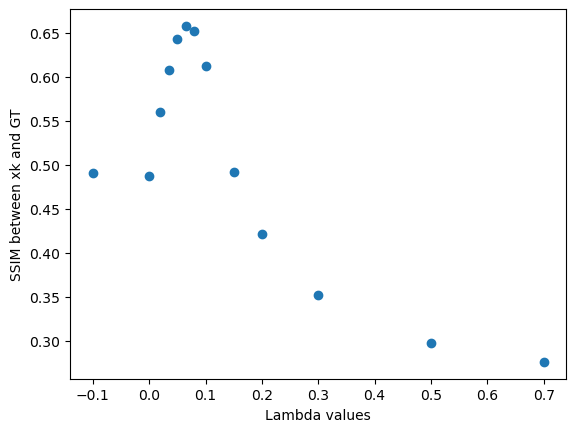

I got stopped at iteration 180 because of Cost function


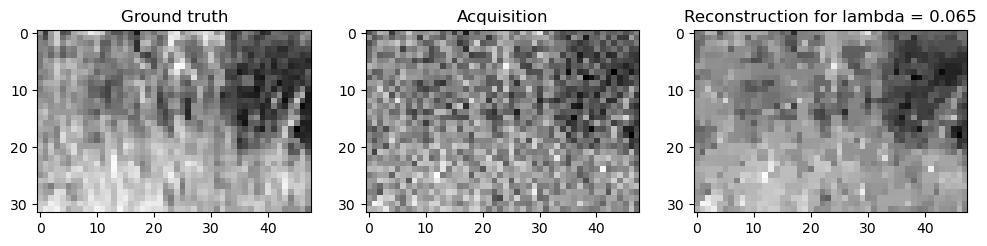

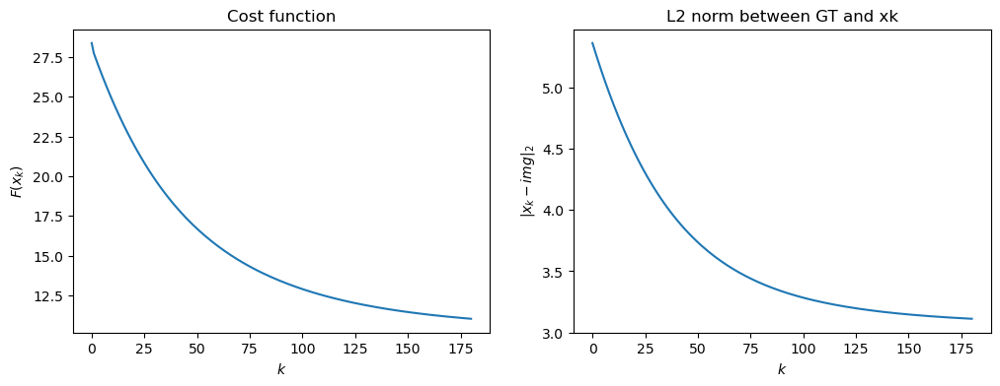

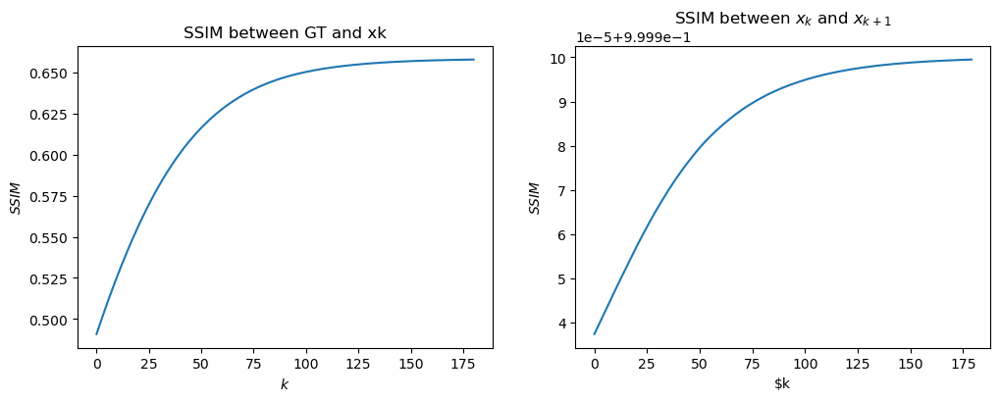

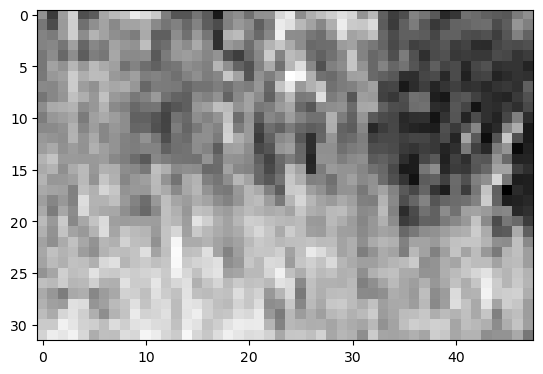

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 261 because of Cost function
I got stopped at iteration 396 because of Cost function
{-0.1: 0.5675975468377868, 0.1: 0.6114852108789459, 0.3: 0.2854593642405748, 0.5: 0.22687219644973874, 0.7: 0.20282532880430812}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 261 because of Cost function
I got stopped at iteration 342 because of Cost function
I got stopped at iteration 396 because of Cost function
{-0.1: 0.5675975468377868, 0.1: 0.6114852108789459, 0.3: 0.2854593642405748, 0.5: 0.22687219644973874, 0.7: 0.20282532880430812, 0.0: 0.5640531818304928, 0.2: 0.3753410277781767}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 135 because o

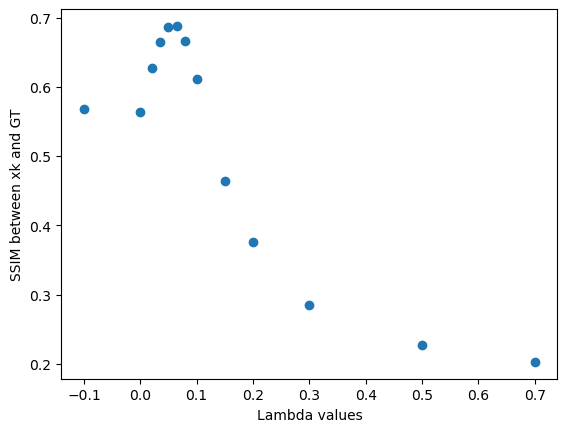

I got stopped at iteration 177 because of Cost function


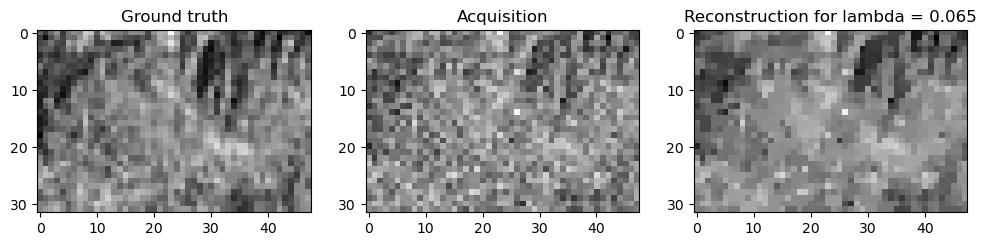

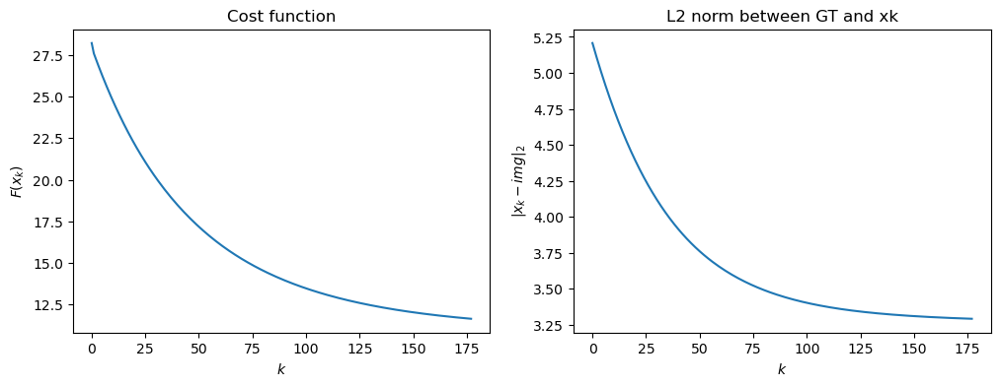

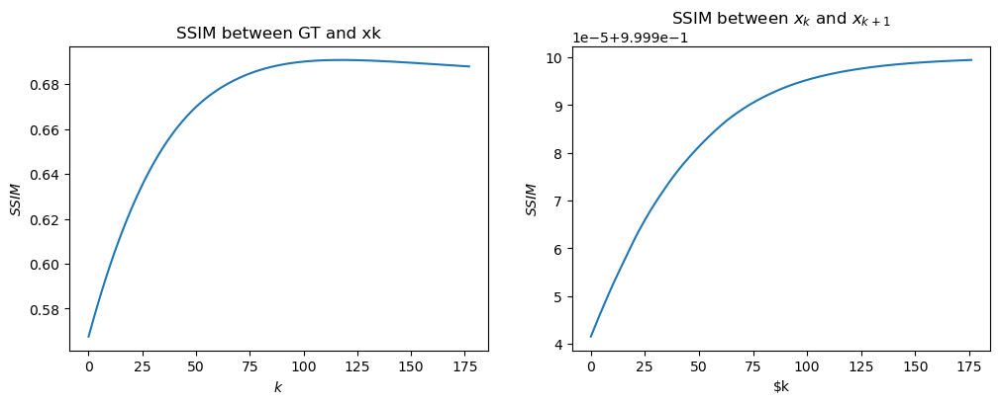

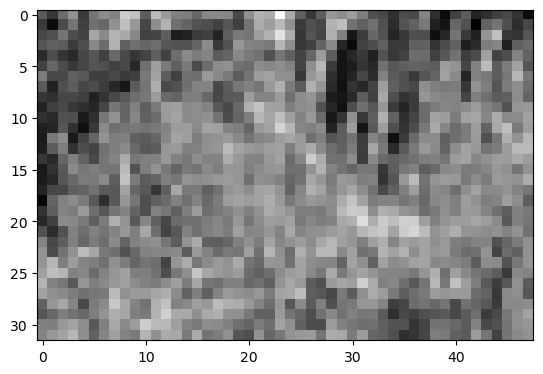

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 227 because of Cost function
I got stopped at iteration 314 because of Cost function
I got stopped at iteration 381 because of Cost function
{-0.1: 0.6021331748404823, 0.1: 0.6914805026779116, 0.3: 0.4617865982152164, 0.5: 0.3595776632380491, 0.7: 0.3159714104944555}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 227 because of Cost function
I got stopped at iteration 295 because of Cost function
I got stopped at iteration 314 because of Cost function
{-0.1: 0.6021331748404823, 0.1: 0.6914805026779116, 0.3: 0.4617865982152164, 0.5: 0.3595776632380491, 0.7: 0.3159714104944555, 0.0: 0.5986025675650279, 0.2: 0.5364885856849653}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Se

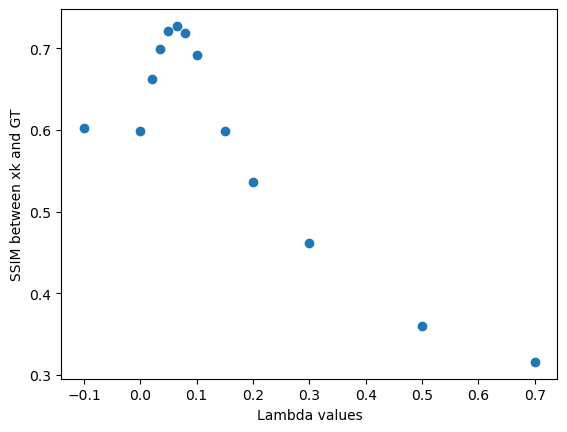

I got stopped at iteration 162 because of Cost function


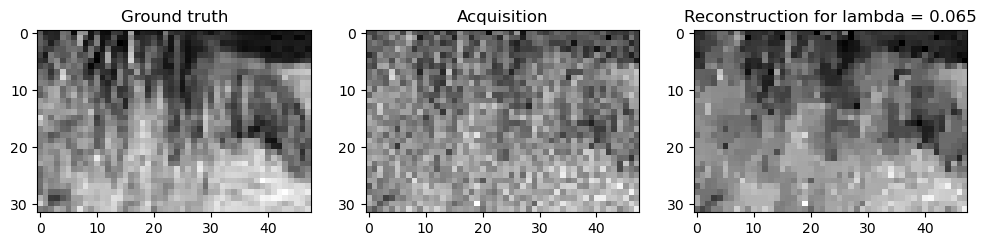

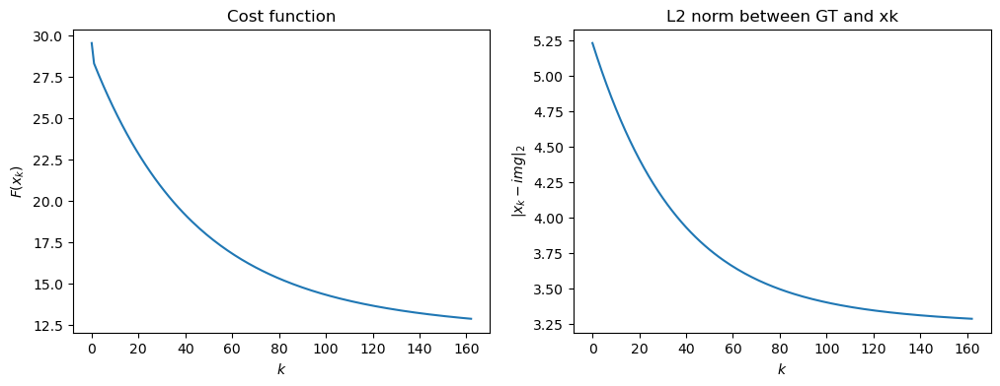

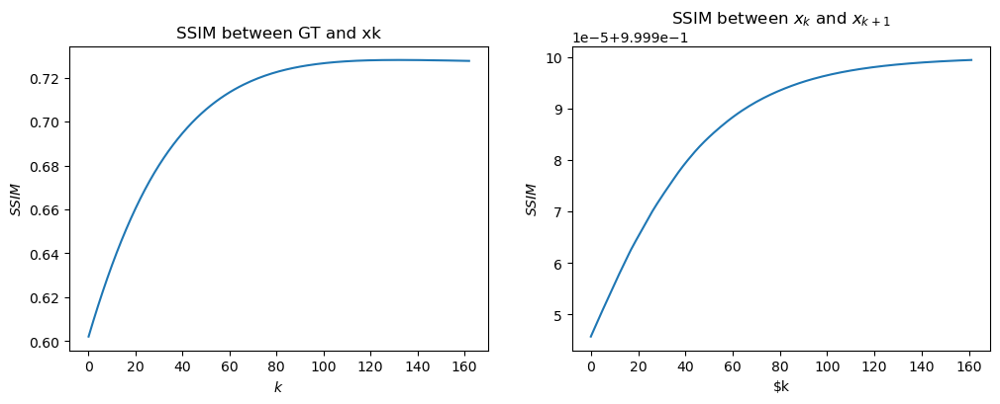

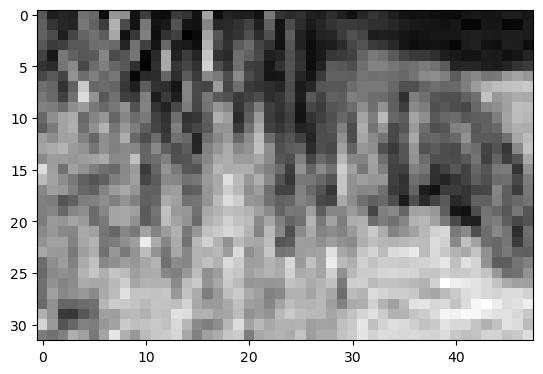

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 216 because of Cost function
I got stopped at iteration 310 because of Cost function
I got stopped at iteration 355 because of Cost function
I got stopped at iteration 388 because of Cost function
{-0.1: 0.6119641605133103, 0.1: 0.7394712342440212, 0.3: 0.5421262448005502, 0.5: 0.46750317421271176, 0.7: 0.4312694420583849}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 216 because of Cost function
I got stopped at iteration 271 because of Cost function
I got stopped at iteration 310 because of Cost function
{-0.1: 0.6119641605133103, 0.1: 0.7394712342440212, 0.3: 0.5421262448005502, 0.5: 0.46750317421271176, 0.7: 0.4312694420583849, 0.0: 0.6085813242472947, 0.2: 0.6111550677697359}
--------
range examined: [0.   0.05 

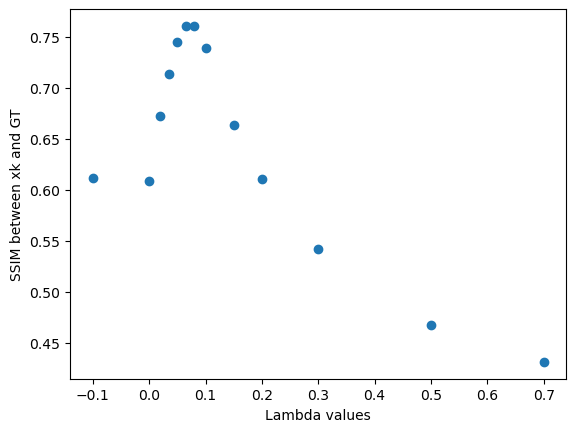

I got stopped at iteration 186 because of Cost function


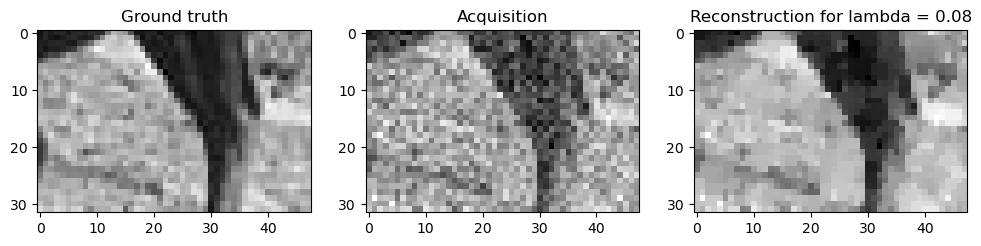

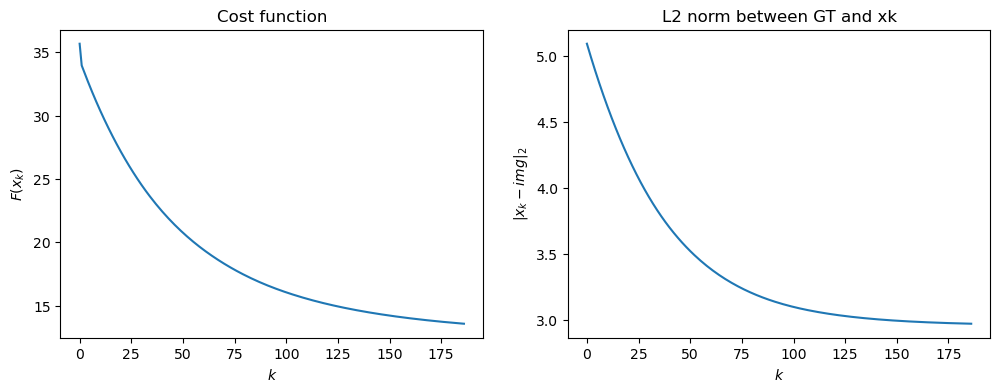

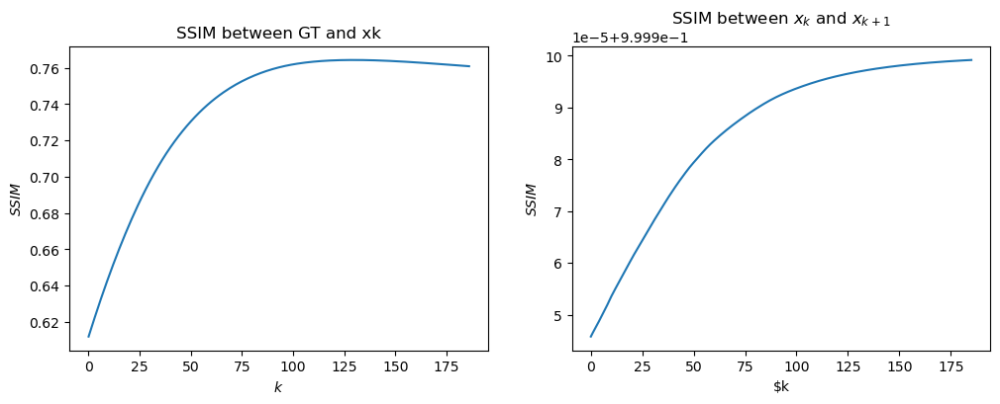

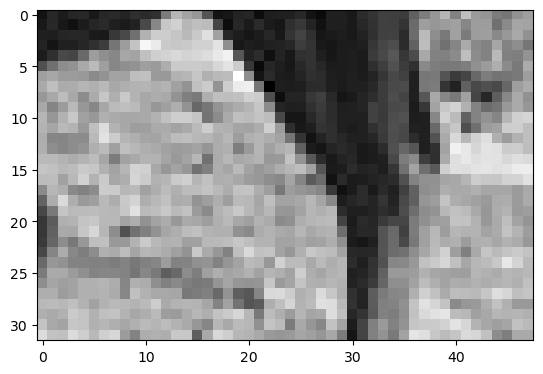

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 283 because of Sequence norm
I got stopped at iteration 394 because of Cost function
{-0.1: 0.3509068972836189, 0.1: 0.47653374273366517, 0.3: 0.21230964051603063, 0.5: 0.18478901276170095, 0.7: 0.17593205793789768}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 283 because of Sequence norm
I got stopped at iteration 372 because of Cost function
I got stopped at iteration 394 because of Cost function
{-0.1: 0.3509068972836189, 0.1: 0.47653374273366517, 0.3: 0.21230964051603063, 0.5: 0.18478901276170095, 0.7: 0.17593205793789768, 0.0: 0.3475886657111325, 0.2: 0.26864525774987885}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 146 beca

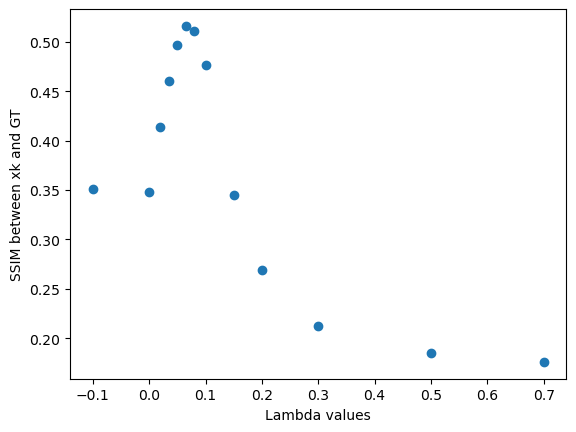

I got stopped at iteration 192 because of Cost function


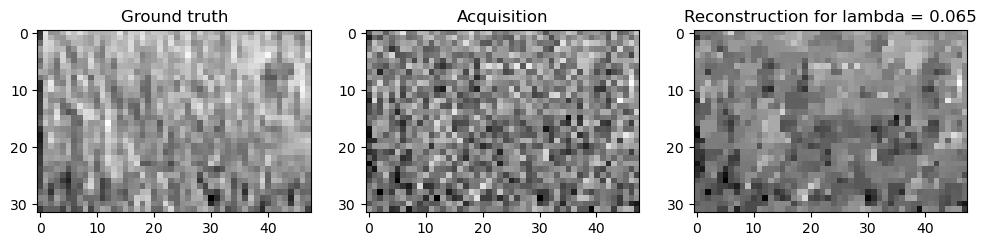

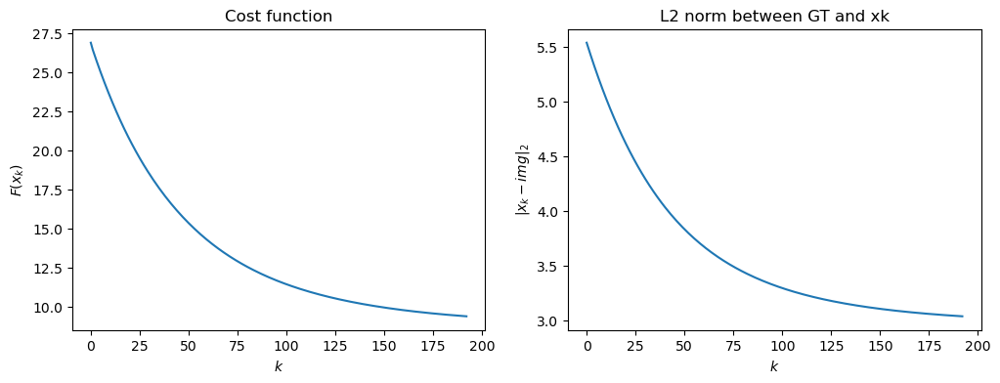

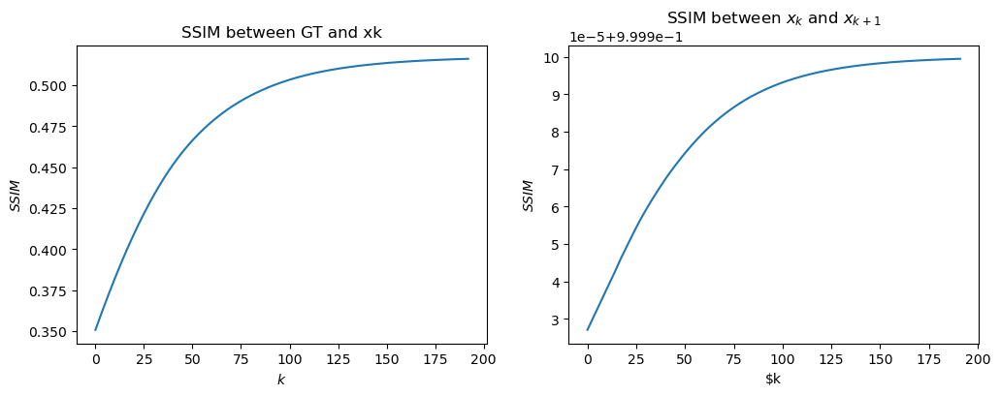

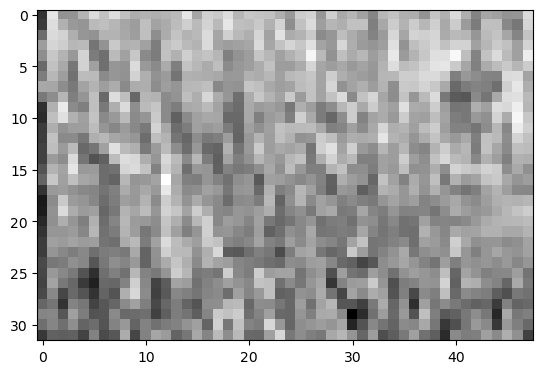

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 268 because of Cost function
I got stopped at iteration 374 because of Cost function
{-0.1: 0.41873925144999985, 0.1: 0.557180203479413, 0.3: 0.29356337162771373, 0.5: 0.24596332316271266, 0.7: 0.22809587738388198}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 268 because of Cost function
I got stopped at iteration 336 because of Cost function
I got stopped at iteration 374 because of Cost function
{-0.1: 0.41873925144999985, 0.1: 0.557180203479413, 0.3: 0.29356337162771373, 0.5: 0.24596332316271266, 0.7: 0.22809587738388198, 0.0: 0.4148373212881087, 0.2: 0.3598782122736572}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 146 because

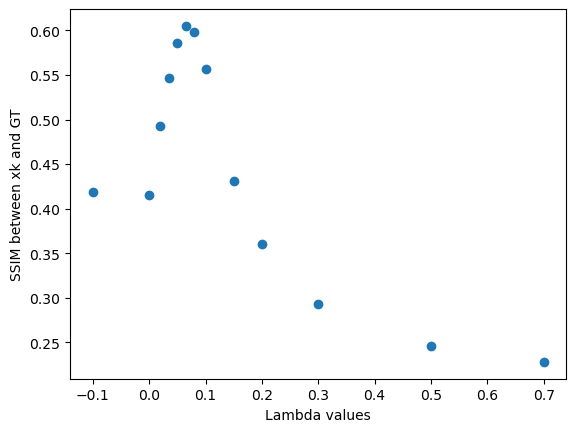

I got stopped at iteration 189 because of Cost function


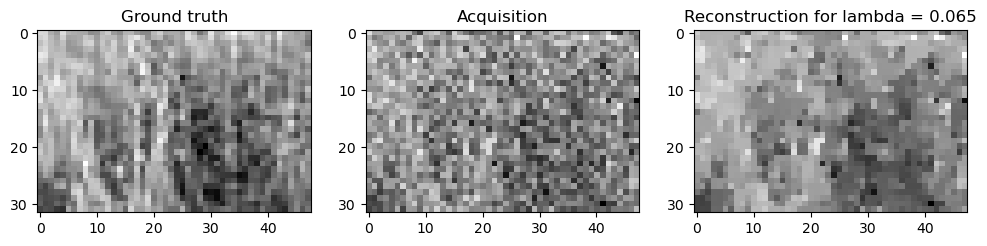

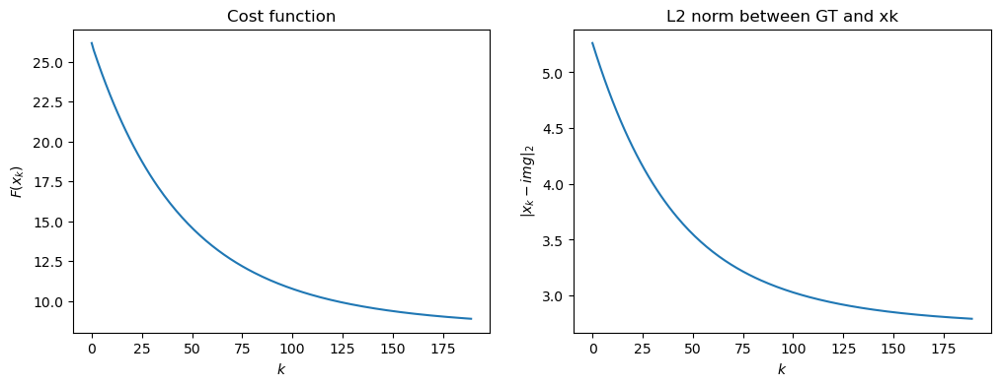

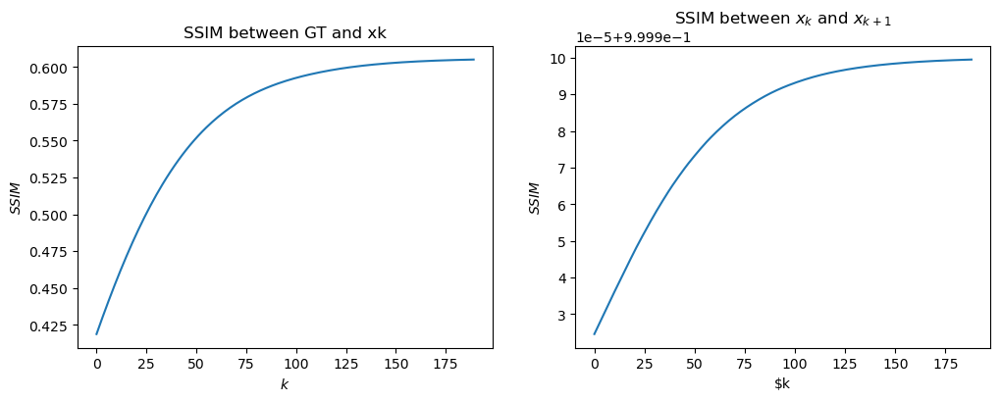

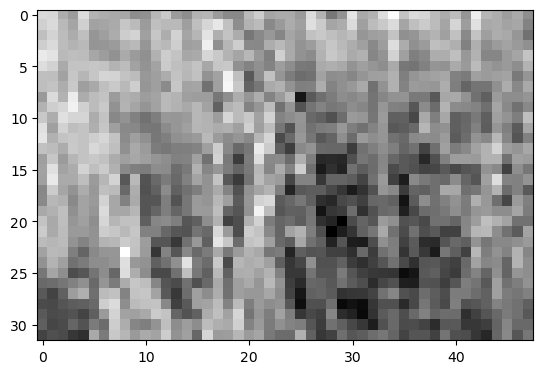

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 211 because of Cost function
I got stopped at iteration 260 because of Cost function
I got stopped at iteration 282 because of Cost function
I got stopped at iteration 304 because of Cost function
{-0.1: 0.5389692890412177, 0.1: 0.7340376008975527, 0.3: 0.6625457968381413, 0.5: 0.6176750507024555, 0.7: 0.5891694733466373}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 211 because of Cost function
I got stopped at iteration 239 because of Cost function
I got stopped at iteration 260 because of Cost function
{-0.1: 0.5389692890412177, 0.1: 0.7340376008975527, 0.3: 0.6625457968381413, 0.5: 0.6176750507024555, 0.7: 0.5891694733466373, 0.0: 0.5356713173578032, 0.2: 0.7027560469532681}
--------
range examined: [0.   0.05 0.

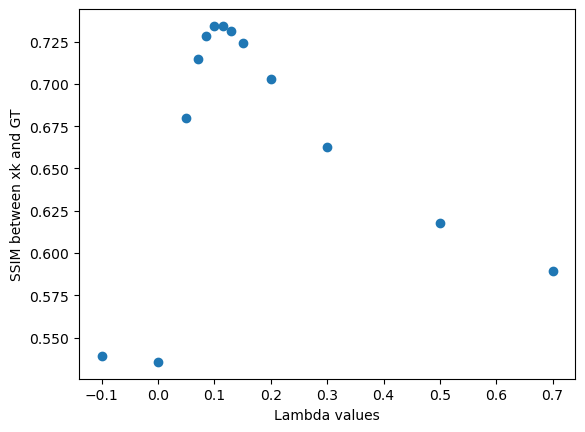

I got stopped at iteration 218 because of Cost function


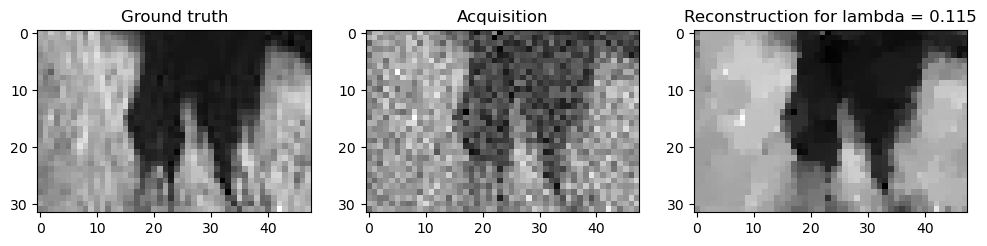

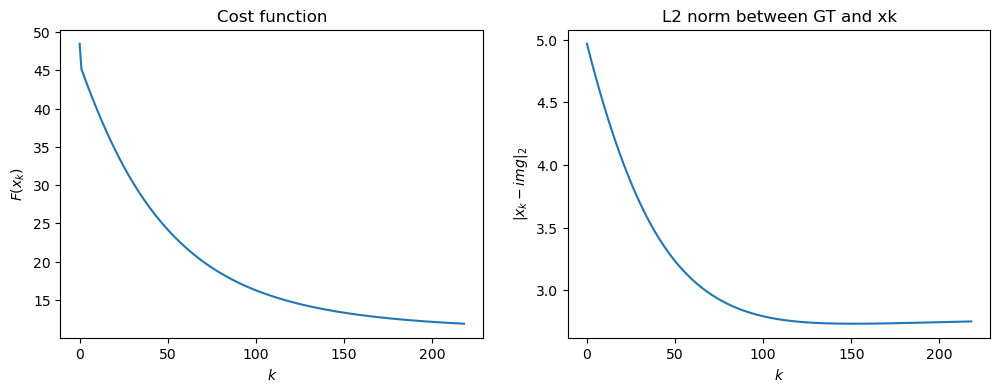

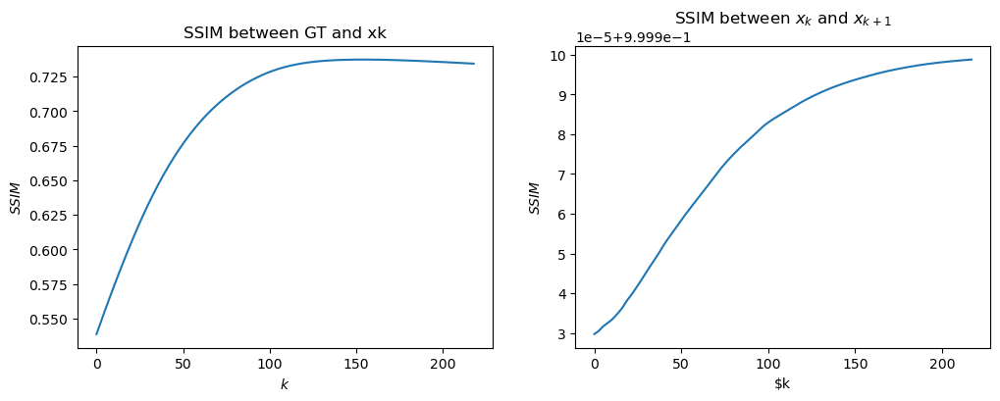

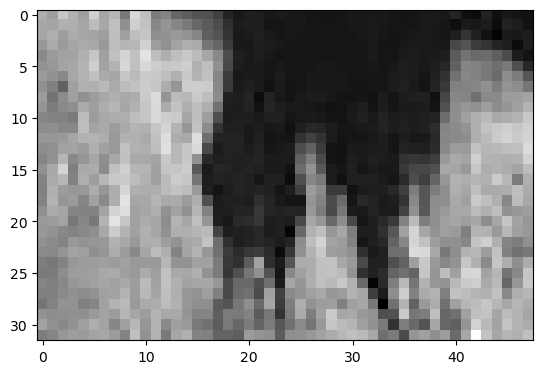

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 228 because of Cost function
I got stopped at iteration 296 because of Cost function
I got stopped at iteration 309 because of Cost function
I got stopped at iteration 326 because of Cost function
{-0.1: 0.5345879762325271, 0.1: 0.678613594480575, 0.3: 0.483022213729991, 0.5: 0.425477485568373, 0.7: 0.39418887483468895}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 228 because of Cost function
I got stopped at iteration 288 because of Cost function
I got stopped at iteration 296 because of Cost function
{-0.1: 0.5345879762325271, 0.1: 0.678613594480575, 0.3: 0.483022213729991, 0.5: 0.425477485568373, 0.7: 0.39418887483468895, 0.0: 0.5310486453974248, 0.2: 0.5434599853298057}
--------
range examined: [0.   0.05 0.1  0

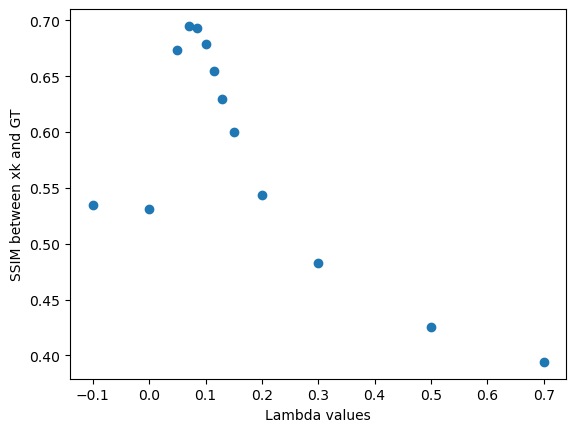

I got stopped at iteration 174 because of Cost function


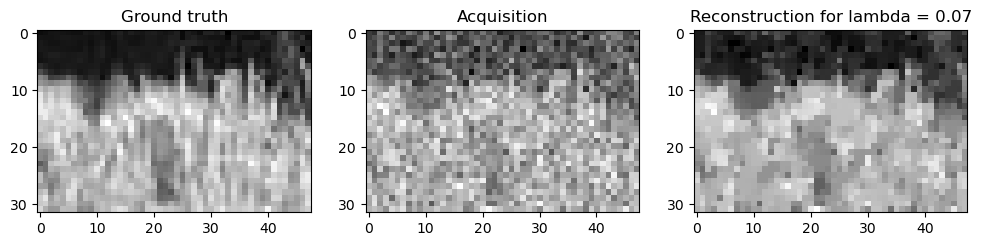

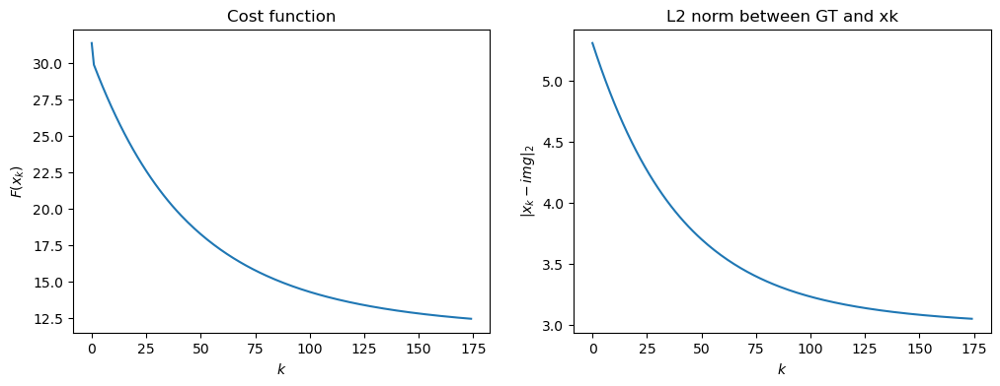

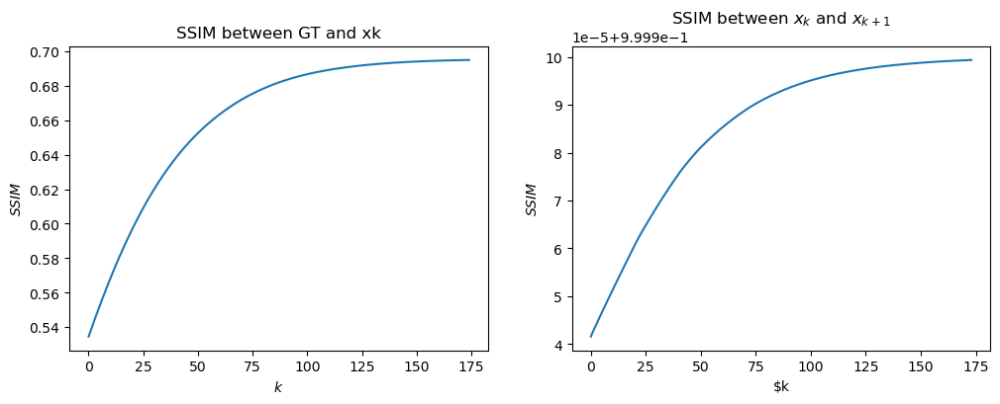

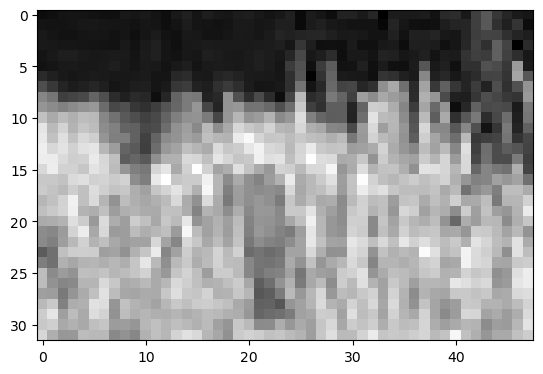

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 226 because of Cost function
I got stopped at iteration 301 because of Cost function
I got stopped at iteration 315 because of Cost function
I got stopped at iteration 348 because of Cost function
{-0.1: 0.5280551064288354, 0.1: 0.6912035099466275, 0.3: 0.5080359398249207, 0.5: 0.46185861854653254, 0.7: 0.4302061681654798}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 226 because of Cost function
I got stopped at iteration 280 because of Cost function
I got stopped at iteration 301 because of Cost function
{-0.1: 0.5280551064288354, 0.1: 0.6912035099466275, 0.3: 0.5080359398249207, 0.5: 0.46185861854653254, 0.7: 0.4302061681654798, 0.0: 0.5245567512469416, 0.2: 0.5734995032672833}
--------
range examined: [0.   0.05 

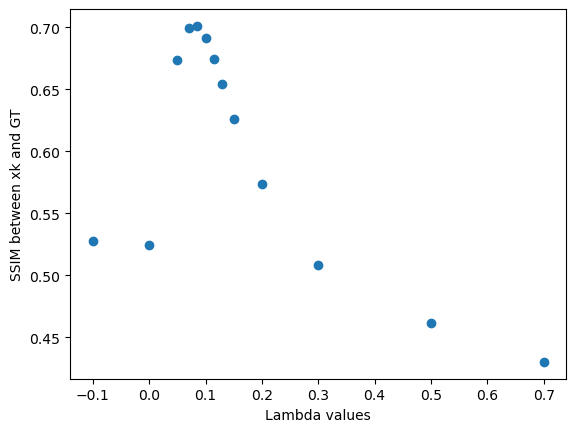

I got stopped at iteration 207 because of Cost function


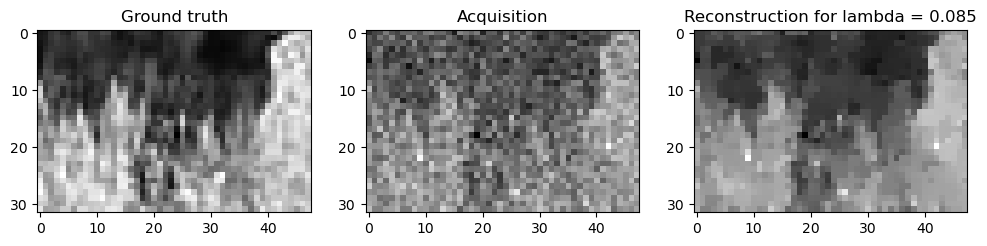

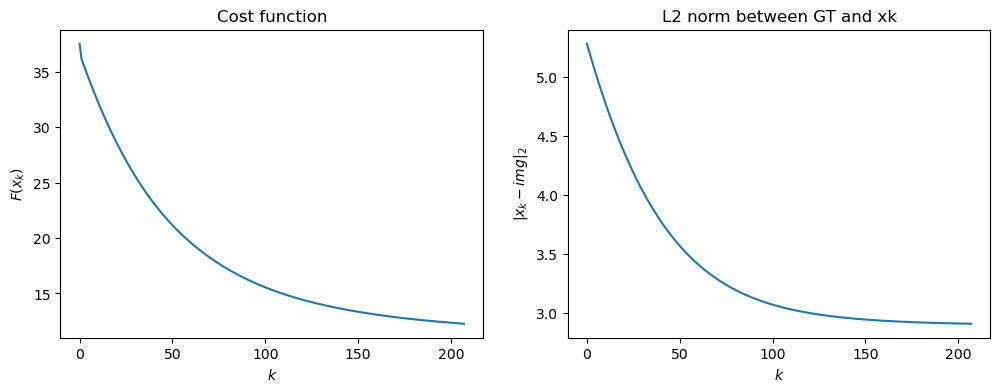

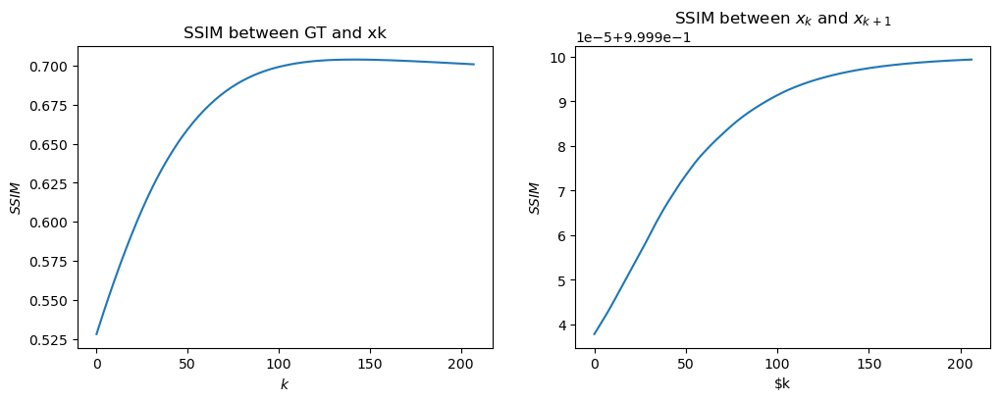

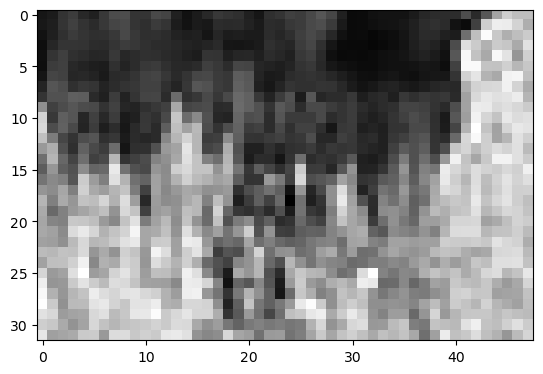

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 269 because of Cost function
I got stopped at iteration 391 because of Cost function
{-0.1: 0.3768416215813554, 0.1: 0.5732289829872057, 0.3: 0.32154797678723684, 0.5: 0.26953296797634524, 0.7: 0.2479080640575137}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 269 because of Cost function
I got stopped at iteration 359 because of Cost function
I got stopped at iteration 391 because of Cost function
{-0.1: 0.3768416215813554, 0.1: 0.5732289829872057, 0.3: 0.32154797678723684, 0.5: 0.26953296797634524, 0.7: 0.2479080640575137, 0.0: 0.37319470125752013, 0.2: 0.39873328030627714}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 144 because

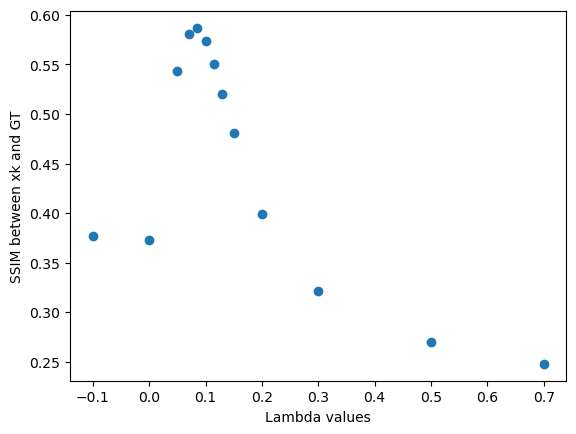

I got stopped at iteration 235 because of Cost function


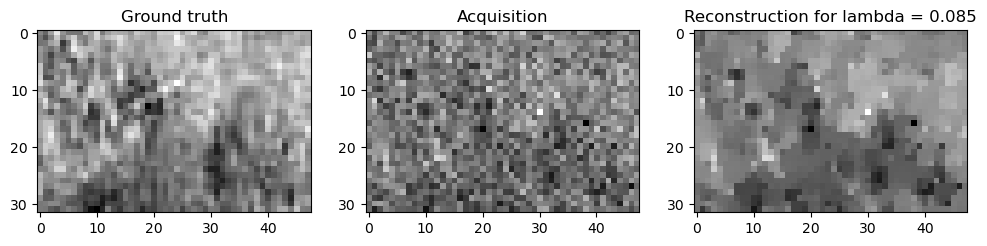

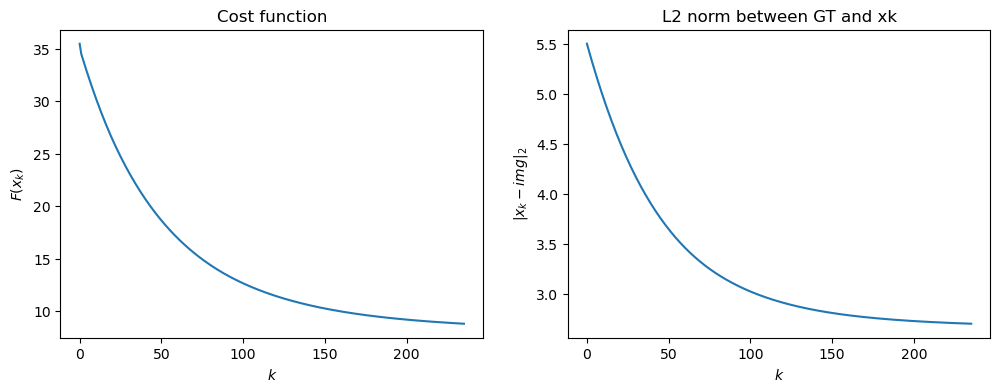

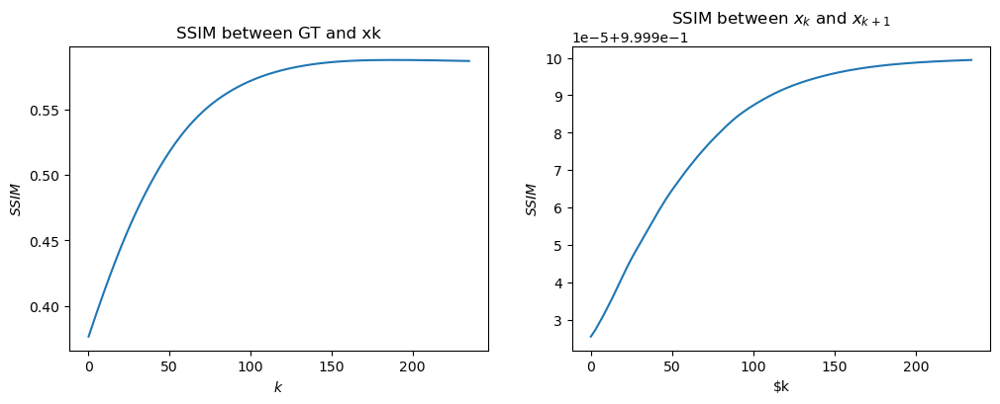

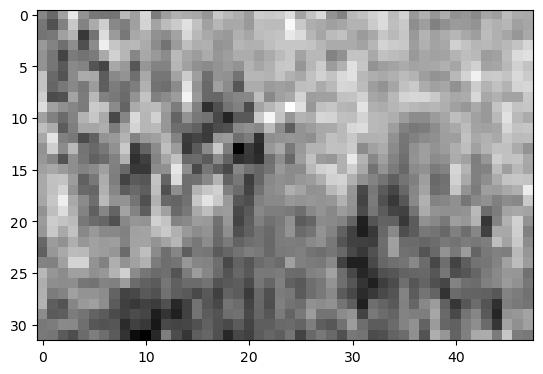

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 258 because of Sequence norm
I got stopped at iteration 366 because of Sequence norm
I got stopped at iteration 383 because of Sequence norm
I got stopped at iteration 377 because of Sequence norm
{-0.1: 0.321253723314551, 0.1: 0.48648933038701797, 0.3: 0.255352849991832, 0.5: 0.23094299034064186, 0.7: 0.22458212329801058}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 258 because of Sequence norm
I got stopped at iteration 349 because of Sequence norm
I got stopped at iteration 366 because of Sequence norm
{-0.1: 0.321253723314551, 0.1: 0.48648933038701797, 0.3: 0.255352849991832, 0.5: 0.23094299034064186, 0.7: 0.22458212329801058, 0.0: 0.3175215540482291, 0.2: 0.30543730527926394}
--------
range examined: [0.   0.05

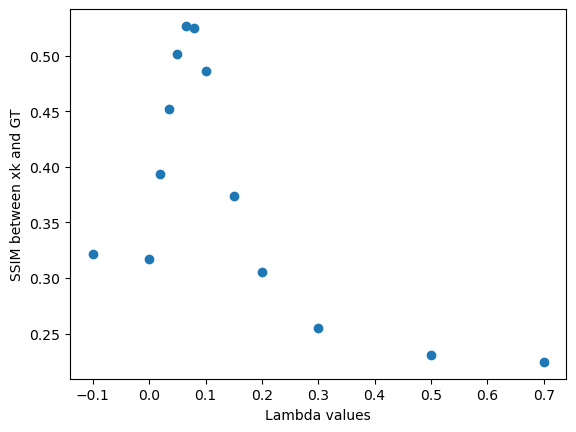

I got stopped at iteration 192 because of Sequence norm


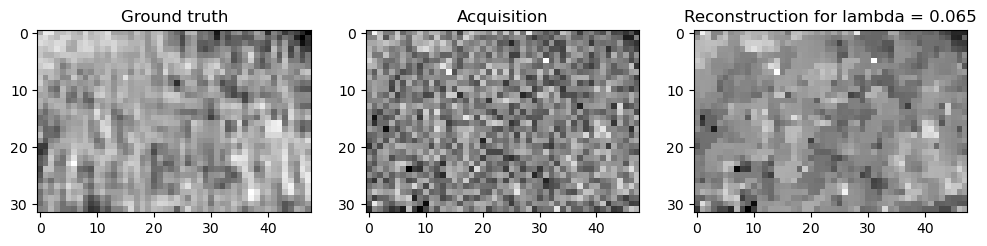

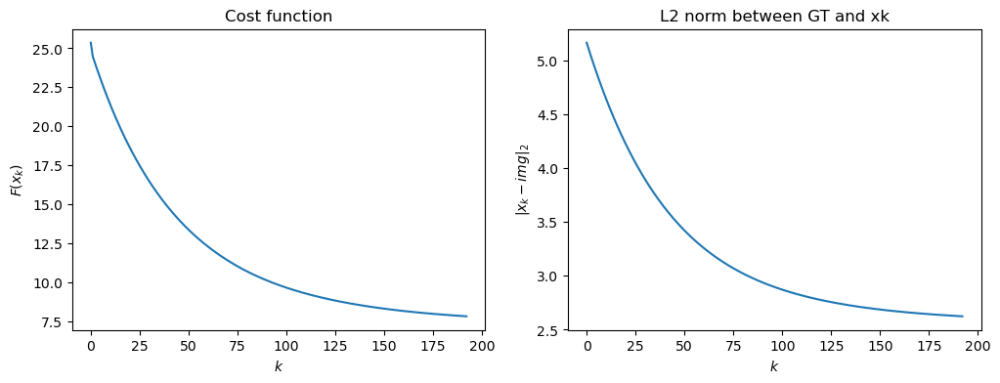

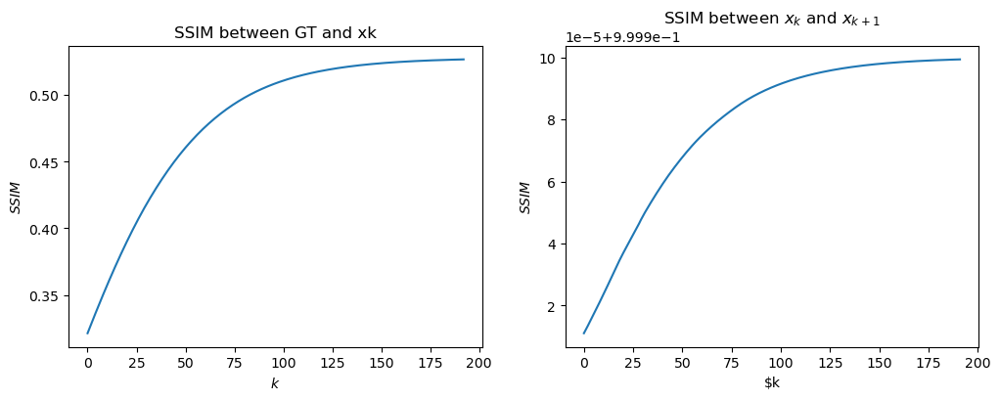

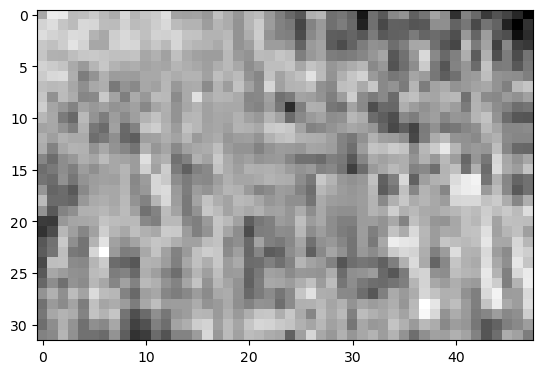

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 260 because of Sequence norm
{-0.1: 0.42435173507423896, 0.1: 0.575911078526706, 0.3: 0.2550923806835294, 0.5: 0.19996810227401313, 0.7: 0.17872268851090592}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 260 because of Sequence norm
I got stopped at iteration 381 because of Cost function
{-0.1: 0.42435173507423896, 0.1: 0.575911078526706, 0.3: 0.2550923806835294, 0.5: 0.19996810227401313, 0.7: 0.17872268851090592, 0.0: 0.42044401742308385, 0.2: 0.33693403983542614}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 141 because of Cost function
I got stopped at iteration 260 because of Sequence norm
I got stopped at iteration 331 because

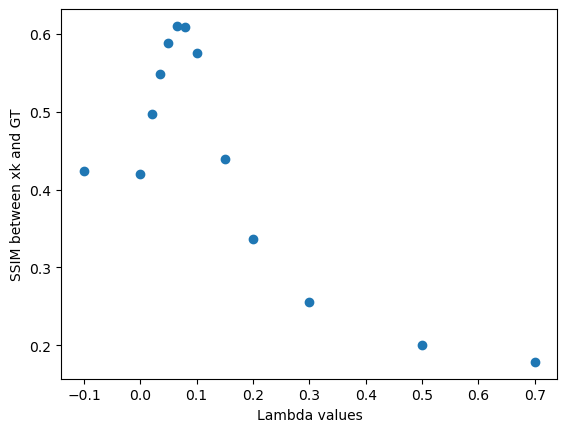

I got stopped at iteration 182 because of Cost function


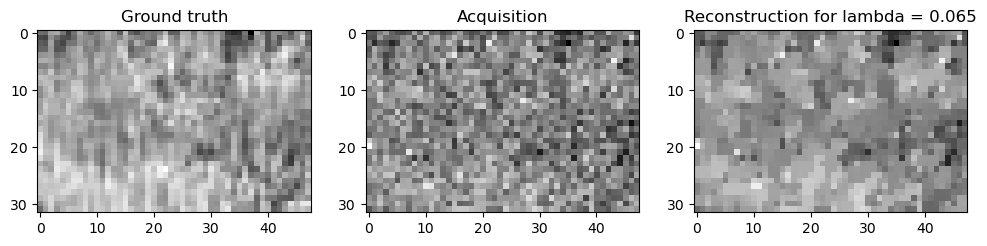

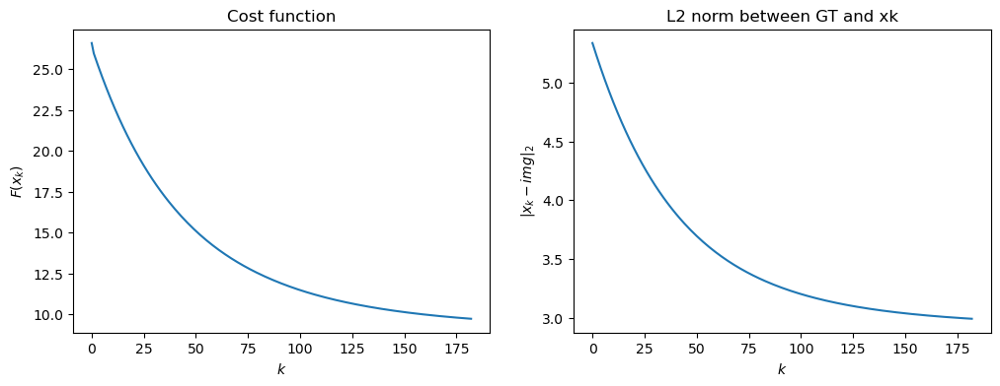

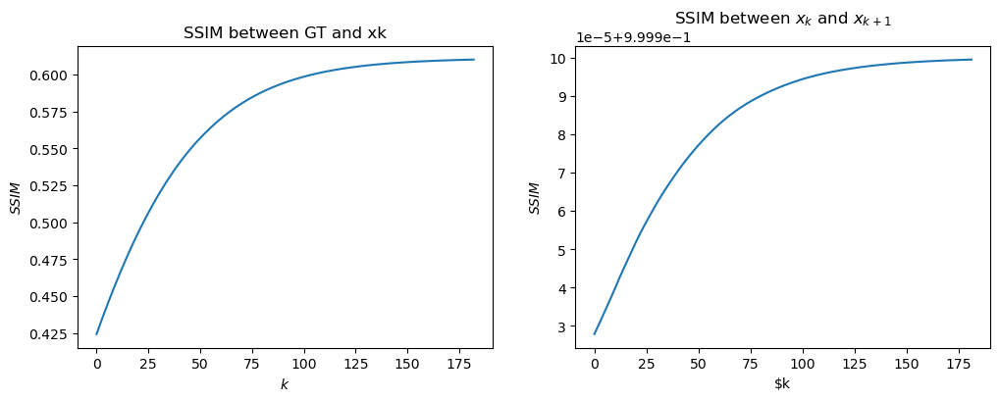

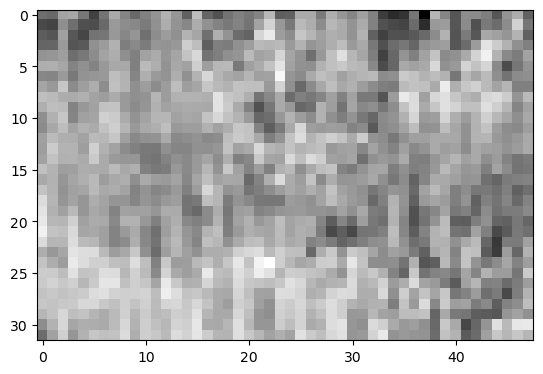

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 265 because of Cost function
I got stopped at iteration 365 because of Cost function
{-0.1: 0.34016298463200534, 0.1: 0.592570841696293, 0.3: 0.3659527704587526, 0.5: 0.3068617744205251, 0.7: 0.28590223311662016}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 265 because of Cost function
I got stopped at iteration 347 because of Cost function
I got stopped at iteration 365 because of Cost function
{-0.1: 0.34016298463200534, 0.1: 0.592570841696293, 0.3: 0.3659527704587526, 0.5: 0.3068617744205251, 0.7: 0.28590223311662016, 0.0: 0.3363241006314917, 0.2: 0.4405674494739259}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 144 because of 

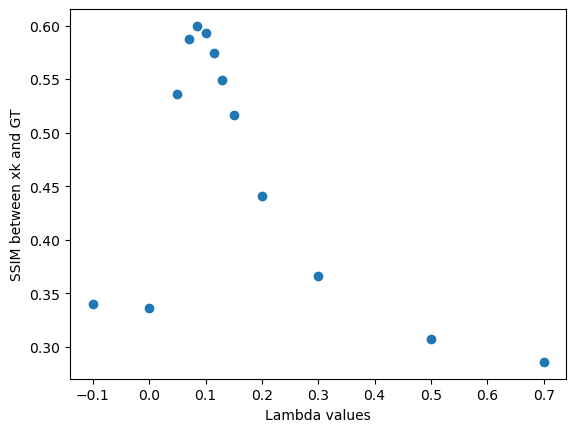

I got stopped at iteration 238 because of Cost function


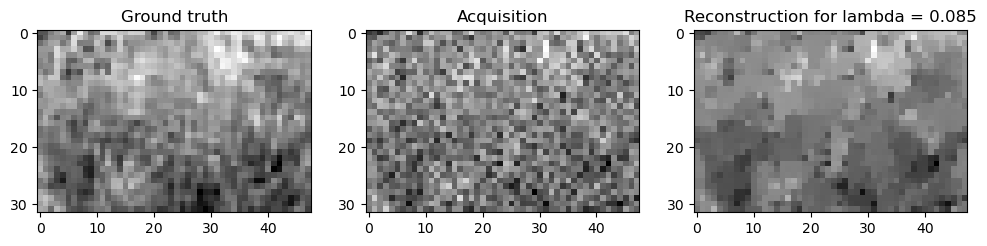

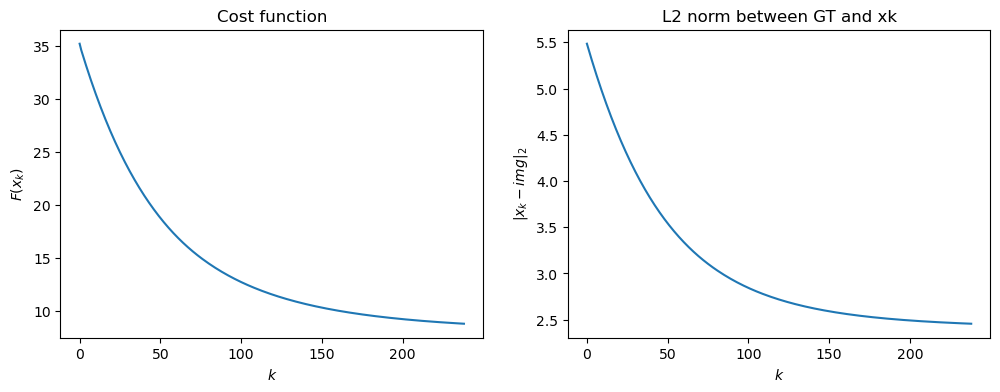

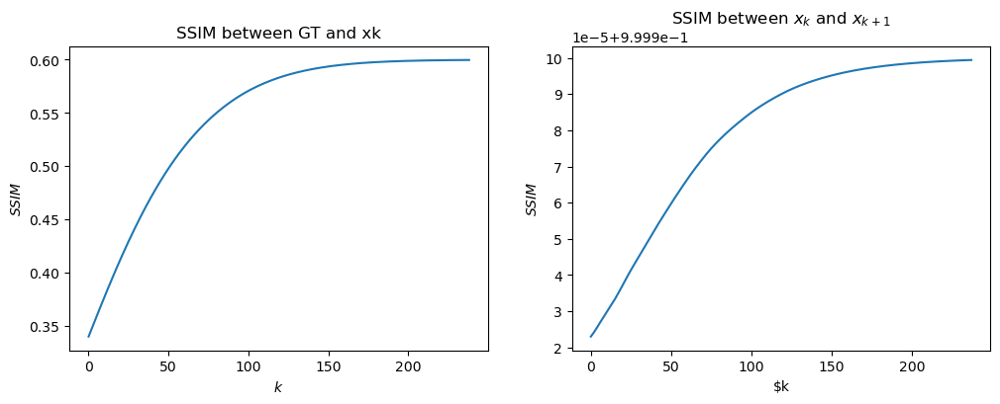

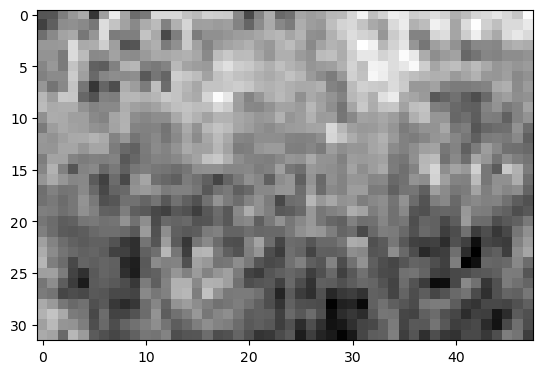

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 272 because of Sequence norm
I got stopped at iteration 374 because of Cost function
{-0.1: 0.3581482373181152, 0.1: 0.5292739823805147, 0.3: 0.31316064276320926, 0.5: 0.2672176175982258, 0.7: 0.24998450788427912}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 272 because of Sequence norm
I got stopped at iteration 361 because of Cost function
I got stopped at iteration 374 because of Cost function
{-0.1: 0.3581482373181152, 0.1: 0.5292739823805147, 0.3: 0.31316064276320926, 0.5: 0.2672176175982258, 0.7: 0.24998450788427912, 0.0: 0.3546625095635539, 0.2: 0.3672343102509029}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 143 because o

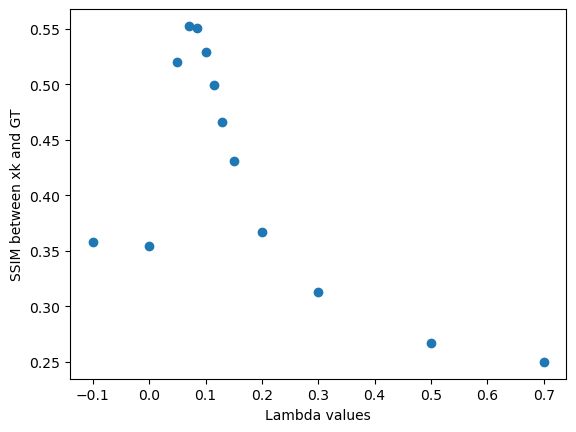

I got stopped at iteration 204 because of Cost function


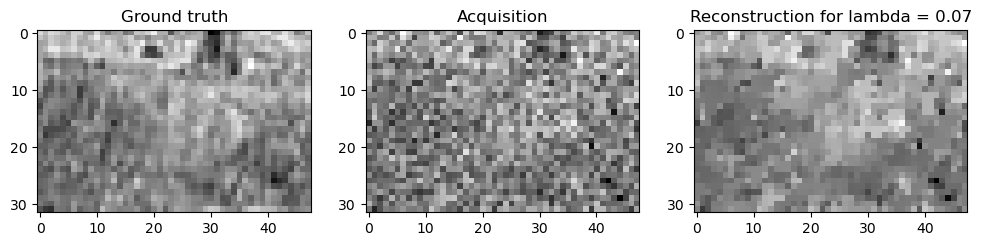

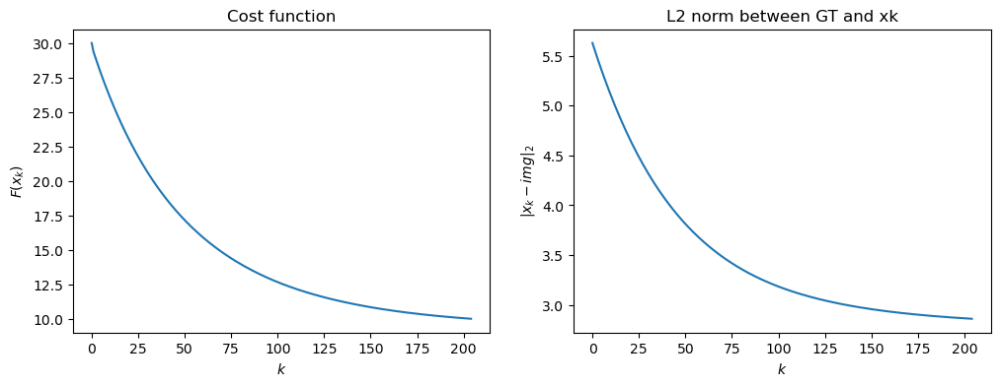

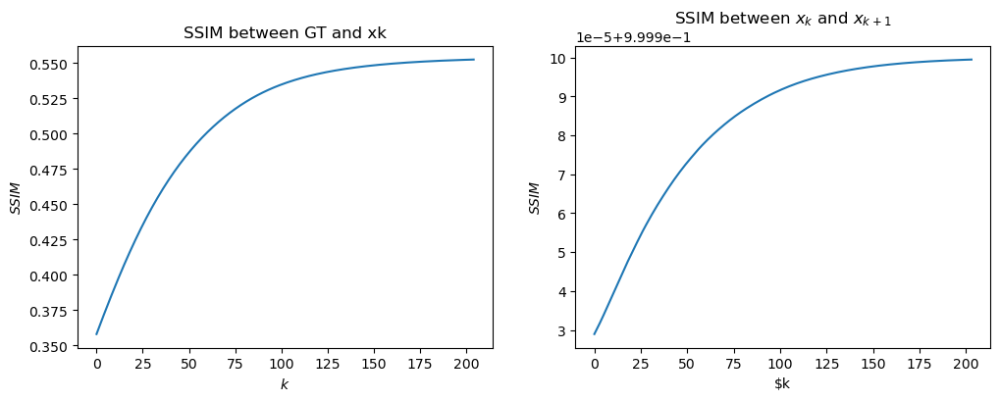

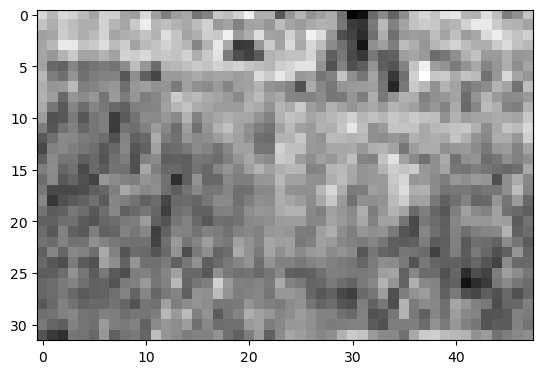

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 271 because of Sequence norm
I got stopped at iteration 397 because of Cost function
{-0.1: 0.3771743260010459, 0.1: 0.475630488338914, 0.3: 0.23296655509695316, 0.5: 0.20337041056484914, 0.7: 0.19243576305078636}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 271 because of Sequence norm
I got stopped at iteration 331 because of Cost function
I got stopped at iteration 397 because of Cost function
{-0.1: 0.3771743260010459, 0.1: 0.475630488338914, 0.3: 0.23296655509695316, 0.5: 0.20337041056484914, 0.7: 0.19243576305078636, 0.0: 0.37370863550750877, 0.2: 0.293858182363799}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 145 because o

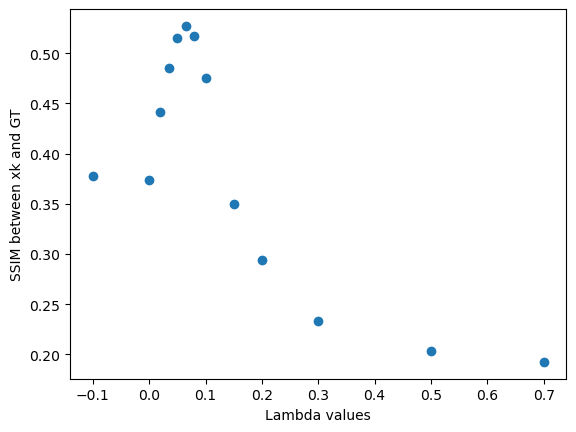

I got stopped at iteration 190 because of Cost function


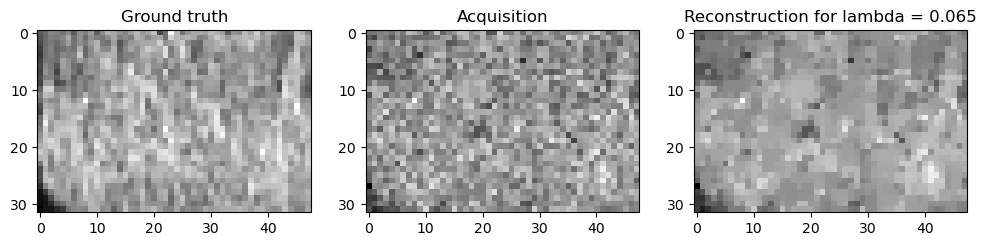

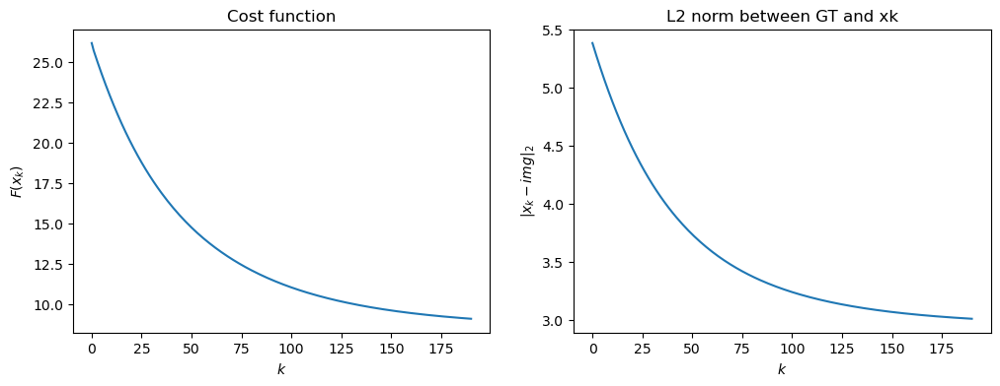

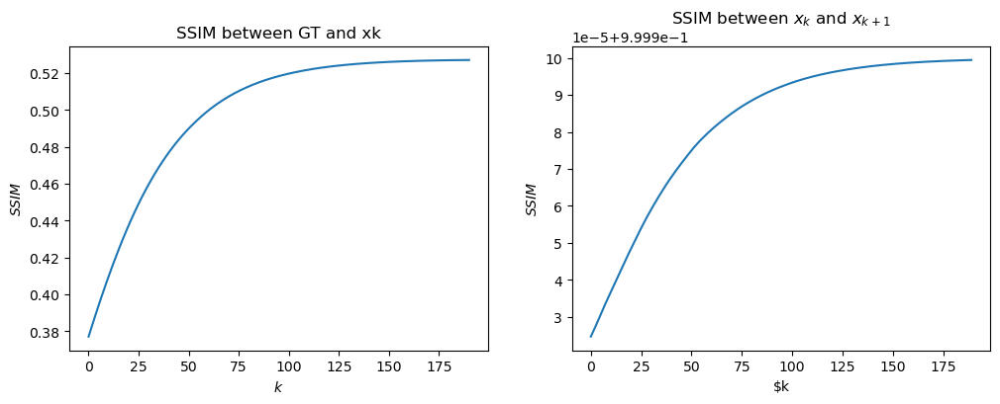

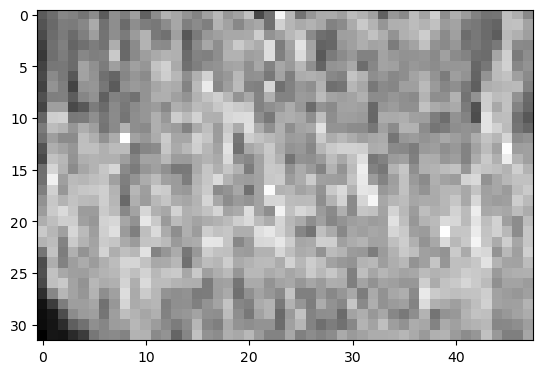

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 277 because of Cost function
{-0.1: 0.4303021587399552, 0.1: 0.5721051031761262, 0.3: 0.26079679183190985, 0.5: 0.217400599365942, 0.7: 0.20116703997217697}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 277 because of Cost function
I got stopped at iteration 386 because of Sequence norm
{-0.1: 0.4303021587399552, 0.1: 0.5721051031761262, 0.3: 0.26079679183190985, 0.5: 0.217400599365942, 0.7: 0.20116703997217697, 0.0: 0.42649925254803406, 0.2: 0.332738971883432}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 142 because of Cost function
I got stopped at iteration 277 because of Cost function
I got stopped at iteration 372 because of 

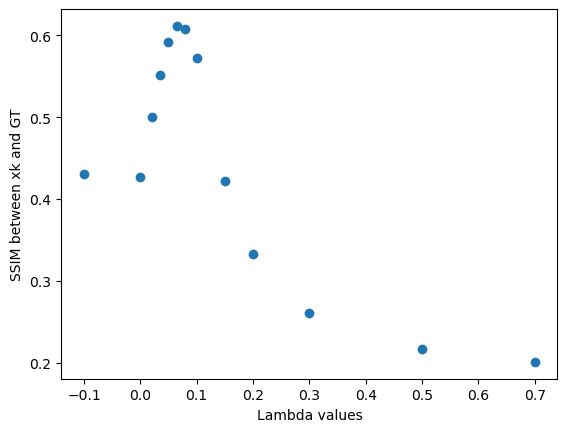

I got stopped at iteration 185 because of Cost function


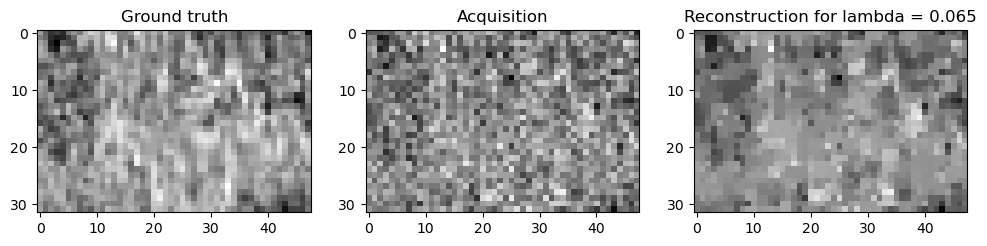

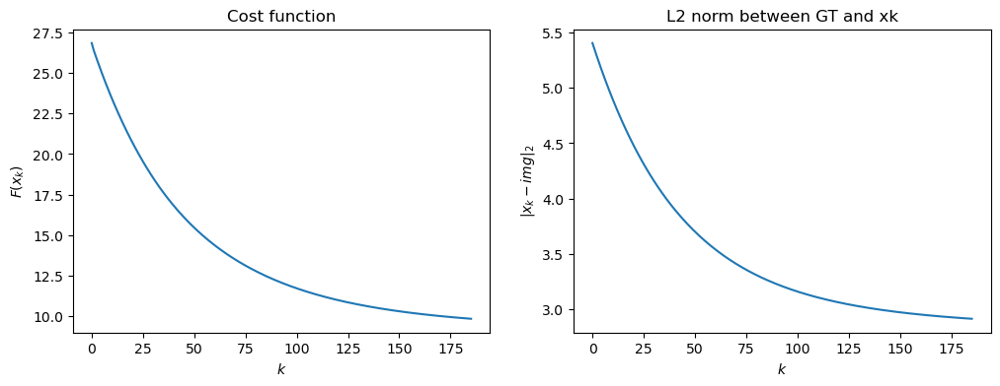

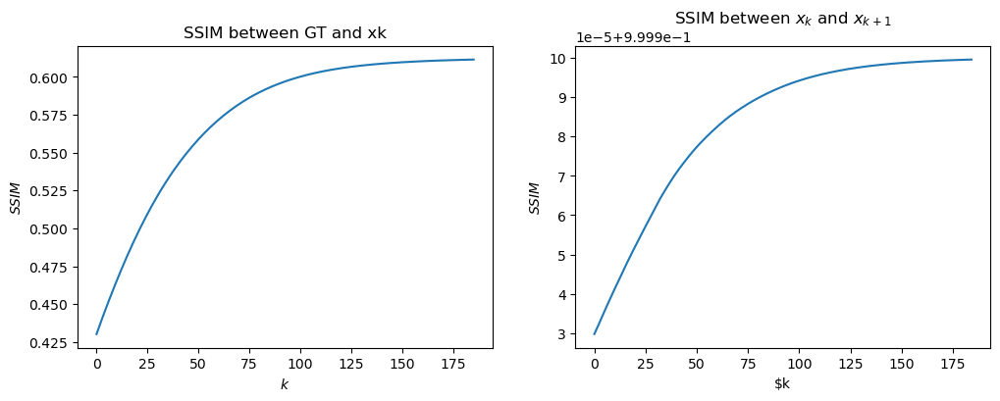

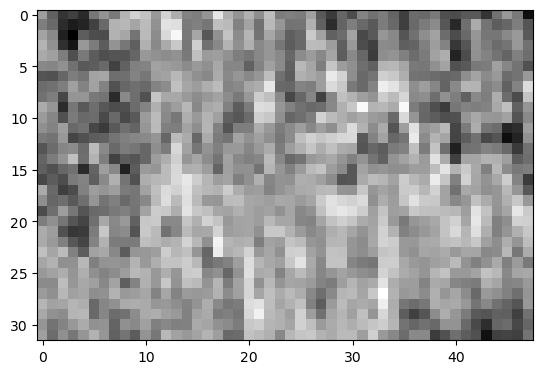

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 269 because of Sequence norm
I got stopped at iteration 396 because of Cost function
{-0.1: 0.38897964747800307, 0.1: 0.5451034483719064, 0.3: 0.25847423414783194, 0.5: 0.2150768610479785, 0.7: 0.19939365972670103}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 269 because of Sequence norm
I got stopped at iteration 377 because of Cost function
I got stopped at iteration 396 because of Cost function
{-0.1: 0.38897964747800307, 0.1: 0.5451034483719064, 0.3: 0.25847423414783194, 0.5: 0.2150768610479785, 0.7: 0.19939365972670103, 0.0: 0.3849847243230599, 0.2: 0.3306214016505231}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 145 because

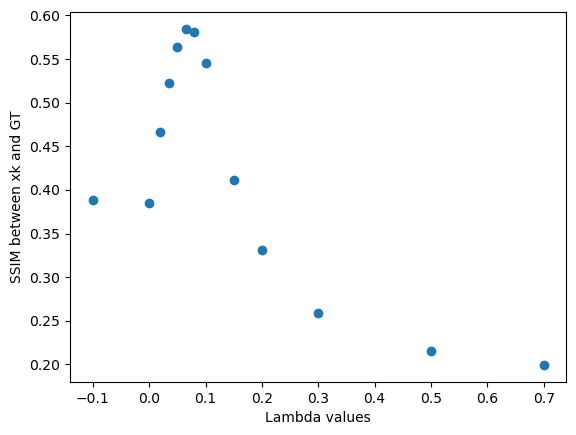

I got stopped at iteration 191 because of Cost function


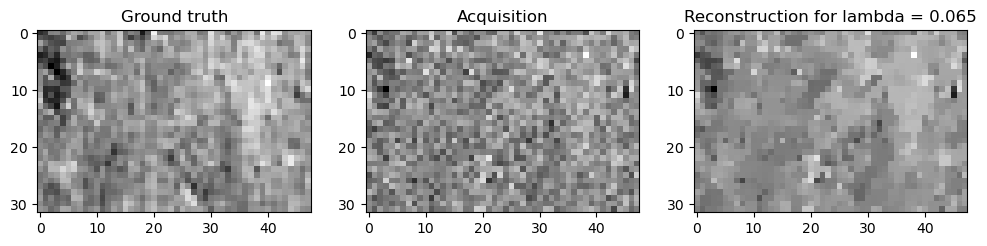

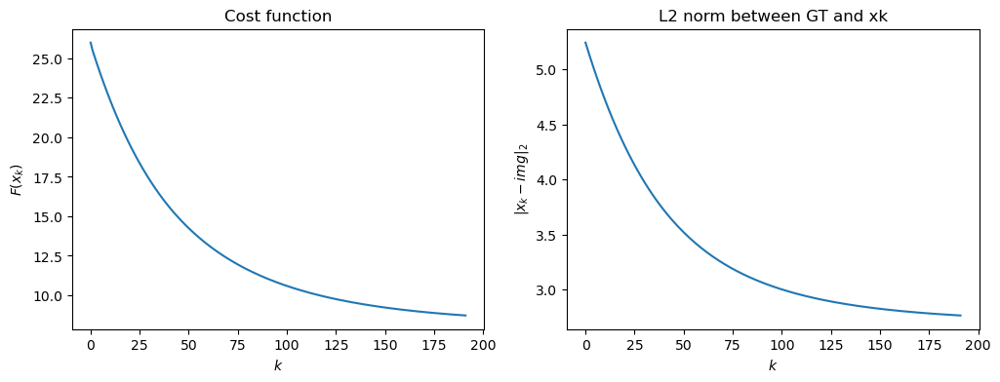

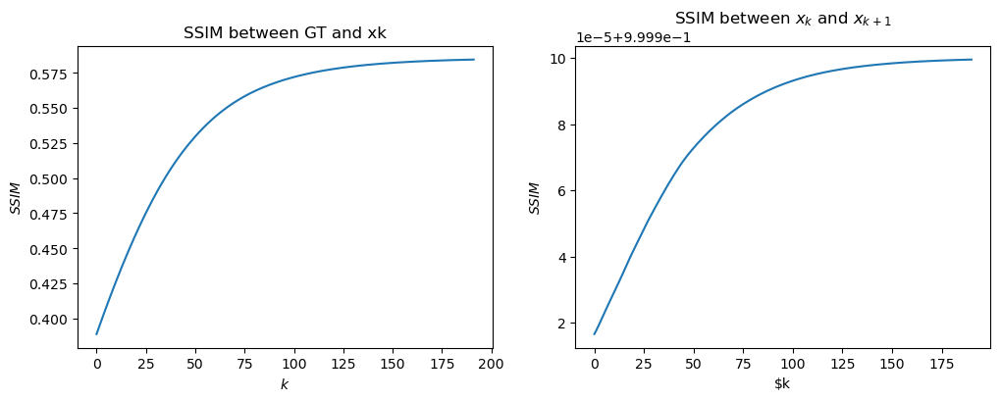

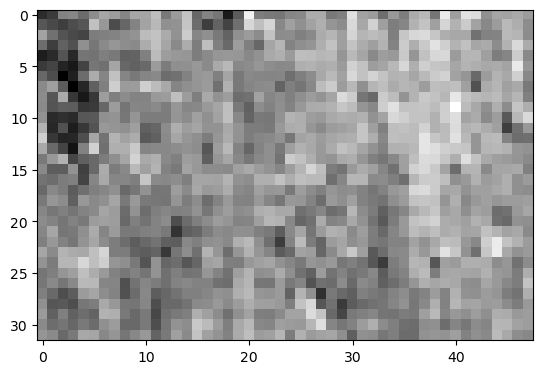

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 270 because of Sequence norm
I got stopped at iteration 393 because of Sequence norm
{-0.1: 0.35377892891296236, 0.1: 0.5085321962168803, 0.3: 0.22408888695850984, 0.5: 0.19394214790994313, 0.7: 0.18460651428937966}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 270 because of Sequence norm
I got stopped at iteration 398 because of Sequence norm
I got stopped at iteration 393 because of Sequence norm
{-0.1: 0.35377892891296236, 0.1: 0.5085321962168803, 0.3: 0.22408888695850984, 0.5: 0.19394214790994313, 0.7: 0.18460651428937966, 0.0: 0.3500560536183924, 0.2: 0.28170074013168844}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 150 beca

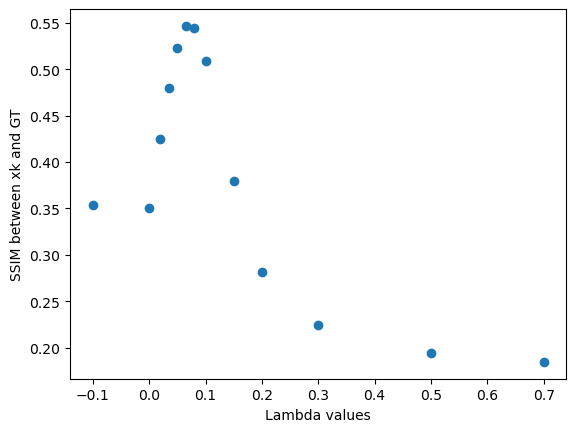

I got stopped at iteration 196 because of Cost function


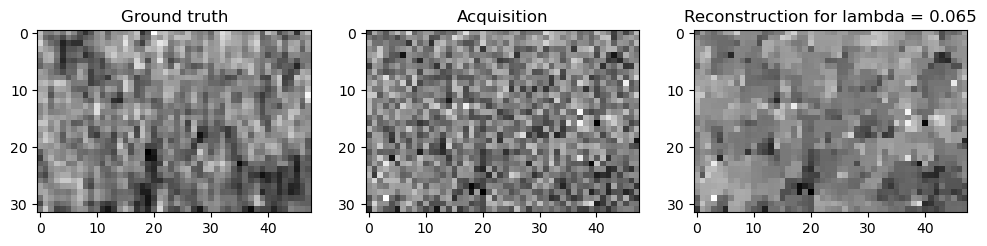

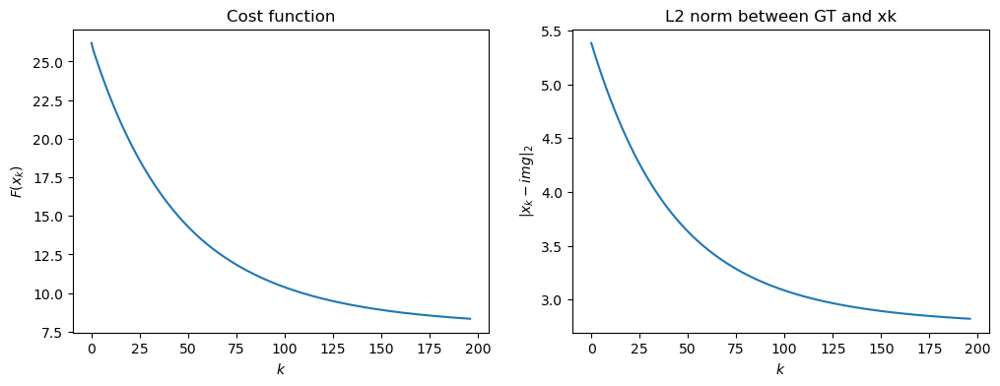

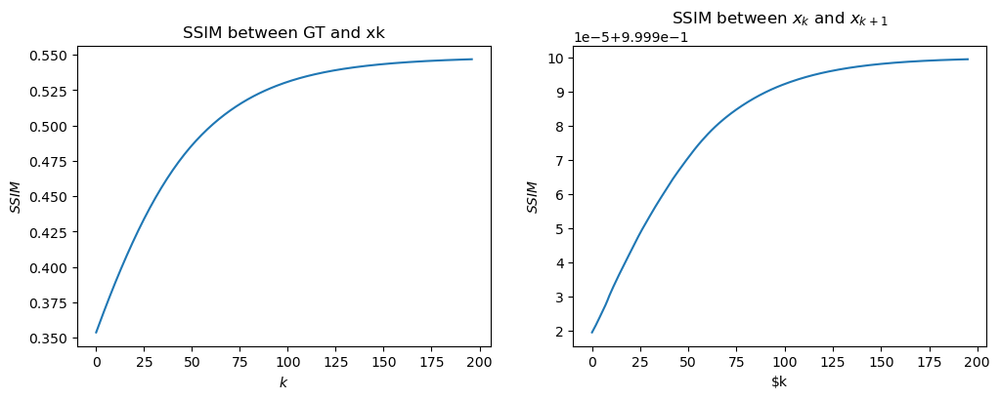

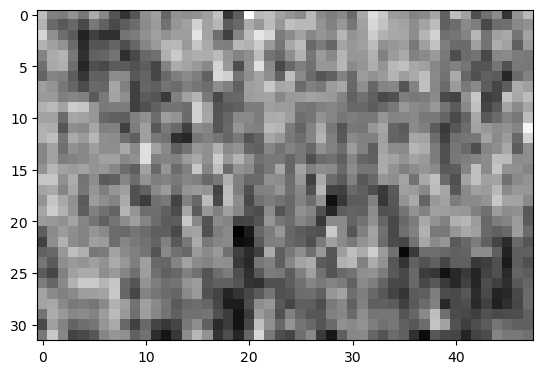

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 277 because of Cost function
I got stopped at iteration 391 because of Cost function
{-0.1: 0.34477682732951576, 0.1: 0.5468818088808197, 0.3: 0.2931196753024015, 0.5: 0.2606631816928026, 0.7: 0.24759314116552852}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 277 because of Cost function
I got stopped at iteration 371 because of Sequence norm
I got stopped at iteration 391 because of Cost function
{-0.1: 0.34477682732951576, 0.1: 0.5468818088808197, 0.3: 0.2931196753024015, 0.5: 0.2606631816928026, 0.7: 0.24759314116552852, 0.0: 0.34087314978530375, 0.2: 0.34737067439801356}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 148 because

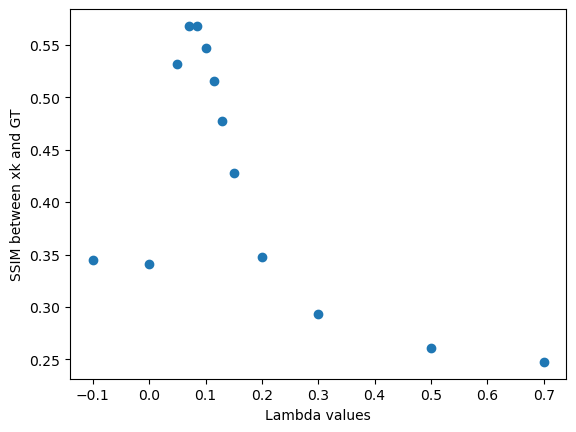

I got stopped at iteration 244 because of Cost function


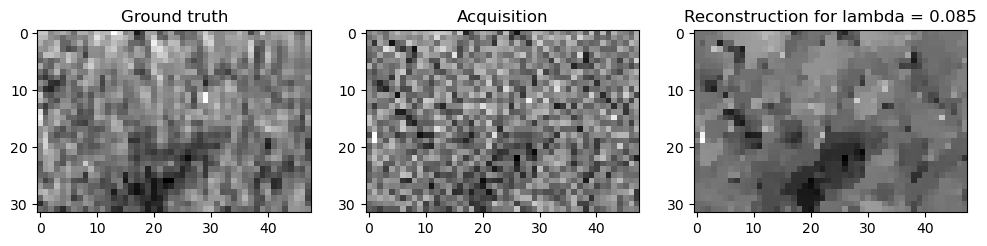

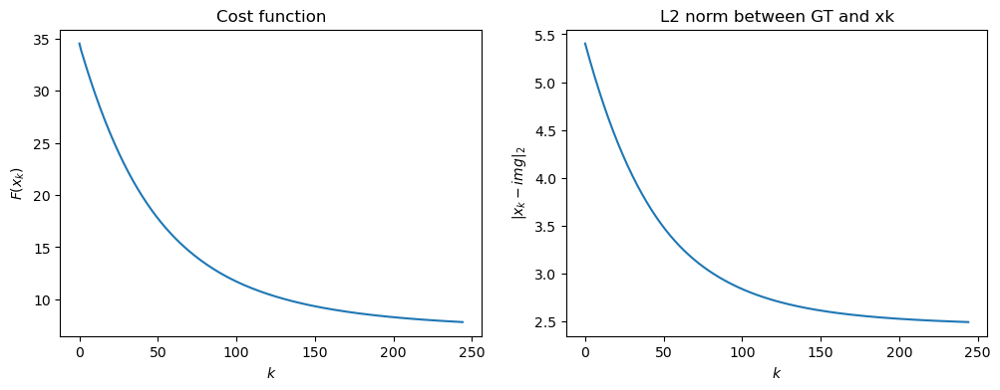

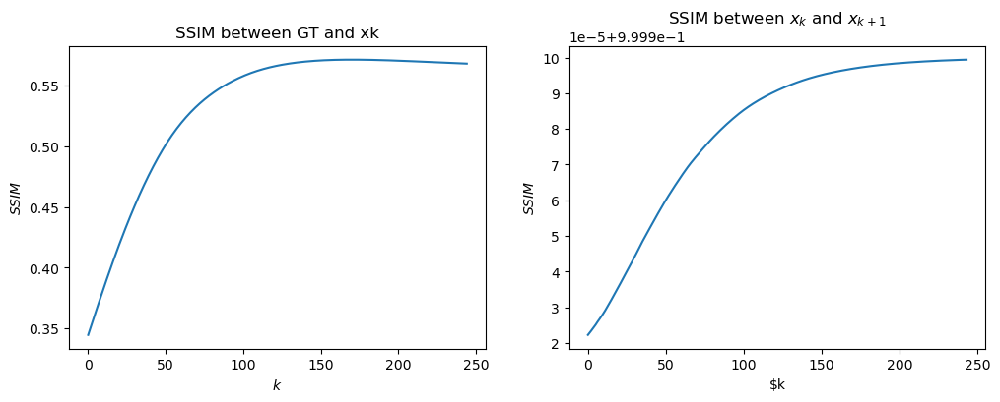

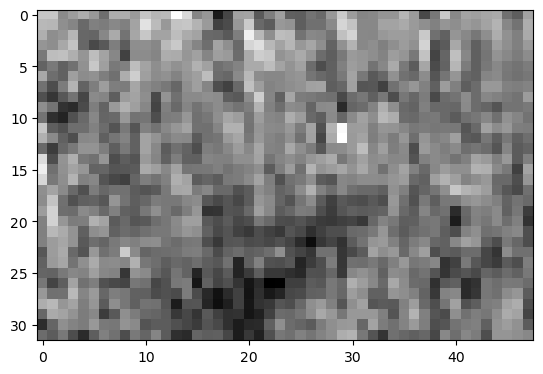

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 275 because of Sequence norm
I got stopped at iteration 390 because of Cost function
{-0.1: 0.3730722398419665, 0.1: 0.5375179006820233, 0.3: 0.2721650050825867, 0.5: 0.23447405841367902, 0.7: 0.21927890211219628}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 275 because of Sequence norm
I got stopped at iteration 369 because of Cost function
I got stopped at iteration 390 because of Cost function
{-0.1: 0.3730722398419665, 0.1: 0.5375179006820233, 0.3: 0.2721650050825867, 0.5: 0.23447405841367902, 0.7: 0.21927890211219628, 0.0: 0.3693349132026995, 0.2: 0.33019550288880783}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 147 because 

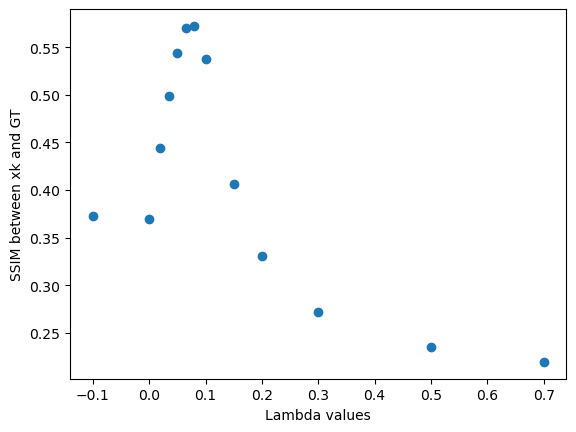

I got stopped at iteration 234 because of Sequence norm


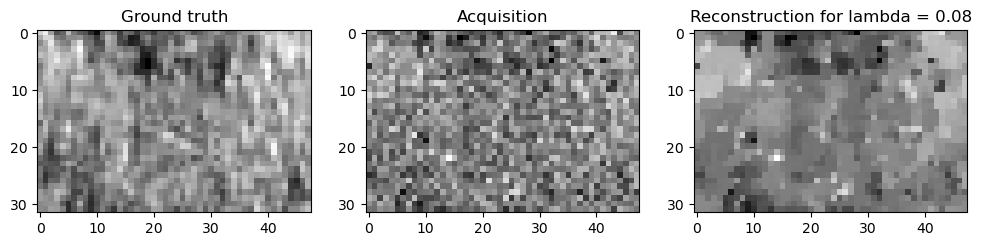

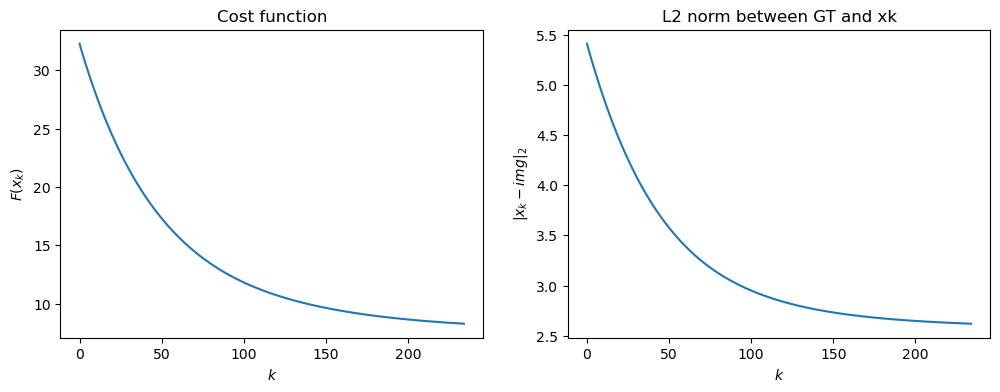

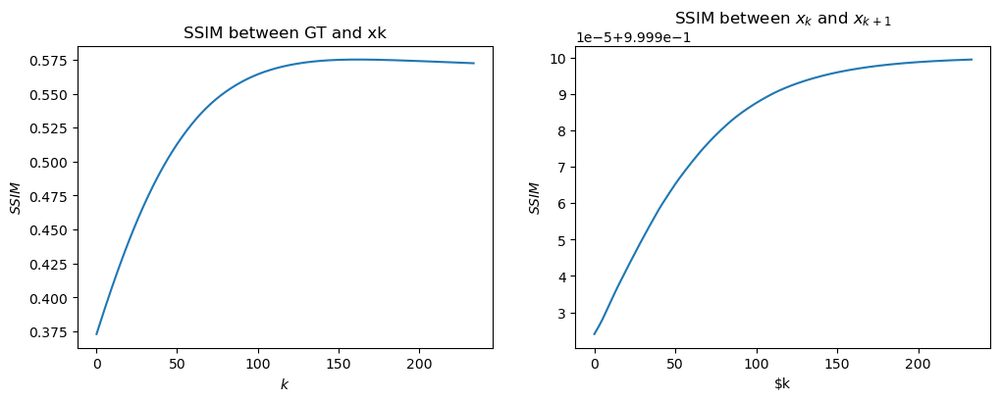

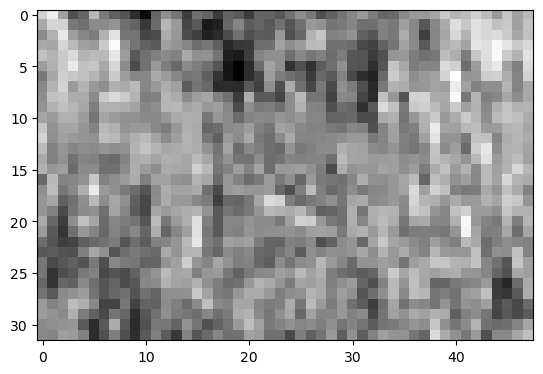

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 264 because of Cost function
I got stopped at iteration 335 because of Cost function
I got stopped at iteration 369 because of Cost function
{-0.1: 0.3633841983283838, 0.1: 0.5638153251969312, 0.3: 0.3415863501794339, 0.5: 0.29689480671012597, 0.7: 0.27504321625512834}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 264 because of Cost function
I got stopped at iteration 345 because of Cost function
I got stopped at iteration 335 because of Cost function
{-0.1: 0.3633841983283838, 0.1: 0.5638153251969312, 0.3: 0.3415863501794339, 0.5: 0.29689480671012597, 0.7: 0.27504321625512834, 0.0: 0.35958965307861823, 0.2: 0.39848398104153554}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because

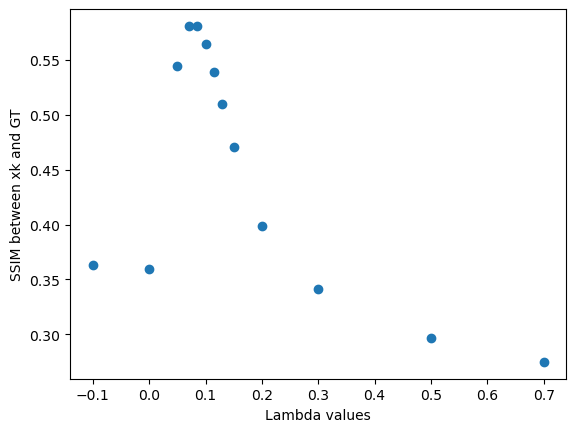

I got stopped at iteration 200 because of Cost function


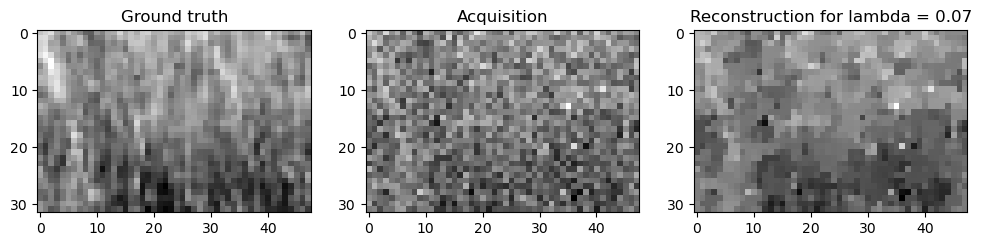

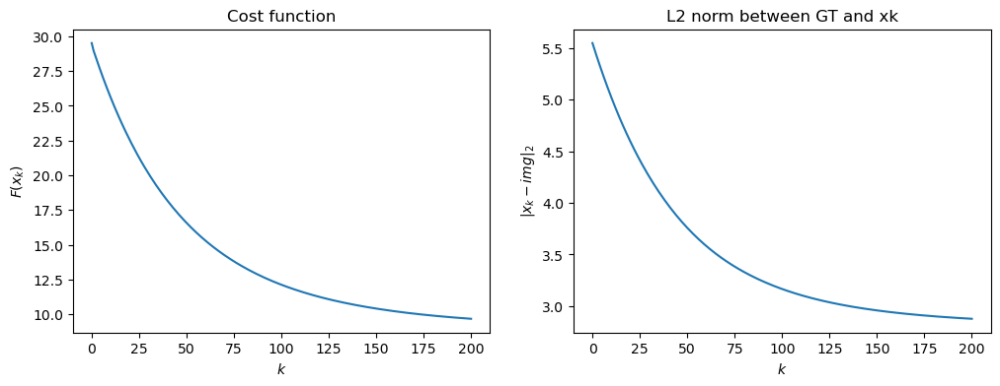

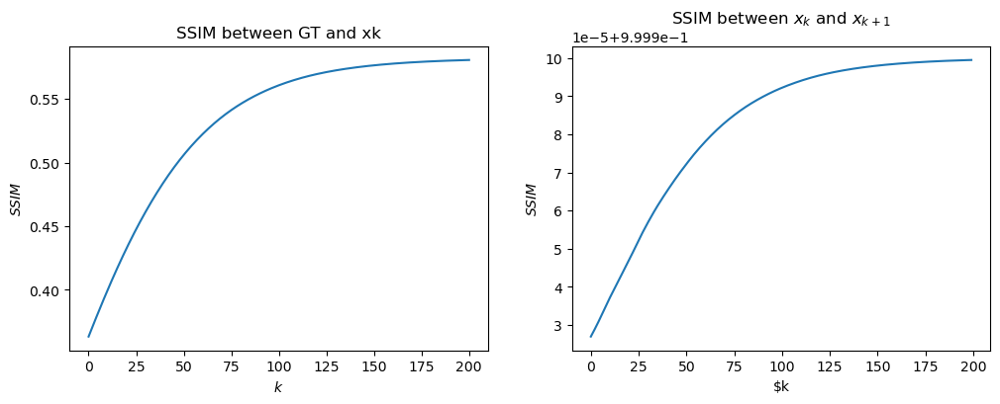

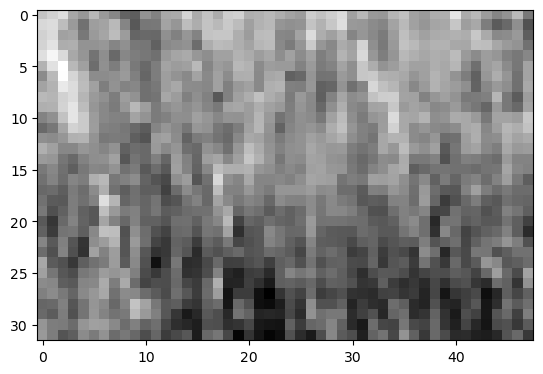

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 256 because of Cost function
{-0.1: 0.4398062502333339, 0.1: 0.6243212543396887, 0.3: 0.3471093143880683, 0.5: 0.269455534020285, 0.7: 0.23781921374757134}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 256 because of Cost function
I got stopped at iteration 376 because of Cost function
{-0.1: 0.4398062502333339, 0.1: 0.6243212543396887, 0.3: 0.3471093143880683, 0.5: 0.269455534020285, 0.7: 0.23781921374757134, 0.0: 0.4357577457240329, 0.2: 0.44569926819861}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 143 because of Cost function
I got stopped at iteration 256 because of Cost function
I got stopped at iteration 325 because of Cost

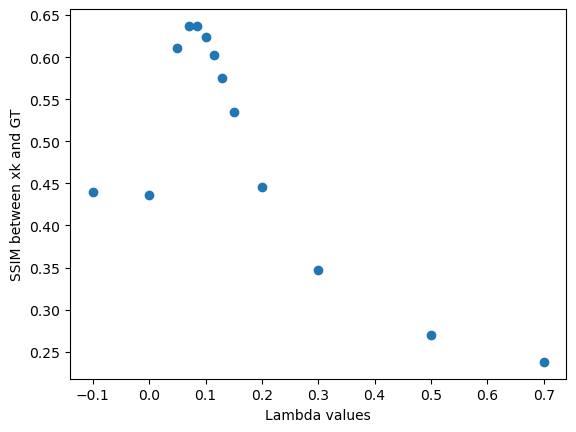

I got stopped at iteration 229 because of Cost function


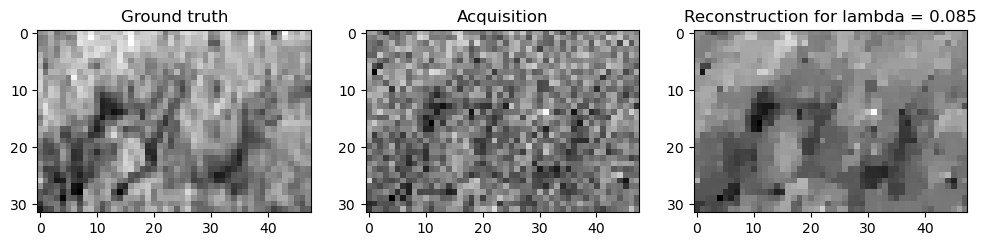

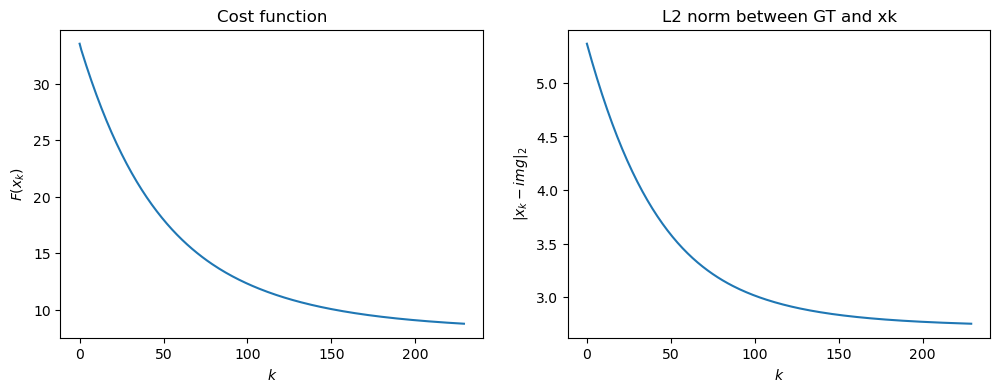

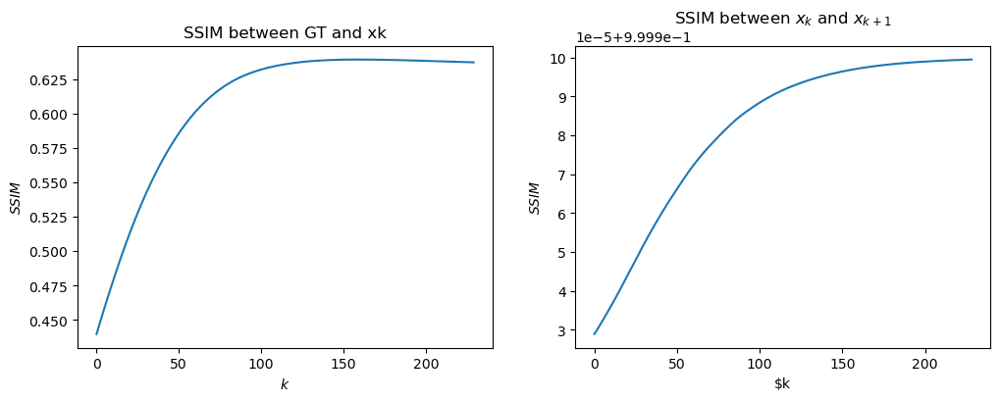

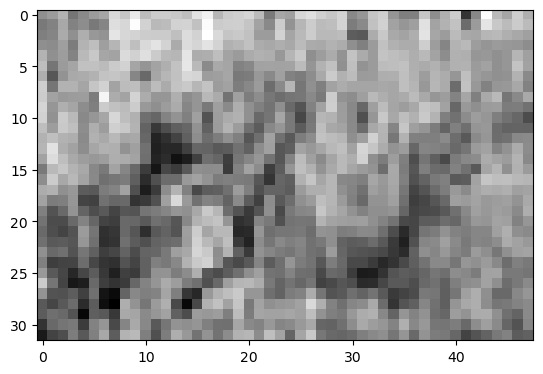

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 263 because of Cost function
I got stopped at iteration 376 because of Cost function
{-0.1: 0.37779619518453195, 0.1: 0.6152822344443005, 0.3: 0.3907056712949643, 0.5: 0.32551803630351783, 0.7: 0.2995494482450617}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 263 because of Cost function
I got stopped at iteration 346 because of Cost function
I got stopped at iteration 376 because of Cost function
{-0.1: 0.37779619518453195, 0.1: 0.6152822344443005, 0.3: 0.3907056712949643, 0.5: 0.32551803630351783, 0.7: 0.2995494482450617, 0.0: 0.37383923511459355, 0.2: 0.4669715242321924}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 144 because 

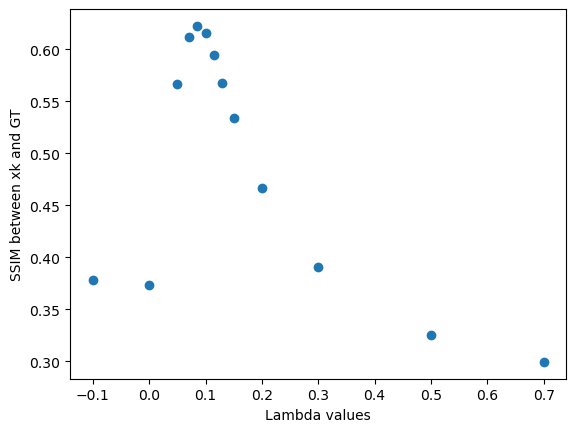

I got stopped at iteration 235 because of Cost function


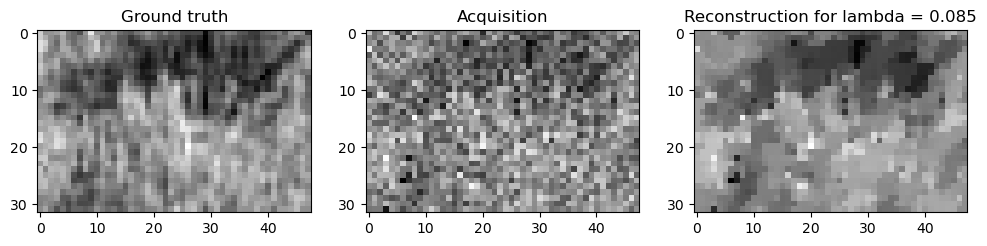

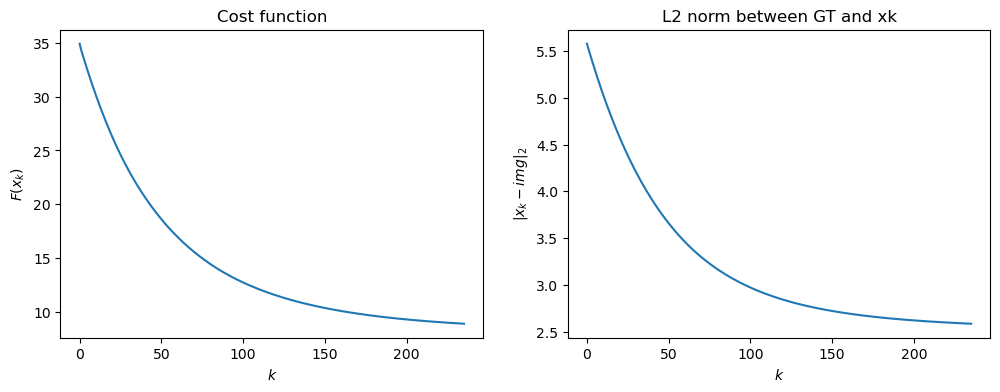

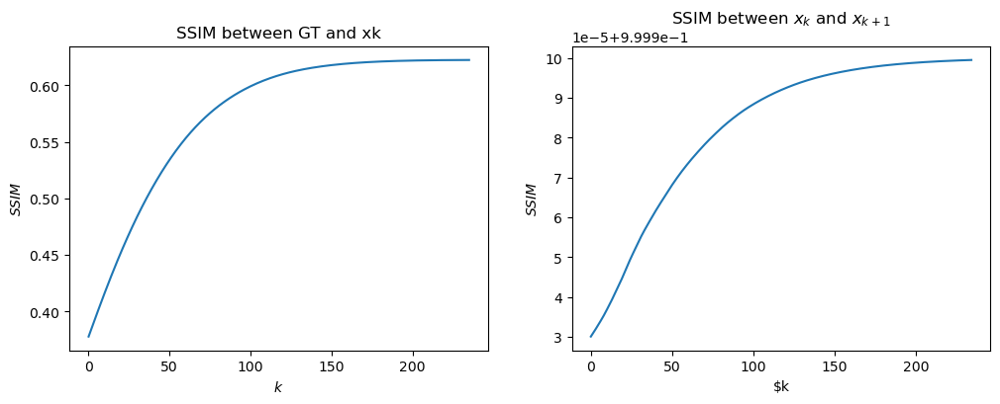

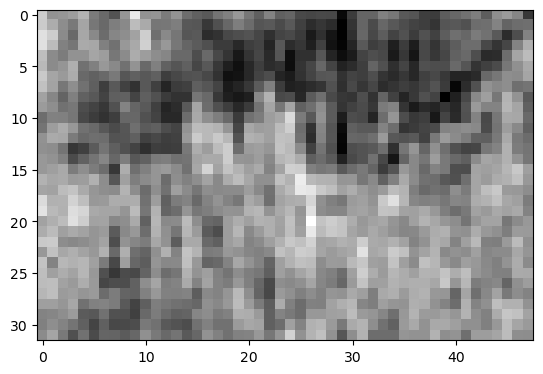

--------
range examined: [-0.1  0.1  0.3  0.5  0.7]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 291 because of Cost function
{-0.1: 0.30261611150315876, 0.1: 0.5243950673262424, 0.3: 0.2688389415050126, 0.5: 0.24198472051840056, 0.7: 0.2325315413464076}
--------
range examined: [-0.1  0.   0.1  0.2  0.3]
I got stopped at iteration 0 because of Cost function
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 291 because of Cost function
I got stopped at iteration 365 because of Sequence norm
{-0.1: 0.30261611150315876, 0.1: 0.5243950673262424, 0.3: 0.2688389415050126, 0.5: 0.24198472051840056, 0.7: 0.2325315413464076, 0.0: 0.2990856953472428, 0.2: 0.3264310721442671}
--------
range examined: [0.   0.05 0.1  0.15 0.2 ]
I got stopped at iteration 1 because of Sequence norm
I got stopped at iteration 148 because of Cost function
I got stopped at iteration 291 because of Cost function
I got stopped at iteration 343 because o

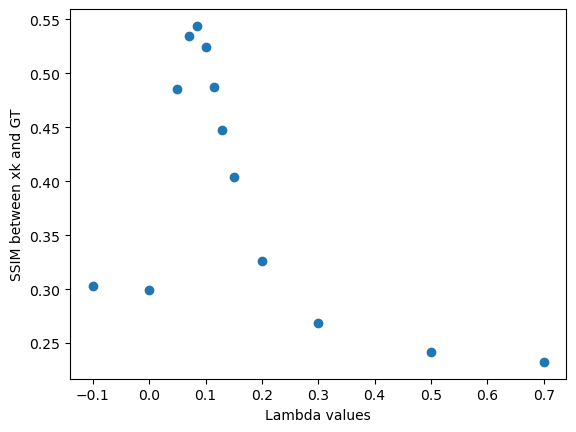

I got stopped at iteration 253 because of Cost function


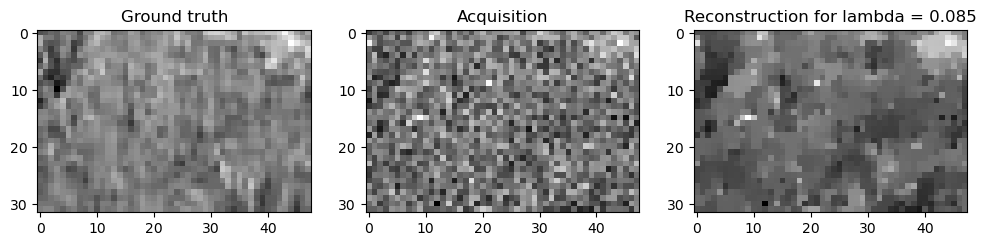

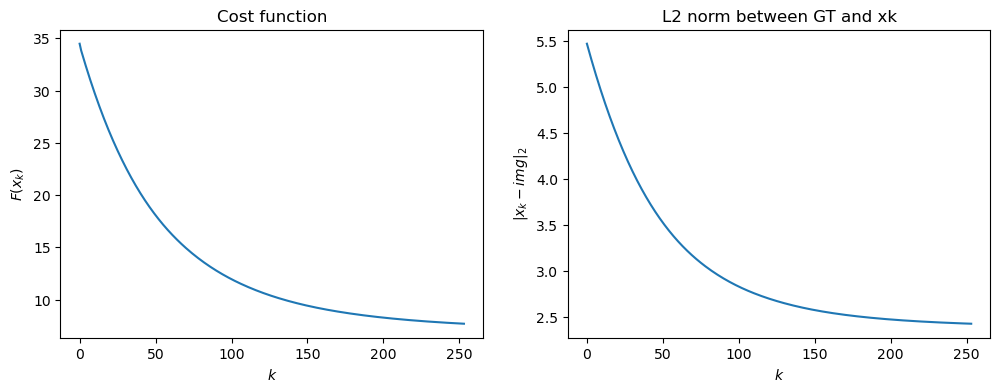

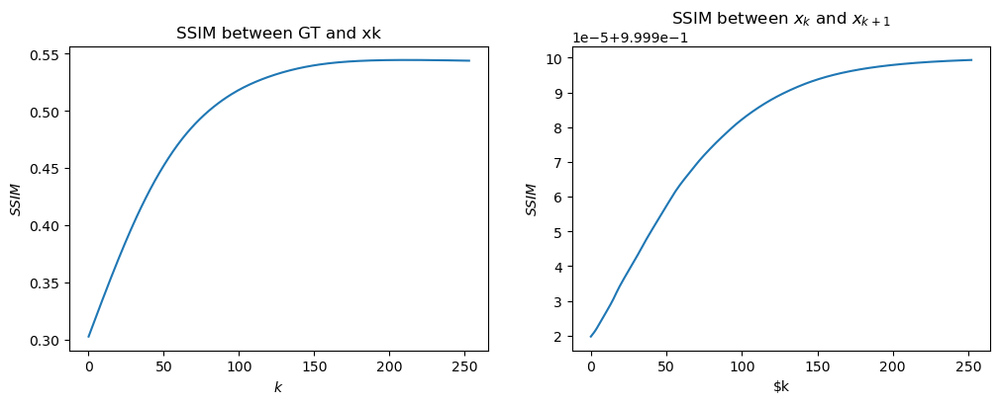

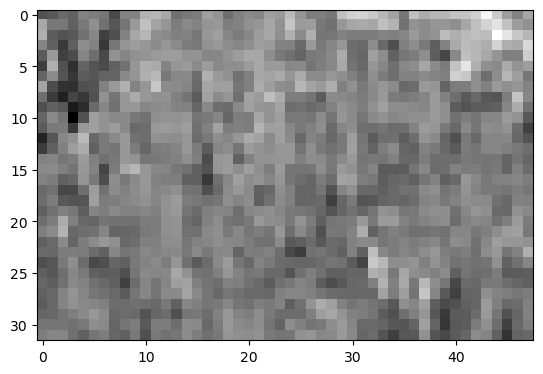

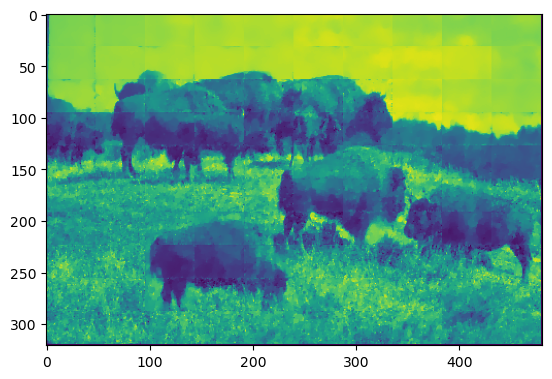

In [16]:
alpha = [0.2,0.1,0.05,0.015]
(m,n) = np.shape(img)
reconstructedImage = np.zeros(shape = (m,n))

for i in range(n_patches_horizontal):
    for j in range(n_patches_vertical):
        y = generateNoise(img,mode='gaussian',seed=43,var=0.02)
        patch = img[i*maxHorizontal:(i+1)*maxHorizontal,j*maxVertical:(j+1)*maxVertical]
        yPatch = y[i*maxHorizontal:(i+1)*maxHorizontal,j*maxVertical:(j+1)*maxVertical]
        optLambda = runGoldenSection(img = patch,y = yPatch,lmbdaCentroid = 0.3, alpha = alpha, SSIMstop = False, early_stopping = True)
        denoisedImage = runScript(patch,yPatch,lmbda = [optLambda], SSIMstop = False, early_stopping = True)
        reconstructedImage[i*maxHorizontal:(i+1)*maxHorizontal,j*maxVertical:(j+1)*maxVertical] = denoisedImage
        plt.imshow(patch, cmap = 'gray')
        plt.show()
        # sarebbe divertente ricostruire l'immagine dalle patches 
plt.imshow(reconstructedImage)
plt.show()

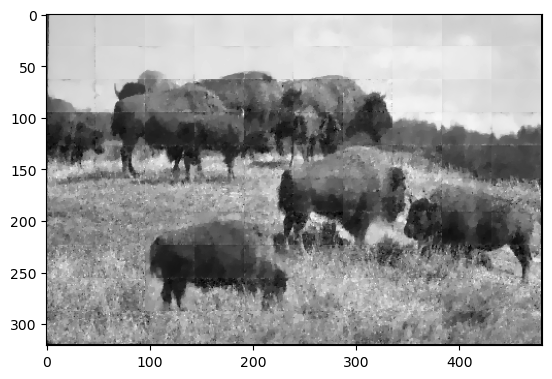

In [17]:
plt.imshow(reconstructedImage,cmap = 'gray')

I got stopped at iteration 306 because of Cost function


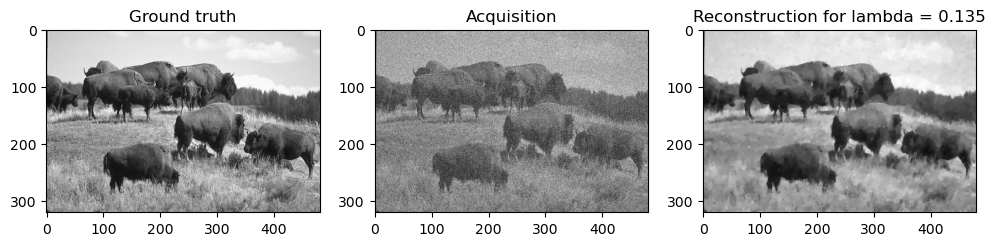

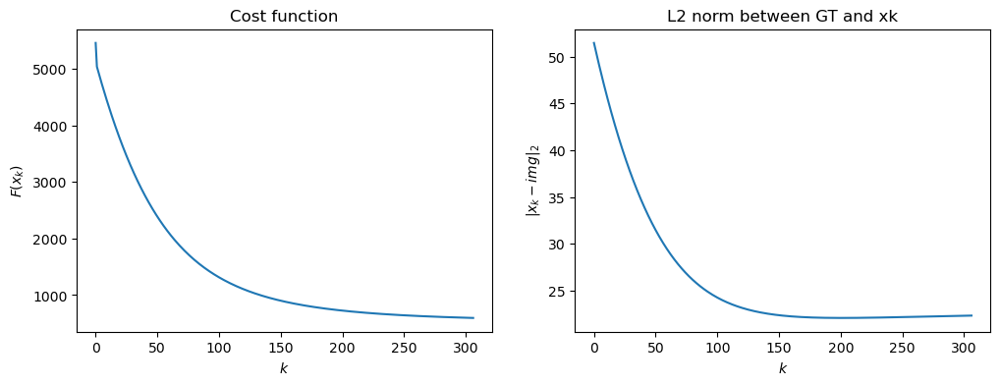

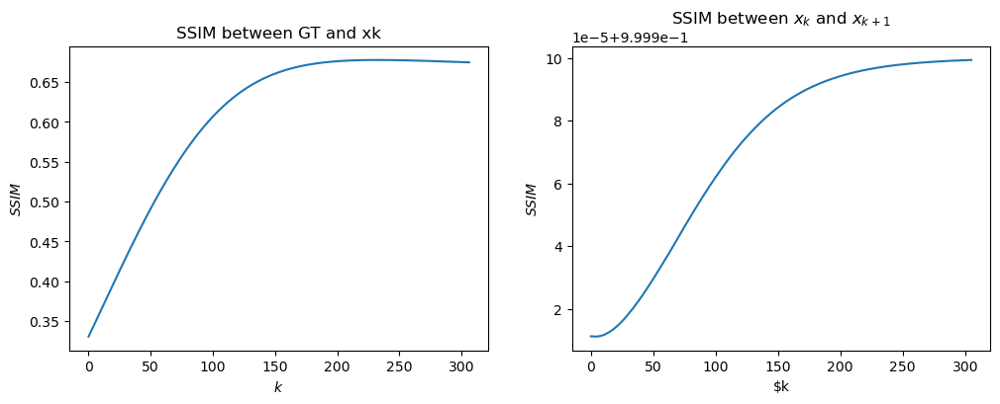

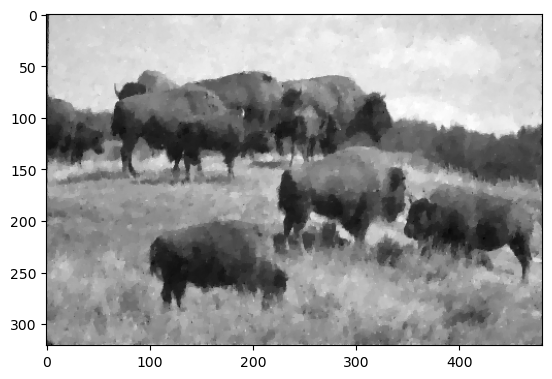

In [18]:
y = generateNoise(img,mode='gaussian',seed=43,var=0.02)
xk = runScript(img,y,lmbda = [0.135], SSIMstop = False, early_stopping = True)

plt.imshow(xk, cmap = 'gray')
plt.show()

In [19]:
skimage.metrics.structural_similarity(xk,img,data_range = 1)

0.6745411298882891

In [20]:
skimage.metrics.structural_similarity(reconstructedImage,img,data_range = 1)

0.7057598883867434